### ***1. Importing Needed Libraries:***




In [1]:
import numpy as np
import random
import math
from math import pi
import matplotlib.pyplot as plt
from PIL import Image

### ***2. System Map Initialization:***



In [2]:
X_mini = 0    
X_max = 100
Y_mini = 0
Y_max = 100

### ***3. System Initialization:*** 

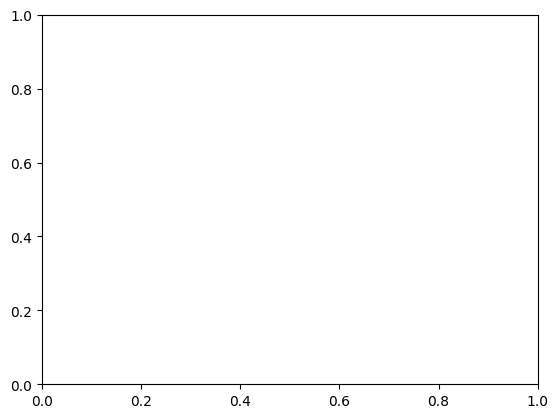

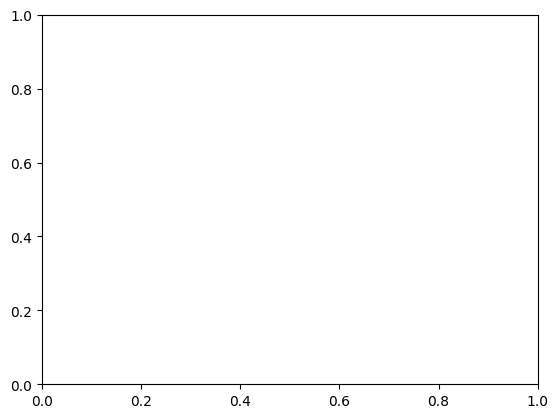

In [3]:
No_of_Towers = 12
No_of_Forbidden_Areas = 4
Spacing_Flag = 0
order = 0
T_X_pos = np.zeros(No_of_Towers)
T_Y_pos = np.zeros(No_of_Towers)
T_radius = np.ones(No_of_Towers)*8
F_radius = np.array([5,10,5,10])
#F_X_pos = np.zeros(No_of_Forbidden_Areas)
#F_Y_pos = np.zeros(No_of_Forbidden_Areas)
A_map = X_max*Y_max
#Forbidden Area's Parameters Randomization

##for i in range(0,No_of_Forbidden_Areas):
##  F_X_pos[i] = random.uniform(10,100)
##  F_Y_pos[i] = random.uniform(10,100)
F_X_pos = np.array([ 20 , 80 , 90 , 30 ])
F_Y_pos = np.array([ 20 , 40 , 80 , 70 ])
color_list =['blue','green', 'yellow' , 'black' , 'maroon' ,'gray' , 'indigo', 'orange' , 'purple', 'pink' ,'brown'] 
Tower_Order = []
RedZones_Order = []
for i in range (0 ,No_of_Towers):
    Tower_Order.append(i)
for i in range (0 ,No_of_Forbidden_Areas):
    RedZones_Order.append(i)
map_fig, map_axes = plt.subplots()
obj_fig, obj_axes = plt.subplots()

### ***4. Functions Definitions:***


In [4]:
def get_Towers_Area(T_radius):
  A_total = 0
  for i in  range(0,No_of_Towers):
    At = np.pi*pow(T_radius[i],2)
    A_total = At + A_total
  return A_total

def get_forbidden_zones_area(F_radius):
  Af_total = 0
 #Get the Areas Of The Forbidden Areas:
  for i in range(0,No_of_Forbidden_Areas):
    Af = pi*pow(F_radius[i],2)
    Af_total = Af + Af_total
  return Af_total

def get_Specified_Intersected_Area(X_Pos_1 ,Y_Pos_1 ,X_Pos_2 , Y_Pos_2 , Radius_1 , Radius_2):
  centre_distance = np.sqrt(pow(X_Pos_1-X_Pos_2, 2)+pow(Y_Pos_1-Y_Pos_2, 2))
  if (centre_distance > Radius_1 + Radius_2):
    intersected_area = 0
  elif (centre_distance <= abs(Radius_1 - Radius_2)):
      if (Radius_1 >= Radius_2):
          intersected_area = np.pi*pow(Radius_2, 2)
      else: # self.r < other.r
          intersected_area = np.pi*pow(Radius_1, 2)
  else:
    alpha = np.arccos(((Radius_1 * Radius_1) + (centre_distance * centre_distance) - (Radius_2 * Radius_2)) / (2 * Radius_1 * centre_distance)) * 2# 2.0*np.arccos(pow(Radius_1, 2)+pow(centre_distance, 2)-pow(Radius_2, 2)/(2.0* Radius_1*centre_distance))
    Beta  = np.arccos(((Radius_2 * Radius_2) + (centre_distance * centre_distance) - (Radius_1 * Radius_1)) / (2 * Radius_2 * centre_distance)) * 2                                                                                                                                  #2.0*np.arccos(pow(Radius_2, 2)+pow(centre_distance, 2)-pow(Radius_1, 2)/(2.0*Radius_2*centre_distance))
    a1 = 0.5*pow(Radius_2, 2)*(Beta-np.sin(Beta ))
    a2 = 0.5*pow(Radius_1, 2)*(alpha -np.sin(alpha))
    intersected_area = np.floor(a1+a2)
  return intersected_area  

def get_Intersected_Area(T_X_Pos,T_Y_Pos):
  Total_Intersection_Area = 0
  for X , Y  in zip(T_X_Pos , T_Y_Pos):
     Total_Intersection_Area +=get_Specified_Intersected_Area(T_X_Pos[X],T_Y_Pos[Y])     
  return Total_Intersection_Area

def get_Towers_Spacing(X_Pos_1 ,Y_Pos_1 ,X_Pos_2 , Y_Pos_2 ):
  Towers_Spacing = np.sqrt(pow(X_Pos_1-X_Pos_2, 2)+pow(Y_Pos_1-Y_Pos_2, 2))
  return Towers_Spacing

def get_order(X_Pos , Y_Pos):
  List = [X_Pos , Y_Pos]
  order = Members_List.index(List)
  return order
# objective function
def get_members_fitness(T_X_poss , T_Y_poss ):
  covered_area   = 0
  towers_spacing = 0
  # towers:
  covered_area = get_Towers_Area(T_radius) + get_forbidden_zones_area(F_radius)
  for i in range(0, No_of_Towers-1):   
        for j in range(i, No_of_Towers):
          if (i == j):
              covered_area = covered_area
          else:
            covered_area -=  get_Specified_Intersected_Area(T_X_poss[i],T_Y_poss[i],T_X_poss[j],T_Y_poss[j],T_radius[i],T_radius[j])
            towers_spacing += get_Towers_Spacing(T_X_poss[i],T_X_poss[j],T_Y_poss[i],T_Y_poss[j])

  # RedZones:
  covered_area += get_forbidden_zones_area(F_radius)
  for i in range(0,No_of_Forbidden_Areas-1):
      for j in range(i+1,No_of_Forbidden_Areas):
          covered_area -= get_Specified_Intersected_Area(F_X_pos[i],F_X_pos[j],F_Y_pos[i],F_Y_pos[j],F_radius[i],F_radius[j])

  objective_value = pow(covered_area,1) # + pow(towers_spacing ,2)

  return objective_value

def feasibility_check(X_Pos , Y_Pos , Radius  ):
 RedZone_flag = 0
 Spacing_flag = 0
 counterr = 0
 order = get_order(X_Pos , Y_Pos) 
 epslon = 3
 Tower_order = 0
 
 for RedZone in RedZones_Order:
    if(get_Specified_Intersected_Area(X_Pos,Y_Pos ,F_X_pos[RedZone],F_Y_pos[RedZone],Radius,F_radius[RedZone]) > 0):
       RedZone_flag = 1 
       break
 initial_Order =  int (order/No_of_Towers)
 for member in range (initial_Order*No_of_Towers  , initial_Order*No_of_Towers + No_of_Towers  ):
        Tower_order = get_order(Members_List[member][0],Members_List[member][1])
        if ( Tower_order == order ):
            Spacing_flag = 0
        else:  
            if( get_Specified_Intersected_Area(X_Pos,Y_Pos ,Members_List[member][0],Members_List[member][1],Radius,T_radius[0]) < 5 ):
              Spacing_flag = 1
      
            elif(get_Specified_Intersected_Area(X_Pos,Y_Pos ,Members_List[member][0],Members_List[member][1],Radius,T_radius[0]) == 0 ):
               Spacing_flag = 0
              
            else:
               Spacing_flag = 2  

               break 
        
 #if    X_Pos < Radius or  X_Pos > X_max - Radius      : Check = False
 #elif  Y_Pos < Radius or  Y_Pos > Y_max - Radius      : Check = False
 if  RedZone_flag !=0                                 : Check = False
 elif  Spacing_flag ==2                               : Check = False
 else                                                 : Check = True
 return Check
def Crossover_feasibility_check(X_poss ,Y_poss ,Radius):
 RedZone_flag = 0 
 print("X_poss:" , X_poss)
 print("Y_poss:" , Y_poss)
 for RedZone in RedZones_Order:
    if(get_Specified_Intersected_Area(X_poss,Y_poss ,F_X_pos[RedZone],F_Y_pos[RedZone],Radius,F_radius[RedZone]) > 0):
       RedZone_flag = 1 
       break
 if  RedZone_flag !=0                                 : Check = False
 else                                                 : Check = True
 return Check
def get_Members_index(Member_Tag,Objective_Function_Array):
  Best_Fitness_Value  = max(Objective_Function_Array)
  Worst_Fitness_Value = min(Objective_Function_Array)
  if (Member_Tag == "Elite"):
      for i in range (0 ,No_of_Members):
          if (Objective_Function_Array[i] == Best_Fitness_Value ):
              return  i
              break
  if  (Member_Tag == "Mutant"):
        for i in range (0 ,No_of_Members):
          if (Objective_Function_Array[i] == Worst_Fitness_Value ):
              return  i
              break

def get_Member(Index):
  Member= []
  for j in range(No_of_Towers*Index ,No_of_Towers*Index + No_of_Towers ):
      Member.append(Members_List[j])
  return Member

def Validate_Coordinates_Constrain():

  for member , Tower_no in zip(Members_List , Tower_Order):
    if  member[0] < 0 :
        Members_List[Tower_no][0] = 0
    elif member[0] > X_max - T_radius[Tower_no] :
         Members_List[Tower_no][0] = X_max - T_radius[Tower_no]
    if  member[1] < 0 :
       Members_List[Tower_no][1] = 0
    elif  member[1] > Y_max - T_radius[Tower_no]:
       Members_List[Tower_no][1] = Y_max - T_radius[Tower_no]


### ***5. Genetic Algorithm (GA) Initialization and Approach :***

### *5.1 Algorithm's Parameters Initalization :*

---



In [5]:
No_of_Generations = 300
No_of_Members = 3
Elite_Percentage = 1/3
Mutation_Percentage = 1/3
Generation_Counter = 0 
X_Coordinates_List =[]
Y_Coordinates_List =[]
X_Coordinates = []
Y_Coordinates =[]
Members_List=[]
Objective_Function_Values = []
Elite_Member = []
Mutant_Member =[]
Crossover_Offsprings_List =[]

### *5.2. Genetic Algorithm Specified Functions:*

In [6]:
def Generate_First_Gen():
  for j in range(0,No_of_Members):
    for i in range(0,No_of_Towers):
        Members_Parameters_list =list()
        T_X_pos[i] = random.randint(T_radius[i],X_max - T_radius[0])
        T_Y_pos[i] = random.randint(T_radius[i],Y_max - T_radius[0])
        Members_Parameters_list.append(T_X_pos[i])
        Members_Parameters_list.append(T_Y_pos[i])
        Members_List.append(Members_Parameters_list)
  
  #for i in range (0, No_of_Members):
  #  for j in range (0, No_of_Towers):
  #    member = Members_List[No_of_Towers*i+j]
  #    while (feasibility_check(member[0],member[1],T_radius[0]) == False):
  #        member_order = get_order(member[0],member[1])         
  #        member[0] = random.randint(T_radius[0],X_max - T_radius[0])
  #        member[1] = random.randint(T_radius[0],Y_max - T_radius[0]) 
  #        Members_List[member_order][0] =  member[0]
  #        Members_List[member_order][1] =  member[1]
  Validate_Coordinates_Constrain()       
  return Members_List

def Automatic_Cross_Over():
  OffSpring_1 = []
  OffSpring_2 = []
  Crossover_Offsprings_List =[]
  Counter = 0 
  previous_No_1 = -1
  previous_No_2 = -1
  Beta = 0.3 
  for j in range(0,No_of_Members):
    Parent_No_1 = random.randint(0,No_of_Members-1) 
    Parent_No_2 = random.randint(0,No_of_Members-1)
    OffSpring_1.clear()
    OffSpring_1.clear()
    #Crossover_Offsprings_List.clear() 
    while ((Parent_No_1 == Parent_No_2) or ((Parent_No_1 == previous_No_1) and (Parent_No_2 == previous_No_2))):
      Parent_No_1 = random.randint(0,No_of_Members-1)
    previous_No_1 = Parent_No_1
    Previous_No_2 = Parent_No_2
    Cross_Over_Parent_1 = get_Member(Parent_No_1)
    Cross_Over_Parent_2 = get_Member(Parent_No_2)
    parent_1 = np.array(Cross_Over_Parent_1)
    parent_2 = np.array(Cross_Over_Parent_2)
    for i in range(0,No_of_Towers):
      OffSpring_1.append([parent_1[i][0]*Beta + parent_2[i][0]*(1-Beta),parent_1[i][1]*Beta + parent_2[i][1]*(1-Beta)])  
      OffSpring_2.append([parent_2[i][0]*Beta + parent_1[i][0]*(1-Beta),parent_2[i][1]*Beta + parent_1[i][1]*(1-Beta)])
    while( Counter < No_of_Members-(No_of_Members*Elite_Percentage + No_of_Members*Mutation_Percentage)):
      Crossover_Offsprings_List.append(OffSpring_1)
      Counter += 1
      if (Counter !=No_of_Members-(No_of_Members*Elite_Percentage + No_of_Members*Mutation_Percentage)):
        Crossover_Offsprings_List.append(OffSpring_2)
        Counter += 1
  Crossover_Offsprings_List = Crossover_Offsprings_List[0]
  return Crossover_Offsprings_List

def Mutation( Mutant_Member):
  for i in range(0,No_of_Towers):
    for j in range(0,2): 
      Mutant_Member[i][j] += random.random() *25 -10

  for member in Mutant_Member:  
    while (feasibility_check(member[0],member[1],T_radius[0]) == False):
          member_order = get_order(member[0],member[1])         
          member[0] = random.randint(T_radius[0],X_max - T_radius[0])
          member[1] = random.randint(T_radius[0],Y_max - T_radius[0]) 
          Members_List[member_order][0] =  member[0]
          Members_List[member_order][1] =  member[1]
  Validate_Coordinates_Constrain()  
  return Mutant_Member

def Calculate_Generation_Fitness():
  X_Coordinates_List.clear()
  Y_Coordinates_List.clear()
  for i in range(0,No_of_Members*No_of_Towers):
          X_Coordinates_List.append(Members_List[i][0])
  for i in range(0,No_of_Members*No_of_Towers):
          Y_Coordinates_List.append(Members_List[i][1]) 
  Objective_Function_Values.clear()
  for i in range (0,No_of_Members*No_of_Towers,No_of_Towers): 
      X_Coordinates.clear()
      Y_Coordinates.clear()
      for j in range (0,No_of_Towers): 
        X_Coordinates.append(X_Coordinates_List[i+j])
        Y_Coordinates.append(Y_Coordinates_List[i+j])
      Objective_Function_Values.append(get_members_fitness(X_Coordinates,Y_Coordinates))
  return Objective_Function_Values    

def Get_Elite_member():
  Elite_Member.clear()  
  Elite_Member_Index  = get_Members_index ("Elite" ,Objective_Function_Values) 
  Elite_member = get_Member(Elite_Member_Index)
  return Elite_member

def Get_Mutant_member():
  Mutant_Member.clear() 
  Mutant_Member_Index = get_Members_index ("Mutant",Objective_Function_Values) 
  Mutant_member = get_Member(Mutant_Member_Index)
  return Mutant_member

def Generate_Next_Gen(Crossover_Offsprings_List,Elite_Member,Mutant_Member):
  Members_List.clear()
  for i in range(0,No_of_Members-2):
    for j in range(0,No_of_Towers):
      Members_List.append(Crossover_Offsprings_List[j])  
  for i in range(0,No_of_Towers):
    Members_List.append(Elite_Member[i])
  for i in range(0,No_of_Towers):
    Members_List.append(Mutant_Member[i])
  for i in range (0, No_of_Members):
    for j in range (0, No_of_Towers):
      member = Members_List[No_of_Towers*i+j]
      while (feasibility_check(member[0],member[1],T_radius[0]) == False):
          member_order = get_order(member[0],member[1])         
          member[0] = random.randint(T_radius[0],X_max - T_radius[0])
          member[1] = random.randint(T_radius[0],Y_max - T_radius[0]) 
          Members_List[member_order][0] =  member[0]
          Members_List[member_order][1] =  member[1]
            
  return Members_List

def Visualize_Solution(Members_List):
  fig = plt.gcf()
  axes = fig.gca()
  axes.cla()
  axes.set_xlim((0, X_max))
  axes.set_ylim((0, Y_max))
  axes.set_aspect(1)
  for tower in Members_List :
    axes.add_artist(plt.Circle((tower[0], tower[1]), T_radius[0],facecolor='blue', edgecolor='black'))
  for i in range(0,No_of_Forbidden_Areas):
    axes.add_artist(plt.Circle((F_X_pos[i], F_Y_pos[i]),F_radius[i], color='r'))
  plt.title('Visualization Map')
  plt.ylabel("Y Coordinate")
  plt.xlabel("X Coordinate")
  plt.show()
  #fig.savefig('Visualization Map.png')

def visualize_objFunc(values):
  obj_axes.plot(values, 'g')
  plt.title('Objective Function')
  obj_fig.savefig('Objective Function.png')
  #plt.show()

### *5.2.2. Genetic Algorithm Approach*

Generation  1 : [[40.0, 15.0], [81.0, 21.0], [80.0, 9.0], [48.0, 15.0], [87.0, 56.0], [66.0, 30.0], [17.0, 37.0], [27.0, 82.0], [22.0, 90.0], [18.0, 34.0], [22.0, 57.0], [61.0, 25.0], [29.0, 91.0], [83.0, 60.0], [20.0, 88.0], [75.0, 70.0], [87.0, 39.0], [20.0, 10.0], [85.0, 52.0], [25.0, 82.0], [57.0, 80.0], [91.0, 49.0], [46.0, 68.0], [80.0, 14.0], [18.0, 57.0], [84.0, 78.0], [51.0, 26.0], [41.0, 88.0], [15.0, 56.0], [67.0, 58.0], [70.0, 21.0], [57.0, 87.0], [34.0, 63.0], [83.0, 59.0], [41.0, 55.0], [52.0, 9.0]]
Generation  1  Objective Function : [3577.5394847518573, 3527.5394847518573, 3789.5394847518573]
--------------------------------------------------------------------------------------------------------------------------------------


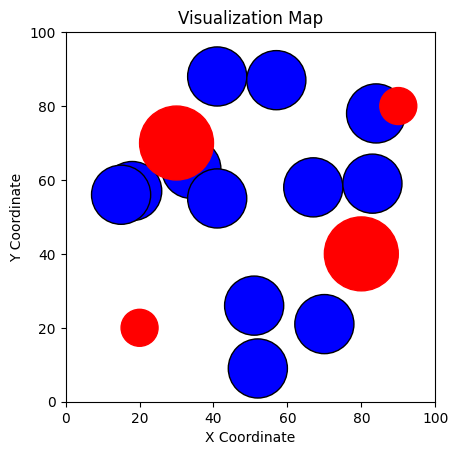

--------------------------------------------------------------------------------------------------------------------------------------
Generation  2 : [[61, 87], [52, 71], [89, 20], [76, 66], [56, 49], [77, 91], [52, 30], [12, 50], [19, 88], [39.9, 38.5], [9, 9], [66.69999999999999, 21.7], [23, 89], [30, 36], [51.0, 26.0], [41.0, 88.0], [15.0, 56.0], [67.0, 58.0], [70.0, 21.0], [57.0, 87.0], [72, 85], [83.0, 59.0], [41.0, 55.0], [52.0, 9.0], [65, 50], [36, 20], [54, 17], [14, 37], [38, 36], [11, 59], [71, 20], [28.986645549809744, 93.9423553603294], [70.71495362046595, 88.55166993148053], [44, 81], [46.95731575082221, 61.12366547913396], [86.53900486555168, 14.254329733023424]]
Generation  2  Objective Function : [3979.5394847518573, 3980.5394847518573, 3983.5394847518573]
--------------------------------------------------------------------------------------------------------------------------------------


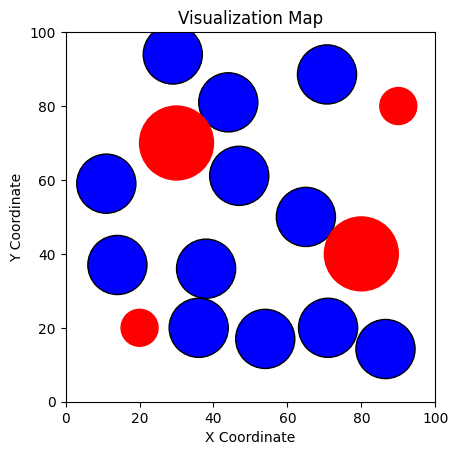

--------------------------------------------------------------------------------------------------------------------------------------
Generation  3 : [[34.4, 88.39999999999999], [39, 25], [92, 23], [11, 32], [49, 42], [70.0, 67.89999999999999], [71, 85], [11, 75], [56.1, 85.89999999999999], [54, 62], [31.4, 41.2], [56.41, 12.809999999999999], [65, 50], [36, 20], [54, 17], [14, 37], [38, 36], [11, 59], [71, 20], [28.986645549809744, 93.9423553603294], [70.71495362046595, 88.55166993148053], [44, 81], [46.95731575082221, 61.12366547913396], [86.53900486555168, 14.254329733023424], [63, 82], [52.99266363297072, 63.42198333534146], [91.8859102393454, 14.017199049267003], [40, 19], [69.92464165389705, 59.5050574521849], [85.2610042847295, 92.0], [52, 34], [11.942010582035543, 50.328638559476445], [18.934317147971804, 92.0], [33.02698965573294, 42.12425183350541], [0.5060860029003393, 2.11590814538234], [60, 15]]
Generation  3  Objective Function : [3979.5394847518573, 3983.5394847518573, 3

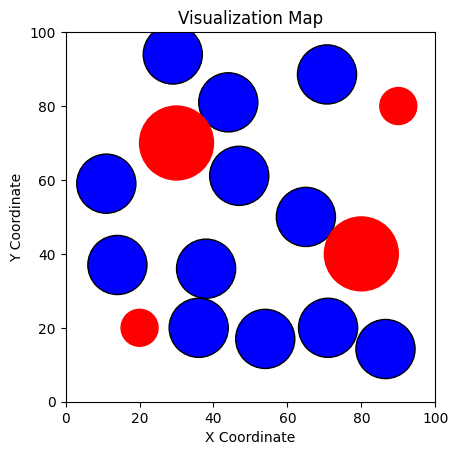

--------------------------------------------------------------------------------------------------------------------------------------
Generation  4 : [[26, 39], [13, 80], [48, 16], [32.2, 24.4], [60.34724915772794, 52.453540216529426], [62.98270299931064, 82.1], [57.7, 29.799999999999997], [14, 50], [34.468508089720046, 90.96550097944416], [51, 65], [83, 67], [67.9617014596655, 14.776298919907028], [65, 50], [36, 20], [54, 17], [14, 37], [38, 36], [11, 59], [71, 20], [28.986645549809744, 93.9423553603294], [70.71495362046595, 88.55166993148053], [44, 81], [46.95731575082221, 61.12366547913396], [86.53900486555168, 14.254329733023424], [39.114419487813095, 88.078096382981], [21, 51], [92.0, 25.72128291135161], [6.94243969237469, 39.50297667538425], [23, 92], [37, 10], [84.05808668196612, 92.0], [11.480125968004698, 78.89984462791735], [65.0990882830094, 91.93640209903265], [54.6935861831625, 54.28320477690175], [45.41435433957977, 37.59376613029988], [52.26207850958294, 18.364843179950

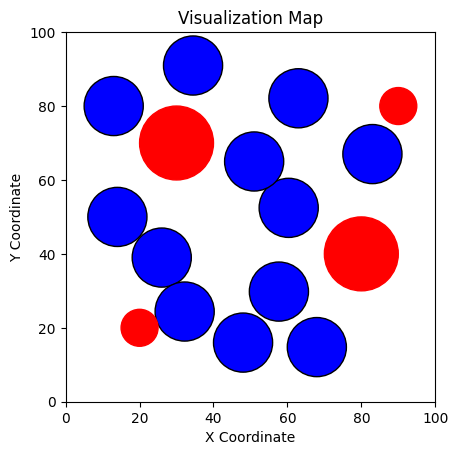

--------------------------------------------------------------------------------------------------------------------------------------
Generation  5 : [[80, 21], [27.299999999999997, 50.099999999999994], [36, 33], [15.959707784662282, 34.55208367276897], [14, 59], [92, 62], [74.74066067737627, 71.3], [11.036088177603288, 82.52989123954214], [51.86936179810657, 78.75548146932286], [55.08551032821374, 63.19824334383122], [56.09004803770584, 47.015636291209915], [58.783454956708056, 19.455390225965274], [77.90977709613907, 92.0], [51.49484836465416, 49.867087854010315], [80, 14], [45.79749263096869, 34.494604245999945], [92.0, 3.448556935722836], [10, 53], [59.330074925454845, 25.350964998116662], [22.077096721502347, 92.0], [19.935967674623626, 39.625130299870555], [55.81276741149294, 88.39226426256533], [81.4565236647929, 66.19451691289665], [32, 11], [77.90977709613907, 92.0], [51.49484836465416, 49.867087854010315], [80, 14], [45.79749263096869, 34.494604245999945], [92.0, 3.448556935

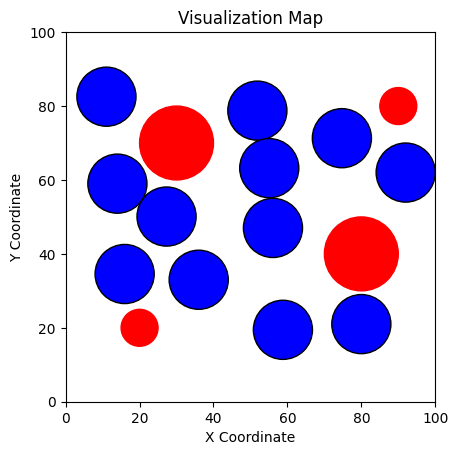

--------------------------------------------------------------------------------------------------------------------------------------
Generation  6 : [[77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [62, 47], [74.93361969908216, 90.27286743147337], [62, 81], [45.11589484394379, 19.688008923481004], [77, 70], [20.433574685437325, 41.77692192041381], [85, 8], [13, 84], [40.6989346956248, 92.0], [92, 66], [35.75557539079725, 45.62315927874309], [65.23426970342474, 5.55167712599833], [62, 47], [74.93361969908216, 90.27286743147337], [62, 81], [45.11589484394379, 19.688008923481004], [77, 70], [20.433574685437325, 41.77692192

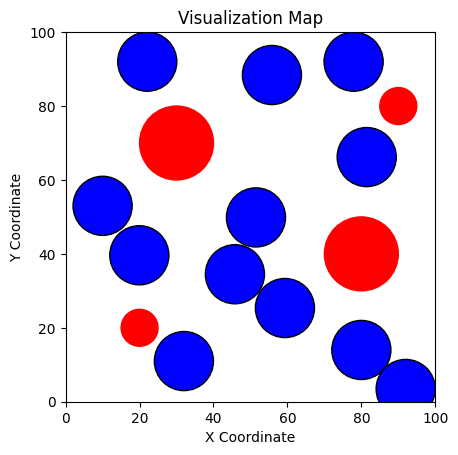

--------------------------------------------------------------------------------------------------------------------------------------
Generation  7 : [[62.0, 47.0], [74.93361969908216, 90.27286743147337], [62.0, 81.0], [45.11589484394379, 19.688008923481004], [77.0, 70.0], [20.433574685437325, 41.77692192041381], [85.0, 8.0], [13.0, 84.0], [40.6989346956248, 91.99999999999999], [91.99999999999999, 66.0], [35.75557539079725, 45.62315927874309], [65.23426970342474, 5.55167712599833], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [62, 21], [75.00992154296343, 98.10262791584728], [64.45573034547449, 72.88302091060163], [37

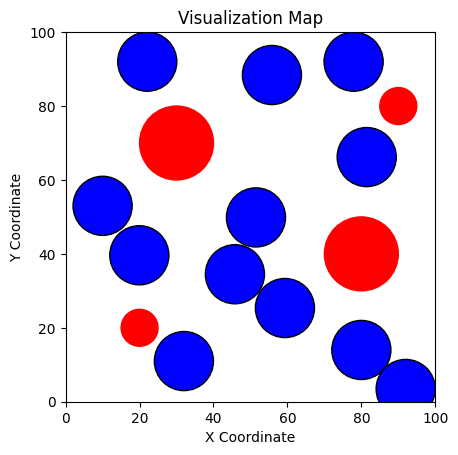

--------------------------------------------------------------------------------------------------------------------------------------
Generation  8 : [[53, 87], [68, 27], [67.4, 60.9], [45.32037418005126, 24.129987520236686], [13, 31], [17.303502279806125, 45.143845344289666], [77.29902247763644, 13.205289499434997], [15.723129016450702, 86.39999999999999], [91, 22], [40, 8], [49.465859872995935, 51.79456656898915], [55.26398879239732, 7.1861739881988305], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [60, 30], [51, 63], [59.472008079816916, 92.0], [38.0706663057471, 19.836644839450546], [56, 14], [24.001165582796254, 

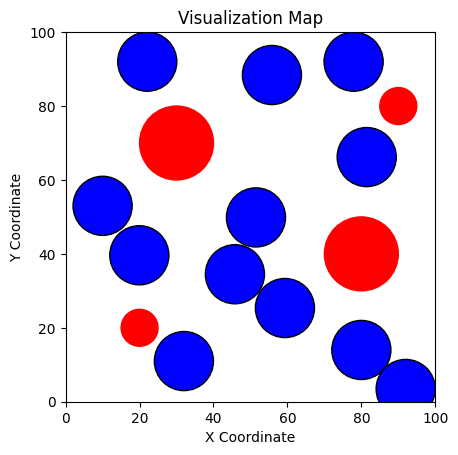

--------------------------------------------------------------------------------------------------------------------------------------
Generation  9 : [[60.47293312884172, 88.5], [12, 72], [87, 12], [40, 52], [34, 13], [15.112451595864286, 47.50069174100276], [76, 68], [17.629319327966193, 88.07999999999998], [92, 26], [44.74383022344789, 32.1176792787696], [59.063059010535014, 56.11455167216138], [48.28479215467812, 8.33032179173918], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [44.36141060647795, 92.0], [49, 53], [77, 72], [55, 81], [6.841858948532229, 25.644498923488005], [23.85985061143588, 48.495676827617686], [7

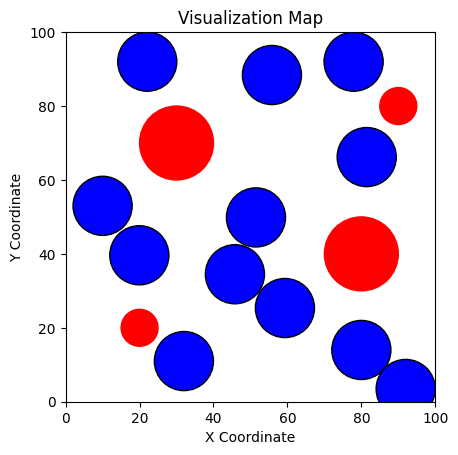

--------------------------------------------------------------------------------------------------------------------------------------
Generation  10 : [[54.42592055337629, 91.99999999999999], [49.74845450939625, 52.060126356203085], [11, 8], [52.23924778929061, 67.04838127379998], [33, 91], [19.701895428005116, 49.84697377933237], [72.31267086986622, 9.898766242121559], [17.57272344844991, 91.99999999999999], [50.08079030238708, 36.387539089961166], [86, 23], [68.28181188178267, 62.35462178956696], [42.01127788349249, 17.59708549612025], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [42, 83], [83, 66], [81, 12], [54.44

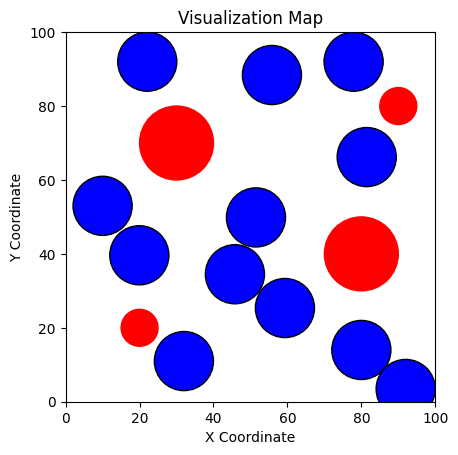

--------------------------------------------------------------------------------------------------------------------------------------
Generation  11 : [[67.13684396729734, 89.29999999999998], [38, 88], [10, 38], [52, 16], [82.39999999999999, 6.013989855005985], [9.7193689654431, 53.55484990259279], [55, 46], [18.678290129813398, 91.99999999999999], [41.555177372236535, 35.7878356487776], [52.773735171033884, 68.97561545158523], [72.88745016841062, 66.23838455908809], [36.0007840841698, 8.700254016783866], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [66.48904535851008, 92.0], [55.68511597791508, 52.15213450256023], [1

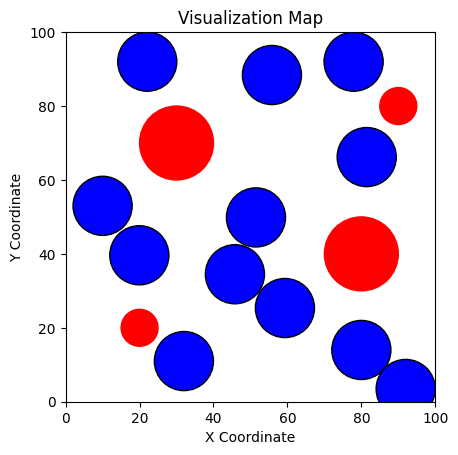

--------------------------------------------------------------------------------------------------------------------------------------
Generation  12 : [[69.91526487979877, 91.99999999999999], [89, 17], [31.7, 50.4], [52, 74], [59.79999999999999, 60.53456708071684], [8, 74], [63.588444229605386, 20.063724281980832], [23.979154820641547, 91.99999999999999], [43.788964244624, 35.70686421716432], [44.74383022344789, 58.717679278769594], [70.46897102903073, 71.26931230451878], [36.71666959861724, 10.507820714212492], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [51, 58], [68.66947167955854, 60.28136767133569], [8, 38], [13

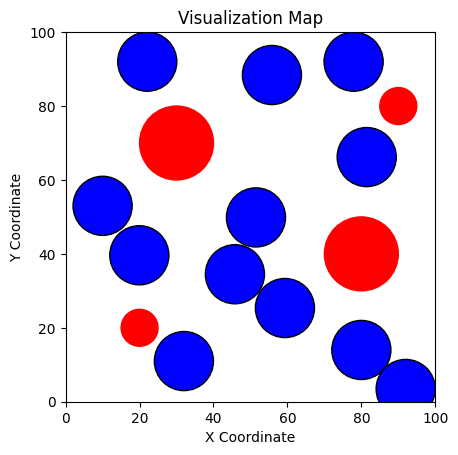

--------------------------------------------------------------------------------------------------------------------------------------
Generation  13 : [[68, 56], [12, 36], [49, 92], [73, 12], [56.066510715392255, 65.52959779797557], [54, 14], [10, 71], [25.979830223902994, 95.07293760265517], [44.12518828316978, 33.286283048853846], [41.45931541590714, 55.50419806668702], [69.52870926303919, 75.57240347832094], [37.62402511071462, 11.056560960873702], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [84.62345040984421, 92.0], [87.35213546961631, 8.224927616887463], [28, 52], [60, 54], [11, 41], [72, 13], [55.1517356709327

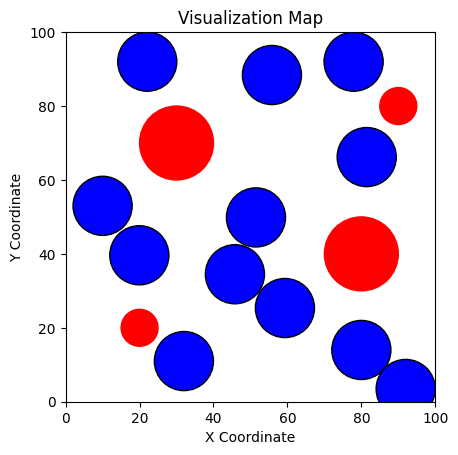

--------------------------------------------------------------------------------------------------------------------------------------
Generation  14 : [[51, 50], [62, 60], [60, 88], [90, 8], [24.519953214617676, 48.35887933939267], [66.6, 13.3], [8, 90], [32.70636410800617, 92.92188128079654], [38.74668564685868, 34.676835698292564], [8, 56], [76.63751406251328, 70.54248946049375], [33.959094970646646, 4.112112257139397], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [74.89532582967574, 61.98531249472813], [23, 33], [75, 84], [8, 34], [54.14126087012636, 77.9271273696666], [64, 11], [14, 8], [16, 56], [52.8047506366889

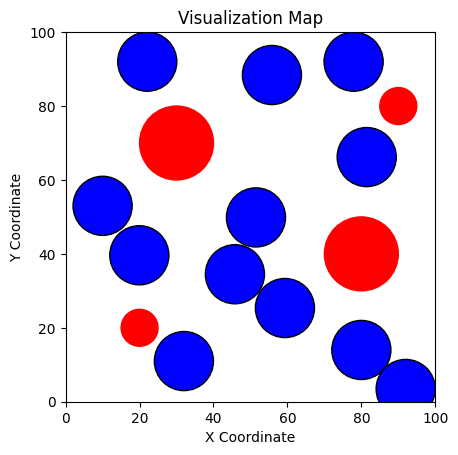

--------------------------------------------------------------------------------------------------------------------------------------
Generation  15 : [[69.83684396729734, 79.39999999999999], [38, 30], [10, 55], [59.05824484167808, 26.54622297219996], [71.75598596438529, 16.921653656823786], [12, 30], [43.93105244781838, 44.74567549868166], [25.26587693745349, 92.27656438423895], [25.579183066294142, 38.140641919397154], [11, 83], [80.010820784109, 67.49890867717576], [32.58772849119399, 8.933633677141819], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [46.44059605834214, 63.37955484940306], [42, 28], [73.5254513454930

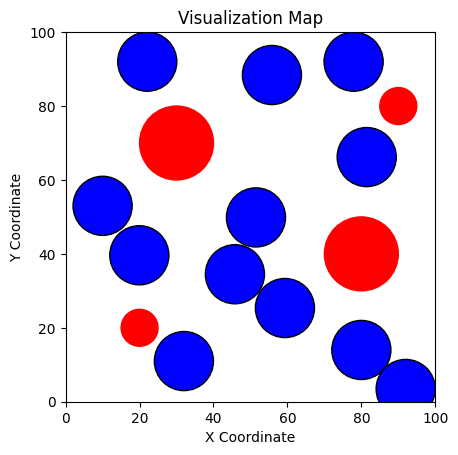

--------------------------------------------------------------------------------------------------------------------------------------
Generation  16 : [[12, 48], [84, 11], [54.467815941845124, 80.89999999999999], [61, 47], [10, 8], [55.01245607243868, 22.22227546700922], [71, 21], [31.372896016476545, 92.08296931527167], [32.70620556894502, 42.30825942088481], [9.6, 71.1], [73.81143115501017, 72.47198080994453], [40.154192303176984, 7.8610290764197135], [77.90977709613907, 91.99999999999999], [51.49484836465416, 49.86708785401031], [80.0, 14.0], [45.79749263096869, 34.494604245999945], [91.99999999999999, 3.448556935722836], [10.0, 52.99999999999999], [59.33007492545484, 25.350964998116662], [22.077096721502347, 91.99999999999999], [19.935967674623626, 39.62513029987055], [55.81276741149294, 88.39226426256533], [81.45652366479288, 66.19451691289663], [32.0, 11.0], [76.59283452936475, 79.81584614839825], [39, 14], [11.025226317239973, 47.28937678025186], [58.346055717731296, 36.4451747

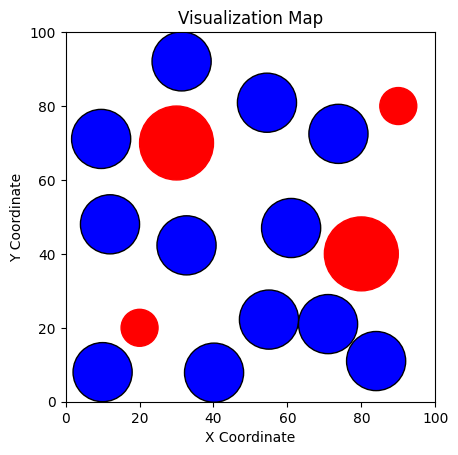

--------------------------------------------------------------------------------------------------------------------------------------
Generation  17 : [[83, 9], [87, 57], [62.12747115929159, 60.82999999999999], [56.439247789290604, 43.24838127379998], [8, 79], [41.508719250707074, 31.455592826906447], [67.49902247763644, 22.305289499435], [28.584156227984284, 92.05807852069016], [28.875134200648603, 41.50332068458053], [65, 84], [76.10495890794498, 70.58874164083015], [37.70793461222389, 8.802720353493799], [12, 48], [84, 11], [54.467815941845124, 80.89999999999999], [61, 47], [10, 8], [55.01245607243868, 22.22227546700922], [71, 21], [31.372896016476545, 92.0], [32.70620556894502, 42.30825942088481], [9.6, 71.1], [73.81143115501017, 72.47198080994453], [40.154192303176984, 7.8610290764197135], [25, 49], [50.28328644156231, 27.418287072189713], [1.09570620113087, 43.35186426676602], [38, 40], [86, 23], [70.0243391025005, 17.78318859881591], [53.868552961746545, 56.94388057479091], [13

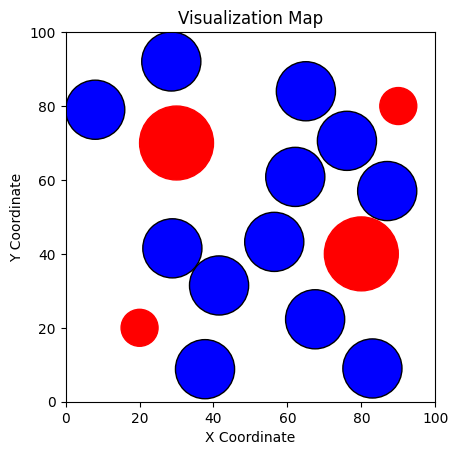

--------------------------------------------------------------------------------------------------------------------------------------
Generation  18 : [[22, 86], [9, 69], [48, 24], [82, 13], [60, 50], [64.61703737175034, 18.748232019171137], [43, 9], [33, 38], [49.627794281928345, 96.43101740027976], [87, 60], [65.47243090910932, 71.384536517876], [45.620573824862156, 80.10497190150812], [44, 11], [50.648221611169646, 54.566675504293], [89.12054017819678, 14.723053196231199], [58.323986225146314, 67.56752410716491], [16.64773758987987, 7.272391820147366], [18, 37], [8.748389820145071, 58.69177508095333], [41.33015928317507, 35.99251234382076], [23.068622073787253, 92.0], [66.17900053269902, 18.76966162649975], [72.63411166164049, 75.35933097457327], [69, 92], [44, 11], [50.648221611169646, 54.566675504293], [89.12054017819678, 14.723053196231199], [58.323986225146314, 67.56752410716491], [16.64773758987987, 7.272391820147366], [18, 37], [8.748389820145071, 58.69177508095333], [41.3301

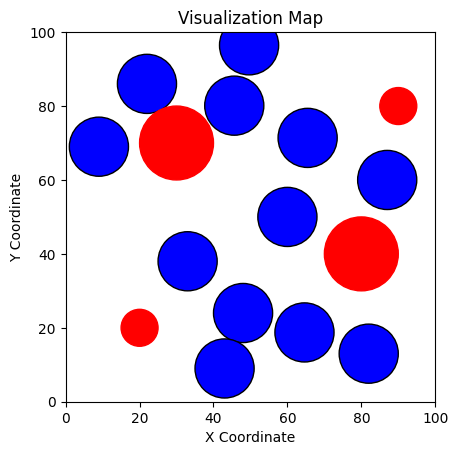

--------------------------------------------------------------------------------------------------------------------------------------
Generation  19 : [[82, 92], [49, 74], [12, 57], [65.42679035760241, 51.19726687501544], [89, 64], [47, 53], [19.02387287410155, 43.78424255666733], [38.83111149822255, 36.594758640674534], [31.036373736229578, 93.32930522008391], [77, 10], [70.48560743588114, 74.16689263756408], [61.986172147458646, 88.43149157045242], [22, 86], [9, 69], [48, 24], [82, 13], [60, 50], [64.61703737175034, 18.748232019171137], [43, 9], [33, 38], [21, 52], [87, 60], [65.47243090910932, 71.384536517876], [45.620573824862156, 80.10497190150812], [42, 44], [68, 62], [83, 67], [53, 66], [31.362793094889447, 2.5868875038436734], [13.956702276041753, 47.22314810490267], [6.551299398107776, 69.98146859467138], [55.70684069756115, 33.91587810219139], [32.138444279856365, 98.52630833756676], [63.21005795980355, 9.538964076011364], [69.7667668195501, 87.3856628511159], [59.1574879462

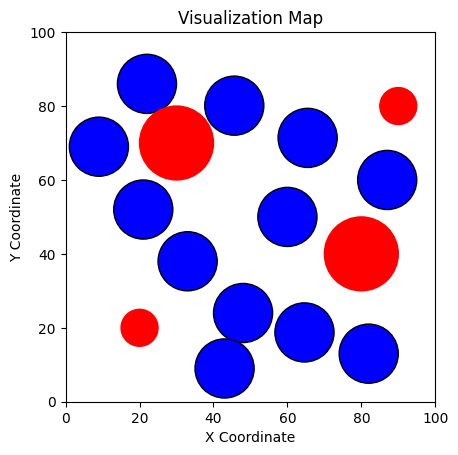

--------------------------------------------------------------------------------------------------------------------------------------
Generation  20 : [[67, 53], [86, 8], [34, 11], [50, 70], [12, 49], [55, 17], [9, 67], [39.812052209268344, 36.774763430657416], [86, 8], [51, 50], [66.76073168224156, 76.18487441784796], [49.68164806127311, 86.68830966667775], [22, 86], [9, 69], [48, 24], [82, 13], [60, 50], [64.61703737175034, 18.748232019171137], [43, 9], [33, 38], [21, 52], [87, 60], [65.47243090910932, 71.384536517876], [45.620573824862156, 80.10497190150812], [24, 91], [56, 75], [44, 17], [65.62135365056156, 51.165345349376416], [92, 19], [49.59665744469702, 49.66808677698384], [15.136592987690264, 41.06096546789361], [36.07108587373337, 30.24331792415088], [53, 34], [69.55102726939866, 20.07453463905908], [57, 90], [71.9373552625817, 79.5652175832632]]
Generation  20  Objective Function : [3782.4775549221104, 3983.5394847518573, 3979.5394847518573]
--------------------------------

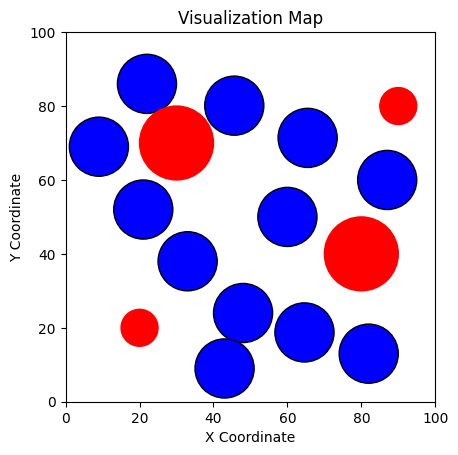

--------------------------------------------------------------------------------------------------------------------------------------
Generation  21 : [[36, 91], [48, 64], [41.0, 15.2], [60.93494755539309, 56.81574174456349], [84, 62], [51.217660211287914, 39.867660743888685], [13.295615091383183, 48.842675827525525], [37.19337577439386, 32.20275157610284], [13, 31], [63.98571908857905, 29.052174247341355], [73, 9], [65.26064310218912, 81.70214520828756], [22, 86], [9, 69], [48, 24], [82, 13], [60, 50], [64.61703737175034, 18.748232019171137], [43, 9], [33, 38], [21, 52], [87, 60], [65.47243090910932, 71.384536517876], [45.620573824862156, 80.10497190150812], [13, 47], [77.46713130659752, 11.58937091262985], [39, 30], [36, 10], [41, 52], [56.061178812781314, 28.00884884437581], [10, 72], [10, 9], [92.0, 0], [82, 67], [58.57368379115226, 72.11107160343211], [52.227460573058735, 92.0]]
Generation  21  Objective Function : [3979.5394847518573, 3983.5394847518573, 3983.5394847518573]
----

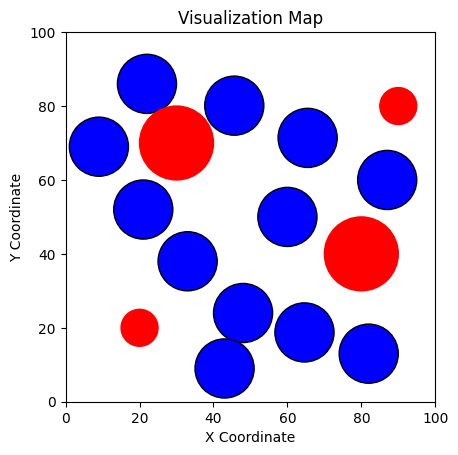

--------------------------------------------------------------------------------------------------------------------------------------
Generation  22 : [[26.199999999999996, 87.5], [13, 75], [12, 9], [69, 8], [82, 67], [60.597224223611605, 25.0840606365864], [34.088684527414955, 20.952802748257657], [34.25801273231816, 36.26082547283085], [18.599999999999998, 45.699999999999996], [9, 31], [67.73070163637652, 52.6691755625132], [51.51259460806024, 80.58412389354196], [22, 86], [9, 69], [48, 24], [82, 13], [60, 50], [64.61703737175034, 18.748232019171137], [43, 9], [33, 38], [21, 52], [87, 60], [65.47243090910932, 71.384536517876], [45.620573824862156, 80.10497190150812], [35.39482474131109, 92.0], [80, 90], [38.27043585157309, 10.55119175798561], [71.48628505209909, 62.929741665749674], [92.0, 55.30507367062451], [61.242358247013684, 47.9176584516339], [6.919435351669481, 41.20030381695486], [38.26774888077961, 27.623277005274762], [22.375160923409872, 44.80823078873426], [55.2226085983

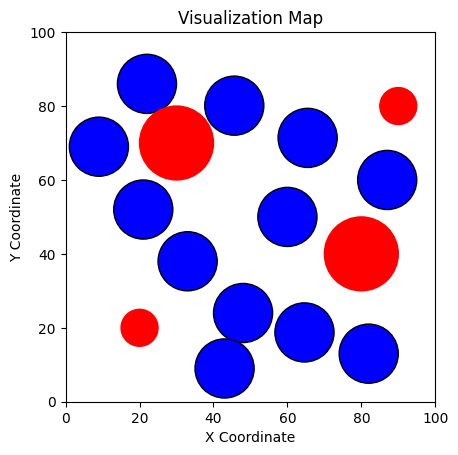

--------------------------------------------------------------------------------------------------------------------------------------
Generation  23 : [[58, 9], [65, 88], [79, 9], [57, 42], [48, 54], [63.60463363432934, 27.499059948909967], [44, 14], [34.58032466423388, 34.88698310158243], [21.41254827702296, 49.842469236620275], [11, 71], [71.10670067279192, 56.43017621336902], [50.95827951498701, 80.47012573778727], [22, 86], [9, 69], [48, 24], [82, 13], [60, 50], [64.61703737175034, 18.748232019171137], [43, 9], [33, 38], [21, 52], [87, 60], [65.47243090910932, 71.384536517876], [45.620573824862156, 80.10497190150812], [10, 84], [52, 48], [77, 92], [92, 25], [92, 25], [60.56496907123349, 17.562302794113265], [37.16811976032928, 11.701428344194918], [37.795102027407424, 35.9888730286407], [82, 59], [20.169435183107336, 44.519291596272296], [66.15082945121564, 65.42946942360317], [48.287348570448216, 84.16661112894188]]
Generation  23  Objective Function : [3976.5394847518573, 3983.5

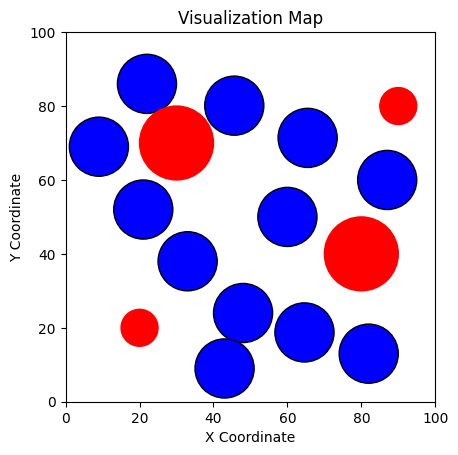

--------------------------------------------------------------------------------------------------------------------------------------
Generation  24 : [[76, 88], [72, 9], [15, 36], [17, 89], [61.19999999999999, 45.3], [62.69273426540058, 24.518032802470955], [41.950435928098784, 13.310428503258475], [35.54475787318594, 35.217550079699905], [39.588783793916065, 52.589728465634195], [13.7508305549322, 63.05578747888168], [69.61993930631903, 59.129964176439266], [50.15700023162537, 81.57907135513365], [22, 86], [9, 69], [48, 24], [82, 13], [60, 50], [64.61703737175034, 18.748232019171137], [43, 9], [33, 38], [21, 52], [87, 60], [65.47243090910932, 71.384536517876], [45.620573824862156, 80.10497190150812], [15.470712323116034, 90.48073139850266], [13, 43], [71.13293514188837, 97.80659907229061], [47, 75], [58, 60], [63.631098193047364, 29.22825767158331], [50.57140993104271, 10.767259421878983], [34.52650912708279, 45.89369723070653], [74, 13], [12.985998583017551, 58.801151394669425], [7

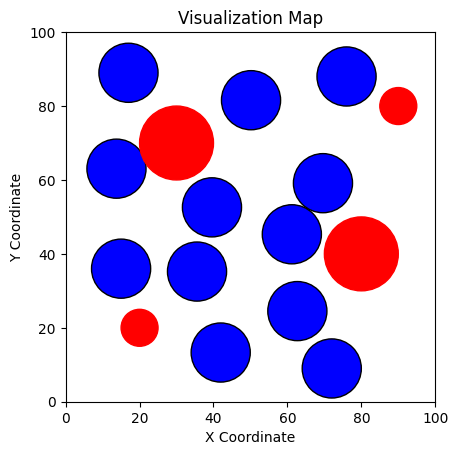

--------------------------------------------------------------------------------------------------------------------------------------
Generation  25 : [[71, 10], [90, 18], [88, 61], [56, 64], [72, 84], [62.97424344369462, 25.931100263204662], [44.53672812898196, 12.547477778844627], [35.23928324935499, 38.42039422500189], [49.91214865574125, 40.71280992594393], [13.521380963357805, 61.779396653618], [71.0618402531775, 62.111713617551914], [53.06155481510652, 81.92091631179005], [76, 88], [72, 9], [15, 36], [17, 89], [61.19999999999999, 45.3], [62.69273426540058, 24.518032802470955], [41.950435928098784, 13.310428503258475], [35.54475787318594, 35.217550079699905], [39.588783793916065, 52.589728465634195], [13.7508305549322, 63.05578747888168], [69.61993930631903, 59.129964176439266], [50.15700023162537, 81.57907135513365], [11.274009240219327, 82.5578900348613], [84, 19], [68.8048643644882, 102.06076689704499], [38.13841061205359, 88.11055035867909], [68.2211393788652, 57.053585859941

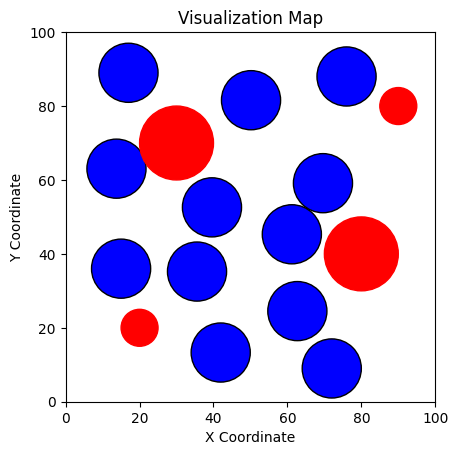

--------------------------------------------------------------------------------------------------------------------------------------
Generation  26 : [[63, 64], [75.6, 12.0], [11, 40], [23.341523183616076, 88.73316510760372], [29, 8], [71, 84], [47.19425758193742, 16.717410238029018], [88, 58], [47.83951717761572, 38.450414796992085], [92, 17], [61.033957514423314, 48.290974923507484], [55.38563723590818, 82.46283002523666], [76, 88], [72, 9], [15, 36], [17, 89], [61.19999999999999, 45.3], [62.69273426540058, 24.518032802470955], [41.950435928098784, 13.310428503258475], [35.54475787318594, 35.217550079699905], [39.588783793916065, 52.589728465634195], [13.7508305549322, 63.05578747888168], [69.61993930631903, 59.129964176439266], [50.15700023162537, 81.57907135513365], [15, 45], [42, 15], [24, 89], [69.93783331041573, 56.16668405617857], [82, 91], [54, 71], [57.88204726389026, 5.54329573553488], [43.444303979124584, 29.830995571175833], [49.64945598885375, 48.654499016705614], [4.21

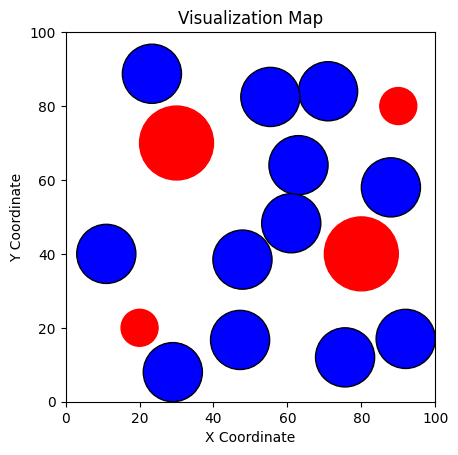

--------------------------------------------------------------------------------------------------------------------------------------
Generation  27 : [[78, 16], [13, 32], [37, 27], [9, 84], [89, 57], [59.099999999999994, 74.89999999999999], [54.675710359304404, 8.89553008628312], [79, 92], [49.10647434548234, 45.59327375079155], [10, 8], [71.7069228156189, 65.36962226753361], [63.16755926437996, 89.13884900757098], [63, 64], [75.6, 12.0], [11, 40], [23.341523183616076, 88.73316510760372], [29, 8], [71, 84], [47.19425758193742, 16.717410238029018], [88, 58], [47.83951717761572, 38.450414796992085], [92, 17], [61.033957514423314, 48.290974923507484], [55.38563723590818, 82.46283002523666], [9, 85], [43.817589881287056, 22.036357592558794], [24.7676599077666, 90.9114242429001], [89, 23], [83.73531823117959, 98.49805086601356], [55.73882749018475, 85.74976516716454], [66.70809253092136, 11.905304476136997], [33.71139755612759, 44.67024074348125], [45.67919625227954, 55.01473546270074], [

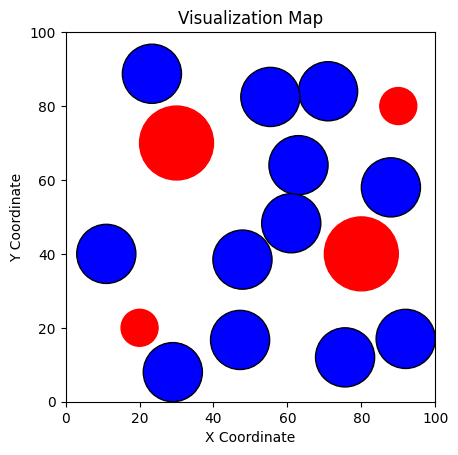

--------------------------------------------------------------------------------------------------------------------------------------
Generation  28 : [[49, 32], [34.572312916900934, 25.025450314791154], [8, 11], [78, 19], [39, 87], [56.74717924312932, 82.49483561701517], [63.09837787943627, 11.002372159180833], [88, 56], [75, 79], [15.6, 40.199999999999996], [30, 51], [58.15026777931398, 54.74165470227129], [63, 64], [75.6, 12.0], [11, 40], [23.341523183616076, 88.73316510760372], [29, 8], [71, 84], [47.19425758193742, 16.717410238029018], [88, 58], [47.83951717761572, 38.450414796992085], [92, 17], [61.033957514423314, 48.290974923507484], [55.38563723590818, 82.46283002523666], [71.24330893175156, 9.777631362438278], [23.29877294575247, 38.68073658802891], [78, 64], [3.094552668516349, 85.63359179081783], [40, 32], [88, 13], [47.2636905864045, 16.98270175506091], [46, 47], [61.7111719254851, 40.17239783997285], [49, 73], [62.4064061190992, 60.67729204319289], [74.5305103968495, 82.

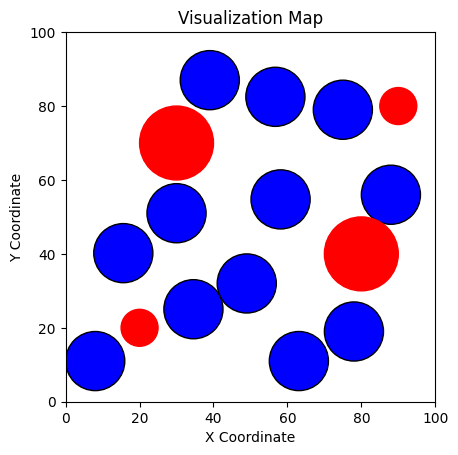

--------------------------------------------------------------------------------------------------------------------------------------
Generation  29 : [[82, 91], [42, 87], [8, 90], [4.566186867961444, 64.74351425357249], [31.6, 38.9], [74.19999999999999, 11.799999999999999], [54.08458341048315, 14.887891228542635], [35, 24], [17, 48], [11, 33], [12, 8], [59.371357277794644, 69.07103824865496], [18.733916593053884, 92.0], [62, 46], [42, 92], [0, 29.63522424710057], [23.05175526032081, 47.203009848316626], [58, 89], [62.34084109596134, 18.32310136603827], [69.22437431021078, 68.15113372657642], [10, 76], [38, 16], [55.078373583633166, 60.62646080466554], [33.75678755455054, 31.760972243901826], [18.733916593053884, 92.0], [62, 46], [42, 92], [0, 29.63522424710057], [23.05175526032081, 47.203009848316626], [58, 89], [62.34084109596134, 18.32310136603827], [69.22437431021078, 68.15113372657642], [10, 76], [38, 16], [55.078373583633166, 60.62646080466554], [33.75678755455054, 31.7609722439

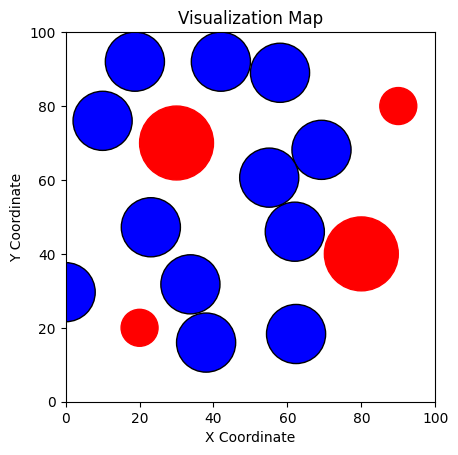

--------------------------------------------------------------------------------------------------------------------------------------
Generation  30 : [[18.733916593053884, 91.99999999999999], [62.0, 45.99999999999999], [42.0, 91.99999999999999], [0.0, 29.635224247100567], [23.05175526032081, 47.203009848316626], [57.99999999999999, 89.0], [62.34084109596134, 18.32310136603827], [69.22437431021078, 68.15113372657642], [10.0, 76.0], [38.0, 16.0], [55.078373583633166, 60.62646080466554], [33.75678755455054, 31.760972243901826], [18.733916593053884, 92.0], [62, 46], [42, 92], [0, 29.63522424710057], [23.05175526032081, 47.203009848316626], [58, 89], [62.34084109596134, 18.32310136603827], [69.22437431021078, 68.15113372657642], [10, 76], [38, 16], [55.078373583633166, 60.62646080466554], [33.75678755455054, 31.760972243901826], [82.10473499481174, 92.0], [44.02724243729242, 86.7988544213094], [14.457016559008892, 92.0], [36, 19], [62, 91], [73.00288360580795, 6.514584068075596], [53.9555

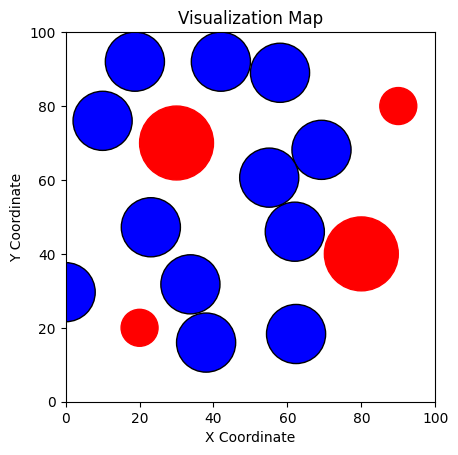

--------------------------------------------------------------------------------------------------------------------------------------
Generation  31 : [[87, 59], [73, 86], [51, 42], [2.6999999999999997, 31.544656972970394], [9, 90], [57.69999999999999, 89.3], [59.838588767172936, 15.526170956226787], [30, 89], [81, 22], [21, 43], [57.154861508543206, 65.23852256326587], [33.229751288185376, 29.432680570731275], [89.65289694002801, 22.591826125693963], [7.277365323214501, 51.65597720281855], [59, 14], [75, 57], [71.04075752765388, 92.0], [48.89272816005395, 92.0], [44, 12], [22.184474699207037, 92.0], [20, 35], [39.65548207778633, 47.25845699099451], [59.26571858559947, 72.1836519899168], [35.34557161571717, 25.232636891433035], [89.65289694002801, 22.591826125693963], [7.277365323214501, 51.65597720281855], [59, 14], [75, 57], [71.04075752765388, 92.0], [48.89272816005395, 92.0], [44, 12], [22.184474699207037, 92.0], [20, 35], [39.65548207778633, 47.25845699099451], [59.26571858559947

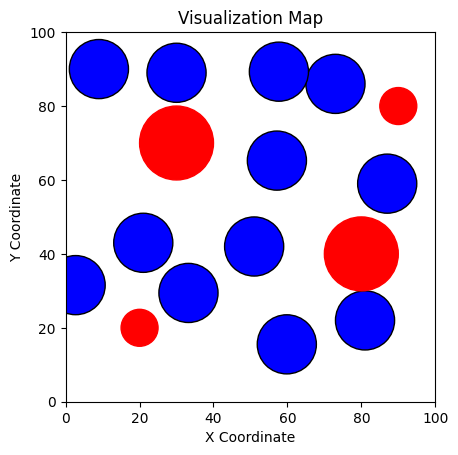

--------------------------------------------------------------------------------------------------------------------------------------
Generation  32 : [[46, 51], [10, 31], [81, 13], [9, 58], [74, 72], [55.05781844801617, 90.10999999999999], [34, 8], [27.65534240976211, 89.89999999999999], [62.699999999999996, 25.9], [26.596644623335898, 44.27753709729835], [57.78811863166008, 67.32206139126114], [33.86449738644491, 28.172667466941803], [87, 59], [73, 86], [51, 42], [2.6999999999999997, 31.544656972970394], [9, 90], [57.69999999999999, 89.3], [59.838588767172936, 15.526170956226787], [30, 89], [81, 22], [21, 43], [57.154861508543206, 65.23852256326587], [33.229751288185376, 29.432680570731275], [78, 84], [2.8499307205204625, 63.9847845547378], [58, 31], [86.35382079577894, 63.2963962843148], [76.02602164801176, 106.01577876235567], [84, 14], [36, 23], [37.13292121313745, 101.75812174116601], [14, 40], [61, 15], [56.13538942160617, 67.03973569510762], [32.716351543382395, 37.75598549875

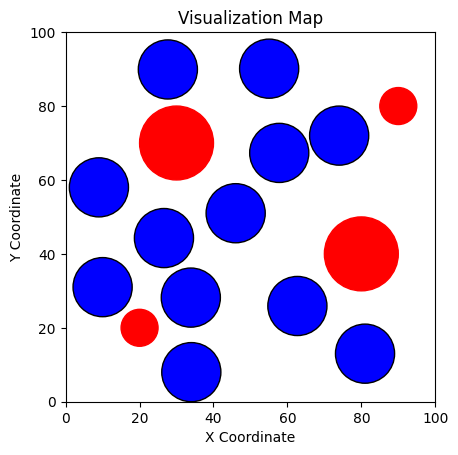

--------------------------------------------------------------------------------------------------------------------------------------
Generation  33 : [[86, 60], [4.994951504364323, 54.089349188316454], [19, 92], [50, 92], [75.41821515360823, 95.81104513364896], [62, 83], [35.4, 18.499999999999996], [34.28964757212485, 98.2006852188162], [16, 34], [50.678993387000766, 23.783261129189505], [56.63120818462234, 67.12443340395367], [33.060795296301144, 34.88099008921252], [46, 51], [10, 31], [81, 13], [9, 58], [74, 72], [55.05781844801617, 90.10999999999999], [34, 8], [27.65534240976211, 89.89999999999999], [62.699999999999996, 25.9], [26.596644623335898, 44.27753709729835], [57.78811863166008, 67.32206139126114], [33.86449738644491, 28.172667466941803], [53, 89], [-6.697997312299253, 65.54746819803613], [9, 12], [12, 60], [90.74146035558938, 115.60334672585101], [90.09492625752013, 24.776961975754052], [79, 89], [51.958411977824966, 108.39686064436492], [6.823270663204563, 35.35357708869

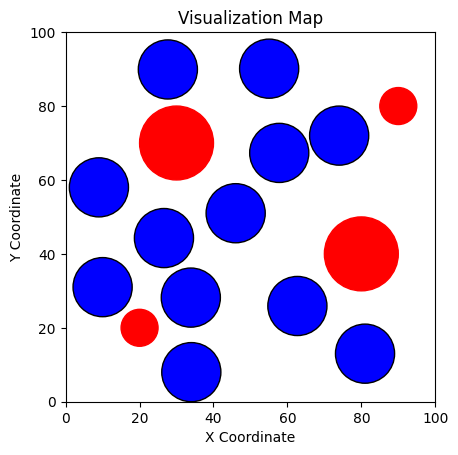

--------------------------------------------------------------------------------------------------------------------------------------
Generation  34 : [[69, 81], [1.48706685936525, 57.52678489123235], [83, 15], [19, 86], [80.01518871420258, 101.74873561130957], [53, 91], [48.48, 39.65], [39.59027689383488, 101.25953784648081], [13.246981198961368, 34.40607312660785], [51.69743912430407, 23.39253544697857], [60.18047913570364, 64.1937585547299], [31.31679778151694, 35.496031953187114], [46, 51], [10, 31], [81, 13], [9, 58], [74, 72], [55.05781844801617, 90.10999999999999], [34, 8], [27.65534240976211, 89.89999999999999], [62.699999999999996, 25.9], [26.596644623335898, 44.27753709729835], [57.78811863166008, 67.32206139126114], [33.86449738644491, 28.172667466941803], [92.0, 58.50180493280889], [8.27875128432936, 57.56001636860488], [10, 11], [48, 29], [80.83088533760962, 92.0], [49, 8], [27, 89], [43.45193679301717, 92.0], [10.369774978324855, 39.17592929533991], [63.98055122460359, 2

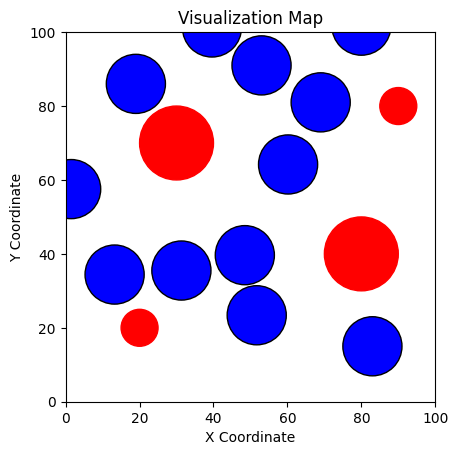

--------------------------------------------------------------------------------------------------------------------------------------
Generation  35 : [[50, 66], [83, 20], [8, 57], [20, 38], [31, 90], [15, 81], [74, 81], [54.11635575511201, 90.79999999999998], [58, 11], [49, 29], [74.93792876865297, 60.029068156173295], [36.96284130595303, 43.83824133820363], [52, 14], [18.8255703465645, 45.16805246192815], [11, 32], [35, 91], [8, 64], [41.54264087016864, 51.17765497358615], [65, 60], [17, 90], [67.78890061135971, 80.32139885592632], [0, 84.7177978994965], [83.64542584333051, 11.104850903315533], [55.43765069393122, 29.528386331175245], [52, 14], [18.8255703465645, 45.16805246192815], [11, 32], [35, 91], [8, 64], [41.54264087016864, 51.17765497358615], [65, 60], [17, 90], [67.78890061135971, 80.32139885592632], [0, 84.7177978994965], [83.64542584333051, 11.104850903315533], [55.43765069393122, 29.528386331175245]]
Generation  35  Objective Function : [3983.5394847518573, 3981.53948475

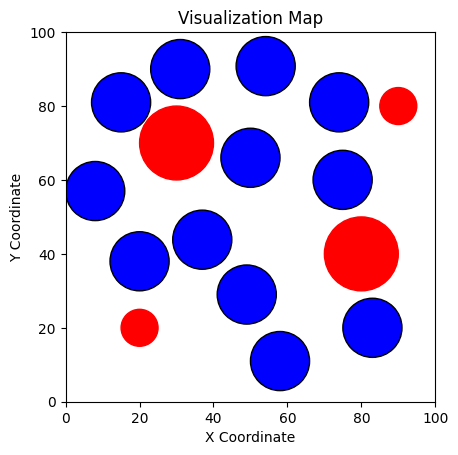

--------------------------------------------------------------------------------------------------------------------------------------
Generation  36 : [[81, 12], [35, 19], [8.899999999999999, 49.5], [9, 31], [65, 60], [21, 87], [71.3, 74.69999999999999], [42.9814490285784, 90.55999999999997], [60.936670183407905, 31.796419656777893], [26, 40], [85, 59], [42.50528412234648, 39.545284836095114], [50, 66], [83, 20], [8, 57], [20, 38], [31, 90], [15, 81], [74, 81], [54.11635575511201, 90.79999999999998], [58, 11], [49, 29], [74.93792876865297, 60.029068156173295], [36.96284130595303, 43.83824133820363], [64.66893673508501, 15.55008003643126], [11, 52], [2.021758675814235, 30.721884326541193], [45.02594165463658, 88.32137394701964], [49, 31], [24, 89], [71.69031259129399, 61.83412464678953], [24.165972975878994, 103.97267848558133], [77.07538266269401, 92.89233878320371], [-6.187139889902603, 86.6636544261901], [98.5163399285371, 10.468214767236878], [41, 53]]
Generation  36  Objective Fun

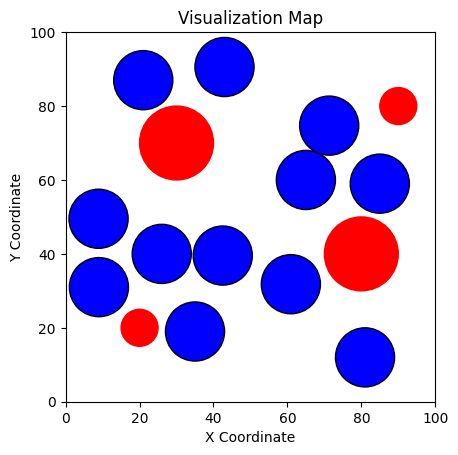

--------------------------------------------------------------------------------------------------------------------------------------
Generation  37 : [[59.3, 49.8], [38, 8], [8.27, 54.75], [16.7, 35.9], [74, 10], [16.8, 82.8], [73.19, 79.10999999999999], [50.77588373715192, 90.72799999999998], [58.88100105502237, 17.23892589703337], [53, 65], [77.95655013805708, 59.7203477093213], [38.62557415087106, 42.550354387571076], [81, 12], [35, 19], [8.899999999999999, 49.5], [9, 31], [65, 60], [21, 87], [71.3, 74.69999999999999], [42.9814490285784, 90.55999999999997], [60.936670183407905, 31.796419656777893], [26, 40], [85, 59], [42.50528412234648, 39.545284836095114], [61.817866036779584, 15.541730012148804], [71, 75], [6.534418000472302, 31.90408177674683], [56.38362354616416, 84.97418898763351], [57.79864277198139, 45.08188241280905], [23.696296821461807, 90.69948619669847], [77.77772600314387, 57.570448858061184], [14.490914218346468, 115.91686980413107], [80.9853533252528, 106.870490777

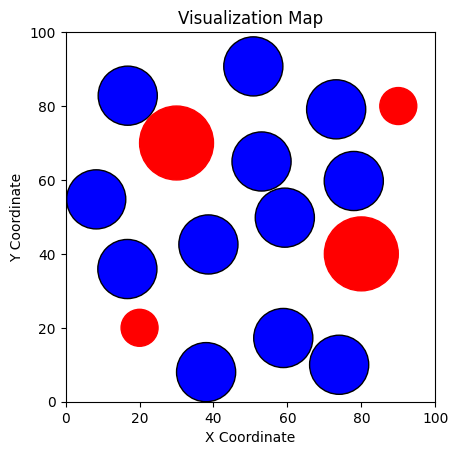

--------------------------------------------------------------------------------------------------------------------------------------
Generation  38 : [[67.57250622574571, 14.479211008504162], [56, 85], [7.24409260033061, 37.18285724372278], [46, 42], [59.95904994038697, 49.557317688966336], [22.887407775023267, 89.58964033768892], [75.8344082022007, 62.70931420064282], [23.038074661416047, 108.30980886289173], [74.97074838269933, 84.34826944156312], [12.708470567294295, 66.63616283104474], [101.39720658245598, 31.638281662872025], [37.95158523670394, 17.463585450828532], [92.0, 20.659400799703597], [8, 54], [14.125866316437858, 4.917928769147023], [49.843143625726356, 46.09226363039457], [38, 24], [78, 13], [55, 9], [7.063970008154694, 69.1682926635919], [58.789277914409396, 29.289798945995113], [80.42269671998525, 90.17318937072463], [34.10452228427351, 87.5701340994689], [52.460708402480336, 64.74115452204505], [92.0, 20.659400799703597], [8, 54], [14.125866316437858, 4.91792876914

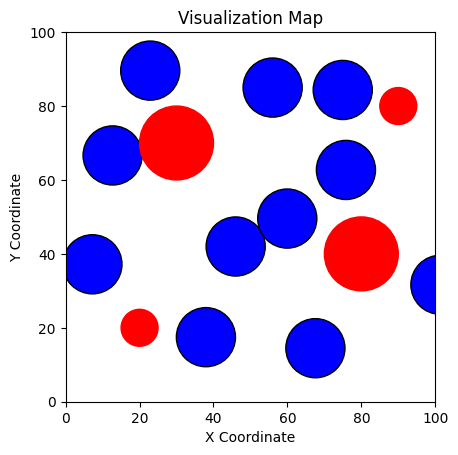

--------------------------------------------------------------------------------------------------------------------------------------
Generation  39 : [[91.99999999999999, 20.659400799703597], [8.0, 54.0], [14.125866316437858, 4.917928769147023], [49.84314362572635, 46.09226363039457], [38.0, 23.999999999999996], [78.0, 13.0], [55.0, 9.0], [7.063970008154694, 69.1682926635919], [58.78927791440939, 29.28979894599511], [80.42269671998525, 90.17318937072463], [34.1045222842735, 87.5701340994689], [52.46070840248033, 64.74115452204505], [67.57250622574571, 14.479211008504162], [56, 85], [7.24409260033061, 37.18285724372278], [46, 42], [59.95904994038697, 49.557317688966336], [10, 11], [75.8344082022007, 62.70931420064282], [23.038074661416047, 92.0], [74.97074838269933, 84.34826944156312], [12.708470567294295, 66.63616283104474], [54, 66], [37.95158523670394, 17.463585450828532], [92.58722683513771, 23.71079980230978], [7.482949660980708, 52.44026017859251], [56, 91], [64.76051060435056, 

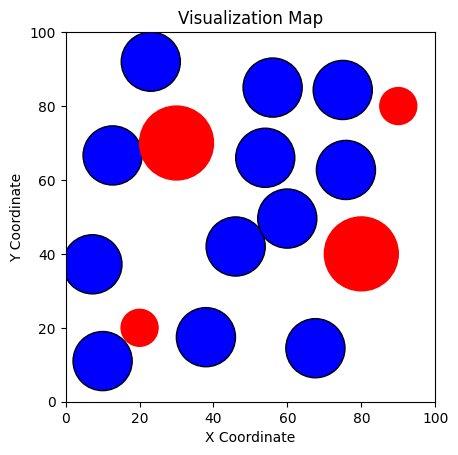

--------------------------------------------------------------------------------------------------------------------------------------
Generation  40 : [[92.1761680505413, 21.57482050048545], [7.844884898294212, 53.53207805357775], [26.6881064215065, 30.742550138402915], [54, 90], [39.610590887555674, 22.35707712302342], [79.3826268518003, 12.736973638041768], [55.08137776336652, 7.062797300450304], [4.196201217594555, 73.43830741505529], [44.15249454008657, 42.40285926219657], [79.20978986150855, 89.12314526751726], [64, 62], [47.82249588173623, 60.61880816543153], [67.57250622574571, 14.479211008504162], [56, 85], [7.24409260033061, 37.18285724372278], [46, 42], [59.95904994038697, 49.557317688966336], [10, 11], [75.8344082022007, 62.70931420064282], [23.038074661416047, 92.0], [74.97074838269933, 84.34826944156312], [12.708470567294295, 66.63616283104474], [54, 66], [37.95158523670394, 17.463585450828532], [92, 67], [0, 47.40667993955907], [14.237238576995146, 0], [14, 54], [33, 46]

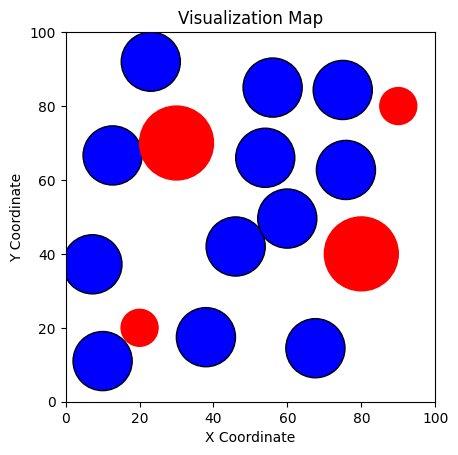

--------------------------------------------------------------------------------------------------------------------------------------
Generation  41 : [[84.79506950310262, 19.446137652891064], [8, 49], [20.85490227515373, 32.67464226999887], [43, 87], [45.71512860340506, 30.517149292806295], [9, 13], [61.30728689501677, 23.756752370508057], [9.848763250741003, 79.0068151905387], [27, 47], [59.25939407324427, 82.3770505365755], [61.0, 63.2], [44.86122268822655, 47.67224135105063], [67.57250622574571, 14.479211008504162], [56, 85], [7.24409260033061, 37.18285724372278], [46, 42], [59.95904994038697, 49.557317688966336], [10, 11], [75.8344082022007, 62.70931420064282], [23.038074661416047, 92.0], [74.97074838269933, 84.34826944156312], [12.708470567294295, 66.63616283104474], [54, 66], [37.95158523670394, 17.463585450828532], [80, 71], [0, 52.88568455477031], [92, 24], [66.02589936974042, 92.0], [34.670612116842065, 23.073234361463232], [75.54356380928681, 20.499773114564746], [55.960919

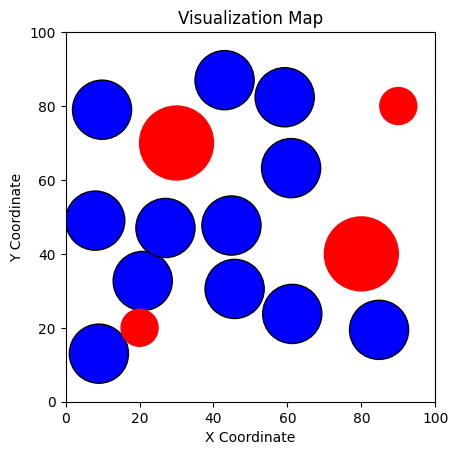

--------------------------------------------------------------------------------------------------------------------------------------
Generation  42 : [[84, 10], [24, 52], [11, 40], [60.01812955881829, 76.99999999999999], [61, 36], [70, 89], [61.92296613765197, 21.07778069465743], [8.910523650400313, 79.73759043700083], [41, 87], [46.512541170188285, 42.39084884931342], [65.91717834116069, 60.45201841376611], [28.885475571011185, 30.439075635248557], [84.79506950310262, 19.446137652891064], [8, 49], [20.85490227515373, 32.67464226999887], [43, 87], [45.71512860340506, 30.517149292806295], [9, 13], [61.30728689501677, 23.756752370508057], [9.848763250741003, 79.0068151905387], [27, 47], [59.25939407324427, 82.3770505365755], [61.0, 63.2], [44.86122268822655, 47.67224135105063], [23, 90], [8.543193577086413, 48.842217130875106], [89.33763674161331, 15.59809311847125], [78.29253564243488, 99.73323840965972], [42.04437257571021, 26.812799031436857], [89, 61], [65.86095119959481, 5.5999773

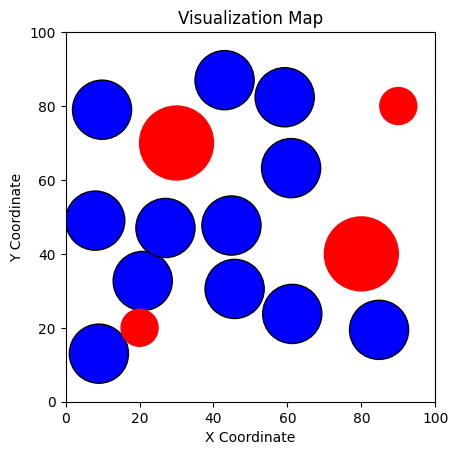

--------------------------------------------------------------------------------------------------------------------------------------
Generation  43 : [[71, 80], [33, 89], [42, 8], [67.70477494970442, 95.91326688676179], [43.14559938401867, 27.924104109847686], [25, 52], [64.49485190822139, 11.047009884653292], [10.6546289752223, 72.00204455716161], [14.399999999999999, 37.199999999999996], [56.27781822197328, 84.91311516097264], [68.05892617317822, 61.822665555956874], [41.41906193211887, 44.941327453481435], [84.79506950310262, 19.446137652891064], [8, 49], [20.85490227515373, 32.67464226999887], [43, 87], [45.71512860340506, 30.517149292806295], [9, 13], [61.30728689501677, 23.756752370508057], [9.848763250741003, 79.0068151905387], [27, 47], [59.25939407324427, 82.3770505365755], [61.0, 63.2], [44.86122268822655, 47.67224135105063], [92.0, 24.476189014627803], [11, 67], [9.43215088155039, 45.52999728539615], [25, 44], [47, 26], [80.71869174303656, 92.0], [74.43721977181502, 11.443

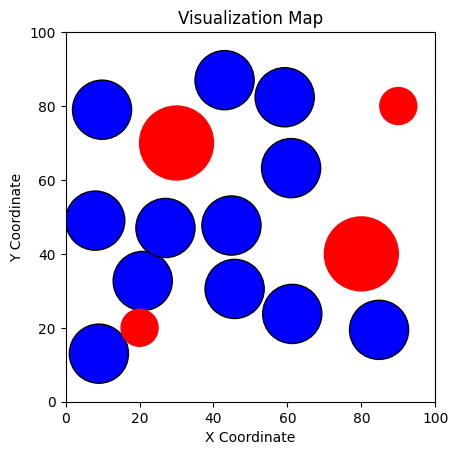

--------------------------------------------------------------------------------------------------------------------------------------
Generation  44 : [[89.83852085093078, 22.96717360610678], [10.1, 61.599999999999994], [12.85897629963139, 41.67339078077696], [84, 64], [46.61453858102152, 27.355144787841887], [33, 16], [70.49823990877555, 15.137580237219906], [15.23204164319914, 83.54541736896915], [27, 47], [61.87781822197327, 48.513115160972646], [58.126624856333535, 67.33606303491148], [43.615181643928054, 43.75225090385271], [84.79506950310262, 19.446137652891064], [8, 49], [20.85490227515373, 32.67464226999887], [43, 87], [45.71512860340506, 30.517149292806295], [9, 13], [61.30728689501677, 23.756752370508057], [9.848763250741003, 79.0068151905387], [27, 47], [59.25939407324427, 82.3770505365755], [61.0, 63.2], [44.86122268822655, 47.67224135105063], [50, 79], [35.52283710478126, 92.0], [51.07425688541876, 9.44965714089355], [70.59471487787886, 92.0], [33, 33], [56, 26], [89, 18]

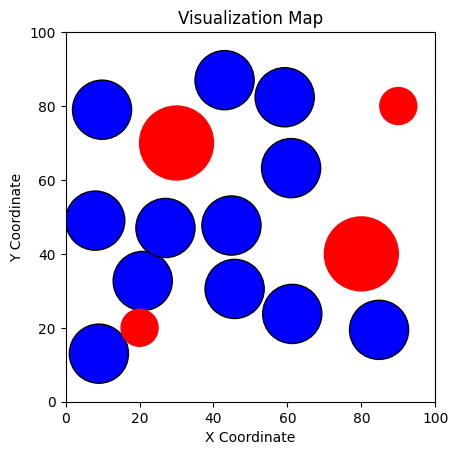

--------------------------------------------------------------------------------------------------------------------------------------
Generation  45 : [[58, 17], [59, 36], [92, 60], [62.3163004145152, 90.49999999999999], [10, 55], [29, 90], [80.69218606850502, 19.727025711152415], [6.365204310963488, 73.62536604517045], [13.59190193126403, 37.361338182957454], [9, 11], [61.89148007171087, 67.95069435461471], [42.147086937469595, 46.199980668866104], [84.79506950310262, 19.446137652891064], [8, 49], [20.85490227515373, 32.67464226999887], [43, 87], [45.71512860340506, 30.517149292806295], [9, 13], [61.30728689501677, 23.756752370508057], [9.848763250741003, 79.0068151905387], [27, 47], [59.25939407324427, 82.3770505365755], [61.0, 63.2], [44.86122268822655, 47.67224135105063], [42, 85], [37.12763122942486, 104.67951287035027], [16, 35], [87, 58], [81, 19], [52.800767103967864, 32.18414511069304], [95.82635683705578, 30.577698095798162], [16.86922705826308, 84.25477174136385], [-0.85304

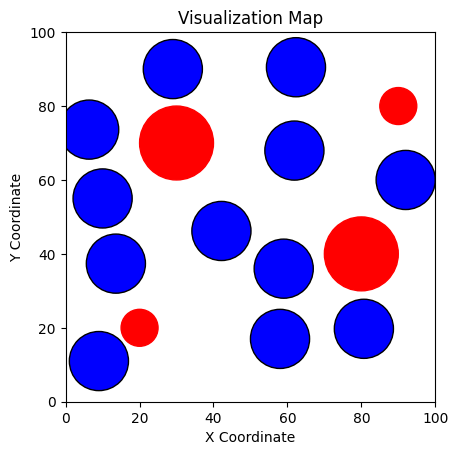

--------------------------------------------------------------------------------------------------------------------------------------
Generation  46 : [[13, 9], [40, 14], [22.3, 44.099999999999994], [69, 12], [74.0, 61.7], [80, 89], [51.847907051116735, 72.87330942873945], [89, 22], [27, 88], [56.46538701965627, 42.48367674875684], [90, 67], [40.214317015284855, 38.538589674213235], [59, 68], [49.946968080130176, 18.942589443457177], [20.360078071570626, 55.175137001362444], [27, 31], [23, 88], [63.351637663023695, 82.29117051153992], [41.14838877014891, 92.0], [75.65928203444248, 13.325788796619026], [76, 60], [61.293071389964204, 43.01682086680369], [13.55263178599194, 76.38355248190672], [42.553140512721995, 45.511125531437074], [59, 68], [49.946968080130176, 18.942589443457177], [20.360078071570626, 55.175137001362444], [27, 31], [23, 88], [63.351637663023695, 82.29117051153992], [41.14838877014891, 92.0], [75.65928203444248, 13.325788796619026], [76, 60], [61.293071389964204, 43.

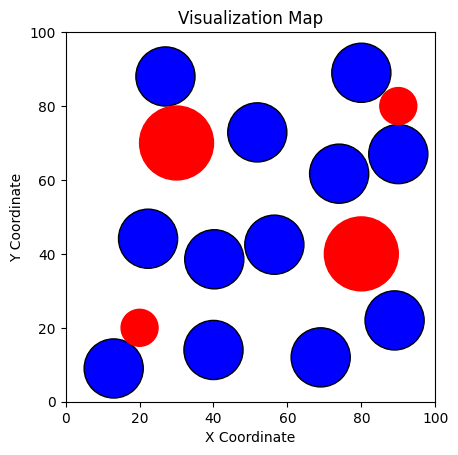

--------------------------------------------------------------------------------------------------------------------------------------
Generation  47 : [[46, 57], [40, 10], [21.718023421471187, 47.42254110040872], [56.4, 17.699999999999996], [17, 91], [75.0054912989071, 86.98735115346197], [10, 12], [84.99778461033274, 19.397736638985705], [8, 56], [57.913692330748646, 42.6436199841709], [67.06578953579758, 69.81506574457201], [40.915964064516, 40.630350431380386], [13, 9], [40, 14], [22.3, 44.099999999999994], [69, 12], [74.0, 61.7], [80, 89], [51.847907051116735, 72.87330942873945], [89, 22], [27, 88], [56.46538701965627, 42.48367674875684], [90, 67], [40.214317015284855, 38.538589674213235], [40, 8], [58.219759864933856, 33.58748116587073], [64, 86], [74, 21], [21.460745592818313, 101.19577893255693], [77.72409391911779, 77.09291647016656], [34.91711949219544, 91.40364515441235], [77.77316347570549, 5.4441704621430755], [52, 55], [68, 64], [17.37347102333616, 86.87691803322816], [34

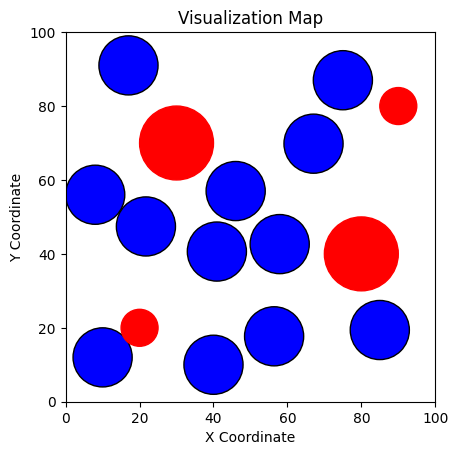

--------------------------------------------------------------------------------------------------------------------------------------
Generation  48 : [[73, 65], [45.465927959480155, 17.076244349761218], [12, 10], [61.67999999999999, 18.689999999999998], [18.33822367784549, 94.05873367976707], [75.8210720849703, 84.01902074847334], [17.47513584765863, 35.8210935463237], [82.83039826994457, 15.211666785932916], [11, 58], [60.93958463152405, 49.050533988919625], [52.15809398205915, 74.93362143116886], [39.004129631159415, 41.04734968364747], [46, 57], [40, 10], [21.718023421471187, 47.42254110040872], [56.4, 17.699999999999996], [17, 91], [75.0054912989071, 86.98735115346197], [10, 12], [84.99778461033274, 19.397736638985705], [8, 56], [57.913692330748646, 42.6436199841709], [67.06578953579758, 69.81506574457201], [40.915964064516, 40.630350431380386], [54.02796507535788, 3.4311484972111943], [54.90506288867059, 32.62162691088635], [54, 67], [77.01425921534573, 13.585847786182116], [16.

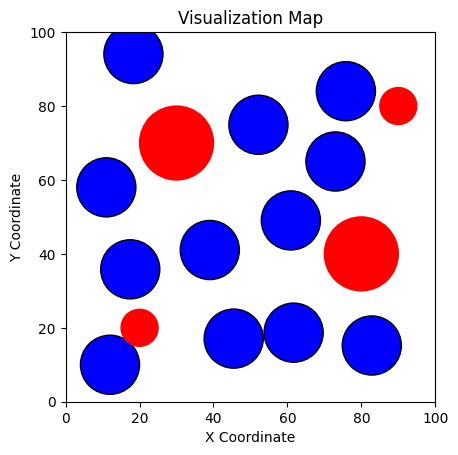

--------------------------------------------------------------------------------------------------------------------------------------
Generation  49 : [[79, 62], [57, 75], [37, 9], [90, 16], [24.199999999999996, 89.8], [73.50384390923497, 87.29114580742338], [48, 59], [68, 12], [8.0, 56.599999999999994], [10, 75], [64.0460526750583, 61.7705460212004], [31.641174845161196, 31.74124530196627], [88.3720491358174, 62.261309340540386], [46.779690489970776, 51.12980516921427], [48, 72], [57.2348423037024, 19.851199662697955], [51.03582197236415, 92.0], [69.29363980641841, 89.65759645803507], [25.5267681978413, 37.41894002593568], [7.809322099368435, 83.7532316724184], [0, 55.268935440044], [84.86968962729692, 11.653232174632757], [66.2535201623929, 57.70387257974596], [4.328133620941569, 19.57709657283749], [88.3720491358174, 62.261309340540386], [46.779690489970776, 51.12980516921427], [48, 72], [57.2348423037024, 19.851199662697955], [51.03582197236415, 92.0], [69.29363980641841, 89.65759

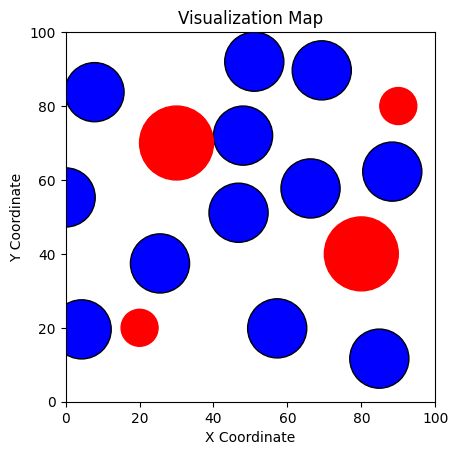

--------------------------------------------------------------------------------------------------------------------------------------
Generation  50 : [[85.56043439507218, 62.182916538378265], [12, 84], [44.699999999999996, 53.1], [18, 40], [42.9850753806549, 91.33999999999999], [70.55670103726337, 88.94766126285155], [32.26873773848891, 43.89325801815498], [39, 25], [2.4, 55.668254808030795], [62.40878273910784, 30.65726252224293], [65.59127991619252, 58.92387461218229], [91, 12], [88.3720491358174, 62.261309340540386], [46.779690489970776, 51.12980516921427], [48, 72], [57.2348423037024, 19.851199662697955], [51.03582197236415, 92.0], [69.29363980641841, 89.65759645803507], [25.5267681978413, 37.41894002593568], [7.809322099368435, 83.7532316724184], [0, 55.268935440044], [84.86968962729692, 11.653232174632757], [66.2535201623929, 57.70387257974596], [4.328133620941569, 19.57709657283749], [74.82670972000821, 73.22693031924967], [38, 16], [37.10470182361758, 0], [86, 63], [29.293567

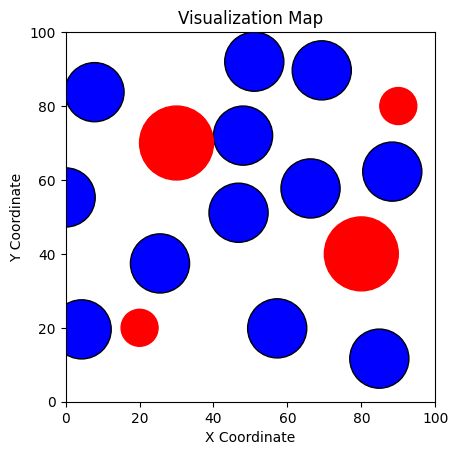

--------------------------------------------------------------------------------------------------------------------------------------
Generation  51 : [[82.34031699255299, 65.49612067263968], [10, 8], [51, 79], [25, 32], [38.87762293383698, 91.53799999999998], [69.23529907039789, 89.86336288399607], [39.10715690153075, 45.53757878379439], [45, 60], [17.58, 47.367778365621554], [49.98614791737548, 32.86008376557005], [62.85932226455866, 60.63256458905449], [75.72659688514672, 21.11563177108306], [88.3720491358174, 62.261309340540386], [46.779690489970776, 51.12980516921427], [48, 72], [57.2348423037024, 19.851199662697955], [51.03582197236415, 92.0], [69.29363980641841, 89.65759645803507], [25.5267681978413, 37.41894002593568], [7.809322099368435, 83.7532316724184], [0, 55.268935440044], [84.86968962729692, 11.653232174632757], [66.2535201623929, 57.70387257974596], [4.328133620941569, 19.57709657283749], [76, 22], [21.35578494034172, 92.0], [45.88462044485084, 60.33569574382176], [51,

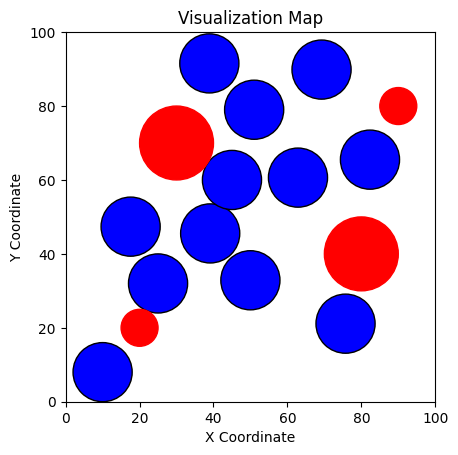

--------------------------------------------------------------------------------------------------------------------------------------
Generation  52 : [[12, 87], [8, 9], [34, 18], [52, 72], [54.34303509773203, 91.99999999999999], [66.98809194192552, 82.19727893741052], [49, 45], [29.324967992587407, 43.81171764516215], [4.959352380228568, 59.92614729058998], [77, 16], [66.1732106599778, 60.65619068803207], [63.70552813654223, 7.864061111037374], [82.34031699255299, 65.49612067263968], [10, 8], [51, 79], [25, 32], [38.87762293383698, 91.53799999999998], [69.23529907039789, 89.86336288399607], [39.10715690153075, 45.53757878379439], [45, 60], [17.58, 47.367778365621554], [49.98614791737548, 32.86008376557005], [62.85932226455866, 60.63256458905449], [75.72659688514672, 21.11563177108306], [68.04365844586682, 14.566885320518614], [32.350406205154655, 100.35806035997922], [43, 20], [71, 57], [44, 91], [66.9677592496697, 91.84013825251364], [29.38456534017061, 52.0456612614894], [47.633696

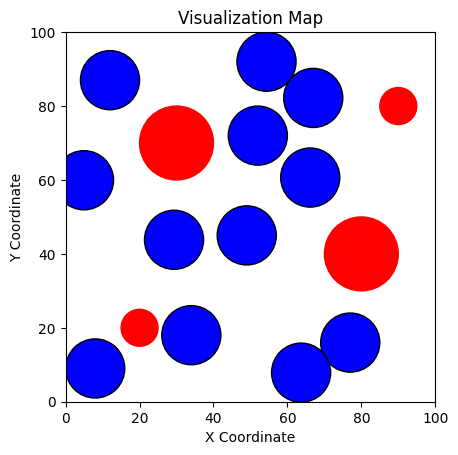

--------------------------------------------------------------------------------------------------------------------------------------
Generation  53 : [[17, 41], [8.6, 8.7], [33, 22], [50, 15], [49.703411448563514, 91.86139999999999], [67.66225408046722, 84.49710412138617], [84, 63], [34.02747759481119, 48.6682023516135], [8.745546666159996, 56.158636613099446], [63, 45], [65.17904414135205, 60.64910285833879], [67.31184876112357, 11.83953230905108], [12, 87], [8, 9], [34, 18], [52, 72], [54.34303509773203, 91.99999999999999], [66.98809194192552, 82.19727893741052], [49, 45], [29.324967992587407, 43.81171764516215], [4.959352380228568, 59.92614729058998], [77, 16], [66.1732106599778, 60.65619068803207], [63.70552813654223, 7.864061111037374], [49, 79], [14, 8], [54.73091474053939, 18.037350934153977], [14, 44], [38.792764420576546, 91.36139186704271], [68.5506346661693, 85.89787173593056], [46, 50], [45.61208348806003, 30.886163194458472], [19.373534141898535, 87.87902760821332], [61,

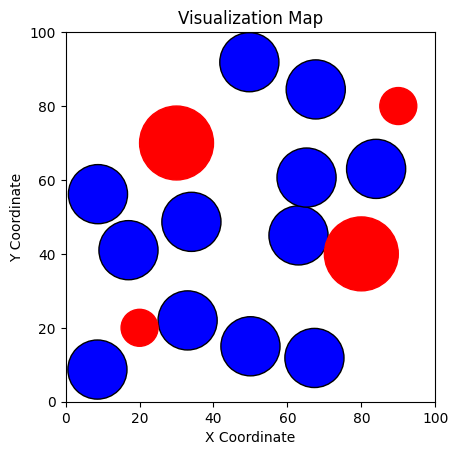

--------------------------------------------------------------------------------------------------------------------------------------
Generation  54 : [[72, 17], [39, 88], [59, 25], [38, 19], [21.902910529319605, 45.099999999999994], [58.596427582577654, 47.05918368122315], [91, 25], [40.297490397776215, 55.143515293548646], [56.78780571406857, 81.67784418717699], [51.099999999999994, 67.8], [83.55196319799333, 61.596857206409624], [39.41165844096267, 38.75921833331121], [70, 20], [48, 69], [24.312918788032402, 37.22055297164703], [33.298598611531006, 6.342046503898414], [4.9254669702902865, 28.78385280603785], [57.640697900310315, 30.21704970851509], [74, 74], [19, 85], [80.63602069119295, 90.14096846257195], [55, 54], [87.8517588021318, 62.4367207632665], [41.537870943305464, 46.244964247653606], [70, 20], [48, 69], [24.312918788032402, 37.22055297164703], [33.298598611531006, 6.342046503898414], [4.9254669702902865, 28.78385280603785], [57.640697900310315, 30.21704970851509], [74, 

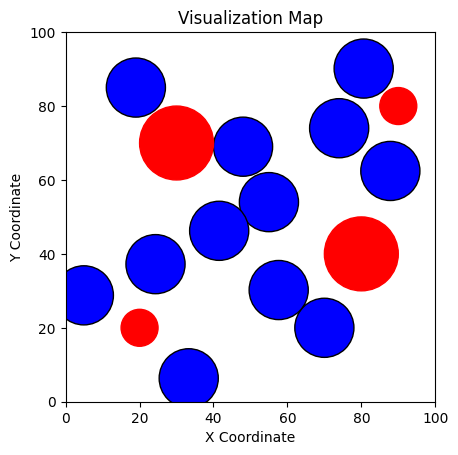

--------------------------------------------------------------------------------------------------------------------------------------
Generation  55 : [[70.0, 20.0], [47.99999999999999, 69.0], [24.3129187880324, 37.22055297164703], [33.298598611531006, 6.3420465038984135], [4.9254669702902865, 28.783852806037846], [57.640697900310315, 30.21704970851509], [74.0, 74.0], [19.0, 85.0], [80.63602069119295, 90.14096846257195], [55.0, 54.0], [87.8517588021318, 62.43672076326649], [41.537870943305464, 46.244964247653606], [70, 20], [48, 69], [24.312918788032402, 37.22055297164703], [33.298598611531006, 6.342046503898414], [4.9254669702902865, 28.78385280603785], [57.640697900310315, 30.21704970851509], [74, 74], [19, 85], [80.63602069119295, 90.14096846257195], [55, 54], [87.8517588021318, 62.4367207632665], [41.537870943305464, 46.244964247653606], [10, 12], [45.02961492641337, 92.0], [68.87653011879543, 24.475568641964998], [8, 74], [69, 67], [50, 52], [92.0, 17.420128315062723], [46, 21], 

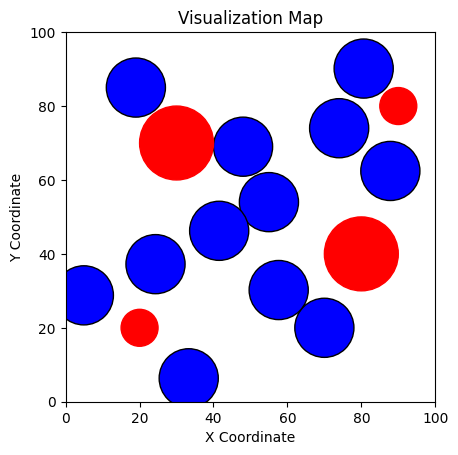

--------------------------------------------------------------------------------------------------------------------------------------
Generation  56 : [[70.0, 20.0], [47.99999999999999, 69.0], [24.3129187880324, 37.22055297164703], [33.298598611531006, 6.3420465038984135], [4.9254669702902865, 28.783852806037846], [57.640697900310315, 30.21704970851509], [74.0, 74.0], [19.0, 85.0], [80.63602069119295, 90.14096846257195], [55.0, 54.0], [87.8517588021318, 62.43672076326649], [41.537870943305464, 46.244964247653606], [70.0, 20.0], [47.99999999999999, 69.0], [24.3129187880324, 37.22055297164703], [33.298598611531006, 6.3420465038984135], [4.9254669702902865, 28.783852806037846], [57.640697900310315, 30.21704970851509], [74.0, 74.0], [19.0, 85.0], [80.63602069119295, 90.14096846257195], [55.0, 54.0], [87.8517588021318, 62.43672076326649], [41.537870943305464, 46.244964247653606], [87, 9], [38.021274025592035, 95.84357565927411], [48, 12], [10.124569171078365, 66.00945180062803], [64.420327

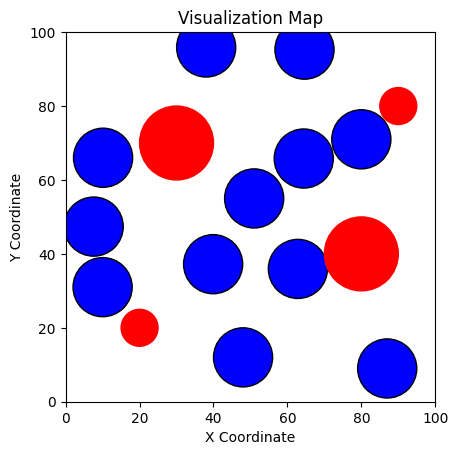

--------------------------------------------------------------------------------------------------------------------------------------
Generation  57 : [[75.1, 16.7], [10, 54], [53, 14], [8, 88], [22.773925197108795, 39.888038263229696], [58, 92], [54.8, 61.099999999999994], [25, 90], [75.83235654869989, 91.67657485599626], [64, 76], [78, 66], [41.04646148765925, 43.535357265222714], [87, 9], [38.021274025592035, 95.84357565927411], [48, 12], [10.124569171078365, 66.00945180062803], [64.42032772635199, 65.79780433001068], [80, 71], [10, 31], [51, 55], [64.62380688288276, 95.25965644065302], [7.580523530635621, 47.38270661799671], [62.83855827584779, 35.93469918501454], [39.89983942448477, 37.212940972883985], [81.45820254451375, 13.378774457861336], [56, 25], [24.545706385985277, 42.85086181975351], [60, 73], [36, 8], [9, 79], [51, 8], [30.495580276020835, 92.0], [9, 53], [63, 55], [41, 31], [39.439214136283724, 50.218419357789266]]
Generation  57  Objective Function : [3983.5394847518

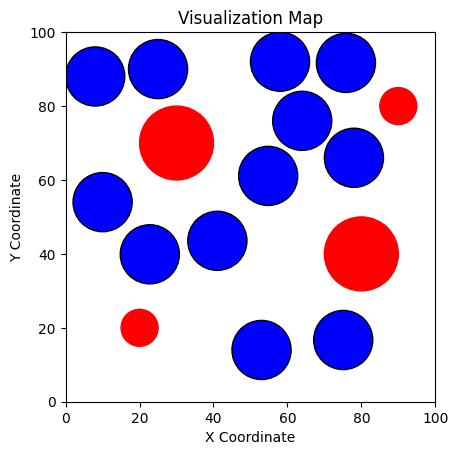

--------------------------------------------------------------------------------------------------------------------------------------
Generation  58 : [[77.00746076335412, 15.7036323373584], [23.8, 45.3], [44.46371191579558, 22.655258545926053], [60, 31], [9, 27], [43.3, 88.1], [9, 88], [26.648674082806252, 90.6], [32, 32], [50, 73], [66.89999999999999, 55.49999999999999], [40.56428728224659, 45.54027589299268], [75.1, 16.7], [10, 54], [53, 14], [8, 88], [22.773925197108795, 39.888038263229696], [58, 92], [54.8, 61.099999999999994], [25, 90], [75.83235654869989, 91.67657485599626], [64, 76], [78, 66], [41.04646148765925, 43.535357265222714], [71.88038168492045, 7.739322472665342], [31, 30], [22.056735466725335, 41.90709483698283], [60.78443072059271, 65.93199475028034], [81, 62], [66, 24], [47.03925674566361, 10.095016607019065], [86, 18], [38, 90], [71, 92], [47.509918832260766, 31.790144323343945], [53, 88]]
Generation  58  Objective Function : [3982.5394847518573, 3983.539484751857

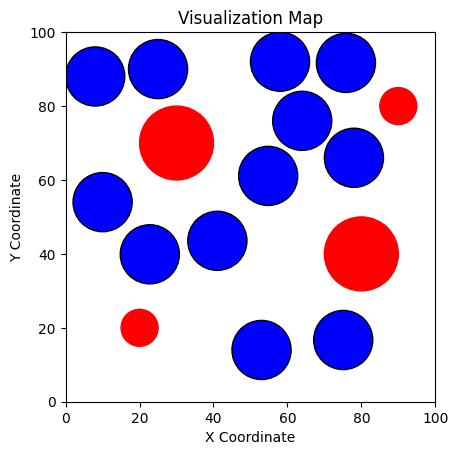

--------------------------------------------------------------------------------------------------------------------------------------
Generation  59 : [[72.84626717944431, 10.427525730865739], [22, 51], [31.339714826707734, 33.53496638588798], [92, 53], [30, 92], [9, 38], [49.36747972196452, 25.396511624913344], [69, 57], [49.349706964609965, 90.50297245679887], [68.89999999999999, 87.19999999999999], [56.65694318258253, 42.05310102634076], [49.41393844629777, 74.66060717956681], [75.1, 16.7], [10, 54], [53, 14], [8, 88], [22.773925197108795, 39.888038263229696], [58, 92], [54.8, 61.099999999999994], [25, 90], [75.83235654869989, 91.67657485599626], [64, 76], [78, 66], [41.04646148765925, 43.535357265222714], [15, 83], [30, 89], [26.992695443240493, 50.703103107288875], [69.99767826231523, 64.14484960706945], [11, 45], [63.879527754372255, 22.848079084931392], [57.305533476443216, 5.439068860275572], [99.35649841427427, 11.905351319400268], [43.851030597784465, 102.9694014465763], [57

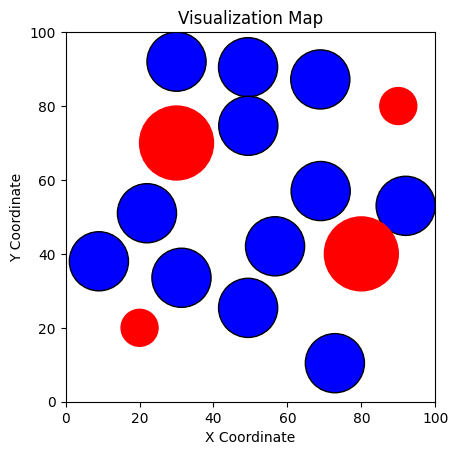

--------------------------------------------------------------------------------------------------------------------------------------
Generation  60 : [[9, 12], [73, 57], [34.79488681026834, 39.692172175102215], [46, 9], [14.532177559132638, 43.46641147896891], [37, 91], [56.55387343351025, 22.1373482021929], [83, 9], [53.445428383059095, 99.58155346940228], [92, 64], [60.83929551175735, 48.56680299233594], [57.87714012586422, 78.58061586213985], [86.55593514106519, 17.944130210345154], [13.12759167668797, 92.0], [37.69403749602596, 36.97248508506375], [42.289752799086145, 19.12692258208197], [84.07454130936213, 67.20546947575305], [16.363530362785742, 3.2600252513480106], [70, 12], [64.05647352744086, 69.78888741727465], [11.272311768202307, 68.01705230570694], [13.254376011797767, 47.90170034410278], [29.23516734306219, 92.0], [54.598589626542704, 33.84948592436663], [86.55593514106519, 17.944130210345154], [13.12759167668797, 92.0], [37.69403749602596, 36.97248508506375], [42.28975

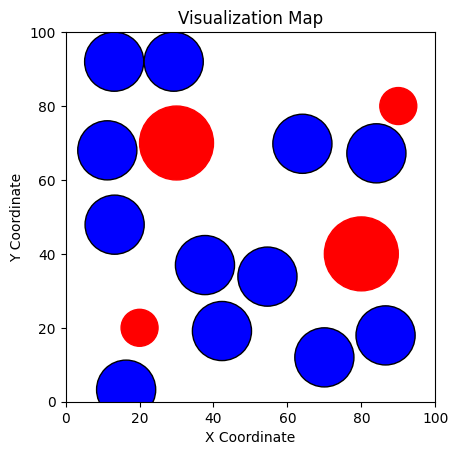

--------------------------------------------------------------------------------------------------------------------------------------
Generation  61 : [[86.55593514106519, 17.944130210345154], [13.12759167668797, 91.99999999999999], [37.69403749602596, 36.97248508506375], [42.289752799086145, 19.12692258208197], [84.07454130936213, 67.20546947575305], [16.363530362785742, 3.26002525134801], [70.0, 11.999999999999998], [64.05647352744086, 69.78888741727465], [11.272311768202307, 68.01705230570694], [13.254376011797765, 47.90170034410278], [29.235167343062187, 91.99999999999999], [54.598589626542704, 33.84948592436663], [86.55593514106519, 17.944130210345154], [13.12759167668797, 92.0], [37.69403749602596, 36.97248508506375], [42.289752799086145, 19.12692258208197], [84.07454130936213, 67.20546947575305], [16.363530362785742, 3.2600252513480106], [70, 12], [64.05647352744086, 69.78888741727465], [11.272311768202307, 68.01705230570694], [13.254376011797767, 47.90170034410278], [29.235167

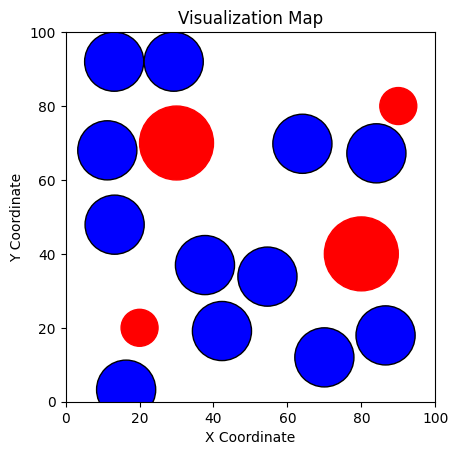

--------------------------------------------------------------------------------------------------------------------------------------
Generation  62 : [[88.26678054231955, 15.883239063103545], [36.83827750300639, 88.5], [51.208211248807785, 46.09174552551912], [32.98692583972584, 35.83807677462459], [88.92236239280864, 59.361640842725905], [32.20905910883572, 6.578007575404403], [14, 45], [59, 12], [58.68169353046069, 68.00511569171208], [79, 71], [68, 81], [52.0795768879628, 25.554845777309986], [92.0, 25.856944671863335], [43.36423702716792, 90.90373703983795], [9, 43], [41.45090148860274, 42.88708575693489], [90.62116102558434, 56.071561646771954], [15, 85], [63, 79], [57.7687417954205, 49.41012112488058], [75.62955249135618, 64.79146023134085], [78.18508825604968, 10.507508800507516], [0.15514431876459156, 63.62037860408218], [41.08168375546665, 23.440133417559995], [92.0, 25.856944671863335], [43.36423702716792, 90.90373703983795], [9, 43], [41.45090148860274, 42.88708575693489],

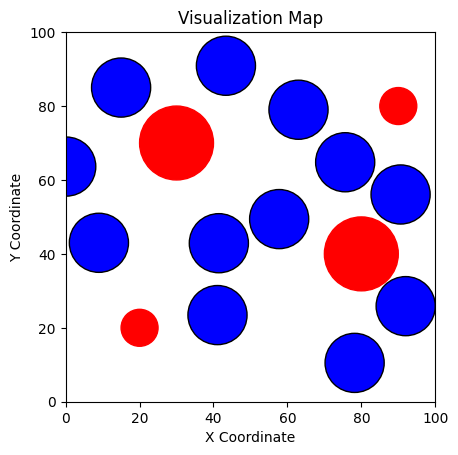

--------------------------------------------------------------------------------------------------------------------------------------
Generation  63 : [[91.99999999999999, 25.856944671863335], [43.36423702716792, 90.90373703983795], [9.0, 43.0], [41.45090148860274, 42.88708575693488], [90.62116102558434, 56.07156164677195], [15.0, 85.0], [62.99999999999999, 79.0], [57.7687417954205, 49.41012112488058], [75.62955249135618, 64.79146023134085], [78.18508825604968, 10.507508800507516], [0.15514431876459156, 63.62037860408217], [41.08168375546664, 23.440133417559995], [92.0, 25.856944671863335], [43.36423702716792, 90.90373703983795], [9, 43], [41.45090148860274, 42.88708575693489], [90.62116102558434, 56.071561646771954], [15, 85], [63, 79], [57.7687417954205, 49.41012112488058], [75.62955249135618, 64.79146023134085], [78.18508825604968, 10.507508800507516], [0.15514431876459156, 63.62037860408218], [41.08168375546665, 23.440133417559995], [62, 11], [48.1388260418358, 84.3927194646816], 

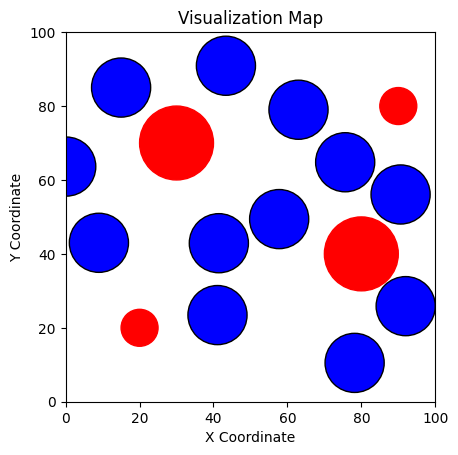

--------------------------------------------------------------------------------------------------------------------------------------
Generation  64 : [[79, 13], [70.40927110815038, 91.67112111195138], [11, 50], [77, 59], [40.4863483076753, 53.22146849403158], [46, 85], [27.299999999999997, 46.099999999999994], [58, 53], [66.08886574740686, 73.33743806940225], [29, 91], [50, 16], [55.024505126639994, 31.532040025268], [90, 60], [38, 39], [84.12516468504711, 18.08341278324208], [27.29264647459602, 5.362536862460997], [9.429648897296882, 66.53342237373992], [28.63499570756869, 92.0], [73, 62], [5.826153614055208, 88.08497000364429], [69.49665722352327, 84.67690547621015], [58.686209025836746, 53.77242160529133], [59.93573177262338, 28.447527795516027], [11, 46], [90, 60], [38, 39], [84.12516468504711, 18.08341278324208], [27.29264647459602, 5.362536862460997], [9.429648897296882, 66.53342237373992], [28.63499570756869, 92.0], [73, 62], [5.826153614055208, 88.08497000364429], [69.4966572

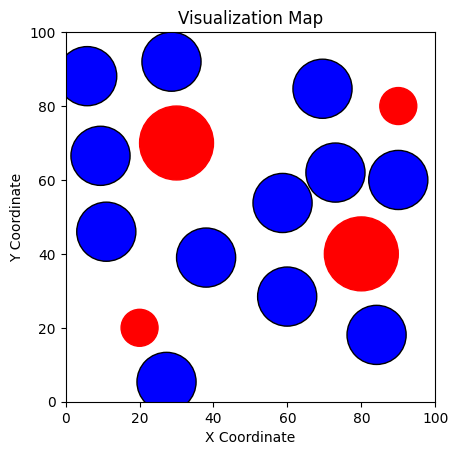

--------------------------------------------------------------------------------------------------------------------------------------
Generation  65 : [[75, 18], [91, 64], [33, 14], [62.0877939423788, 42.9087610587383], [25, 42], [10, 45], [8, 71], [18, 92], [67.11120319024178, 76.73927829144462], [58, 58], [52.98071953178702, 19.734258338654808], [41.81715358864799, 35.8724280176876], [90, 60], [38, 39], [84.12516468504711, 18.08341278324208], [27.29264647459602, 5.362536862460997], [9.429648897296882, 66.53342237373992], [28.63499570756869, 92.0], [73, 62], [5.826153614055208, 88.08497000364429], [69.49665722352327, 84.67690547621015], [58.686209025836746, 53.77242160529133], [59.93573177262338, 28.447527795516027], [11, 46], [79.99933244609642, 12.892634629125604], [51, 14], [5.672450165095721, 43.96644296795208], [63, 61], [44.632236262912855, 52.81205505380618], [49.63184584186495, 82.11249853699624], [28.080666107973155, 44.036177673466405], [31, 10], [68.52043347028538, 84.2643

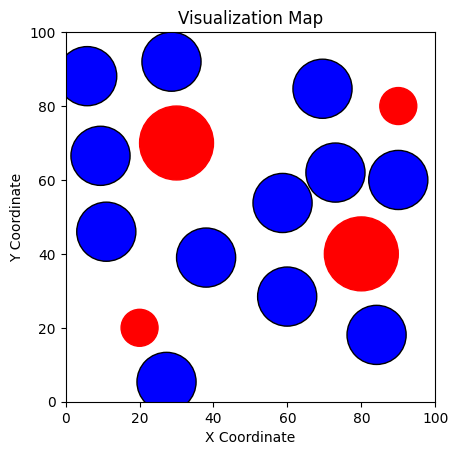

--------------------------------------------------------------------------------------------------------------------------------------
Generation  66 : [[78.4995327122675, 14.424844240387923], [47, 8], [37, 23], [9, 12], [38.742565384039, 49.56843853766433], [46, 91], [22.056466275581204, 52.12532437142649], [27.099999999999998, 34.599999999999994], [68.0976643862723, 82.00683047457532], [10, 61], [73, 67], [50.270350355017186, 34.026551238446096], [90, 60], [38, 39], [84.12516468504711, 18.08341278324208], [27.29264647459602, 5.362536862460997], [9.429648897296882, 66.53342237373992], [28.63499570756869, 92.0], [73, 62], [5.826153614055208, 88.08497000364429], [69.49665722352327, 84.67690547621015], [58.686209025836746, 53.77242160529133], [59.93573177262338, 28.447527795516027], [11, 46], [74.34113117288584, 13.622997867136275], [88, 56], [0.018707854326390994, 46.12166044230429], [57.753672382053345, 57.006853675937236], [59, 15], [43.47437004551284, 84.93004225245215], [32.85443297

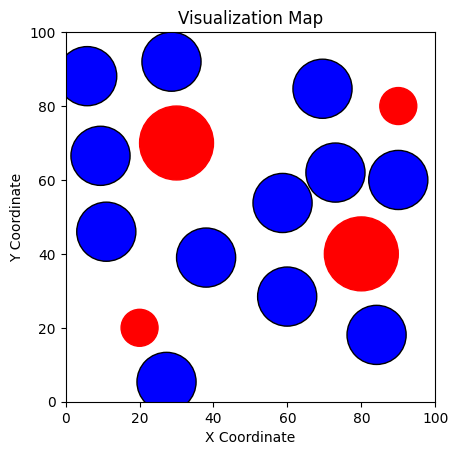

--------------------------------------------------------------------------------------------------------------------------------------
Generation  67 : [[85, 68], [9, 90], [51.137549405514136, 21.52502383497262], [55, 61], [8, 27], [40.790498712270605, 91.3], [89, 24], [21, 36], [68.51736223744759, 82.80785297506577], [53, 42], [69.08071953178701, 55.43425833865481], [38.48924524851203, 37.61858586691226], [90, 60], [38, 39], [84.12516468504711, 18.08341278324208], [27.29264647459602, 5.362536862460997], [9.429648897296882, 66.53342237373992], [28.63499570756869, 92.0], [73, 62], [5.826153614055208, 88.08497000364429], [69.49665722352327, 84.67690547621015], [58.686209025836746, 53.77242160529133], [59.93573177262338, 28.447527795516027], [11, 46], [76.65169911198211, 17.89809130703553], [22, 88], [45.46462798966956, 20.480328511832624], [6.668709137866597, 15.35452769763587], [92, 61], [39.3201533303973, 85.56512989600436], [31.888917867837787, 46.394777532399395], [8, 34], [71.283409

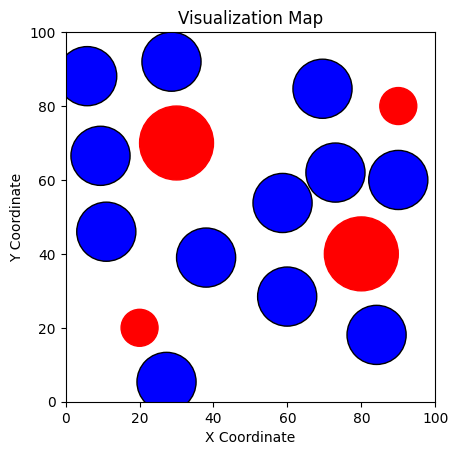

--------------------------------------------------------------------------------------------------------------------------------------
Generation  68 : [[11, 38], [90, 23], [72.52700367643384, 18.802487501819243], [81, 71], [42, 11], [31.84054299441727, 90.0695389688013], [60.666675360351334, 57.31843325971982], [6.478307529838645, 71.859479002551], [70.03268304438917, 85.9241361793147], [37, 28], [50, 82], [27.085360607597934, 41.31671223242944], [90, 60], [38, 39], [84.12516468504711, 18.08341278324208], [27.29264647459602, 5.362536862460997], [9.429648897296882, 66.53342237373992], [28.63499570756869, 92.0], [73, 62], [5.826153614055208, 88.08497000364429], [69.49665722352327, 84.67690547621015], [58.686209025836746, 53.77242160529133], [59.93573177262338, 28.447527795516027], [11, 46], [78, 19], [2.732520927779251, 92.0], [55.036513255155185, 23.074700246805925], [55.9865324945455, 72.06093291654429], [5.679587136907137, 19.5408660066054], [48.395128284888514, 92.0], [92, 10], [21.

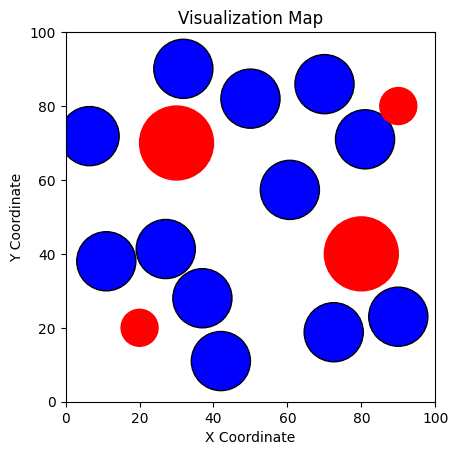

--------------------------------------------------------------------------------------------------------------------------------------
Generation  69 : [[35.4, 48.8], [46, 92], [44, 36], [48.0877939423788, 20.508761058738298], [91, 26], [24, 36], [67.4, 64.8], [16.44784608421656, 90.12549100109328], [77, 80], [65.90586270775103, 28.731726481587394], [51.58071953178701, 58.93425833865481], [54.39999999999999, 76.1], [2.798527987228926, 56.68255018020585], [19, 44], [45.648515449134464, 49.21838619554232], [55, 31], [39.87734132356135, 3.082545144777507], [58, 58], [76.48693498082487, 68.58511183267464], [32.2679567722863, 92.0], [4.018278634574013, 82.34172559621344], [80.37016835166293, 14.839024058258136], [49.64888134790499, 84.02283006252817], [76.5254656391841, 88.6451332937595], [2.798527987228926, 56.68255018020585], [19, 44], [45.648515449134464, 49.21838619554232], [55, 31], [39.87734132356135, 3.082545144777507], [58, 58], [76.48693498082487, 68.58511183267464], [32.2679567722

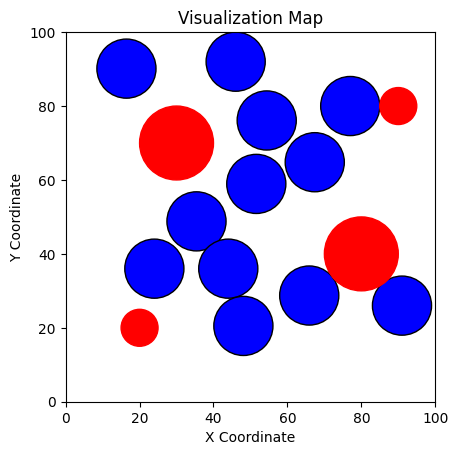

--------------------------------------------------------------------------------------------------------------------------------------
Generation  70 : [[63, 47], [9, 54], [12, 36], [50.16145575966516, 23.656132741116807], [65, 9], [34.199999999999996, 42.599999999999994], [70.12608049424746, 65.93553354980239], [21.193879290637483, 90.68784370076528], [41, 85], [70.24515440092459, 24.563915754588617], [51.0011680766224, 66.46082985581681], [61.03763969175522, 79.86353998812784], [35.4, 48.8], [46, 92], [44, 36], [48.0877939423788, 20.508761058738298], [91, 26], [24, 36], [67.4, 64.8], [16.44784608421656, 90.12549100109328], [77, 80], [65.90586270775103, 28.731726481587394], [51.58071953178701, 58.93425833865481], [54.39999999999999, 76.1], [2.525908226293611, 56.63394449628325], [48, 17], [39.19494691450497, 46.51938490147562], [55.0725760579789, 30.033271346493574], [51.2441338664057, -4.5150045180152665], [57.22864042723458, 62.496487107080156], [75.05521944349721, 65.2978151417324]

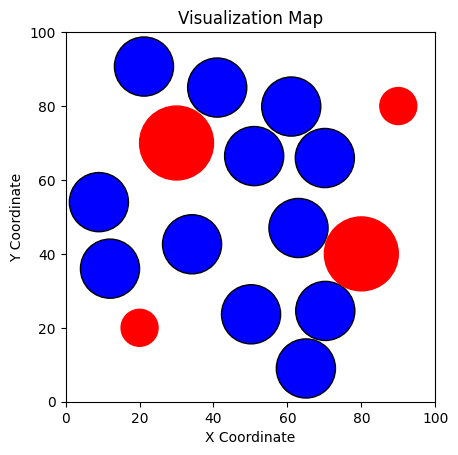

--------------------------------------------------------------------------------------------------------------------------------------
Generation  71 : [[45, 88], [36.3, 28.099999999999998], [31.036462840153476, 43.36356943103293], [53.599239968484774, 28.12012976488054], [55.37089370648398, -0.4605031626106868], [50.320048299064204, 56.52754097495611], [73.57647775872228, 65.4891306641534], [88, 10], [13, 87], [70, 18], [60.520144684794666, 77.98054777628542], [67.17756743652825, 95.74383711511652], [63, 47], [9, 54], [12, 36], [50.16145575966516, 23.656132741116807], [65, 9], [34.199999999999996, 42.599999999999994], [70.12608049424746, 65.93553354980239], [21.193879290637483, 90.68784370076528], [41, 85], [70.24515440092459, 24.563915754588617], [51.0011680766224, 66.46082985581681], [61.03763969175522, 79.86353998812784], [-0.07847963491067933, 48.40421342607245], [55, 86], [28, 35], [55.05277249633233, 31.543028453918623], [46.82945933487644, -6.404459053320305], [58.2187312032178

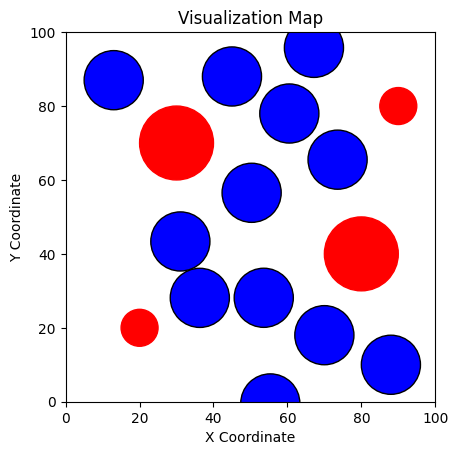

--------------------------------------------------------------------------------------------------------------------------------------
Generation  72 : [[10, 71], [86, 92], [16.799999999999997, 35.7], [78, 22], [59.548837800462934, 4.378662284003909], [41.40561936096535, 46.04645760597687], [72.3371703444161, 64.4434389528229], [20.91729543836221, 93.90555550476805], [49, 91], [54.57160808064721, 31.29474102821203], [57.62360103318592, 69.75200342451852], [66.29517057752905, 87.6846090881723], [17.599987922357045, 42.469054561117666], [53, 12], [74, 72], [83, 58], [5.2393855824059425, 67.45675480282364], [55, 72], [40.53181822492371, 43.51542559610762], [76, 87], [61, 43], [79.59071062759408, 15.849598054176397], [24.259483836337587, 88.26628037672694], [49.610487427209726, 87.84604091835818], [17.599987922357045, 42.469054561117666], [53, 12], [74, 72], [83, 58], [5.2393855824059425, 67.45675480282364], [55, 72], [40.53181822492371, 43.51542559610762], [76, 87], [61, 43], [79.59071062

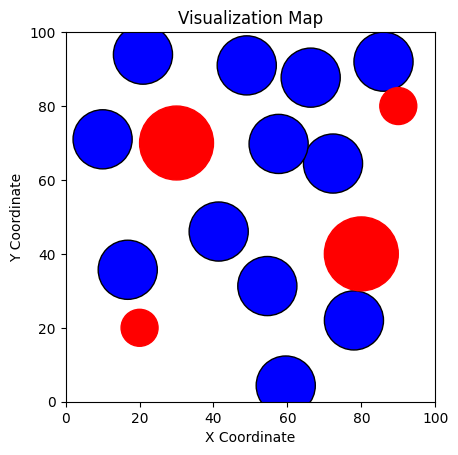

--------------------------------------------------------------------------------------------------------------------------------------
Generation  73 : [[17.599987922357045, 42.46905456111766], [52.99999999999999, 11.999999999999998], [74.0, 72.0], [83.0, 57.99999999999999], [5.2393855824059425, 67.45675480282364], [55.0, 72.0], [40.53181822492371, 43.51542559610762], [76.0, 87.0], [61.0, 43.0], [79.59071062759408, 15.849598054176397], [24.259483836337584, 88.26628037672694], [49.61048742720972, 87.84604091835818], [10, 71], [86, 92], [16.799999999999997, 35.7], [78, 22], [59.548837800462934, 4.378662284003909], [41.40561936096535, 46.04645760597687], [72.3371703444161, 64.4434389528229], [20.91729543836221, 92.0], [49, 91], [54.57160808064721, 31.29474102821203], [57.62360103318592, 69.75200342451852], [66.29517057752905, 87.6846090881723], [13.228486777757507, 37.452196654631365], [46.27725628191593, 3.690550549982861], [68, 54], [88.92684867452195, 57.407246887845595], [11, 62], [64

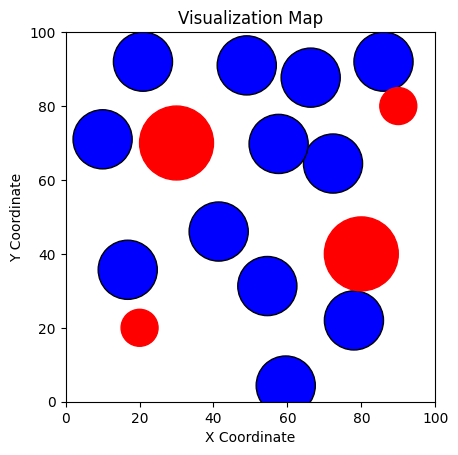

--------------------------------------------------------------------------------------------------------------------------------------
Generation  74 : [[14.539937121137367, 38.95725402657725], [48.29407939734115, 6.183385384988002], [69.8, 59.39999999999999], [87.14879407216536, 57.58507282149191], [9.271815674721783, 63.637026440847094], [74, 82], [47.86989895805793, 52.40152374827981], [25, 53], [60.908370702715516, 40.97556939433032], [88.53733748008929, 23.497603112063434], [33.15311336651847, 98.41364343288228], [57.73294433856311, 81.27382088032327], [10, 71], [86, 92], [16.799999999999997, 35.7], [78, 22], [59.548837800462934, 4.378662284003909], [41.40561936096535, 46.04645760597687], [72.3371703444161, 64.4434389528229], [20.91729543836221, 92.0], [49, 91], [54.57160808064721, 31.29474102821203], [57.62360103318592, 69.75200342451852], [66.29517057752905, 87.6846090881723], [9.888092537778391, 45.071098255398596], [66.62142527234721, 11.028491187754312], [36, 16], [90.0051740

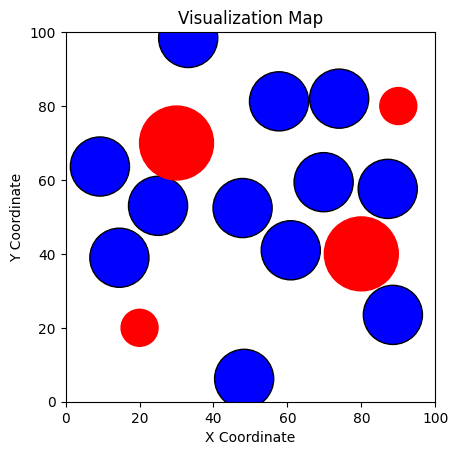

--------------------------------------------------------------------------------------------------------------------------------------
Generation  75 : [[25, 90], [59.6058555781388, 31.9283697694916], [43, 33], [10, 31], [24.354922312444128, 45.85951719379413], [88, 63], [77, 86], [12, 59], [57.33585949190086, 55.982898576031225], [72, 12], [40.4942596665187, 89.81515143037315], [60.301612210252884, 83.19705734267797], [14.539937121137367, 38.95725402657725], [48.29407939734115, 6.183385384988002], [69.8, 59.39999999999999], [87.14879407216536, 57.58507282149191], [9.271815674721783, 63.637026440847094], [74, 82], [47.86989895805793, 52.40152374827981], [25, 53], [60.908370702715516, 40.97556939433032], [88.53733748008929, 23.497603112063434], [33.15311336651847, 92.0], [57.73294433856311, 81.27382088032327], [14.724035081710367, 51.18624196351986], [58.050895561946156, 7.780171163679949], [78, 85], [103.47604658868877, 64.7794672294405], [8.680351717463768, 74.59542720770398], [39, 91

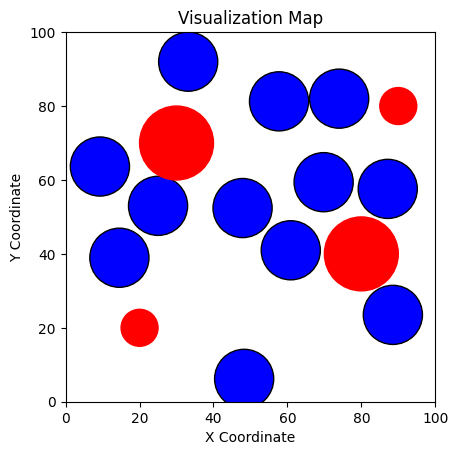

--------------------------------------------------------------------------------------------------------------------------------------
Generation  76 : [[8, 33], [58.51738356680394, 15.024630745423442], [68, 73], [40, 25], [59, 30], [18, 46], [83, 60], [13, 91], [58.32681876177602, 60.83743642048082], [86.43230482604145, 18.475037882708357], [41.69911583098831, 40.42276388776722], [57.57634803229041, 88.2045029338832], [14.539937121137367, 38.95725402657725], [48.29407939734115, 6.183385384988002], [69.8, 59.39999999999999], [87.14879407216536, 57.58507282149191], [9.271815674721783, 63.637026440847094], [74, 82], [47.86989895805793, 52.40152374827981], [25, 53], [60.908370702715516, 40.97556939433032], [88.53733748008929, 23.497603112063434], [33.15311336651847, 92.0], [57.73294433856311, 81.27382088032327], [37, 26], [30, 9], [53.57812662243231, 30.38685859355881], [12.2791703077656, 34.34947680035843], [30.357554995761035, 49.03195658074901], [79.46285648332464, 73.11400530458698], 

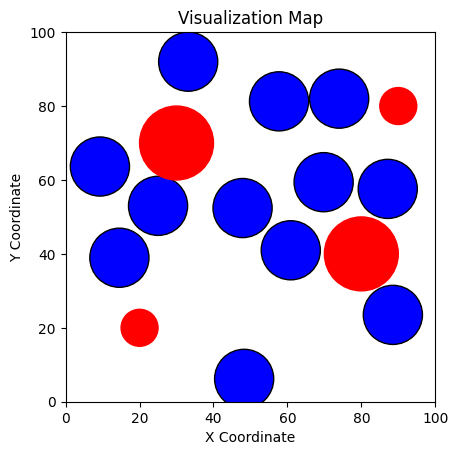

--------------------------------------------------------------------------------------------------------------------------------------
Generation  77 : [[9.961981136341208, 34.787176207973175], [55.450392315965104, 12.37225713729281], [9, 62], [76, 74], [44.08154470241653, 40.09110793225413], [22, 54], [38, 91], [40, 20], [59.10128434405786, 54.87887631263567], [87.06381462225579, 19.98180745151488], [59, 39], [57.62332692417222, 86.12529831781522], [14.539937121137367, 38.95725402657725], [48.29407939734115, 6.183385384988002], [69.8, 59.39999999999999], [87.14879407216536, 57.58507282149191], [9.271815674721783, 63.637026440847094], [74, 82], [47.86989895805793, 52.40152374827981], [25, 53], [60.908370702715516, 40.97556939433032], [88.53733748008929, 23.497603112063434], [33.15311336651847, 92.0], [57.73294433856311, 81.27382088032327], [0, 41.275350177347356], [56.57237491925166, 7.072554550579136], [79, 11], [81, 92], [38, 42], [19.833387377345012, 43.32189720219303], [92.0, 58.70

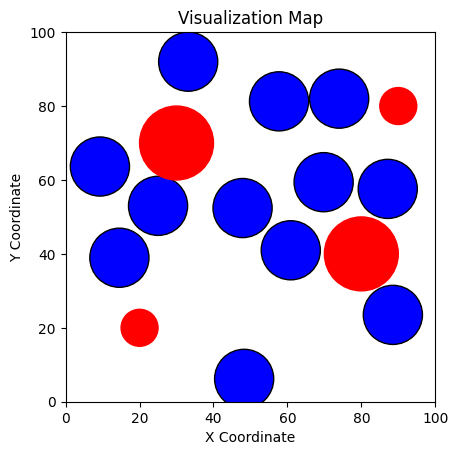

--------------------------------------------------------------------------------------------------------------------------------------
Generation  78 : [[10.177955984796156, 39.65268287180828], [50.7775680539143, 6.450136134665341], [55, 23], [85.30415585051574, 67.90955097504434], [40, 26], [8, 85], [53, 69], [8, 62], [63.199908590663654, 50.78482202331651], [75.4761362360625, 21.5483221784444], [29, 39], [59.815682066481926, 84.49167461622628], [14.539937121137367, 38.95725402657725], [48.29407939734115, 6.183385384988002], [69.8, 59.39999999999999], [87.14879407216536, 57.58507282149191], [9.271815674721783, 63.637026440847094], [74, 82], [47.86989895805793, 52.40152374827981], [25, 53], [60.908370702715516, 40.97556939433032], [88.53733748008929, 23.497603112063434], [33.15311336651847, 92.0], [57.73294433856311, 81.27382088032327], [54, 24], [70.38757911555103, 15.557586356772307], [11.525458802140582, 60.22521173506348], [88, 66], [36.34416524466273, 33.51995359640245], [10, 43],

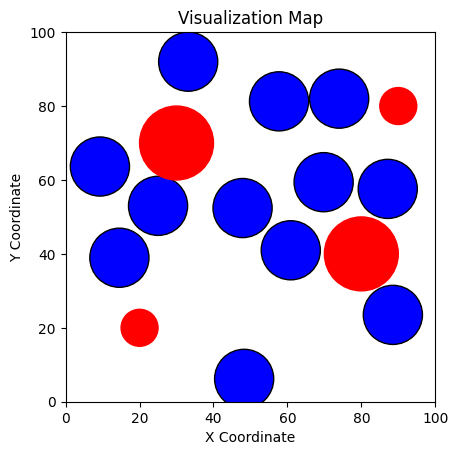

--------------------------------------------------------------------------------------------------------------------------------------
Generation  79 : [[72, 69], [64.50457579706001, 12.825351290140215], [23, 38], [87.19124675515471, 66.5728652925133], [37.44091567126391, 31.263967517481717], [9.4, 55.599999999999994], [56, 25], [47, 79], [54.65997257719909, 59.33544660699495], [87.04284087081874, 22.319837647192177], [51.54261741328828, 43.82213708552629], [63.37596966405084, 85.66001450701282], [14.539937121137367, 38.95725402657725], [48.29407939734115, 6.183385384988002], [69.8, 59.39999999999999], [87.14879407216536, 57.58507282149191], [9.271815674721783, 63.637026440847094], [74, 82], [47.86989895805793, 52.40152374827981], [25, 53], [60.908370702715516, 40.97556939433032], [88.53733748008929, 23.497603112063434], [33.15311336651847, 92.0], [57.73294433856311, 81.27382088032327], [45, 91], [44.34897153241308, 0], [49.18873334214922, 29.715704694743714], [49, 55], [37.75170910397

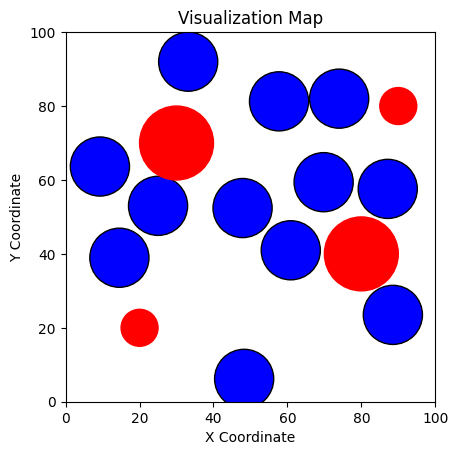

--------------------------------------------------------------------------------------------------------------------------------------
Generation  80 : [[33, 15], [59.641426877144355, 10.83276151859455], [15, 89], [87.1785109502579, 63.876527551206884], [28.99018567230127, 40.975885194491326], [11, 69], [53.560969687417376, 33.22045712448394], [8, 9], [80, 89], [87.49118985359989, 22.673167286653552], [46.02576619925733, 58.2754959598684], [61.68306206640452, 84.34415641900594], [14.539937121137367, 38.95725402657725], [48.29407939734115, 6.183385384988002], [69.8, 59.39999999999999], [87.14879407216536, 57.58507282149191], [9.271815674721783, 63.637026440847094], [74, 82], [47.86989895805793, 52.40152374827981], [25, 53], [60.908370702715516, 40.97556939433032], [88.53733748008929, 23.497603112063434], [33.15311336651847, 92.0], [57.73294433856311, 81.27382088032327], [11, 8], [24, 88], [60, 23], [25, 32], [79, 66], [16.64785877591757, 48.20670831544402], [48.169009375394, 38.78359894

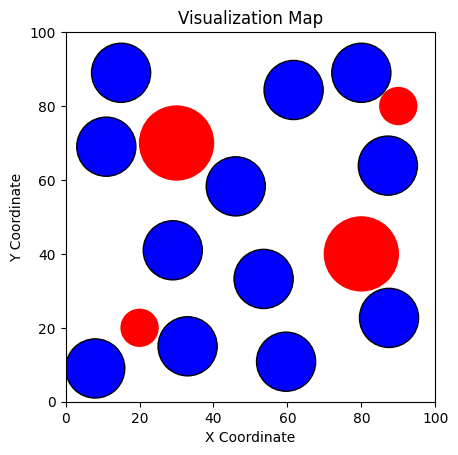

--------------------------------------------------------------------------------------------------------------------------------------
Generation  81 : [[12, 72], [80, 88], [61, 9], [44.599999999999994, 18.7], [37, 52], [12, 35], [52.950702812618196, 41.03507968475986], [19.4, 55.5], [44.199999999999996, 84.1], [86.98283515919556, 17.013626315919108], [59.882486371754766, 55.50038433153457], [62.79479719980441, 87.8], [50, 73], [8, 37], [47, 54], [56.555675167875215, 26.068904413287136], [79, 65], [22.6303446387001, 46.557711677329486], [37, 11], [0.38799410635202314, 82.28859179825244], [43.989642019535495, 92.0], [92.0, 12.145275756882036], [60.83931643207694, 60.67315009261303], [74.07014365183629, 81.32343722721234], [50, 73], [8, 37], [47, 54], [56.555675167875215, 26.068904413287136], [79, 65], [22.6303446387001, 46.557711677329486], [37, 11], [0.38799410635202314, 82.28859179825244], [43.989642019535495, 92.0], [92.0, 12.145275756882036], [60.83931643207694, 60.67315009261303], 

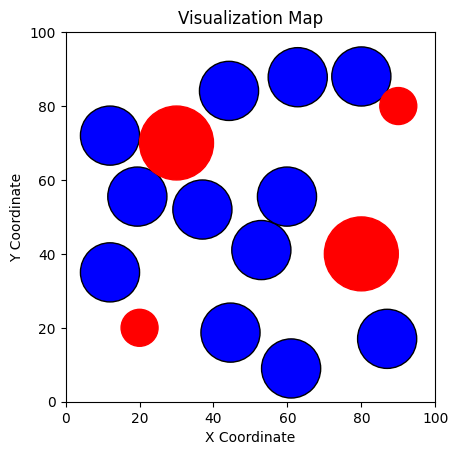

--------------------------------------------------------------------------------------------------------------------------------------
Generation  82 : [[75, 9], [83, 59], [51.2, 40.5], [15, 89], [30, 32], [19.44124124709007, 43.09039817413064], [41.78521084378546, 20.010523905427956], [6.091595874446416, 74.25201425877671], [44.052749413674846, 89.63], [90.49485054775866, 13.605780924593157], [60.55226741398028, 59.12132036428949], [70.68753971622672, 83.26640605904863], [12, 72], [80, 88], [61, 9], [44.599999999999994, 18.7], [37, 52], [12, 35], [52.950702812618196, 41.03507968475986], [19.4, 55.5], [44.199999999999996, 84.1], [86.98283515919556, 17.013626315919108], [59.882486371754766, 55.50038433153457], [62.79479719980441, 87.8], [51, 33], [6.968434114540658, 37.07455448634818], [78, 10], [49, 18], [39, 44], [18.865841831793393, 46.50021564695422], [35, 8], [3.245698499836191, 81.3873044917409], [51.41273673497194, 98.41554519606265], [105.34392027711152, 17.675066129154693], [72

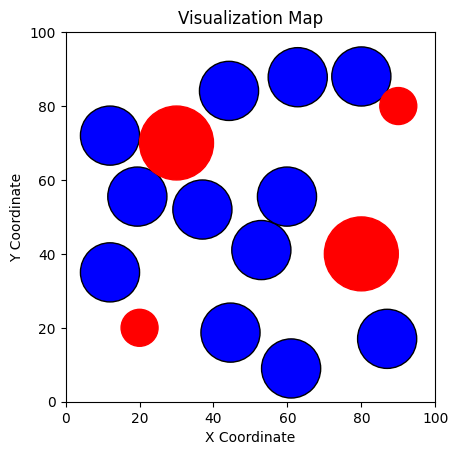

--------------------------------------------------------------------------------------------------------------------------------------
Generation  83 : [[67.8, 16.2], [10, 60], [59.239999999999995, 31.349999999999998], [78, 66], [32.7, 35.599999999999994], [19.268621422501063, 44.11334341597771], [39.749647590649815, 16.407366733799567], [5.237826662063348, 76.39260132866596], [46.26074561006397, 92.26566355881879], [94.94957146656452, 14.826566485961617], [64.02824941277689, 58.83212824973995], [72.21927198368189, 83.38251528147876], [12, 72], [80, 88], [61, 9], [44.599999999999994, 18.7], [37, 52], [12, 35], [52.950702812618196, 41.03507968475986], [19.4, 55.5], [44.199999999999996, 84.1], [86.98283515919556, 17.013626315919108], [59.882486371754766, 55.50038433153457], [62.79479719980441, 87.8], [60.97492603208768, 46.024832994829794], [1.8964364547317096, 34.37064327260509], [9, 59], [47.18686354016995, 22.35334985348645], [42, 91], [29.551549599638705, 45.550608155898225], [32.295

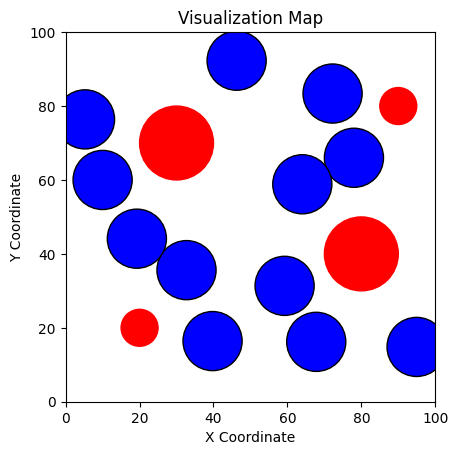

--------------------------------------------------------------------------------------------------------------------------------------
Generation  84 : [[71, 24], [83, 92], [59.599999999999994, 10.399999999999999], [24, 89], [66.39999999999999, 63.199999999999996], [47, 91], [23.585210843785458, 40.31052390542796], [92, 59], [9, 48], [92, 20], [65, 81], [44.03843915994132, 33.34], [54.96270118795983, 90.90639786052435], [52, 67], [72, 74], [14.795510556319176, 0.9063043575448386], [81.814877701832, 59.05750653207034], [8, 30], [18.894195894895283, 47.25059717930839], [62.628993999079285, 35.444602998063885], [84.95213136819457, 14.07702931020265], [28.458113217450396, 92.0], [48.017215618047366, 43.076829539318375], [49.86628007298201, 7.378535932886771], [54.96270118795983, 90.90639786052435], [52, 67], [72, 74], [14.795510556319176, 0.9063043575448386], [81.814877701832, 59.05750653207034], [8, 30], [18.894195894895283, 47.25059717930839], [62.628993999079285, 35.444602998063885], [8

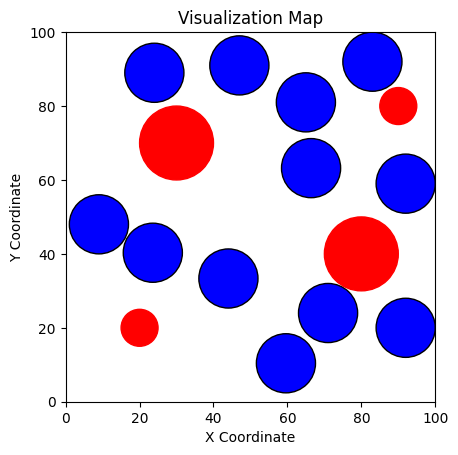

--------------------------------------------------------------------------------------------------------------------------------------
Generation  85 : [[92, 26], [76, 88], [35, 90], [58, 82], [45, 10], [66, 11], [47.66825876846858, 28.17517915379252], [11, 46], [31.785639410458373, 33.623108793060794], [86, 68], [30, 50], [55.5598840218946, 63.81356077986602], [64.27810707478386, 50.77191001859205], [53, 83], [91, 15], [7.676401415992698, 83.59349275675736], [49.37068989389863, 28.551440760795874], [58.0443179949378, 67.0142278821954], [71.84897878359288, 13.300947082171252], [77, 79], [8.623050218116349, 34.19154452615521], [29.71319853556036, 35.649543169939236], [20, 53], [67.05258588312776, 92.0], [64.27810707478386, 50.77191001859205], [53, 83], [91, 15], [7.676401415992698, 83.59349275675736], [49.37068989389863, 28.551440760795874], [58.0443179949378, 67.0142278821954], [71.84897878359288, 13.300947082171252], [77, 79], [8.623050218116349, 34.19154452615521], [29.71319853556036

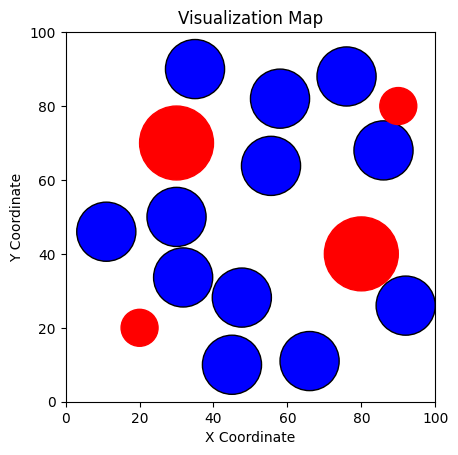

--------------------------------------------------------------------------------------------------------------------------------------
Generation  86 : [[90, 17], [73, 19], [38, 92], [80, 91], [70, 78], [91, 62], [53.05469363507786, 19.390284124651373], [54.599999999999994, 88.1], [22.886915065434902, 34.05746335784656], [43, 35], [29.799999999999997, 49.49999999999999], [52.31577576493832, 53.5], [92.0, 16.09398968264103], [71.94111386449225, 18.084242776530413], [50, 71], [75.27824651204341, 75.99850641727677], [8.833008145234537, 79.95719809704667], [3.8328406603860703, 28.160042062456416], [55.12858290315223, 19.848475955004016], [79, 59], [25.69569382324931, 46.61612107211795], [31, 88], [37, 20], [52.27526490745798, 38.7723753426647], [92.0, 16.09398968264103], [71.94111386449225, 18.084242776530413], [50, 71], [75.27824651204341, 75.99850641727677], [8.833008145234537, 79.95719809704667], [3.8328406603860703, 28.160042062456416], [55.12858290315223, 19.848475955004016], [79, 59]

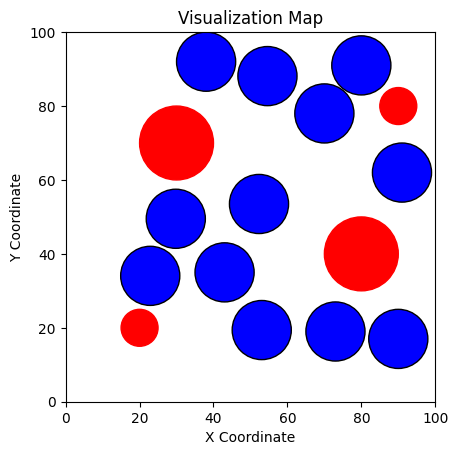

--------------------------------------------------------------------------------------------------------------------------------------
Generation  87 : [[91.99999999999999, 16.09398968264103], [71.94111386449225, 18.08424277653041], [50.0, 71.0], [75.27824651204341, 75.99850641727677], [8.833008145234537, 79.95719809704667], [3.8328406603860703, 28.160042062456416], [55.12858290315222, 19.848475955004016], [79.0, 59.0], [25.69569382324931, 46.61612107211795], [31.0, 88.0], [37.0, 20.0], [52.275264907457974, 38.7723753426647], [10.91824835379002, 62.36749308421268], [81.91146682920856, 2.0155011783243406], [48.55210243823642, 92.0], [16.089194200390754, 86.82159350027547], [17, 36], [61, 50], [84.0634182009859, 17.0436508412678], [46, 8], [70.22304122739573, 81.4343445405251], [91, 62], [63, 66], [60.71597518578138, 27.311559980516357], [10.91824835379002, 62.36749308421268], [81.91146682920856, 2.0155011783243406], [48.55210243823642, 92.0], [16.089194200390754, 86.82159350027547], [17

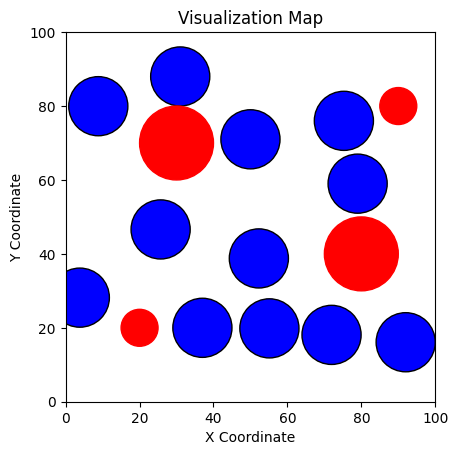

--------------------------------------------------------------------------------------------------------------------------------------
Generation  88 : [[10.91824835379002, 62.36749308421268], [81.91146682920856, 2.0155011783243406], [48.55210243823642, 91.99999999999999], [16.089194200390754, 86.82159350027547], [17.0, 36.0], [61.0, 50.0], [84.0634182009859, 17.043650841267798], [45.99999999999999, 8.0], [70.22304122739573, 81.4343445405251], [91.0, 62.0], [62.99999999999999, 66.0], [60.715975185781375, 27.311559980516357], [91.99999999999999, 16.09398968264103], [71.94111386449225, 18.08424277653041], [50.0, 71.0], [75.27824651204341, 75.99850641727677], [8.833008145234537, 79.95719809704667], [3.8328406603860703, 28.160042062456416], [55.12858290315222, 19.848475955004016], [79.0, 59.0], [25.69569382324931, 46.61612107211795], [31.0, 88.0], [37.0, 20.0], [52.275264907457974, 38.7723753426647], [52, 79], [58, 45], [51.490427602388436, 97.23489639625767], [17.41510093457847, 82.646755

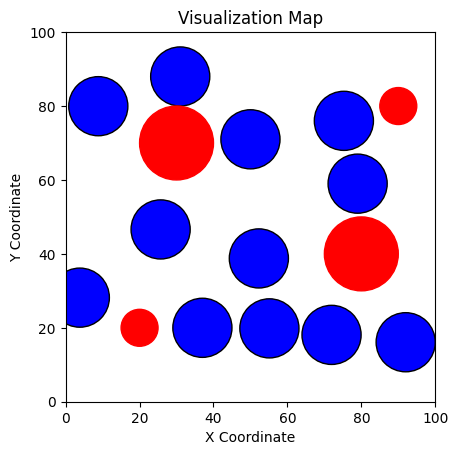

--------------------------------------------------------------------------------------------------------------------------------------
Generation  89 : [[88, 58], [60, 9], [48.98647170676549, 85.69999999999999], [12, 8], [14.54990244357036, 49.187159429114004], [10, 68], [75.38296761163579, 17.88509837538866], [33, 41], [56.864837006151795, 70.98887750000296], [73.0, 69.8], [55.199999999999996, 52.199999999999996], [58.183762102284355, 30.74980458916086], [91.99999999999999, 16.09398968264103], [71.94111386449225, 18.08424277653041], [50.0, 71.0], [75.27824651204341, 75.99850641727677], [8.833008145234537, 79.95719809704667], [3.8328406603860703, 28.160042062456416], [55.12858290315222, 19.848475955004016], [79.0, 59.0], [25.69569382324931, 46.61612107211795], [31.0, 88.0], [37.0, 20.0], [52.275264907457974, 38.7723753426647], [2.867033325534063, 58.74724538976035], [85.74809050031426, 5.964117330862578], [76, 90], [8.85013861471753, 92.0], [23.552360873527167, 34.860845655781205], [56

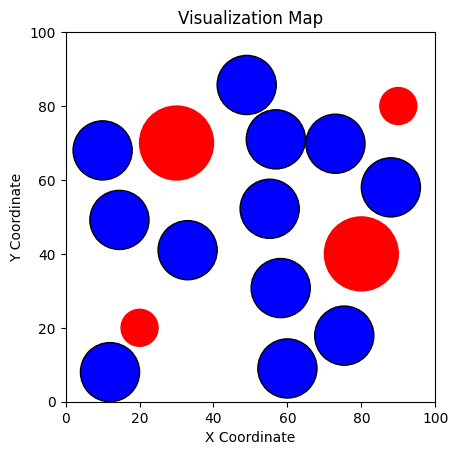

--------------------------------------------------------------------------------------------------------------------------------------
Generation  90 : [[75.19999999999999, 67.1281969047923], [54, 91], [38, 91], [91, 9], [92, 57], [83, 91], [12, 61], [45, 30], [68, 82], [58.99999999999999, 41.8], [40.5, 45.9], [60.48257947223739, 59.93171260279941], [22, 92], [23, 49], [3.022697588373182, 92.0], [90, 18], [89, 67], [59.394698902078886, 7.4719209627589365], [52, 28], [50, 67], [57.78683417403712, 87.89148569095815], [78, 89], [48.424239286100175, 50.00108328725106], [74.45855588533064, 74.50910635223738], [22, 92], [23, 49], [3.022697588373182, 92.0], [90, 18], [89, 67], [59.394698902078886, 7.4719209627589365], [52, 28], [50, 67], [57.78683417403712, 87.89148569095815], [78, 89], [48.424239286100175, 50.00108328725106], [74.45855588533064, 74.50910635223738]]
Generation  90  Objective Function : [3983.5394847518573, 3979.5394847518573, 3979.5394847518573]
------------------------------

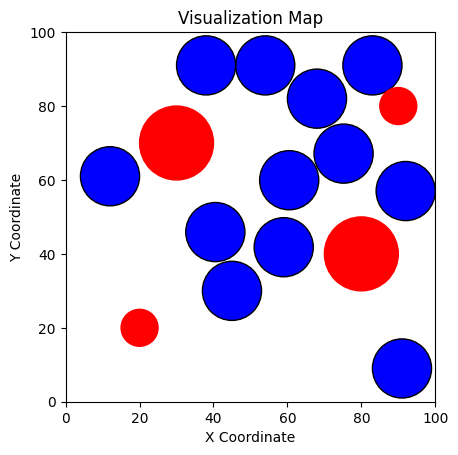

--------------------------------------------------------------------------------------------------------------------------------------
Generation  91 : [[11, 84], [34, 31], [27.50680927651195, 91.3], [90.69999999999999, 11.7], [91.1, 60.0], [80, 71], [24.0, 51.099999999999994], [54, 28], [64.93605025221113, 83.76744570728744], [8, 49], [42.87727178583005, 47.13032498617531], [64.67537239616536, 64.30493072763079], [75.19999999999999, 67.1281969047923], [54, 91], [38, 91], [91, 9], [92, 57], [83, 91], [12, 61], [45, 30], [68, 82], [58.99999999999999, 41.8], [40.5, 45.9], [60.48257947223739, 59.93171260279941], [59, 62], [58, 38], [4.678765883212646, 93.68171768582681], [92.42860525957188, 13.890229054137766], [80, 60], [67.44099324818434, 20.51310692102196], [50.274679509483875, 18.592874995462154], [56.57785018277464, 80.47265928395922], [63.77777579419603, 102.36304260732587], [41, 90], [11, 67], [71.04036038572998, 83.61022156096698]]
Generation  91  Objective Function : [3983.539484

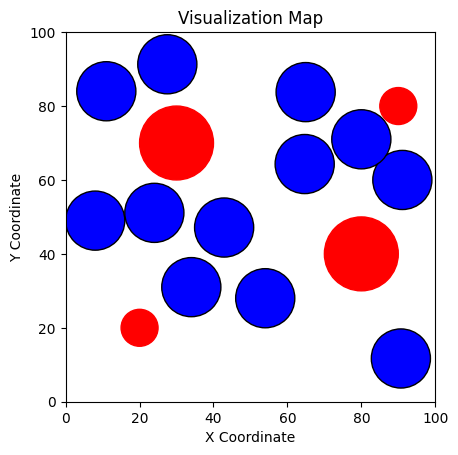

--------------------------------------------------------------------------------------------------------------------------------------
Generation  92 : [[78, 19], [49, 50], [11.527178901202438, 92.96720238007876], [91.91002368170031, 13.233160337896436], [83.33, 60.0], [83, 92], [42.3922756566387, 28.345012496823507], [55.804495127942246, 64.73086149877145], [64.12525813160056, 96.78436353731432], [57, 12], [34, 52], [69.1308639888606, 77.81863431096612], [11, 84], [34, 31], [27.50680927651195, 91.3], [90.69999999999999, 11.7], [91.1, 60.0], [80, 71], [24.0, 51.099999999999994], [54, 28], [64.93605025221113, 83.76744570728744], [8, 49], [42.87727178583005, 47.13032498617531], [64.67537239616536, 64.30493072763079], [59.7617826721709, 59.16318850423441], [61.60664412389819, 42.98636589984753], [3.701438028206505, 89.64853531655011], [26, 41], [45, 49], [77.92474062274587, 10.923011209922004], [54.440035718215874, 12.984982849980074], [48.64120907930594, 74.82988258853435], [36, 20], [52

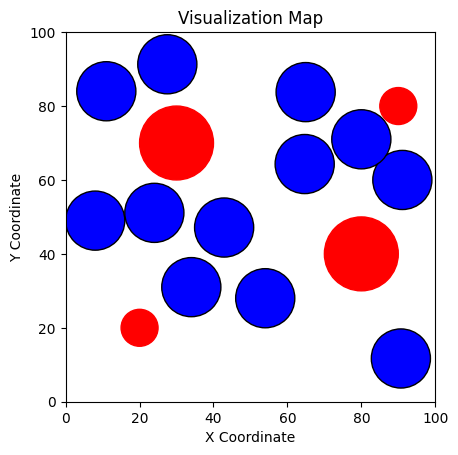

--------------------------------------------------------------------------------------------------------------------------------------
Generation  93 : [[49, 83], [86, 11], [20.365197902020316, 90.80456059496503], [71.28999999999999, 20.49], [10, 55], [12, 39], [88, 58], [52.39236272379178, 42.0489647765603], [28, 35], [49, 20], [32.96464554736339, 52.2218237884768], [65.67276067731575, 68.11345150934154], [11, 84], [34, 31], [27.50680927651195, 91.3], [90.69999999999999, 11.7], [91.1, 60.0], [80, 71], [24.0, 51.099999999999994], [54, 28], [64.93605025221113, 83.76744570728744], [8, 49], [42.87727178583005, 47.13032498617531], [64.67537239616536, 64.30493072763079], [65, 76], [51.99038454392897, 47.369598276839575], [8.731239403430695, 86.75820105827519], [92.0, 16.575484683991128], [78.79419512978426, 69.87717363367727], [24, 53], [36.06262540194979, 31.719221286183213], [48.130500198953015, 75.6954104015441], [8, 56], [63.40400447975845, 13.977410474670327], [45, 11], [66.37455144758

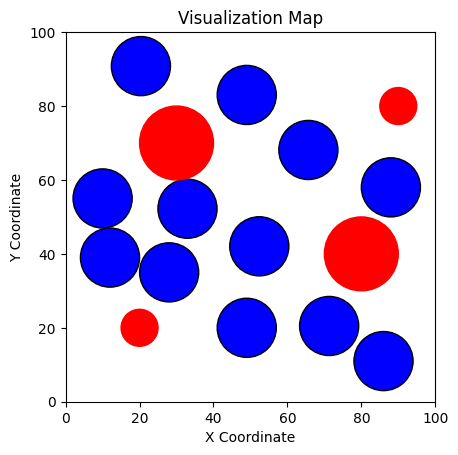

--------------------------------------------------------------------------------------------------------------------------------------
Generation  94 : [[37, 92], [31, 37], [12.221426953007581, 87.97210891928214], [85.78699999999999, 17.74983927879379], [68, 67], [84, 60], [51.64383778136485, 39.603454900328245], [49.40905895640464, 65.60147671404896], [14.0, 49.699999999999996], [59.082803135830915, 15.784187332269228], [41.38939366420901, 23.366547136543037], [66.16401421650438, 84.83403545280245], [49, 83], [86, 11], [20.365197902020316, 90.80456059496503], [71.28999999999999, 20.49], [10, 55], [12, 39], [88, 58], [52.39236272379178, 42.0489647765603], [28, 35], [49, 20], [32.96464554736339, 52.2218237884768], [65.67276067731575, 68.11345150934154], [55.31749433934651, 81.58490458168473], [46.33215520854046, 59.30186434947785], [4.418569655911755, 95.45424769927257], [104.99913628790141, 17.54827965049845], [32, 26], [28.109354954751744, 45.749767725505066], [44.53425852890228, 37.8

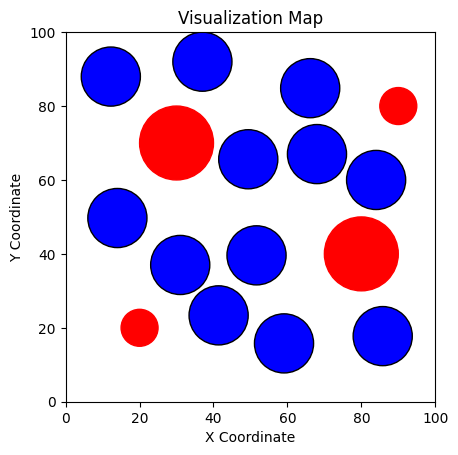

--------------------------------------------------------------------------------------------------------------------------------------
Generation  95 : [[86, 58], [10, 55], [68, 67], [71, 87], [60, 10], [10, 34], [56, 78], [48.61770881713753, 56.714689432968086], [30, 88], [78.39999999999999, 15.799999999999999], [44.189393664209014, 22.666547136543038], [61.70182820319472, 43.534035452802456], [30, 10], [50.9219979689676, 49.87599968643936], [88, 56], [16.429749373874607, 46.23830045324636], [73.09172640776491, 68.0304989675577], [34, 44], [79, 92], [57.41832197689081, 66.5279932649614], [18.45875290400121, 92.0], [89.47416233008317, 24.878541480697127], [47.99158912474231, 3.815912810938684], [51, 83], [30, 10], [50.9219979689676, 49.87599968643936], [88, 56], [16.429749373874607, 46.23830045324636], [73.09172640776491, 68.0304989675577], [34, 44], [79, 92], [57.41832197689081, 66.5279932649614], [18.45875290400121, 92.0], [89.47416233008317, 24.878541480697127], [47.99158912474231, 

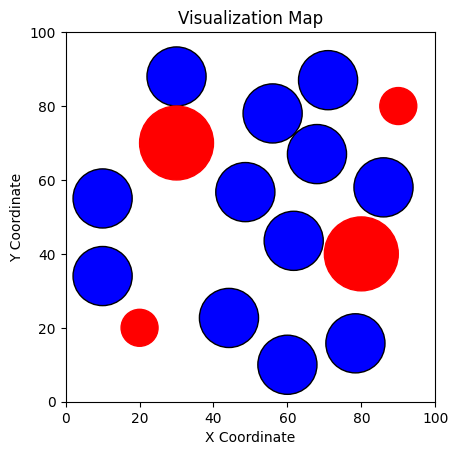

--------------------------------------------------------------------------------------------------------------------------------------
Generation  96 : [[28.599999999999998, 31.0], [47, 43], [71, 11], [12, 90], [71.62751792232947, 66.6091496902673], [57.099999999999994, 31.4], [55.199999999999996, 57.0], [73.22549659306725, 82.95839797948841], [42.637625871200356, 91.3], [33.142248699024954, 15.863562444209137], [12, 35], [23.0, 52.199999999999996], [51, 15], [33.715705566979175, 11.490863264812598], [20, 91], [92.0, 55.246896627056955], [69.03428158554314, 60.02555968235014], [66.62771739204483, 21.617433465841287], [39.5345009601382, 39.776795336931954], [85.9142660625848, 92.0], [61.92547525095756, 88.17343516400399], [8.689457019376016, 13.057218305581266], [55, 42], [17.007342231997182, 46.7982520924766], [51, 15], [33.715705566979175, 11.490863264812598], [20, 91], [92.0, 55.246896627056955], [69.03428158554314, 60.02555968235014], [66.62771739204483, 21.617433465841287], [39.534

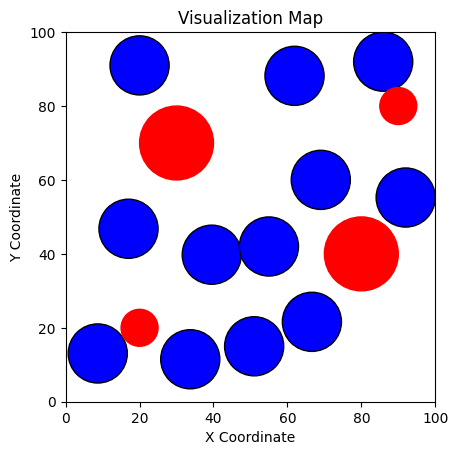

--------------------------------------------------------------------------------------------------------------------------------------
Generation  97 : [[73, 8], [14, 83], [41, 31], [33, 89], [70.84954702129357, 64.63407268789214], [59.95831521761344, 28.465230039752385], [50.50035028804145, 51.833038601079586], [77.03212743392251, 85.67087858564189], [48.42398068512752, 90.3620305492012], [88, 8], [12, 39], [21.202202669599153, 50.57947562774297], [51, 15], [33.715705566979175, 11.490863264812598], [20, 91], [92.0, 55.246896627056955], [69.03428158554314, 60.02555968235014], [66.62771739204483, 21.617433465841287], [39.5345009601382, 39.776795336931954], [85.9142660625848, 92.0], [61.92547525095756, 88.17343516400399], [8.689457019376016, 13.057218305581266], [55, 42], [17.007342231997182, 46.7982520924766], [41, 85], [57.19647127851633, 51.80624364691725], [78.02739912808335, 14.549547282490249], [20.18704354011098, 92.0], [66.40016062543724, 64.0289528725605], [48.65086228951876, 27

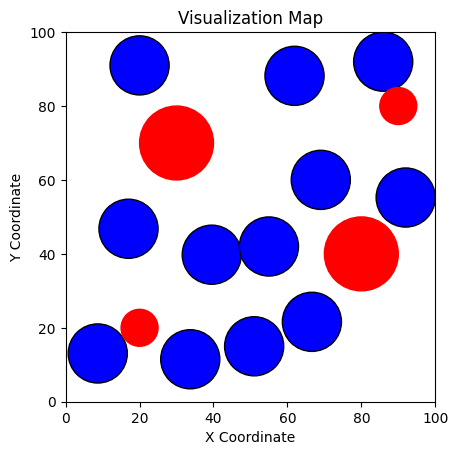

--------------------------------------------------------------------------------------------------------------------------------------
Generation  98 : [[51, 11], [83, 62], [68, 8], [9, 85], [67.190396913469, 62.82793491549738], [54.04391882027658, 25.602671565210613], [48.0651316980698, 58.30590437852863], [79.26308040662583, 90.6641433296442], [58.05016458842674, 85.31697988792611], [33.47511051528101, 11.845202810200943], [19.112590106611197, 34.82926119231629], [26.28960400971501, 50.71468012509494], [51, 15], [33.715705566979175, 11.490863264812598], [20, 91], [92.0, 55.246896627056955], [69.03428158554314, 60.02555968235014], [66.62771739204483, 21.617433465841287], [39.5345009601382, 39.776795336931954], [85.9142660625848, 92.0], [61.92547525095756, 88.17343516400399], [8.689457019376016, 13.057218305581266], [55, 42], [17.007342231997182, 46.7982520924766], [66.39104002440133, 0.5280261545802407], [52, 72], [33.50511851433163, 37.64410281114135], [14, 85], [47, 49], [69, 74], [

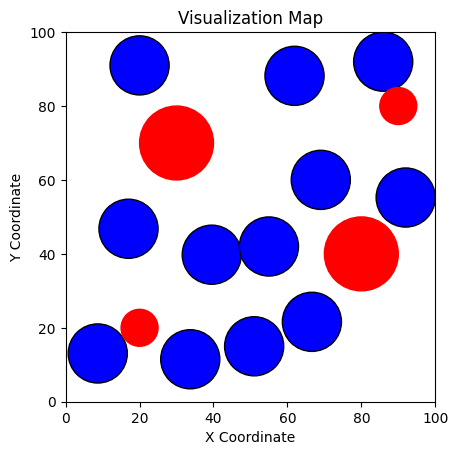

--------------------------------------------------------------------------------------------------------------------------------------
Generation  99 : [[55.61731200732039, 10.658407846374072], [9, 69], [86, 62], [87, 15], [62.4239971098802, 56.71789177764509], [22, 35], [50, 73], [85.4465349694771, 91.99999999999999], [58.63425161757616, 89.32140461480279], [33.68261991356321, 14.44827391837462], [40.227723572798574, 42.47636147005831], [15.205139562398028, 51.058776464733626], [51, 15], [33.715705566979175, 11.490863264812598], [20, 91], [92.0, 55.246896627056955], [69.03428158554314, 60.02555968235014], [66.62771739204483, 21.617433465841287], [39.5345009601382, 39.776795336931954], [85.9142660625848, 92.0], [61.92547525095756, 88.17343516400399], [8.689457019376016, 13.057218305581266], [55, 42], [17.007342231997182, 46.7982520924766], [42, 85], [83.0285720882512, 66.82629619257729], [63.61915543455487, 0], [22.637854286935045, 92.0], [46, 51], [49.245063320325556, 26.1633658106478

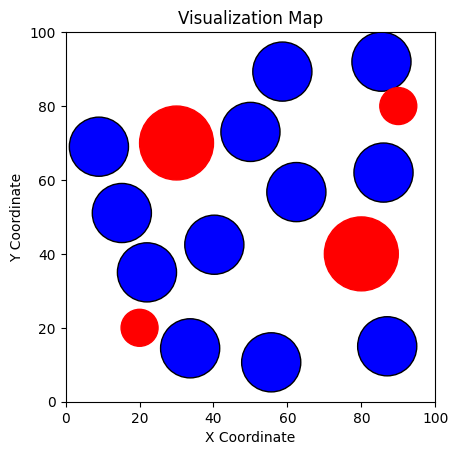

--------------------------------------------------------------------------------------------------------------------------------------
Generation  100 : [[11, 88], [40.10099389688542, 18.243604285368818], [80, 12], [10, 64], [59, 38], [66.13940217443138, 22.0322034260889], [59, 86], [76.33998624380935, 85.99999999999999], [68.24783267567028, 65.32140461480279], [8, 27], [42.1, 40.199999999999996], [53, 61], [9, 89], [45.33610327750742, 40.97997802857304], [92.0, 54.1952192471571], [16, 59], [67.21804956420543, 4.395655947766029], [62.78317442849199, 25.256633649331626], [79.19262926648692, 69.4972756737989], [63.66468742209889, 77.71844533485091], [84.07330020909974, 22.611216162541137], [40.434107065259894, 23.275496152080024], [26.01948992988901, 34.54506572099644], [74.16070284586968, 92.0], [9, 89], [45.33610327750742, 40.97997802857304], [92.0, 54.1952192471571], [16, 59], [67.21804956420543, 4.395655947766029], [62.78317442849199, 25.256633649331626], [79.19262926648692, 69.49727

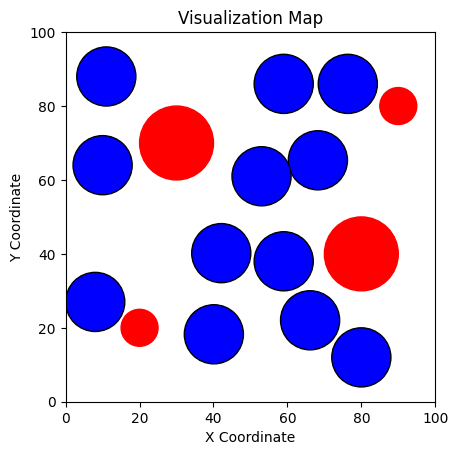

--------------------------------------------------------------------------------------------------------------------------------------
Generation  101 : [[32, 13], [11, 83], [65, 62], [15, 54], [19, 33], [61, 12], [59, 38], [89, 60], [77.7513101463698, 20.027851313778793], [38, 51], [36.213642950922306, 36.18154600469751], [70.81249199210876, 83.29999999999998], [63, 50], [21.898830913339047, 49.92910043693514], [49.76732998605853, 14.891269129464213], [14.584800481247218, 84.11273062546482], [51, 64], [86.13236543047883, 62.561310212538594], [8, 62], [47, 81], [34, 22], [72, 22], [52.78228792110256, 35.750795979543575], [63.12458828671737, 73.24209028199162], [63, 50], [21.898830913339047, 49.92910043693514], [49.76732998605853, 14.891269129464213], [14.584800481247218, 84.11273062546482], [51, 64], [86.13236543047883, 62.561310212538594], [8, 62], [47, 81], [34, 22], [72, 22], [52.78228792110256, 35.750795979543575], [63.12458828671737, 73.24209028199162]]
Generation  101  Objective 

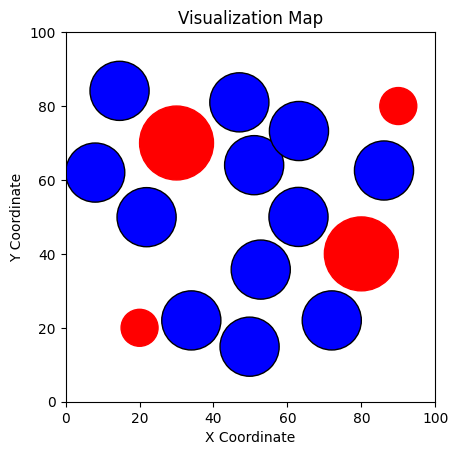

--------------------------------------------------------------------------------------------------------------------------------------
Generation  102 : [[31, 89], [18, 35], [75, 18], [8, 81], [41.4, 54.699999999999996], [33, 13], [81, 64], [11, 11], [8, 81], [61.8, 30.699999999999996], [47.811694430048476, 35.88002098708975], [65.43095939833478, 76.25946319739413], [63, 50], [21.898830913339047, 49.92910043693514], [49.76732998605853, 14.891269129464213], [14.584800481247218, 84.11273062546482], [51, 64], [86.13236543047883, 62.561310212538594], [8, 62], [47, 81], [34, 22], [72, 22], [52.78228792110256, 35.750795979543575], [63.12458828671737, 73.24209028199162], [8, 69], [11, 89], [91, 20], [6.327071039233365, 52.78535225486043], [15.649733081664984, 36.900563466331064], [66.21634121726166, 5.5497395728962795], [47, 77], [82.3702923893614, 66.61786602836686], [65, 68], [39, 25], [50.02846955072178, 40.295672535253], [66.80303865173552, 87.35429824413494]]
Generation  102  Objective F

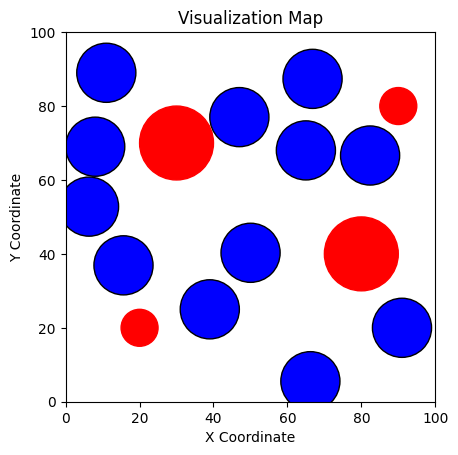

--------------------------------------------------------------------------------------------------------------------------------------
Generation  103 : [[10, 57], [33, 15], [78, 65], [12.609360336873053, 83.17891143782538], [43, 85], [52, 14], [85, 11], [76, 92], [26.199999999999996, 39.7], [68.94, 24.61], [51.291109873786326, 35.78956348180743], [63.81649962020259, 74.14730215661237], [8, 69], [11, 89], [91, 20], [6.327071039233365, 52.78535225486043], [15.649733081664984, 36.900563466331064], [66.21634121726166, 5.5497395728962795], [47, 77], [82.3702923893614, 66.61786602836686], [65, 68], [39, 25], [50.02846955072178, 40.295672535253], [66.80303865173552, 87.35429824413494], [39.05266760449121, 87.48554205333684], [64, 14], [86.10256500786608, 15.041728318579674], [90, 65], [46.75594230053545, 55.4477163458203], [46.88143470353212, 19.444959793938647], [75.02426229007796, 68.35189093963854], [8, 47], [17.10378709148233, 85.29949982627377], [23, 43], [43.628487300916255, 38.7241695

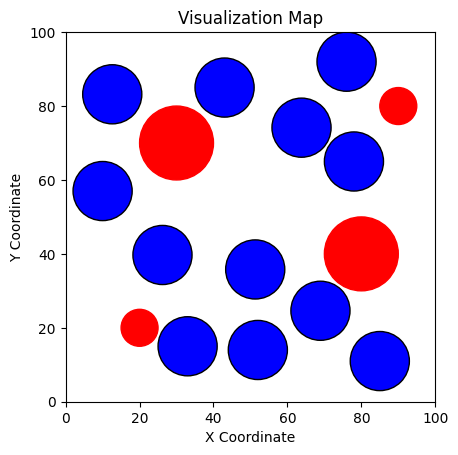

--------------------------------------------------------------------------------------------------------------------------------------
Generation  104 : [[13, 89], [60, 46], [15, 50], [29, 91], [89, 23], [48.417004292472484, 17.811471855757052], [49, 86], [91, 63], [64, 10], [37, 53], [45.92727407277727, 37.843787708460525], [59.624411918500314, 71.2003112473096], [10, 57], [33, 15], [78, 65], [12.609360336873053, 83.17891143782538], [43, 85], [52, 14], [85, 11], [76, 92], [26.199999999999996, 39.7], [68.94, 24.61], [51.291109873786326, 35.78956348180743], [63.81649962020259, 74.14730215661237], [14, 8], [56.39470488972812, 5.184807943197155], [94.26544868632013, 22.433296553982345], [92.2208927796217, 58.10917036107076], [73, 18], [53.55820024072913, 28.60797468386609], [81.83058988319236, 69.60636866587784], [51, 91], [26.44665518146717, 94.55847877980057], [20.79827329635998, 51.33833819810925], [53.52324297333081, 46.94513116302123], [51.109202047492474, 72.1735925742916]]
Generati

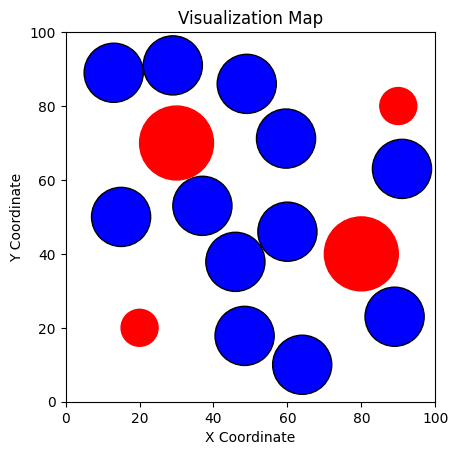

--------------------------------------------------------------------------------------------------------------------------------------
Generation  105 : [[22, 92], [14, 38], [65, 17], [83, 91], [84.19999999999999, 21.499999999999996], [14, 79], [56, 90], [79.0, 71.39999999999999], [11, 56], [32.139481988907995, 52.50150145943277], [48.206064742943326, 40.574190744828734], [57.069848957197955, 71.4922956454042], [13, 89], [60, 46], [15, 50], [29, 91], [89, 23], [48.417004292472484, 17.811471855757052], [49, 86], [91, 63], [64, 10], [37, 53], [45.92727407277727, 37.843787708460525], [59.624411918500314, 71.2003112473096], [31, 12], [62.64690759671788, 13.364781415891004], [82, 90], [71, 62], [86.93743440370537, 14.59338359351034], [48.373530478753906, 27.013074194391116], [10, 62], [61.7755791981415, 104.77673696933533], [28.184483592148055, 98.4720462186159], [33.03130341079619, 49.01215986915582], [22, 39], [53.32529877377877, 65.2632242437843]]
Generation  105  Objective Function : [3

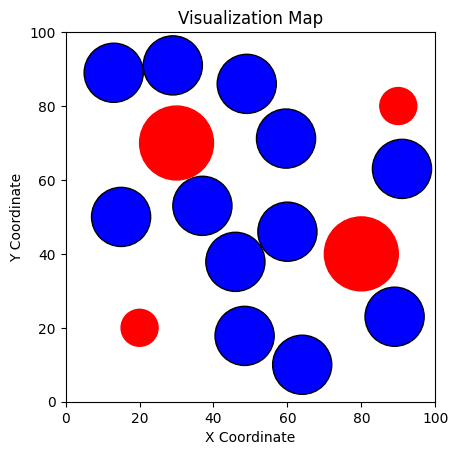

--------------------------------------------------------------------------------------------------------------------------------------
Generation  106 : [[71, 11], [28.594072279015364, 30.6094344247673], [14, 49], [64, 32], [85.0212303211116, 19.4280150780531], [27, 89], [60, 50], [73.83267375944244, 81.41302109080058], [37, 16], [55, 90], [40.344245320060324, 40.10193352138011], [55.9464839021722, 69.62357422491823], [13, 89], [60, 46], [15, 50], [29, 91], [89, 23], [48.417004292472484, 17.811471855757052], [49, 86], [91, 63], [64, 10], [37, 53], [45.92727407277727, 37.843787708460525], [59.624411918500314, 71.2003112473096], [80, 65], [54, 42], [64, 55], [65.5333532862907, 75.7871641354038], [89.25158733067066, 13.111748429376313], [43.536762392155715, 24.94130571650362], [1.2516928830172773, 74.58659842333421], [63.38203113497083, 101.7202475105214], [36.45881540583484, 109.86225608915892], [13, 47], [35.562561436687616, 48.68998850053467], [48.27115261648257, 65.23961851663371]]
Ge

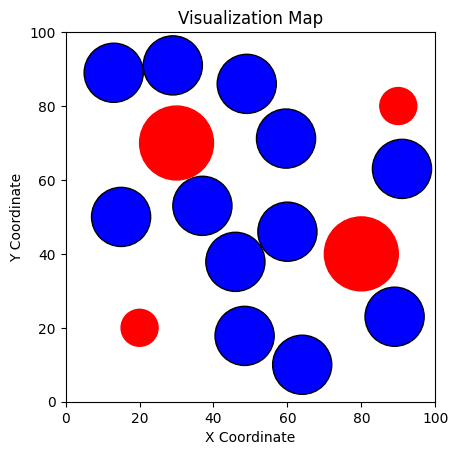

--------------------------------------------------------------------------------------------------------------------------------------
Generation  107 : [[75, 9], [37, 16], [14.7, 49.7], [19, 86], [87.80636909633347, 21.928404523415928], [57, 51], [63, 29], [71, 92], [55.9, 11.8], [36, 53], [44.25236544696219, 38.5212314523364], [58.52103351360188, 70.72729014059217], [13, 89], [60, 46], [15, 50], [29, 91], [89, 23], [48.417004292472484, 17.811471855757052], [49, 86], [91, 63], [64, 10], [37, 53], [45.92727407277727, 37.843787708460525], [59.624411918500314, 71.2003112473096], [84.93870271728883, 1.250192995402326], [83, 65], [6.128027419979187, 48.34163833221768], [65, 24], [85, 20], [26, 90], [8, 28], [77.14163377326881, 82.25193259217514], [37, 33], [46.89384328196582, 92.0], [48.529813961354165, 45.894778863338004], [63.88916025437766, 71.50569245815387]]
Generation  107  Objective Function : [3983.5394847518573, 3983.5394847518573, 3983.5394847518573]
-----------------------------

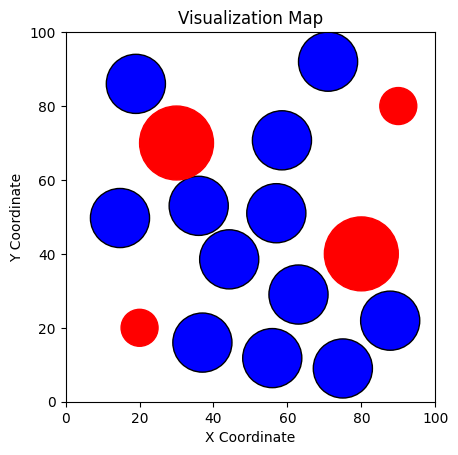

--------------------------------------------------------------------------------------------------------------------------------------
Generation  108 : [[91, 22], [74, 91], [76, 75], [9, 61], [66, 17], [38, 43], [50, 9], [45, 80], [8, 25], [53.96815298458974, 34.599999999999994], [20.858944188406248, 48.0684336590014], [63.966748076313294, 66.25170773744615], [35, 41], [24.074457216351888, 88.06272794456794], [14, 62], [8, 30], [7.668661426580733, 86.31521590761811], [90.154364142104, 14.934888592160657], [91, 61], [39, 24], [67.98991335240929, 83.8913675202504], [50.966582546537694, 2.8791533444791266], [4.123883293015838, 49.04223165270727], [68.78306488888867, 66.47886417056245], [35, 41], [24.074457216351888, 88.06272794456794], [14, 62], [8, 30], [7.668661426580733, 86.31521590761811], [90.154364142104, 14.934888592160657], [91, 61], [39, 24], [67.98991335240929, 83.8913675202504], [50.966582546537694, 2.8791533444791266], [4.123883293015838, 49.04223165270727], [68.7830648888886

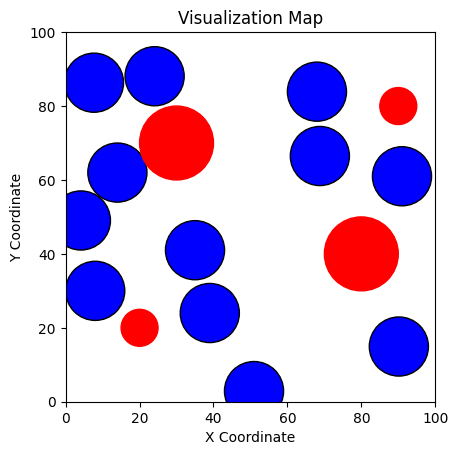

--------------------------------------------------------------------------------------------------------------------------------------
Generation  109 : [[57, 84], [39.05212005144632, 88.94390956119756], [35, 8], [8, 79], [24, 89], [89, 22], [66, 51], [40.8, 40.8], [49.9929393466865, 66.22395726417528], [51.86705367795331, 12.395407341135385], [9.14440156163296, 48.75009225459551], [67.33816984511606, 66.41071724062755], [35, 41], [24.074457216351888, 88.06272794456794], [14, 62], [8, 30], [7.668661426580733, 86.31521590761811], [90.154364142104, 14.934888592160657], [91, 61], [39, 24], [67.98991335240929, 83.8913675202504], [50.966582546537694, 2.8791533444791266], [4.123883293015838, 49.04223165270727], [68.78306488888867, 66.47886417056245], [92.0, 23.181411611030295], [8, 11], [71.58383468832838, 83.51354878182542], [90, 67], [25, 41], [42, 24], [60.769878604106594, 10.903574638764825], [48.56501953281009, 92.0], [4.117362695290806, 28.712391025703262], [83, 10], [14.01090583391856

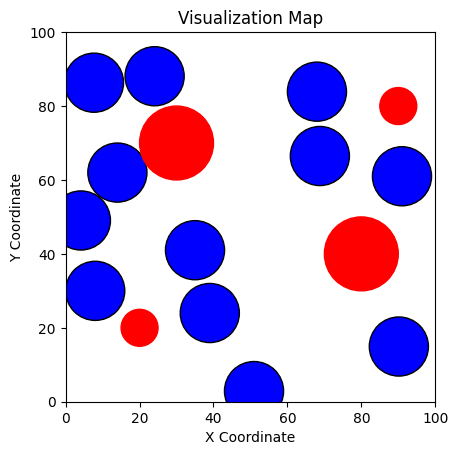

--------------------------------------------------------------------------------------------------------------------------------------
Generation  110 : [[41.599999999999994, 53.9], [28.567756066880214, 88.32708242955682], [12, 63], [59, 39], [12.56806299860651, 87.12065113533268], [89.8080548994728, 17.05442201451246], [83.5, 57.99999999999999], [39.53999999999999, 29.039999999999996], [73, 19], [51.23672388596238, 5.734029543476003], [5.630038773600974, 48.95458983327374], [68.34959637575689, 66.45842009158197], [35, 41], [24.074457216351888, 88.06272794456794], [14, 62], [8, 30], [7.668661426580733, 86.31521590761811], [90.154364142104, 14.934888592160657], [91, 61], [39, 24], [67.98991335240929, 83.8913675202504], [50.966582546537694, 2.8791533444791266], [4.123883293015838, 49.04223165270727], [68.78306488888867, 66.47886417056245], [85, 57], [8, 32], [34.943023807071675, 8.627730794066693], [14.916385565181965, 89.51331215386001], [34.659264776051685, 92.0], [11, 9], [81, 17], [5

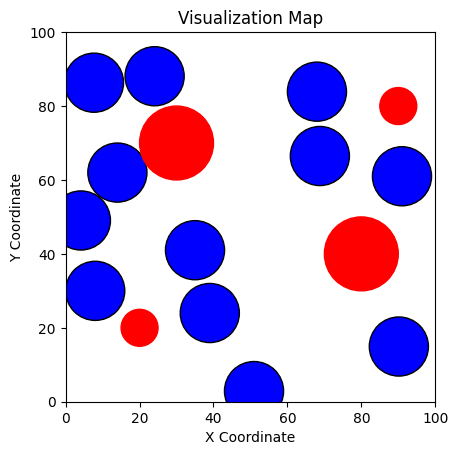

--------------------------------------------------------------------------------------------------------------------------------------
Generation  111 : [[46, 89], [82, 59], [70, 87], [10, 79], [26.562083771210396, 90.29456477228543], [34.7463092426312, 10.780466577648196], [73, 10], [49.98186973716736, 30.667718522407583], [41.39697400572278, 45.46741025607511], [57.99787387768626, 9.064716418150784], [10.155827720248583, 49.6335619194793], [61.007014097414235, 62.6071657029281], [35, 41], [24.074457216351888, 88.06272794456794], [14, 62], [8, 30], [7.668661426580733, 86.31521590761811], [90.154364142104, 14.934888592160657], [91, 61], [39, 24], [67.98991335240929, 83.8913675202504], [50.966582546537694, 2.8791533444791266], [4.123883293015838, 49.04223165270727], [68.78306488888867, 66.47886417056245], [55.42556720626855, 45.83552771568087], [47, 63], [70, 92], [45, 14], [10.030878848637094, 92.0], [92.0, 14.53659727797267], [57, 28], [40.70436428205113, 40.06048048515181], [33, 89],

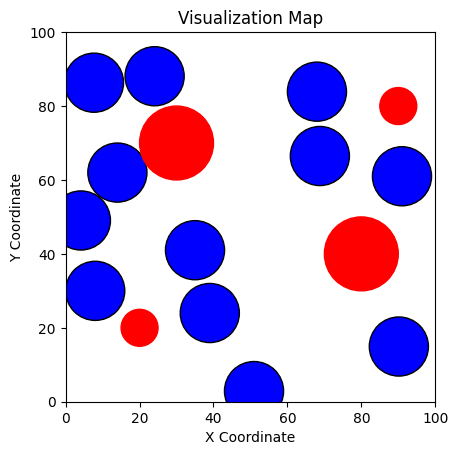

--------------------------------------------------------------------------------------------------------------------------------------
Generation  112 : [[58, 25], [51, 57], [29, 36], [83, 63], [13.33668812996963, 87.5090205670183], [73.53194767226216, 13.688561987806919], [77, 91], [42.29456092115021, 26.00031555672227], [22, 52], [53.075969945882264, 4.734822266580624], [5.933466621185661, 49.21963073273888], [66.45024965144634, 65.31735463027213], [35, 41], [24.074457216351888, 88.06272794456794], [14, 62], [8, 30], [7.668661426580733, 86.31521590761811], [90.154364142104, 14.934888592160657], [91, 61], [39, 24], [67.98991335240929, 83.8913675202504], [50.966582546537694, 2.8791533444791266], [4.123883293015838, 49.04223165270727], [68.78306488888867, 66.47886417056245], [44.20112606376587, 87.03470384367846], [17, 38], [36, 28], [57, 78], [27.17640181899332, 92.0], [44.442867229768794, 11.160104929692958], [9, 70], [64.10000673140715, 25.5081157756276], [46.64713682977255, 43.64356

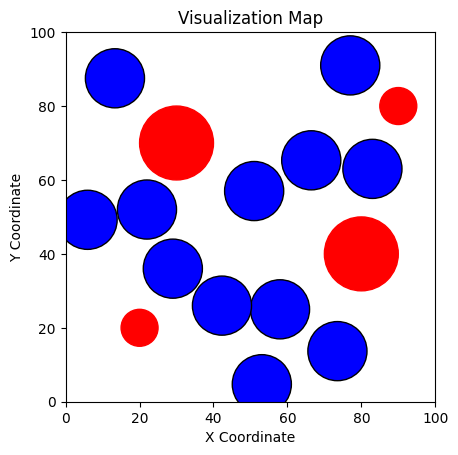

--------------------------------------------------------------------------------------------------------------------------------------
Generation  113 : [[54, 48], [56, 21], [50, 91], [30.5, 39.9], [9.369069437597402, 86.67335730543816], [85.16763920115145, 14.560990610854535], [10, 11], [39.98836827634506, 24.600094667016677], [54.1929393466865, 74.32395726417528], [51.59939876634106, 3.4358540211095754], [4.666758291466785, 49.09545137671675], [68.08322031765597, 66.13041130847535], [58, 25], [51, 57], [29, 36], [83, 63], [13.33668812996963, 87.5090205670183], [73.53194767226216, 13.688561987806919], [77, 91], [42.29456092115021, 26.00031555672227], [22, 52], [53.075969945882264, 4.734822266580624], [5.933466621185661, 49.21963073273888], [66.45024965144634, 65.31735463027213], [57, 21], [11.572864357275025, 51.21072859708151], [58, 61], [46, 85], [31.710735919970816, 91.91611302220448], [41.71049476883574, 5.216475735611457], [8, 26], [28, 41], [43.25697639059158, 40.11389566262743]

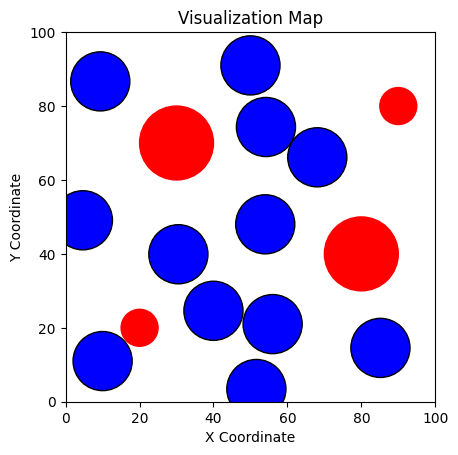

--------------------------------------------------------------------------------------------------------------------------------------
Generation  114 : [[58, 79], [54.49999999999999, 31.799999999999997], [68, 90], [46.25, 46.83], [10.55935504530907, 86.9240562839122], [81.67693174248465, 14.29926202394025], [12, 9], [40.6802260697866, 25.020160933928352], [24, 50], [52.042370120203415, 3.82554449475089], [5.046770790382448, 49.132705183523385], [67.59332911779308, 65.88649430501438], [54, 48], [56, 21], [50, 91], [30.5, 39.9], [9.369069437597402, 86.67335730543816], [85.16763920115145, 14.560990610854535], [10, 11], [39.98836827634506, 24.600094667016677], [54.1929393466865, 74.32395726417528], [51.59939876634106, 3.4358540211095754], [4.666758291466785, 49.09545137671675], [68.08322031765597, 66.13041130847535], [68, 75], [17.368001529580088, 52.58012900229062], [51.354553826677105, 65.39478152955479], [76, 62], [60, 22], [34.98342279676785, 13.284156573202985], [11, 67], [26.4932492

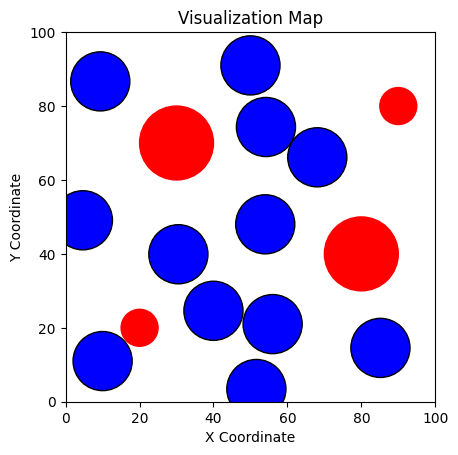

--------------------------------------------------------------------------------------------------------------------------------------
Generation  115 : [[83, 60], [55.55, 24.24], [55.4, 90.69999999999999], [35.224999999999994, 41.979], [9.726155119910903, 86.74856699898037], [84.12042696355141, 14.482472034780248], [10.6, 10.399999999999999], [40.195925614377515, 24.726114547090177], [47, 77], [51.73229017249976, 3.5527611632019696], [4.780762041141483, 49.10662751875874], [67.93625295769709, 66.05723620743706], [54, 48], [56, 21], [50, 91], [30.5, 39.9], [9.369069437597402, 86.67335730543816], [85.16763920115145, 14.560990610854535], [10, 11], [39.98836827634506, 24.600094667016677], [54.1929393466865, 74.32395726417528], [51.59939876634106, 3.4358540211095754], [4.666758291466785, 49.09545137671675], [68.08322031765597, 66.13041130847535], [77, 58], [63, 35], [80.60626233210162, 92.0], [44.17391996282436, 46.33682656510202], [13.319212412732142, 89.83649490310316], [77.3081688270782

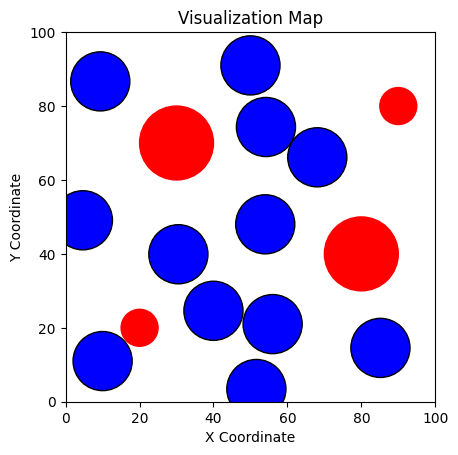

--------------------------------------------------------------------------------------------------------------------------------------
Generation  116 : [[78.8, 58.599999999999994], [60.76499999999999, 31.772], [73.04438363247112, 91.60999999999999], [41.48924397397705, 45.02947859557141], [12.24129522488577, 88.91011653186632], [79.35184626802018, 18.24510261708847], [19.301395956709005, 4.846774382266869], [44.607859949154374, 22.588780303459316], [45.599999999999994, 84.0], [54.18570301300624, 6.001138339320647], [14.709536475330644, 53.30912469457117], [65.69396639362105, 68.460626923521], [54, 48], [56, 21], [50, 91], [30.5, 39.9], [9.369069437597402, 86.67335730543816], [85.16763920115145, 14.560990610854535], [10, 11], [39.98836827634506, 24.600094667016677], [54.1929393466865, 74.32395726417528], [51.59939876634106, 3.4358540211095754], [4.666758291466785, 49.09545137671675], [68.08322031765597, 66.13041130847535], [45, 32], [60.499566844355414, 29.970703243816693], [85, 58], [

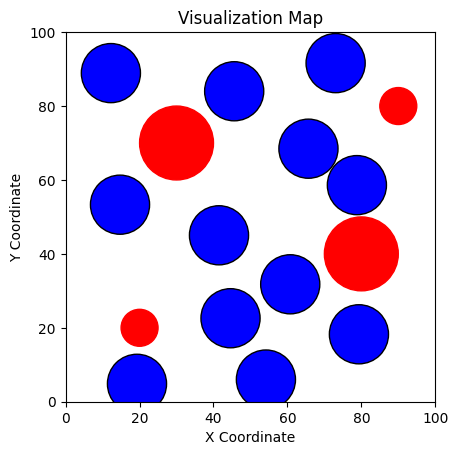

--------------------------------------------------------------------------------------------------------------------------------------
Generation  117 : [[47.699999999999996, 36.8], [59.14969679104878, 27.279492270671685], [86, 62], [32.41718228734416, 42.48090912389381], [10.92378911871766, 83.77460334673323], [86.85947614796677, 12.487128210090674], [81, 89], [41.49933706487482, 18.49581881396372], [58.263149215053815, 84.9974825638914], [53.28835275162313, 4.407239250855389], [1.6230143268635793, 58.941202818051444], [63.95556036523776, 70.18666005858378], [72.78237135017366, 90.21874046404727], [8.535600995362547, 38.62383380128094], [59.43266375105826, 21.194137490388698], [90.58684711927494, 64.64124399901218], [33.88694380966068, 50.43874205099434], [65, 76], [2.492007901638317, 91.46310207289042], [89, 17], [55.92818910264167, 54.0212015332678], [38.2335391360566, 92.0], [42.48501744807785, 15.404958754824678], [13, 81], [72.78237135017366, 90.21874046404727], [8.53560099536254

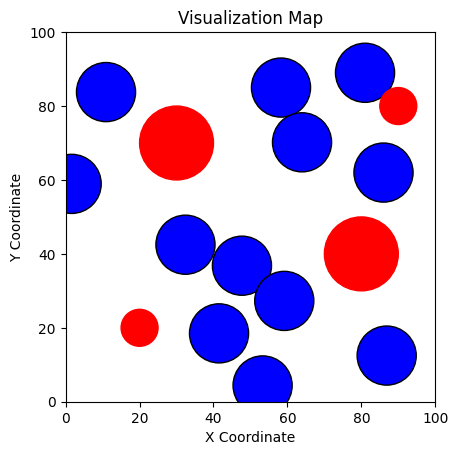

--------------------------------------------------------------------------------------------------------------------------------------
Generation  118 : [[89, 8], [18, 53], [59.82979912531748, 21.05824124711661], [41, 92], [70.3660831428982, 62.0316226152983], [16, 32], [43.44760237049149, 58.23893062186713], [35.099999999999994, 12.1], [75, 87], [37.37006174081698, 33.199999999999996], [58, 44], [57.099999999999994, 81.7], [10.522128441266469, 30.58380354161571], [47, 58], [51.050803569573866, 28.00770342026893], [15.782130909440735, 53.7743441218953], [76, 75], [92.0, 15.758995627419473], [70, 19], [38, 46], [45.09645246557156, 92.0], [31.610130453399407, 6.692972833054204], [8.580197080325354, 92.0], [66.07997861443687, 87.45900405379675], [10.522128441266469, 30.58380354161571], [47, 58], [51.050803569573866, 28.00770342026893], [15.782130909440735, 53.7743441218953], [76, 75], [92.0, 15.758995627419473], [70, 19], [38, 46], [45.09645246557156, 92.0], [31.610130453399407, 6.6929728

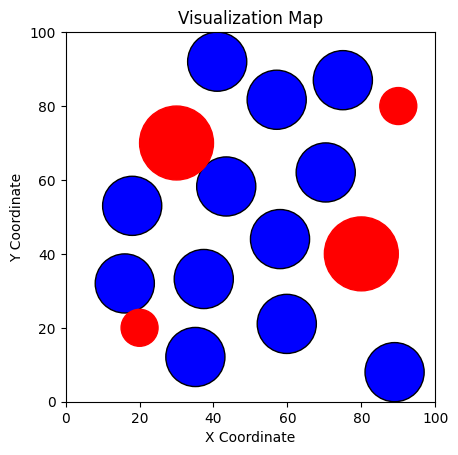

--------------------------------------------------------------------------------------------------------------------------------------
Generation  119 : [[10.522128441266469, 30.58380354161571], [47.0, 57.99999999999999], [51.05080356957386, 28.00770342026893], [15.782130909440735, 53.7743441218953], [76.0, 75.0], [91.99999999999999, 15.758995627419473], [70.0, 19.0], [38.0, 45.99999999999999], [45.09645246557156, 91.99999999999999], [31.610130453399407, 6.692972833054204], [8.580197080325354, 91.99999999999999], [66.07997861443687, 87.45900405379675], [89, 8], [18, 53], [59.82979912531748, 21.05824124711661], [41, 92], [70.3660831428982, 62.0316226152983], [16, 32], [43.44760237049149, 58.23893062186713], [35.099999999999994, 12.1], [75, 87], [37.37006174081698, 33.199999999999996], [58, 44], [57.099999999999994, 81.7], [5.044195832797174, 30.224736492678254], [47.30100524169521, 58.727159185838474], [43, 44], [14.272193963963053, 50.447923214352656], [71.84450492822101, 81.1920231806

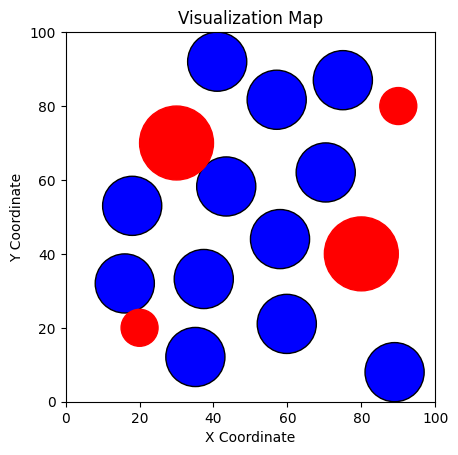

--------------------------------------------------------------------------------------------------------------------------------------
Generation  120 : [[88, 63], [87, 9], [14, 43], [49, 74], [74.30982494286945, 71.10948678458949], [15, 92], [62.034280711147446, 30.771679186560135], [37.129999999999995, 35.83], [43, 89], [33.33810983962468, 14.645080983137941], [57, 59], [63.3859850301058, 85.73130283765772], [89, 8], [18, 53], [59.82979912531748, 21.05824124711661], [41, 92], [70.3660831428982, 62.0316226152983], [16, 32], [43.44760237049149, 58.23893062186713], [35.099999999999994, 12.1], [75, 87], [37.37006174081698, 33.199999999999996], [58, 44], [57.099999999999994, 81.7], [91, 55], [44.70532451038886, 50.504103605949695], [50.94906115388477, 36.018594607492915], [65, 67], [78, 84], [84.85732145015929, 18.62408349549534], [60.723898520170465, 22.227797819292874], [28.205084479931102, 42.27207929948469], [15, 8], [44.35231061468744, 19.610357372313786], [11.68017202487527, 92.0], 

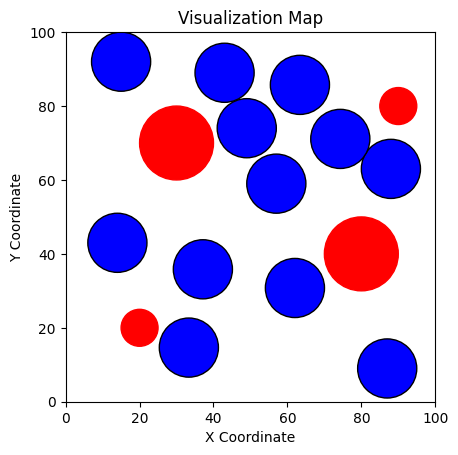

--------------------------------------------------------------------------------------------------------------------------------------
Generation  121 : [[34, 91], [82, 90], [73.24893973759524, 12.617472374134982], [24, 42], [73.60982494286947, 64.80948678458948], [12, 53], [10, 68], [45, 45], [54.0, 84.89999999999999], [42.71101852224509, 17.659999999999997], [11, 89], [48.629999999999995, 65.11], [63, 47], [24, 89], [77.11449352415609, 1.7117304914121032], [24.309107825748985, 31.836294668394373], [76.29888417940063, 74.28842534389184], [9.015169453213915, 92.0], [68, 18], [40.78721803562919, 37.42945349898409], [47.15351634830816, 87.61615635121258], [52.615546893243575, 11.5032725680057], [85, 92], [56.33955021968852, 63.28839035192546], [63, 47], [24, 89], [77.11449352415609, 1.7117304914121032], [24.309107825748985, 31.836294668394373], [76.29888417940063, 74.28842534389184], [9.015169453213915, 92.0], [68, 18], [40.78721803562919, 37.42945349898409], [47.15351634830816, 87.61615

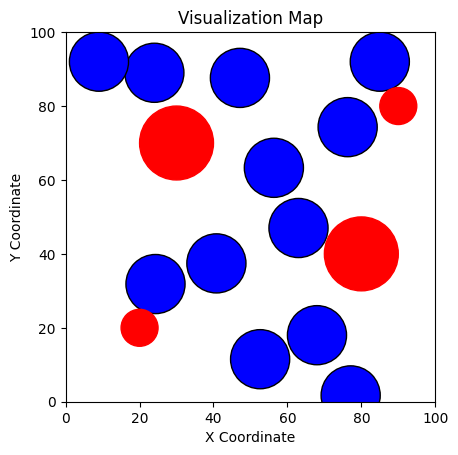

--------------------------------------------------------------------------------------------------------------------------------------
Generation  122 : [[62.99999999999999, 47.0], [23.999999999999996, 89.0], [77.11449352415607, 1.711730491412103], [24.30910782574898, 31.836294668394373], [76.29888417940063, 74.28842534389184], [9.015169453213915, 91.99999999999999], [68.0, 18.0], [40.78721803562918, 37.42945349898409], [47.15351634830815, 87.61615635121258], [52.615546893243575, 11.503272568005698], [85.0, 91.99999999999999], [56.33955021968852, 63.28839035192546], [63, 47], [24, 89], [77.11449352415609, 1.7117304914121032], [24.309107825748985, 31.836294668394373], [76.29888417940063, 74.28842534389184], [9.015169453213915, 92.0], [68, 18], [40.78721803562919, 37.42945349898409], [47.15351634830816, 87.61615635121258], [52.615546893243575, 11.5032725680057], [85, 92], [56.33955021968852, 63.28839035192546], [11, 39], [59, 62], [84.92148288697673, 21.02669788539916], [37.0318562618502

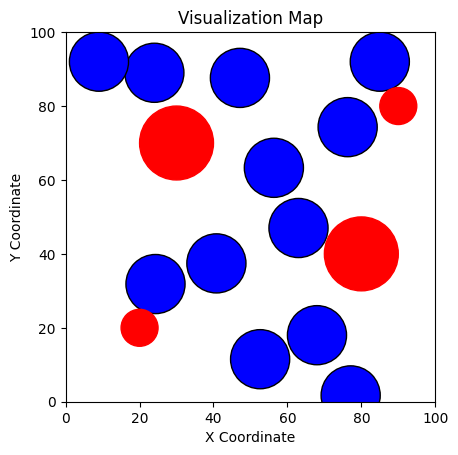

--------------------------------------------------------------------------------------------------------------------------------------
Generation  123 : [[49, 55], [15, 8], [79.45659033300227, 7.506220709608219], [28.12593235657937, 37.39671802425781], [75.62309987325928, 70.19842120766162], [9.452013079199467, 81.42359487448844], [67.69999999999999, 17.1], [45.513176051149784, 37.924154177972326], [61, 37], [47.65289480548604, 17.556140661222578], [65.81560474797305, 91.99999999999999], [56.83768515378196, 68.00187324634781], [62.99999999999999, 47.0], [23.999999999999996, 89.0], [77.11449352415607, 1.711730491412103], [24.30910782574898, 31.836294668394373], [76.29888417940063, 74.28842534389184], [9.015169453213915, 91.99999999999999], [68.0, 18.0], [40.78721803562918, 37.42945349898409], [47.15351634830815, 87.61615635121258], [52.615546893243575, 11.503272568005698], [85.0, 91.99999999999999], [56.33955021968852, 63.28839035192546], [14.63732258530648, 46.21195469449434], [61, 29]

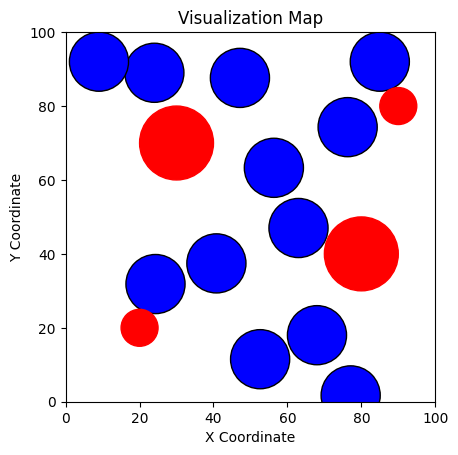

--------------------------------------------------------------------------------------------------------------------------------------
Generation  124 : [[89, 58], [88, 16], [70.03434805724682, 8.91351914742363], [61, 21], [73.35615381979196, 71.12072512548045], [26, 36], [51, 51], [28, 91], [12, 66], [46.9770438391986, 33.64186689068151], [45.31288415661982, 99.36134529337237], [56.16520388140753, 82.55494030502912], [62.99999999999999, 47.0], [23.999999999999996, 89.0], [77.11449352415607, 1.711730491412103], [24.30910782574898, 31.836294668394373], [76.29888417940063, 74.28842534389184], [9.015169453213915, 91.99999999999999], [68.0, 18.0], [40.78721803562918, 37.42945349898409], [47.15351634830815, 87.61615635121258], [52.615546893243575, 11.503272568005698], [85.0, 91.99999999999999], [56.33955021968852, 63.28839035192546], [74, 82], [23.40388182126273, 0], [81.8843733481672, 22.435378477942656], [8, 14], [73.24248233039374, 66.70709288731646], [6.721436339105036, 80.1463973591144

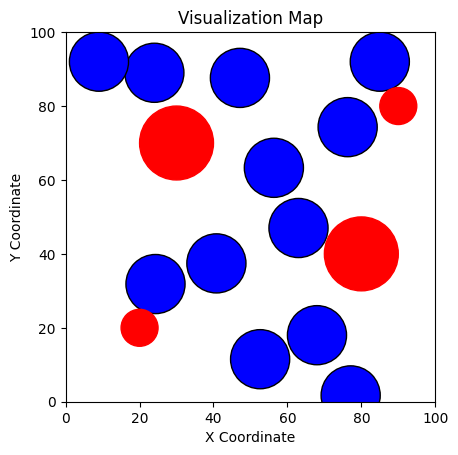

--------------------------------------------------------------------------------------------------------------------------------------
Generation  125 : [[18, 41], [36, 8], [80.45340940096386, 16.218284081983487], [46, 24], [74.1594028850958, 68.98149262428907], [7.409556273337699, 83.70247815138012], [92, 64], [39.004275056128606, 44.23493611591466], [51.08779355293704, 54.19526956120727], [53.748039989213524, 10.9442322331692], [69.48966040471944, 91.99999999999999], [53.26481332723615, 70.34122860884719], [62.99999999999999, 47.0], [23.999999999999996, 89.0], [77.11449352415607, 1.711730491412103], [24.30910782574898, 31.836294668394373], [76.29888417940063, 74.28842534389184], [9.015169453213915, 91.99999999999999], [68.0, 18.0], [40.78721803562918, 37.42945349898409], [47.15351634830815, 87.61615635121258], [52.615546893243575, 11.503272568005698], [85.0, 91.99999999999999], [56.33955021968852, 63.28839035192546], [23, 45], [43, 16], [86, 68], [6.278397050153618, 5.350702657763062

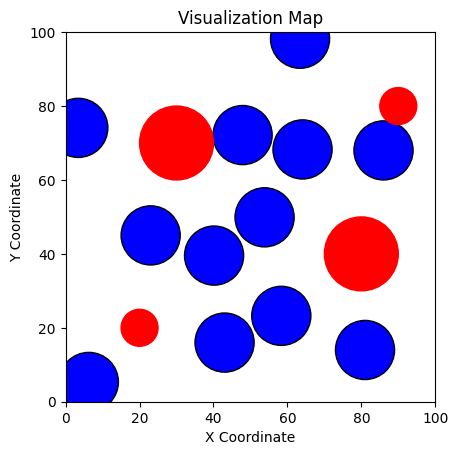

--------------------------------------------------------------------------------------------------------------------------------------
Generation  126 : [[53, 89], [8, 28], [22, 92], [8, 28], [67.75430710178654, 70.06905187010842], [5.1009878904833705, 79.46627110248265], [77.1, 15.2], [40.34726127230918, 38.90728850470636], [38, 24], [56.62739791422629, 19.714339759227425], [69.89532922615939, 96.34655005017414], [50.41452012253795, 69.48863359697944], [23, 45], [43, 16], [86, 68], [6.278397050153618, 5.350702657763062], [64.09234549709478, 68.26074895277267], [3.423481506455995, 74.09467300354666], [81, 14], [40.15870837374347, 39.54064636430162], [53.824384454088346, 49.89228658703254], [58.3467626375046, 23.233368555465308], [63.42189889451341, 98.2093572145345], [47.87522150947342, 72.14588070200257], [13, 50], [39.81580785990644, 0], [42, 41], [44.635917300175365, 23.729207819161978], [57, 41], [71, 59], [92.0, 59.15476554413071], [87, 18], [77, 88], [61.495697283489775, 13.77525

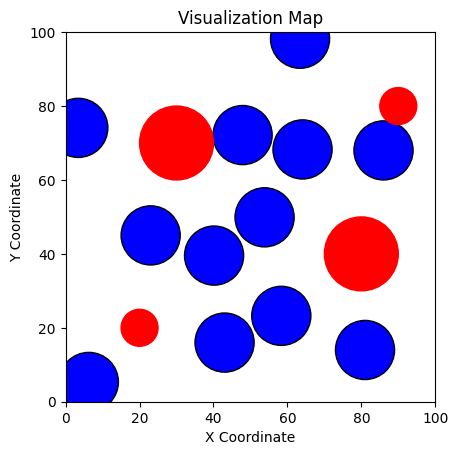

--------------------------------------------------------------------------------------------------------------------------------------
Generation  127 : [[19.999999999999996, 46.5], [42.04474235797193, 11.2], [16, 84], [12, 31], [82, 9], [42, 50], [79, 92], [62, 46], [75, 57], [59.29144303130015, 20.395935001473077], [62.73959141101025, 95.26161282317456], [49.4691985266044, 70.48968593303695], [23, 45], [43, 16], [86, 68], [6.278397050153618, 5.350702657763062], [64.09234549709478, 68.26074895277267], [3.423481506455995, 74.09467300354666], [81, 14], [40.15870837374347, 39.54064636430162], [53.824384454088346, 49.89228658703254], [58.3467626375046, 23.233368555465308], [63.42189889451341, 98.2093572145345], [47.87522150947342, 72.14588070200257], [48.15342768034757, 90.14495918145268], [27, 34], [15.977071263259354, 89.39444925695146], [53, 12], [10, 40], [86, 10], [80, 61], [38.45751275501372, 52.107861460428545], [40.47193667158162, 22.512000950721642], [64.70408107548523, 21.886037

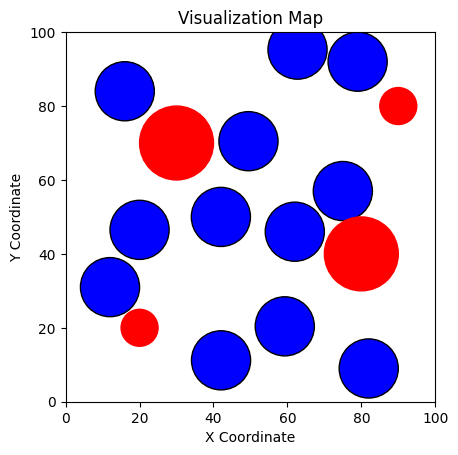

--------------------------------------------------------------------------------------------------------------------------------------
Generation  128 : [[71, 58], [38.199999999999996, 21.4], [21, 35], [20.29487793510753, 7.345491860434143], [10, 69], [92, 11], [8, 87], [58, 86], [49.818650119336326, 41.678200896139266], [60.25395816889879, 22.829169242287055], [69.3214394466412, 96.34655005017414], [51.59337302219164, 69.04217694171076], [19.999999999999996, 46.5], [42.04474235797193, 11.2], [16, 84], [12, 31], [82, 9], [42, 50], [79, 92], [62, 46], [75, 57], [59.29144303130015, 20.395935001473077], [62.73959141101025, 92.0], [49.4691985266044, 70.48968593303695], [60.559174294199224, 103.99300454983394], [49, 89], [25.958412739046036, 90.24979379638219], [57, 47], [12, 84], [91.24060206611948, 5.79241755954647], [72.00174720596382, 57.354165288374155], [70, 74], [33.46399950001065, 14.749451764832976], [70.75682056302296, 18.68701453382275], [82.97068686782208, 95.88968935815147], [5

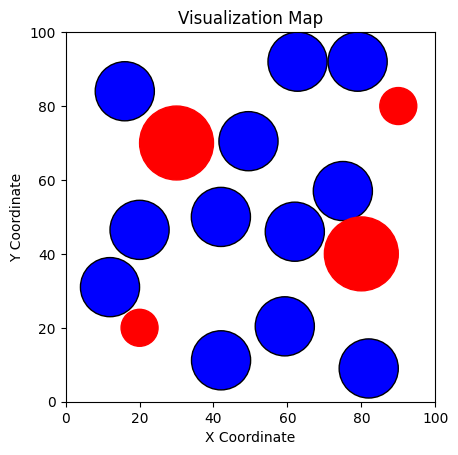

--------------------------------------------------------------------------------------------------------------------------------------
Generation  129 : [[82, 59], [48, 8], [22.487523821713808, 51.57493813891466], [14, 8], [10.6, 73.5], [91.77218061983584, 9.43772526786394], [30, 88], [61.599999999999994, 82.39999999999999], [44.91225493353862, 33.599576156747375], [63.404816887136036, 21.586522829747764], [73.41621367299545, 96.20949184256733], [51.58565577925125, 67.28606794808633], [19.999999999999996, 46.5], [42.04474235797193, 11.2], [16, 84], [12, 31], [82, 9], [42, 50], [79, 92], [62, 46], [75, 57], [59.29144303130015, 20.395935001473077], [62.73959141101025, 92.0], [49.4691985266044, 70.48968593303695], [80.893120037537, 65.91891743872195], [45.434789878635115, 12.550963400001766], [12.097448598156078, 45.088206647299565], [28.759003556923158, 1.3792330900155374], [0.08285046537262808, 67.86804781766163], [86.15721958172884, 16.206980989909816], [54, 70], [9, 87], [64, 26], [52

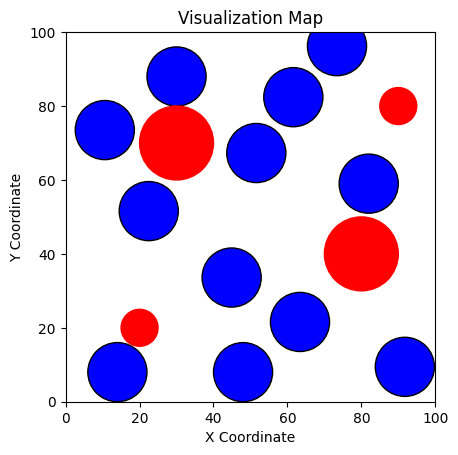

--------------------------------------------------------------------------------------------------------------------------------------
Generation  130 : [[63.4, 55.25], [46.21342270739157, 8.959999999999999], [85, 61], [89, 12], [37, 50], [11, 85], [44.7, 89.19999999999999], [13, 45], [53.938578453477035, 40.619703309723164], [62.17080473038527, 21.229346481265356], [70.21322699439989, 94.94664428979712], [50.95071860345719, 68.24715334357151], [82, 59], [48, 8], [22.487523821713808, 51.57493813891466], [14, 8], [10.6, 73.5], [91.77218061983584, 9.43772526786394], [30, 88], [61.599999999999994, 82.39999999999999], [44.91225493353862, 33.599576156747375], [63.404816887136036, 21.586522829747764], [73.41621367299545, 92.0], [51.58565577925125, 67.28606794808633], [41, 54], [17, 40], [7.594962437374438, 54.47885341950668], [29.278642898596594, 2.515482298813149], [-6.829489890100156, 65.21555968839247], [56, 12], [59, 68], [12.244236014096137, 80.25072061049183], [68.18357506019788, 20.94

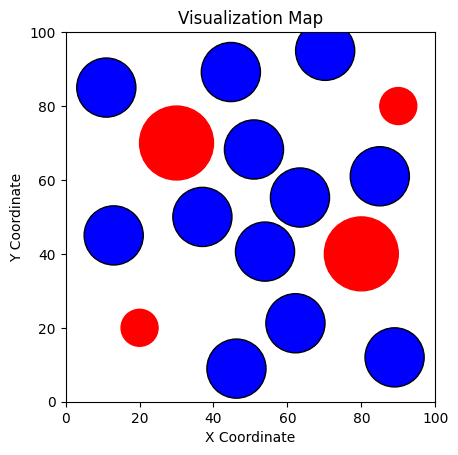

--------------------------------------------------------------------------------------------------------------------------------------
Generation  131 : [[69.7, 57.5], [38.699999999999996, 17.6], [18.019755406411996, 52.446112723092256], [18.58359286957898, 6.354644689643944], [5.371153032969952, 71.01466790651773], [81.04052643388508, 10.206407687504758], [87, 65], [46.79327080422883, 81.75521618314754], [31, 33], [59.38337182099522, 41.51056598082343], [71.019687400695, 89.24980900295253], [48.34826760456106, 58.255428731312556], [63.4, 55.25], [46.21342270739157, 8.959999999999999], [85, 61], [89, 12], [37, 50], [11, 85], [44.7, 89.19999999999999], [13, 45], [53.938578453477035, 40.619703309723164], [62.17080473038527, 21.229346481265356], [70.21322699439989, 92.0], [50.95071860345719, 68.24715334357151], [65, 58], [16.753515710790392, 48.088059485343784], [-0.14470080130666663, 47.59398168347866], [21.654040828458662, 5.8165378873452305], [-16.239811352725507, 77.14690193842168], [

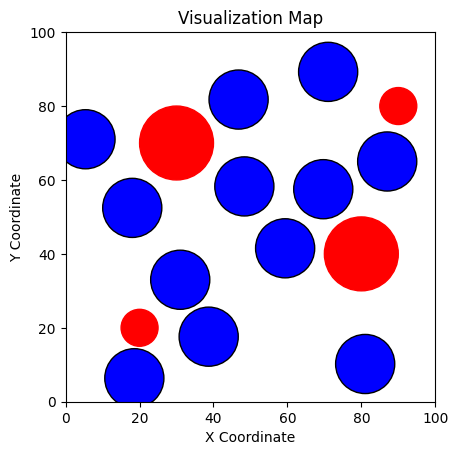

--------------------------------------------------------------------------------------------------------------------------------------
Generation  132 : [[67.81, 56.825], [83, 17], [19, 44], [39.708515008705284, 8.04825128275076], [12, 71], [22, 86], [74.31, 72.25999999999999], [13, 9], [37.881573536043106, 35.285910992916946], [60.21960169381224, 35.426200130956005], [70.77774927880647, 90.07486630206677], [49.12900290422989, 61.25294611499024], [69.7, 57.5], [38.699999999999996, 17.6], [18.019755406411996, 52.446112723092256], [18.58359286957898, 6.354644689643944], [5.371153032969952, 71.01466790651773], [81.04052643388508, 10.206407687504758], [87, 65], [46.79327080422883, 81.75521618314754], [31, 33], [59.38337182099522, 41.51056598082343], [71.019687400695, 89.24980900295253], [48.34826760456106, 58.255428731312556], [35, 10], [8, 10], [11.14092912491342, 57.35934958445131], [20.038447476588573, -3.605981057691528], [-2.1706957564659035, 92.04801209472672], [67.8247340206566, 3.3

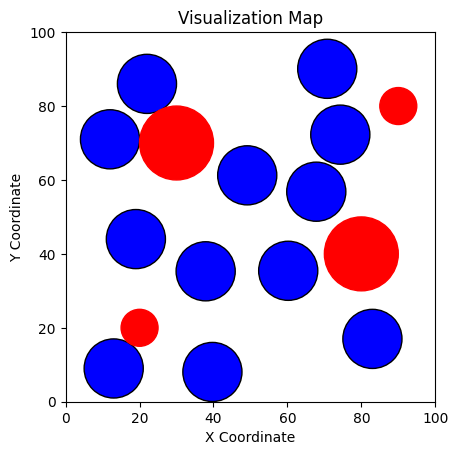

--------------------------------------------------------------------------------------------------------------------------------------
Generation  133 : [[45.41, 24.25], [84, 63], [13.204577009362993, 55.88537852604359], [19.601991094485694, -0.6177933334908863], [0.09185888036485301, 85.73800883826402], [71.78947174462515, 5.437192471800653], [65, 54], [31.27808066127028, 92.52912730349229], [26, 47], [59.65427866654585, 72.11190408839629], [74.72579742647137, 81.30743884668813], [41.290143591633964, 42.44533550285271], [8, 16], [59, 67], [38, 89], [91, 13], [33, 8], [8.654325490968958, 38.12345687674708], [80.16629399793658, 61.7371731418238], [72.97002280266754, 9.240106832159631], [30, 45], [55.39963625974019, 50.31226659032422], [41.34986539100738, 32.48913137217825], [59.87452649795722, 84.1823337925321], [8, 16], [59, 67], [38, 89], [91, 13], [33, 8], [8.654325490968958, 38.12345687674708], [80.16629399793658, 61.7371731418238], [72.97002280266754, 9.240106832159631], [30, 45], 

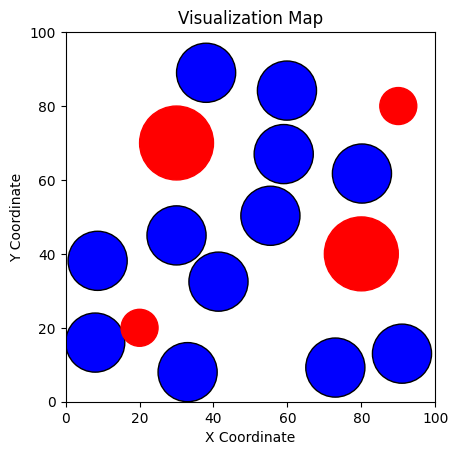

--------------------------------------------------------------------------------------------------------------------------------------
Generation  134 : [[34.187, 21.775], [12, 37], [21, 86], [41.02139376613999, 3.4675446665563796], [9.964301216255398, 62.41660618678481], [52.84892786852829, 15.24307179328458], [64, 29], [78, 8], [27.2, 46.4], [81, 59], [64.71301781583217, 66.66194660433516], [46.86545846353094, 54.96643498975652], [8, 16], [59, 67], [38, 89], [91, 13], [33, 8], [8.654325490968958, 38.12345687674708], [80.16629399793658, 61.7371731418238], [72.97002280266754, 9.240106832159631], [30, 45], [55.39963625974019, 50.31226659032422], [41.34986539100738, 32.48913137217825], [59.87452649795722, 84.1823337925321], [47.69596631405283, 19.926228104546755], [92.0, 56.77754328261289], [9, 54], [13.389987530503474, 0], [5.22993907109641, 92.0], [74.73962505695131, 17.676071364494266], [71.16663853613284, 62.46201685018183], [22.914231176763522, 92.0], [23.450206597387087, 49.7939701

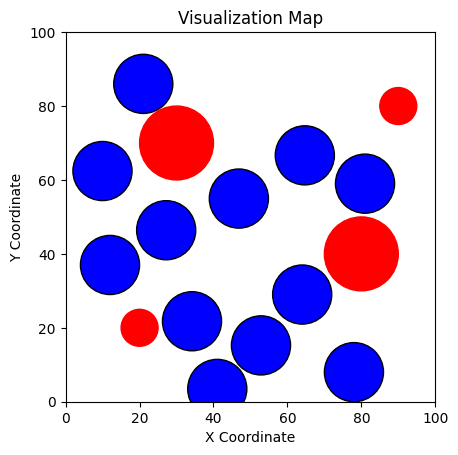

--------------------------------------------------------------------------------------------------------------------------------------
Generation  135 : [[83, 12], [15, 92], [63, 92], [67.71699625915103, 9.1], [15, 54], [19, 33], [77.46639735939544, 61.95462625433121], [57.953285314896334, 34.06807478251174], [28.035061979216124, 46.43819105221159], [34, 23], [50.43162113032791, 50.34239196052477], [57.78261498760155, 73.16052354991591], [34.187, 21.775], [12, 37], [21, 86], [41.02139376613999, 3.4675446665563796], [9.964301216255398, 62.41660618678481], [52.84892786852829, 15.24307179328458], [64, 29], [78, 8], [27.2, 46.4], [81, 59], [64.71301781583217, 66.66194660433516], [46.86545846353094, 54.96643498975652], [77, 13], [97.09524690850776, 53.959025908960555], [9, 50], [15.522436434348988, -2.5707366675851047], [43, 13], [67.64511166159159, 25.20167275298075], [37, 44], [17.019095508358625, 98.26539381461556], [45, 30], [58.902209113448095, 91.6314830750528], [76.67136758842653, 98

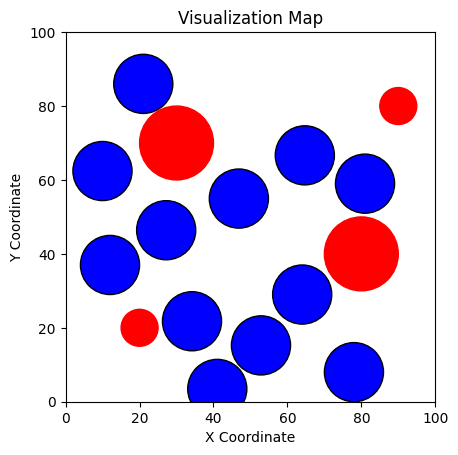

--------------------------------------------------------------------------------------------------------------------------------------
Generation  136 : [[81.19999999999999, 12.299999999999999], [79, 90], [46.8, 79.39999999999999], [52.058628311710414, 5.598778999724468], [63, 20], [92, 55], [9, 80], [74, 60], [55, 33], [41.47066273403442, 43.58944492251584], [16, 59], [59.024392197572986, 68.33369929762644], [34.187, 21.775], [12, 37], [21, 86], [41.02139376613999, 3.4675446665563796], [9.964301216255398, 62.41660618678481], [52.84892786852829, 15.24307179328458], [64, 29], [78, 8], [27.2, 46.4], [81, 59], [64.71301781583217, 66.66194660433516], [46.86545846353094, 54.96643498975652], [81.75804435714183, 11.54683844699756], [27.419450072820162, 92.0], [60, 32], [58.2347162329156, 5.841814288983915], [47, 48], [18.400445459600665, 37.262314059437166], [85.61430857056567, 65.6179172323249], [9, 68], [30, 9], [42.52200450707623, 29.538257024149374], [62.56977923121956, 60.267481959890134

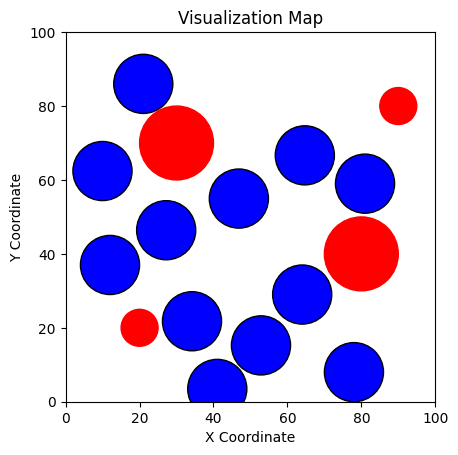

--------------------------------------------------------------------------------------------------------------------------------------
Generation  137 : [[48.29089999999999, 18.932499999999997], [90, 66], [46, 79], [44.33256412981111, 4.106914966506806], [11, 75], [32, 28], [20, 46], [70, 70], [35.54, 42.379999999999995], [69.14119882021032, 54.37683347675475], [75, 18], [50.513138583743554, 58.976614282117495], [34.187, 21.775], [12, 37], [21, 86], [41.02139376613999, 3.4675446665563796], [9.964301216255398, 62.41660618678481], [52.84892786852829, 15.24307179328458], [64, 29], [78, 8], [27.2, 46.4], [81, 59], [64.71301781583217, 66.66194660433516], [46.86545846353094, 54.96643498975652], [78.52988234157218, 3.745913355283683], [78.75746891343277, 90.65908685077561], [16, 37], [52, 62], [65.93266062250288, 19.45349608509293], [34, 89], [84, 20], [11, 10], [41, 9], [36.405026876545676, 40.640692767673826], [8.49324486977944, 64.69601193511787], [52.22445954291891, 81.4562298025282]]
Gen

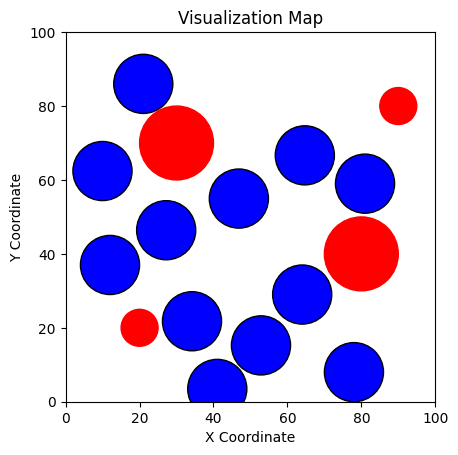

--------------------------------------------------------------------------------------------------------------------------------------
Generation  138 : [[69.45818763910052, 8.301889348698577], [76, 58], [8, 45], [12, 88], [11, 70], [76, 77], [64.8, 27.799999999999997], [90, 13], [39.361999999999995, 19.014], [46.225878459645074, 44.761534980398096], [28.445271408845606, 50.6872083545825], [51.711063255166295, 74.71234514640499], [34.187, 21.775], [12, 37], [21, 86], [41.02139376613999, 3.4675446665563796], [9.964301216255398, 62.41660618678481], [52.84892786852829, 15.24307179328458], [64, 29], [78, 8], [27.2, 46.4], [81, 59], [64.71301781583217, 66.66194660433516], [46.86545846353094, 54.96643498975652], [64, 15], [56, 90], [75, 91], [46.978569325903656, 0.36198408322078013], [8.481316280074914, 78.77532385854187], [33.08091744671661, 20.929116078096143], [15.050426583654925, 60.292741402460535], [57, 45], [30.314974673534184, 36.44256598824229], [71.33103063073182, 65.45997265740078

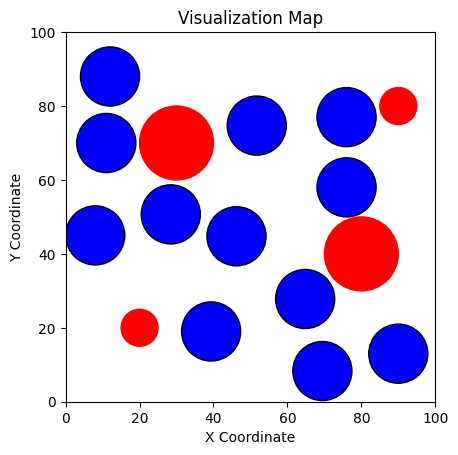

--------------------------------------------------------------------------------------------------------------------------------------
Generation  139 : [[51.099999999999994, 20.4], [12, 44], [62, 87], [36.18499852813255, 14.353388858254545], [10.13692139605244, 82.4427267009793], [56, 73], [28.53529860855845, 49.404918981722375], [83, 14], [32.92048227147393, 31.509796191769603], [71.53172144151226, 64.12198086018054], [65.76435082247384, 28.301396579334153], [44.734845222584234, 56.71646179494637], [31, 91], [91, 17], [92, 62], [12.24842609242246, 39.318298711171416], [51, 59], [72.25949945853824, 91.11335270037969], [51, 81], [14, 61], [40.83309270395955, 14.401449260226325], [64.50987675804608, 71.7632827877379], [4.342021805819538, 83.48652623292921], [44.18078752061196, 40.674690274375244], [31, 91], [91, 17], [92, 62], [12.24842609242246, 39.318298711171416], [51, 59], [72.25949945853824, 91.11335270037969], [51, 81], [14, 61], [40.83309270395955, 14.401449260226325], [64.509876

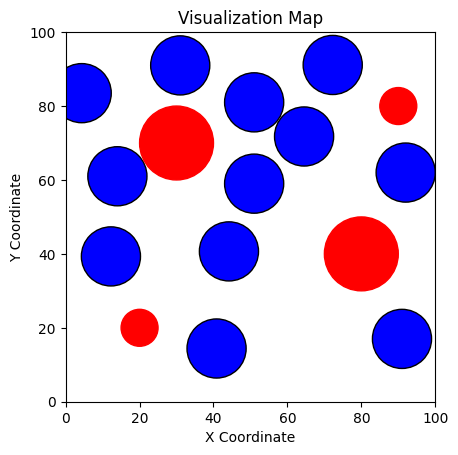

--------------------------------------------------------------------------------------------------------------------------------------
Generation  140 : [[25, 88], [67.3, 25.099999999999998], [82.99999999999999, 69.5], [79, 10], [54, 59], [67.38164962097677, 85.67934689026578], [8, 32], [55, 34], [38.45930957421386, 19.533953339689305], [66.61643016308592, 69.47089220947069], [92, 57], [44.34700483120364, 45.48722173054658], [31, 91], [91, 17], [92, 62], [12.24842609242246, 39.318298711171416], [51, 59], [72.25949945853824, 91.11335270037969], [51, 81], [14, 61], [40.83309270395955, 14.401449260226325], [64.50987675804608, 71.7632827877379], [4.342021805819538, 83.48652623292921], [44.18078752061196, 40.674690274375244], [10, 31], [2.1436857007991676, 46.3891233421661], [68.33674371397969, 92.0], [50.370464986399014, 9.753974202773708], [16.13401321627434, 81.22933818893402], [54.13954479615684, 81.16515866986438], [38.96275980415935, 50.77582440948161], [92.0, 24.415961702978862], [44

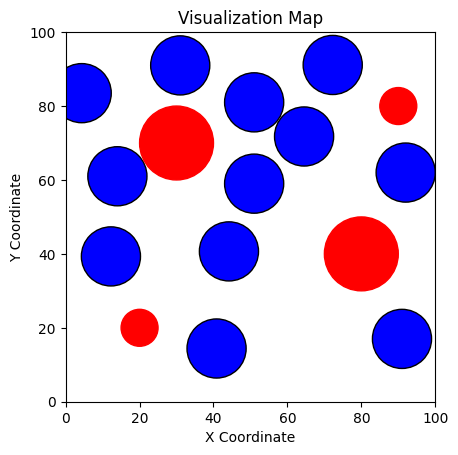

--------------------------------------------------------------------------------------------------------------------------------------
Generation  141 : [[79, 11], [92, 57], [72.73572059978578, 85.24999999999999], [58.9593254904793, 9.827781941941595], [17, 90], [58.11217624360282, 82.5194151359848], [29.67393186291154, 45.14307708663713], [10, 61], [42.55311580181959, 31.599766821164174], [66.95356729694218, 69.8401286396353], [36, 9], [48.460882995419, 57.10073533700546], [31, 91], [91, 17], [92, 62], [12.24842609242246, 39.318298711171416], [51, 59], [72.25949945853824, 91.11335270037969], [51, 81], [14, 61], [40.83309270395955, 14.401449260226325], [64.50987675804608, 71.7632827877379], [4.342021805819538, 83.48652623292921], [44.18078752061196, 40.674690274375244], [9, 63], [67, 55], [41, 56], [77.52448768729383, 0.10173813392127329], [14, 90], [69, 23], [3.684421533926942, 41.156612851704736], [80, 91], [47.50620333846912, 9.771807300902246], [69.59747084891823, 69.89917254861493

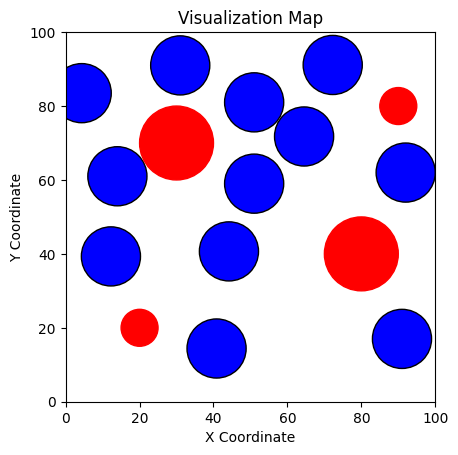

--------------------------------------------------------------------------------------------------------------------------------------
Generation  142 : [[72, 12], [8, 89], [80, 90], [31.831244570883868, 27.553330537996374], [18, 49], [8, 37], [82, 65], [56, 55], [42.83502589431242, 13.0125566724291], [66.03615498530772, 71.204049716001], [61, 27], [46.89489149757624, 39.15155797131702], [31, 91], [91, 17], [92, 62], [12.24842609242246, 39.318298711171416], [51, 59], [72.25949945853824, 91.11335270037969], [51, 81], [14, 61], [40.83309270395955, 14.401449260226325], [64.50987675804608, 71.7632827877379], [4.342021805819538, 83.48652623292921], [44.18078752061196, 40.674690274375244], [-0.7684300492074883, 77.49243615616095], [71, 66], [9, 58], [79.74751077415253, 15.08844155022279], [14.754170670064958, 89.81979328175703], [64.86277852027547, 24.99390872511158], [7.9640928740929695, 36.22381510625488], [24, 37], [90, 62], [61.94746038488751, 83.1244152417115], [39.92516918546282, 33.44

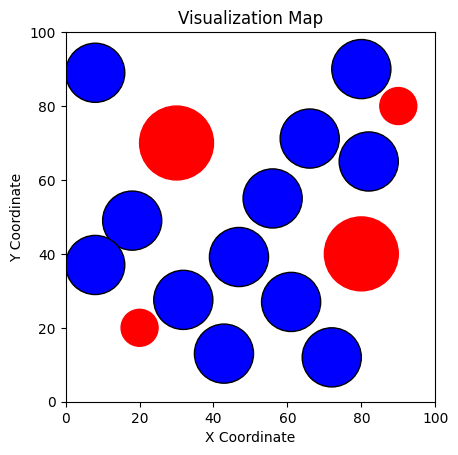

--------------------------------------------------------------------------------------------------------------------------------------
Generation  143 : [[22.86947098523775, 86.94773084684829], [41, 87], [55, 9], [74.32425323224575, 14.326532465066837], [21.226251201019483, 50.7459379845271], [47, 43], [33, 28], [80, 91], [52, 76], [12, 38], [56.07755075563884, 28.933915442729518], [70.91992535302161, 75.88156430605832], [33.71267336325357, 87.641633215649], [51, 64], [92.0, 15.007243911760403], [63.39329250356732, 7.424410402403785], [28.124009742356357, 30.922047716764247], [45, 41], [46, 78], [53, 28], [63.205228923312134, 76.14297337842466], [60, 44], [89, 59], [68.04490890900925, 90.42862989852726], [33.71267336325357, 87.641633215649], [51, 64], [92.0, 15.007243911760403], [63.39329250356732, 7.424410402403785], [28.124009742356357, 30.922047716764247], [45, 41], [46, 78], [53, 28], [63.205228923312134, 76.14297337842466], [60, 44], [89, 59], [68.04490890900925, 90.42862989852726

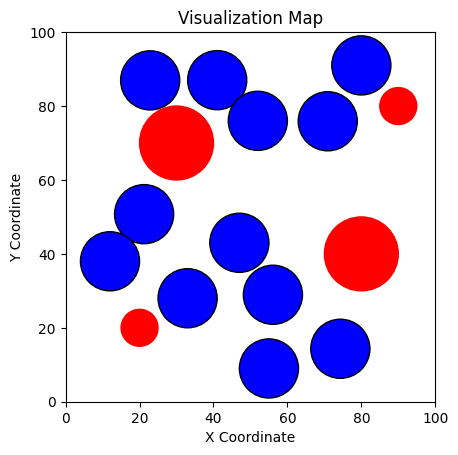

--------------------------------------------------------------------------------------------------------------------------------------
Generation  144 : [[79, 73], [42, 83], [26, 52], [66.67258072217085, 9.495047021202701], [26.054682179955293, 36.86921479709311], [44, 26], [84, 22], [61.099999999999994, 46.9], [50, 11], [45.6, 42.199999999999996], [53, 64], [68.90741384221295, 86.06451022078657], [22.86947098523775, 86.94773084684829], [41, 87], [55, 9], [74.32425323224575, 14.326532465066837], [21.226251201019483, 50.7459379845271], [47, 43], [33, 28], [80, 91], [52, 76], [12, 38], [56.07755075563884, 28.933915442729518], [70.91992535302161, 75.88156430605832], [14, 46], [69, 10], [11, 73], [58.48524508028438, -0.5445813667438495], [35.62694910716287, 35.45672901390571], [9, 11], [43.412036522684836, 88.0575109968988], [79, 88], [61.37146007285435, 69.97238810994133], [59.87346820055829, 49.91794100612194], [85, 17], [60.66773473749718, 104.34395267214185]]
Generation  144  Objective

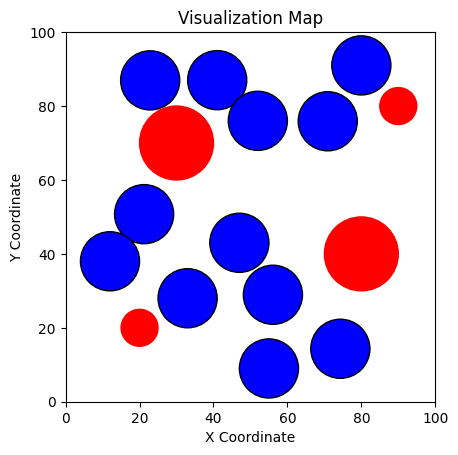

--------------------------------------------------------------------------------------------------------------------------------------
Generation  145 : [[47, 13], [41.699999999999996, 84.19999999999999], [8, 78], [10, 8], [87, 18], [17, 52], [68.7, 23.799999999999997], [56, 69], [50.6, 30.5], [35.519999999999996, 40.94], [53.92326522669164, 53.48017463281885], [69.51116729545555, 83.00962644636809], [22.86947098523775, 86.94773084684829], [41, 87], [55, 9], [74.32425323224575, 14.326532465066837], [21.226251201019483, 50.7459379845271], [47, 43], [33, 28], [80, 91], [52, 76], [12, 38], [56.07755075563884, 28.933915442729518], [70.91992535302161, 75.88156430605832], [48, 42], [38, 31], [7.279099047632738, 87.17545761552097], [60.94504298840282, 6.262051552604727], [28.98357043093874, 47.579305129224906], [40, 11], [42.827784020990435, 92.07568355659421], [10, 69], [53.54487510451622, 69.32173637735357], [68.277658797084, 64.01420052647428], [18, 35], [65.08100445920643, 112.44755593238

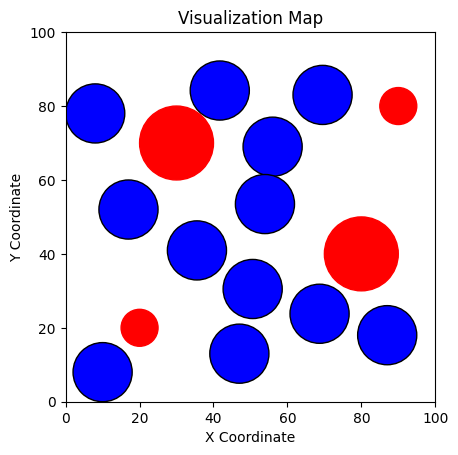

--------------------------------------------------------------------------------------------------------------------------------------
Generation  146 : [[61, 9], [41.489999999999995, 85.03999999999999], [72, 62], [29.297275969673723, 9.89795973952005], [41, 56], [89, 62], [57.989999999999995, 25.059999999999995], [47, 14], [12, 9], [28.464, 40.058], [54.56955088537579, 46.116296875792045], [69.93379471272536, 80.87120780427516], [47, 13], [41.699999999999996, 84.19999999999999], [8, 78], [10, 8], [87, 18], [17, 52], [68.7, 23.799999999999997], [56, 69], [50.6, 30.5], [35.519999999999996, 40.94], [53.92326522669164, 53.48017463281885], [69.51116729545555, 83.00962644636809], [48.68064742050681, 45.07274300377072], [52, 82], [87, 21], [53.02282809397964, 19.563829135580843], [10, 44], [33.73923052148211, 8.552243723973326], [33.054154990244896, 93.65777139465615], [1.1596746568380194, 71.94104467480571], [47.20933178331609, 66.20271101469507], [73.37661761247628, 65.0060582716201], [29.

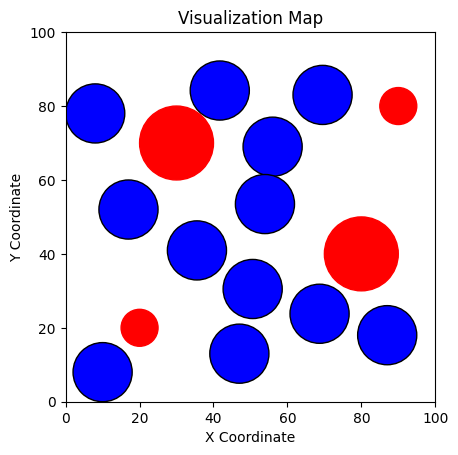

--------------------------------------------------------------------------------------------------------------------------------------
Generation  147 : [[56.8, 10.2], [41.553, 84.78799999999998], [52.8, 66.8], [9, 31], [13, 85], [67.39999999999999, 59.0], [66, 25], [49.7, 30.5], [90, 67], [30.580799999999996, 40.322599999999994], [54.37566518777054, 48.32546020290008], [69.80700648754441, 81.51273339690303], [47, 13], [41.699999999999996, 84.19999999999999], [8, 78], [10, 8], [87, 18], [17, 52], [68.7, 23.799999999999997], [56, 69], [50.6, 30.5], [35.519999999999996, 40.94], [53.92326522669164, 53.48017463281885], [69.51116729545555, 83.00962644636809], [29, 30], [45, 24], [89, 23], [12, 38], [37, 92], [75, 77], [65.27843602801264, 28.574341102022924], [49.62201481486352, 7.982924511633154], [6.720486672113466, 9.504384461366662], [36.747472482763726, 47.965473923265414], [61.57652070915721, 60.72462235748465], [68.51161088792783, 91.19622399226921]]
Generation  147  Objective Functio

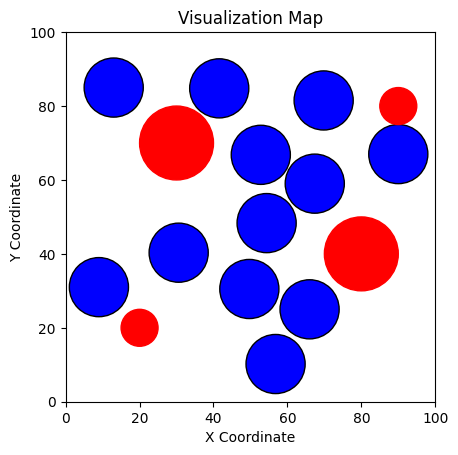

--------------------------------------------------------------------------------------------------------------------------------------
Generation  148 : [[15, 88], [77, 92], [90, 15], [38, 86], [61.099999999999994, 55.8], [62, 90], [63, 21], [20, 46], [41.08, 15.45], [34.455999999999996, 38.181999999999995], [56.07697956800749, 35.644052389845655], [85.25335018863666, 62.70288793391042], [44, 56], [82.56833009046888, 15.982613422460918], [75, 75], [27.996129184320083, 88.89812468905487], [66, 61], [61.752421396008145, 1.6885848604380076], [29, 36], [4.206133159890098, 32.345084719921616], [39.03377433992051, 0.5127504443137134], [41.29540112551844, 27.407693042382807], [67.51072607671513, 23.317231703568446], [50, 72], [44, 56], [82.56833009046888, 15.982613422460918], [75, 75], [27.996129184320083, 88.89812468905487], [66, 61], [61.752421396008145, 1.6885848604380076], [29, 36], [4.206133159890098, 32.345084719921616], [39.03377433992051, 0.5127504443137134], [41.29540112551844, 27.40

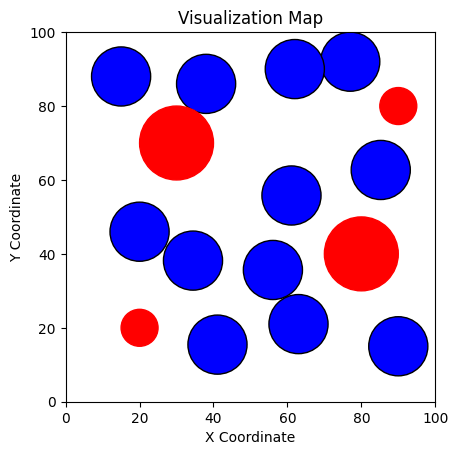

--------------------------------------------------------------------------------------------------------------------------------------
Generation  149 : [[33, 17], [15, 56], [8, 14], [33.39729042902405, 87.4286872823384], [57, 70], [62.4266949772057, 17.682009402306605], [25, 41], [6.244293211923068, 39.44155930394513], [45.32364203794435, 6.658925311019599], [78, 8], [49.95750825370059, 40.32206219249791], [52, 91], [58.44451573218383, 77.20045092949744], [72, 68], [73.6504327402166, 8.228085853218198], [37.700827703307226, 92.0], [22, 47], [74, 88], [91.93278450483388, 19.07282098863891], [5.0038474493774485, 46.18939616112742], [56.32455000476399, 31.355097223511937], [37.03616548642926, 50.54444270102235], [41, 19], [30.70772746561783, 30.831344936509858], [58.44451573218383, 77.20045092949744], [72, 68], [73.6504327402166, 8.228085853218198], [37.700827703307226, 92.0], [22, 47], [74, 88], [91.93278450483388, 19.07282098863891], [5.0038474493774485, 46.18939616112742], [56.3245500

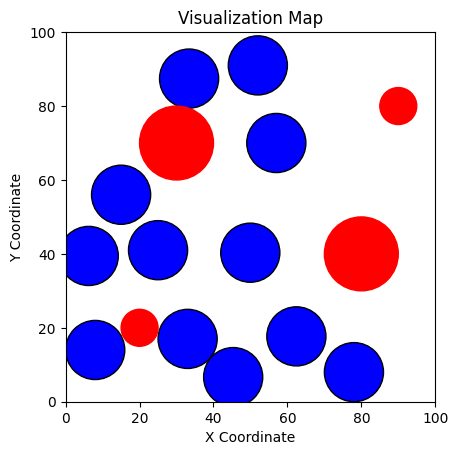

--------------------------------------------------------------------------------------------------------------------------------------
Generation  150 : [[75, 87], [15, 57], [70, 67], [34.688351611309, 88.80008109763688], [60, 88], [20, 34], [62, 40], [5.872159483159382, 41.465910361099816], [48.62391442799024, 14.0677768847673], [65.71084964592877, 20.763332810306704], [47.27025577759041, 33.92544353474854], [52, 71], [33, 17], [15, 56], [8, 14], [33.39729042902405, 87.4286872823384], [57, 70], [62.4266949772057, 17.682009402306605], [25, 41], [6.244293211923068, 39.44155930394513], [45.32364203794435, 6.658925311019599], [78, 8], [49.95750825370059, 40.32206219249791], [52, 91], [53.732244074395346, 85.48058616623064], [74.90583516598713, 69.64965842585235], [82.80119615582339, 9.203678331757397], [42.4688402595603, 101.97932488503356], [71, 24], [49, 33], [8, 81], [2.074800093661108, 38.71847599615184], [27, 39], [49, 60], [62, 43], [38, 20]]
Generation  150  Objective Function : [3

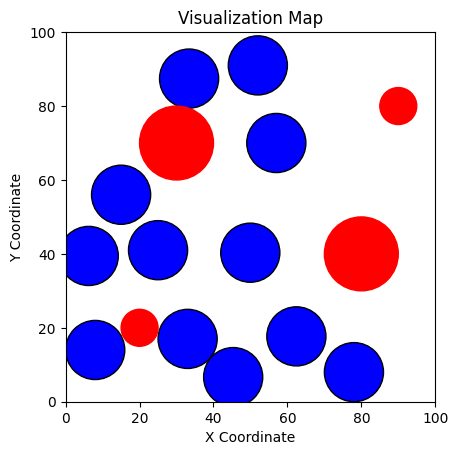

--------------------------------------------------------------------------------------------------------------------------------------
Generation  151 : [[60.11257085207674, 85.93641031636145], [56.93408461619099, 65.85476089809664], [37, 13], [40.13469366508491, 98.02555174881455], [92, 59], [20, 54], [79, 16], [3.21400791051059, 39.54270630563623], [79, 69], [27, 38], [57.58107673327712, 40.27763306042456], [42.199999999999996, 35.3], [33, 17], [15, 56], [8, 14], [33.39729042902405, 87.4286872823384], [57, 70], [62.4266949772057, 17.682009402306605], [25, 41], [6.244293211923068, 39.44155930394513], [45.32364203794435, 6.658925311019599], [78, 8], [49.95750825370059, 40.32206219249791], [52, 91], [46, 19], [68, 8], [69.81417948140054, 66.85471847912613], [28.984368436157336, 92.0], [66, 92], [24.699460568068048, 36.85262686672649], [11, 55], [0.5997905543665265, 33.45626605254563], [38.783135125703716, 5.661361037230826], [78.68464878271884, 22.431240840666476], [60.69375863589453, 4

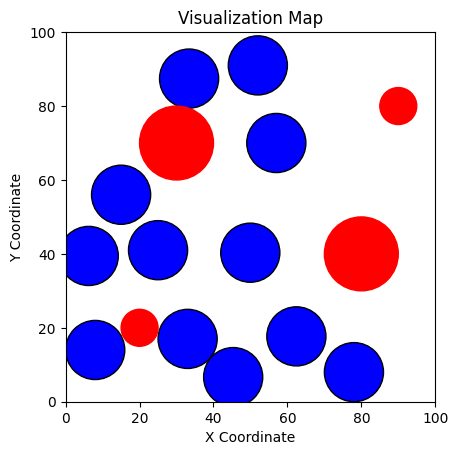

--------------------------------------------------------------------------------------------------------------------------------------
Generation  152 : [[75, 81], [83, 66], [37, 30], [32.07341383116404, 88.80008109763688], [17, 88], [51.108524654464404, 23.433194641632568], [20.8, 45.2], [4.550942414656105, 37.64597132852528], [43.36148996427216, 6.359656028882966], [78.20539463481565, 12.329372252199942], [53.178383368358766, 40.54719956273439], [54.09875501191558, 87.34864181648558], [33, 17], [15, 56], [8, 14], [33.39729042902405, 87.4286872823384], [57, 70], [62.4266949772057, 17.682009402306605], [25, 41], [6.244293211923068, 39.44155930394513], [45.32364203794435, 6.658925311019599], [78, 8], [49.95750825370059, 40.32206219249791], [52, 91], [74, 57], [59, 57], [63.171939613313675, 79.45105061814039], [40.17468277771257, 89.53138744811898], [73.5421538406371, 106.7007985149001], [8, 34], [24, 33], [-5.97510429661137, 24.38629678113257], [41.4001554018715, 15.03241431585202], [77

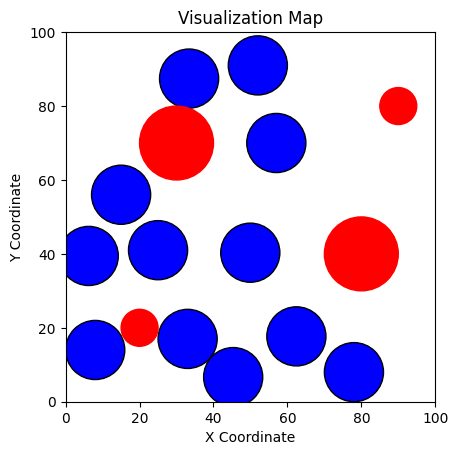

--------------------------------------------------------------------------------------------------------------------------------------
Generation  153 : [[86, 60], [62.599999999999994, 63.0], [71, 90], [33, 17], [76, 71], [54.50397575128679, 21.707839069834776], [22.06, 43.94], [5.058947653836194, 38.18464772115123], [43.95013558637381, 6.449436813523955], [78.14377624437094, 11.030560576539958], [52.21212083396131, 40.479658351663446], [53.4691285083409, 88.44404927153991], [33, 17], [15, 56], [8, 14], [33.39729042902405, 87.4286872823384], [57, 70], [62.4266949772057, 17.682009402306605], [25, 41], [6.244293211923068, 39.44155930394513], [45.32364203794435, 6.658925311019599], [78, 8], [49.95750825370059, 40.32206219249791], [52, 91], [63, 22], [64, 52], [38, 36], [38.08246855433914, 98.42842369921406], [66.65325295223887, 114.86990717379115], [75, 11], [46, 62], [6.949631430306507, 31.61813692147855], [40.053774338279496, 13.726735035227808], [14, 57], [24, 89], [71.19117223315065, 

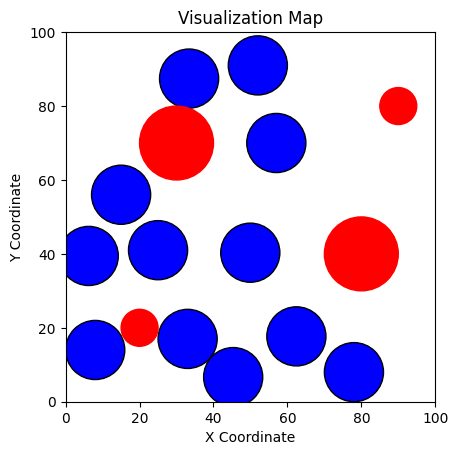

--------------------------------------------------------------------------------------------------------------------------------------
Generation  154 : [[53.99999999999999, 20.5], [69, 58], [15, 8], [36.67691511674461, 95.12850277415136], [63.75727706656721, 101.4089350216538], [71.22800849316171, 13.00460282069198], [86, 21], [6.738029964791474, 33.96516363621852], [41.63473464817895, 11.606392117965346], [33.199999999999996, 42.3], [51, 89], [65.43382056320546, 84.74849903902336], [33, 17], [15, 56], [8, 14], [33.39729042902405, 87.4286872823384], [57, 70], [62.4266949772057, 17.682009402306605], [25, 41], [6.244293211923068, 39.44155930394513], [45.32364203794435, 6.658925311019599], [78, 8], [49.95750825370059, 40.32206219249791], [52, 91], [91, 63], [56, 59], [70.39780869427356, 88.36126767293513], [9, 83], [77.05658308371206, 68.93267760167767], [61.715357739798264, 31.700328379068466], [34, 50], [14.016552461274733, 47.114229660817585], [45.98096190129548, 16.646048968790062], 

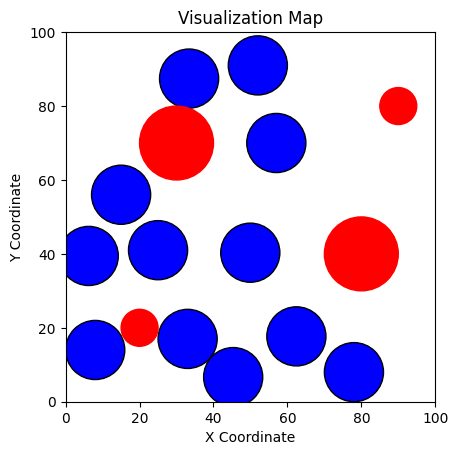

--------------------------------------------------------------------------------------------------------------------------------------
Generation  155 : [[61, 53], [69, 85], [51.67846608599149, 66.05288737105458], [16.319187128707217, 84.32860618470151], [71.03960815859844, 69.25287432117437], [61.928758911020495, 27.494832686039906], [31.299999999999997, 47.3], [11.684874686469234, 44.81242855375585], [45.78376594229014, 13.649911871458922], [78.27661863160392, 12.695752616703457], [45.66334006796135, 38.95795697850584], [51.71183419441733, 91.69999999999999], [33, 17], [15, 56], [8, 14], [33.39729042902405, 87.4286872823384], [57, 70], [62.4266949772057, 17.682009402306605], [25, 41], [6.244293211923068, 39.44155930394513], [45.32364203794435, 6.658925311019599], [78, 8], [49.95750825370059, 40.32206219249791], [52, 91], [56.18357058368203, 34.47290691417677], [71.14895302903753, 56.81092375380797], [13, 88], [44.28933808522275, 92.0], [28, 89], [63.44279625224955, 19.93018361080763]

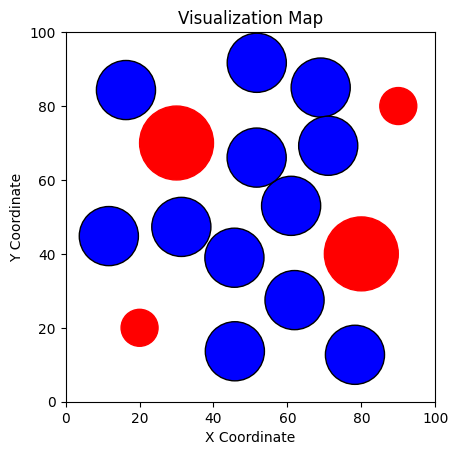

--------------------------------------------------------------------------------------------------------------------------------------
Generation  156 : [[12, 71], [52.8, 76.3], [35, 24], [71, 87], [66.8277257110189, 69.47701202482206], [62.07813973087605, 24.550985700919917], [29.409999999999997, 45.41], [10.052700244105385, 43.20116777881263], [45.645728770986395, 11.552615903327125], [78.19363304212274, 11.287026831692419], [46.95159052368312, 39.36718854270346], [51.798283936092126, 91.48999999999998], [61, 53], [69, 85], [51.67846608599149, 66.05288737105458], [16.319187128707217, 84.32860618470151], [71.03960815859844, 69.25287432117437], [61.928758911020495, 27.494832686039906], [31.299999999999997, 47.3], [11.684874686469234, 44.81242855375585], [45.78376594229014, 13.649911871458922], [78.27661863160392, 12.695752616703457], [45.66334006796135, 38.95795697850584], [51.71183419441733, 91.69999999999999], [55.04389747154948, 47.55757759700987], [77, 86], [8.925622194929044, 99.4

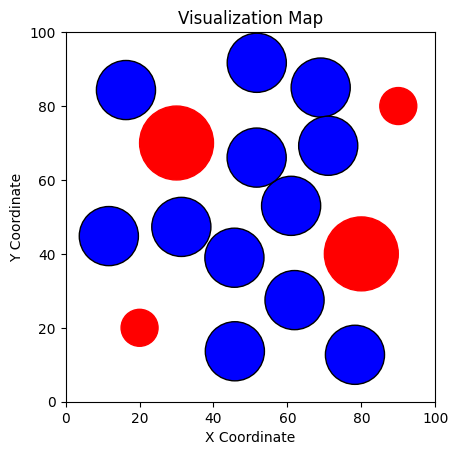

--------------------------------------------------------------------------------------------------------------------------------------
Generation  157 : [[75, 61], [70, 89], [27.177686658478713, 46.626594760475875], [16, 82], [36, 87], [32, 9], [44.829907758761806, 33.58938450703402], [11.536890170873768, 46.44081744516884], [47.35380626262602, 15.882889981036476], [81.43554312948592, 13.900918782184693], [56.86496038941196, 46.906519947400184], [54.46110056170909, 85.64774601699283], [61, 53], [69, 85], [51.67846608599149, 66.05288737105458], [16.319187128707217, 84.32860618470151], [71.03960815859844, 69.25287432117437], [61.928758911020495, 27.494832686039906], [31.299999999999997, 47.3], [11.684874686469234, 44.81242855375585], [45.78376594229014, 13.649911871458922], [78.27661863160392, 12.695752616703457], [45.66334006796135, 38.95795697850584], [51.71183419441733, 91.69999999999999], [28, 48], [79.41290644666579, 86.87066884400714], [19.042861778510822, 104.54934019837332], [40.

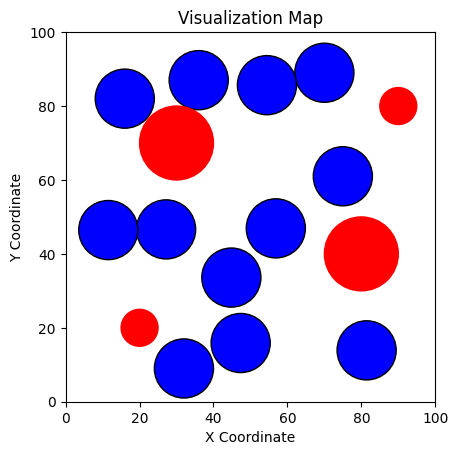

--------------------------------------------------------------------------------------------------------------------------------------
Generation  158 : [[49, 81], [76.58903451266605, 87.509468190805], [21.48330924250119, 87.17251656700408], [91, 56], [29.699999999999996, 48.5], [74, 62], [66.30239300555222, 17.788721121471436], [11.877277529956686, 49.32446437396458], [51, 48], [94.26633362608624, 25.492708107063095], [49.25948811682358, 21.071955984220054], [62.76726414463052, 73.90421308020748], [75, 61], [70, 89], [27.177686658478713, 46.626594760475875], [16, 82], [36, 87], [32, 9], [44.829907758761806, 33.58938450703402], [11.536890170873768, 46.44081744516884], [47.35380626262602, 15.882889981036476], [81.43554312948592, 13.900918782184693], [56.86496038941196, 46.906519947400184], [54.46110056170909, 85.64774601699283], [55, 56], [85.54699571476307, 92.06401952749789], [18.951503837636885, 118.6508265011395], [49, 77], [16, 87], [40.63109812600901, 102.03922415239586], [75, 62]

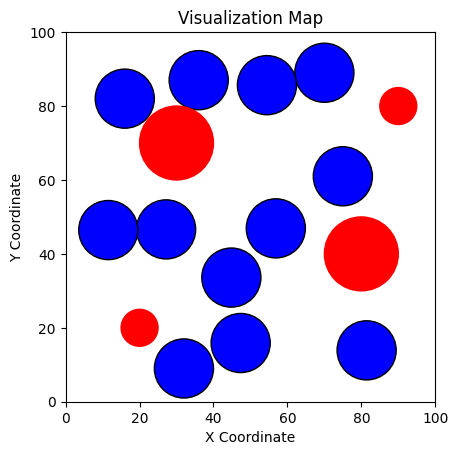

--------------------------------------------------------------------------------------------------------------------------------------
Generation  159 : [[30, 41], [80.88289700033414, 91.14481366924852], [9, 62], [84, 68], [22.0, 87.0], [50, 75], [65.94897232762854, 53.47681535211021], [12.373215669124933, 47.53564964226027], [48, 44], [76.23066293884577, 17.47027563465541], [50.72039875655332, 23.905642880713252], [62.38429906578793, 84.395524423726], [75, 61], [70, 89], [27.177686658478713, 46.626594760475875], [16, 82], [36, 87], [32, 9], [44.829907758761806, 33.58938450703402], [11.536890170873768, 46.44081744516884], [47.35380626262602, 15.882889981036476], [81.43554312948592, 13.900918782184693], [56.86496038941196, 46.906519947400184], [54.46110056170909, 85.64774601699283], [56, 83], [84, 13], [34.578503384365334, 92.0], [90, 67], [28.8878365866775, 45.317564895978066], [68.55042573287511, 58.253368476045566], [66.05838285802449, 22.618874368460933], [15.290026931089923, 51.150

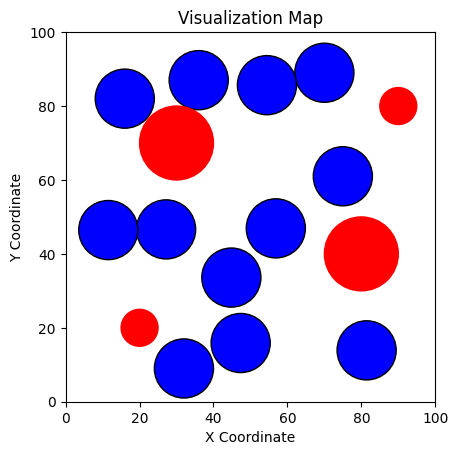

--------------------------------------------------------------------------------------------------------------------------------------
Generation  160 : [[41, 33], [36, 12], [48, 91], [85.8, 67.69999999999999], [88, 19], [55.56512771986253, 69.97601054281367], [13, 32], [13.24825904771443, 48.620191734267195], [49.66759002270925, 45.816208283476755], [65.96146405719203, 23.629192944258783], [50.07877584964112, 20.683157823080766], [65.94843579320616, 83.02220476581836], [75, 61], [70, 89], [27.177686658478713, 46.626594760475875], [16, 82], [36, 87], [32, 9], [44.829907758761806, 33.58938450703402], [11.536890170873768, 46.44081744516884], [47.35380626262602, 15.882889981036476], [81.43554312948592, 13.900918782184693], [56.86496038941196, 46.906519947400184], [54.46110056170909, 85.64774601699283], [56, 90], [87.33626448517361, 4.787216608150043], [39.955050165445925, 97.31582499165229], [18, 87], [42, 21], [59.13700866253369, 53.496027083144796], [64, 31], [15.559907596687395, 46.488

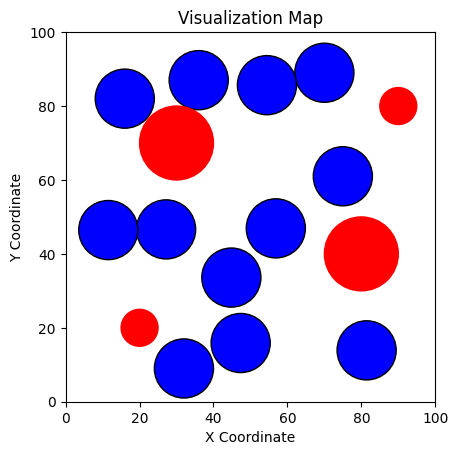

--------------------------------------------------------------------------------------------------------------------------------------
Generation  161 : [[15, 80], [71.93538513962153, 6.95105162570503], [34, 9], [37, 47], [60, 90], [78, 62], [50, 78], [14.866413031995505, 47.12777462839792], [48.77965840537556, 59.11587957827284], [54.37618728640762, 34.24829244462361], [52.913136233338705, 13.948240186442632], [66.40164451351387, 74.8740272187217], [75, 61], [70, 89], [27.177686658478713, 46.626594760475875], [16, 82], [36, 87], [32, 9], [44.829907758761806, 33.58938450703402], [11.536890170873768, 46.44081744516884], [47.35380626262602, 15.882889981036476], [81.43554312948592, 13.900918782184693], [56.86496038941196, 46.906519947400184], [54.46110056170909, 85.64774601699283], [38.984666638304425, 35.833408119632246], [35.504444274145456, 17.631018430956274], [22, 92], [89.88974878956998, 67.42085716877068], [92.0, 24.758982418215794], [46.91192346688118, 84.10910244278031], [12.2655

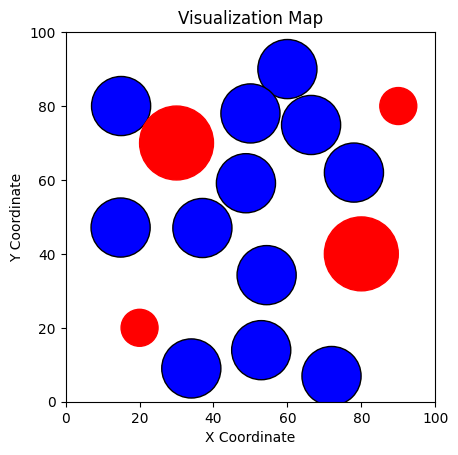

--------------------------------------------------------------------------------------------------------------------------------------
Generation  162 : [[9, 10], [57, 72], [35, 9], [9, 29], [65.39999999999999, 89.1], [73.99999999999999, 21.599999999999998], [73.64897232762854, 57.6768153521102], [59, 10], [47.8061418787878, 48.86486699431094], [30.730662938845775, 27.270275634655405], [26.15948811682359, 47.67195598422005], [48.53833016851272, 34.094323805097844], [25.978783966922123, 89.13095070003175], [20, 44], [51, 50], [43.14432355441856, 25.557347289591405], [78.09222578354377, 92.0], [92.0, 17.60200327773413], [78, 61], [53.800515802095894, 92.0], [72, 76], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [25.978783966922123, 89.13095070003175], [20, 44], [51, 50], [43.14432355441856, 25.557347289591405], [78.09222578354377, 92.0], [92.0, 17.60200327773413], [78, 61], [53.800515802095894, 92.0], [72, 76], 

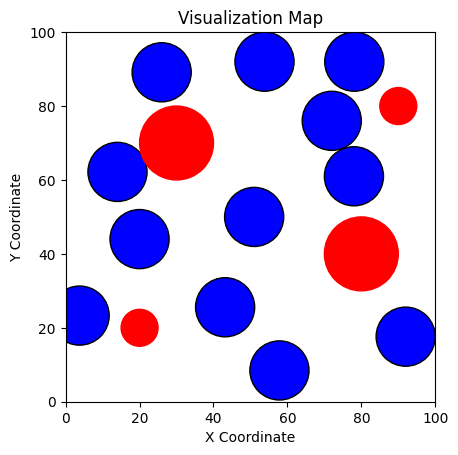

--------------------------------------------------------------------------------------------------------------------------------------
Generation  163 : [[25.97878396692212, 89.13095070003175], [20.0, 44.0], [50.99999999999999, 50.0], [43.14432355441856, 25.5573472895914], [78.09222578354377, 91.99999999999999], [91.99999999999999, 17.60200327773413], [78.0, 61.0], [53.80051580209589, 91.99999999999999], [72.0, 76.0], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [25.978783966922123, 89.13095070003175], [20, 44], [51, 50], [43.14432355441856, 25.557347289591405], [78.09222578354377, 92.0], [92.0, 17.60200327773413], [78, 61], [53.800515802095894, 92.0], [72, 76], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [10, 42], [53.35704201352117, 64.18087885948079], [47, 78], [0, 19.04389214608768], [77.01319365412806, 89.78043268000533], [80.89

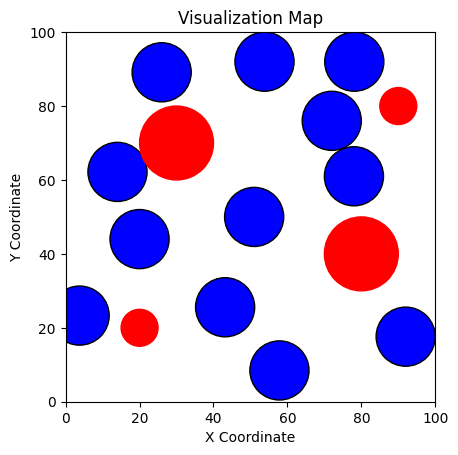

--------------------------------------------------------------------------------------------------------------------------------------
Generation  164 : [[25.97878396692212, 89.13095070003175], [20.0, 44.0], [50.99999999999999, 50.0], [43.14432355441856, 25.5573472895914], [78.09222578354377, 91.99999999999999], [91.99999999999999, 17.60200327773413], [78.0, 61.0], [53.80051580209589, 91.99999999999999], [72.0, 76.0], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [25.97878396692212, 89.13095070003175], [20.0, 44.0], [50.99999999999999, 50.0], [43.14432355441856, 25.5573472895914], [78.09222578354377, 91.99999999999999], [91.99999999999999, 17.60200327773413], [78.0, 61.0], [53.80051580209589, 91.99999999999999], [72.0, 76.0], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [23.466459863317777, 37.03362913470807], [9, 42], [47.973461427756

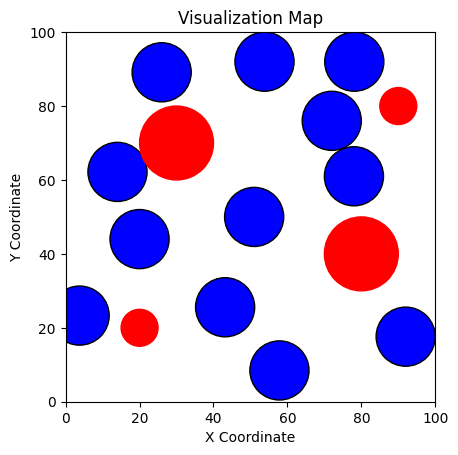

--------------------------------------------------------------------------------------------------------------------------------------
Generation  165 : [[25.97878396692212, 89.13095070003175], [20.0, 44.0], [50.99999999999999, 50.0], [43.14432355441856, 25.5573472895914], [78.09222578354377, 91.99999999999999], [91.99999999999999, 17.60200327773413], [78.0, 61.0], [53.80051580209589, 91.99999999999999], [72.0, 76.0], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [25.97878396692212, 89.13095070003175], [20.0, 44.0], [50.99999999999999, 50.0], [43.14432355441856, 25.5573472895914], [78.09222578354377, 91.99999999999999], [91.99999999999999, 17.60200327773413], [78.0, 61.0], [53.80051580209589, 91.99999999999999], [72.0, 76.0], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [74, 82], [5.830651752464837, 55.80496207963603], [52.480080508992

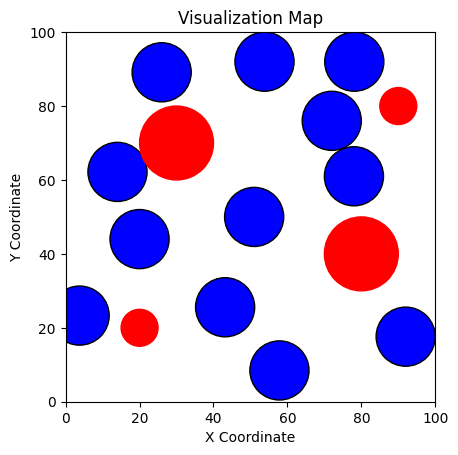

--------------------------------------------------------------------------------------------------------------------------------------
Generation  166 : [[25.97878396692212, 89.13095070003175], [20.0, 44.0], [50.99999999999999, 50.0], [43.14432355441856, 25.5573472895914], [78.09222578354377, 91.99999999999999], [91.99999999999999, 17.60200327773413], [78.0, 61.0], [53.80051580209589, 91.99999999999999], [72.0, 76.0], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [25.97878396692212, 89.13095070003175], [20.0, 44.0], [50.99999999999999, 50.0], [43.14432355441856, 25.5573472895914], [78.09222578354377, 91.99999999999999], [91.99999999999999, 17.60200327773413], [78.0, 61.0], [53.80051580209589, 91.99999999999999], [72.0, 76.0], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [42, 11], [6.7843325334752755, 50.743617493629856], [90, 66], [45.

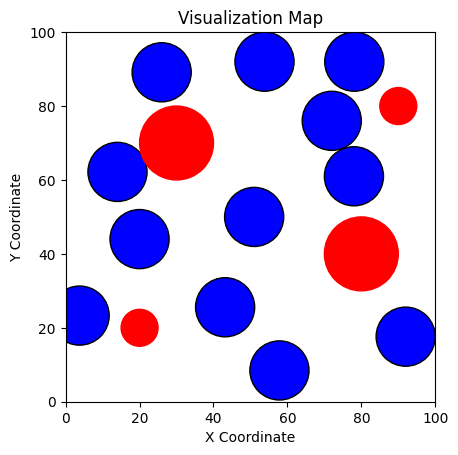

--------------------------------------------------------------------------------------------------------------------------------------
Generation  167 : [[89, 15], [10.749032773432692, 48.720532245540895], [62, 92], [45.10105479159614, 25.764238118867922], [14, 32], [67.0061155633046, 62.232642961186436], [35.13489911832149, 87.56862057612383], [66, 8], [88, 64], [50.13419090652314, 48.291537649941695], [58.39724461444224, 76.51906454556303], [9, 70], [25.97878396692212, 89.13095070003175], [20.0, 44.0], [50.99999999999999, 50.0], [43.14432355441856, 25.5573472895914], [78.09222578354377, 91.99999999999999], [91.99999999999999, 17.60200327773413], [78.0, 61.0], [53.80051580209589, 91.99999999999999], [72.0, 76.0], [3.780636355077128, 23.305125499805662], [14.026485211859208, 62.18184109636214], [57.84447485090901, 8.466060376105634], [42.58040071335034, 1.8379180701884739], [32, 47], [97.67326413174773, 60.57818555903225], [60.7124236697846, 19.208984035386642], [21.18361782043076, 35.

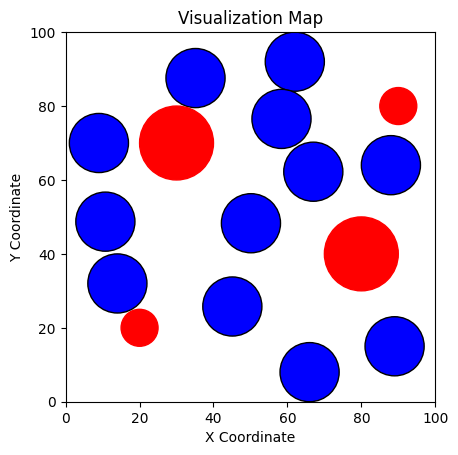

--------------------------------------------------------------------------------------------------------------------------------------
Generation  168 : [[55.306280499345235, 7.886542649131931], [45.5, 56.3], [84, 92], [40, 20], [21, 43], [48.63462836888087, 72.31476569125151], [26.97500624302651, 96.81849860208176], [81.36047133997637, 19.18878892848907], [30, 9], [61.0, 43.199999999999996], [69.31531105548422, 67.66789155448065], [40.0, 36.8], [79.83516447622172, 17.901695538145894], [65, 29], [30.046196576200124, 11.865978179305893], [7.635267641689824, 50.861880533385005], [37.61318015508001, 26.08233759820198], [52, 38], [44, 56], [28, 43], [18.036048433846616, 92.0], [56, 11], [59.57963675983663, 63.56083628453723], [50.47201085804028, 83.64656172046385], [79.83516447622172, 17.901695538145894], [65, 29], [30.046196576200124, 11.865978179305893], [7.635267641689824, 50.861880533385005], [37.61318015508001, 26.08233759820198], [52, 38], [44, 56], [28, 43], [18.036048433846616, 92.

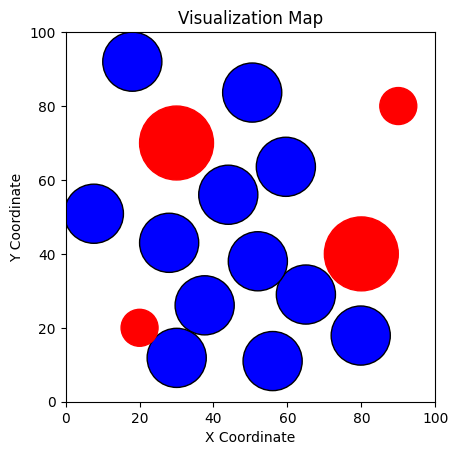

--------------------------------------------------------------------------------------------------------------------------------------
Generation  169 : [[79.83516447622172, 17.901695538145894], [65.0, 28.999999999999996], [30.046196576200124, 11.865978179305893], [7.635267641689823, 50.861880533385005], [37.61318015508, 26.08233759820198], [52.0, 38.0], [44.0, 56.0], [28.0, 43.0], [18.036048433846616, 91.99999999999999], [56.0, 11.0], [59.57963675983663, 63.56083628453723], [50.47201085804028, 83.64656172046385], [79.83516447622172, 17.901695538145894], [65, 29], [30.046196576200124, 11.865978179305893], [7.635267641689824, 50.861880533385005], [37.61318015508001, 26.08233759820198], [52, 38], [44, 56], [28, 43], [18.036048433846616, 92.0], [56, 11], [59.57963675983663, 63.56083628453723], [50.47201085804028, 83.64656172046385], [54.97433942018454, 4.567057567318775], [11, 31], [80.09584942397716, 89.56939979594382], [67, 76], [20.397590685390846, 53.79553652613325], [85, 57], [30.905

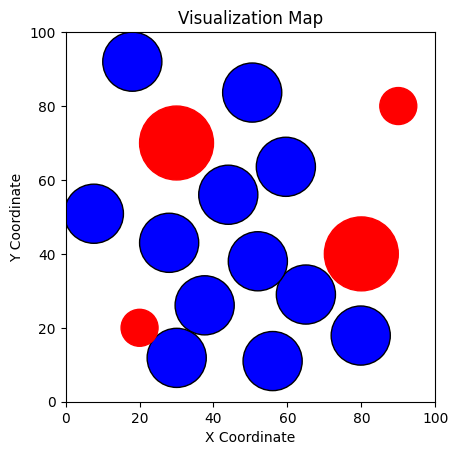

--------------------------------------------------------------------------------------------------------------------------------------
Generation  170 : [[79.83516447622172, 17.901695538145894], [65.0, 28.999999999999996], [30.046196576200124, 11.865978179305893], [7.635267641689823, 50.861880533385005], [37.61318015508, 26.08233759820198], [52.0, 38.0], [44.0, 56.0], [28.0, 43.0], [18.036048433846616, 91.99999999999999], [56.0, 11.0], [59.57963675983663, 63.56083628453723], [50.47201085804028, 83.64656172046385], [79.83516447622172, 17.901695538145894], [65.0, 28.999999999999996], [30.046196576200124, 11.865978179305893], [7.635267641689823, 50.861880533385005], [37.61318015508, 26.08233759820198], [52.0, 38.0], [44.0, 56.0], [28.0, 43.0], [18.036048433846616, 91.99999999999999], [56.0, 11.0], [59.57963675983663, 63.56083628453723], [50.47201085804028, 83.64656172046385], [82, 8], [3.1400929912138738, 23.554698880361116], [81, 67], [69.01671878776402, 89.38348256869713], [28.848218662

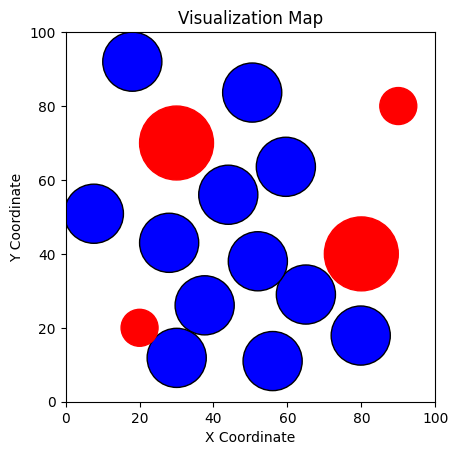

--------------------------------------------------------------------------------------------------------------------------------------
Generation  171 : [[80.4846151333552, 14.931186876702126], [78, 73], [36, 9], [44, 84], [22, 49], [58, 47], [9, 57], [45.41725045254654, 37.08287748635711], [8, 40], [51.8180545614147, 14.621073410091437], [58, 92], [52.13958817945422, 70.96489585995337], [79.83516447622172, 17.901695538145894], [65.0, 28.999999999999996], [30.046196576200124, 11.865978179305893], [7.635267641689823, 50.861880533385005], [37.61318015508, 26.08233759820198], [52.0, 38.0], [44.0, 56.0], [28.0, 43.0], [18.036048433846616, 91.99999999999999], [56.0, 11.0], [59.57963675983663, 63.56083628453723], [50.47201085804028, 83.64656172046385], [96.05303693796681, 17.142390238535885], [8, 90], [79.0409853491391, 65.84885133606862], [77.04467987588502, 103.86603156623616], [43.265082039289766, 50.123345307298486], [100.67497520899708, 51.64619211368024], [40.61105478917655, 98.6265808

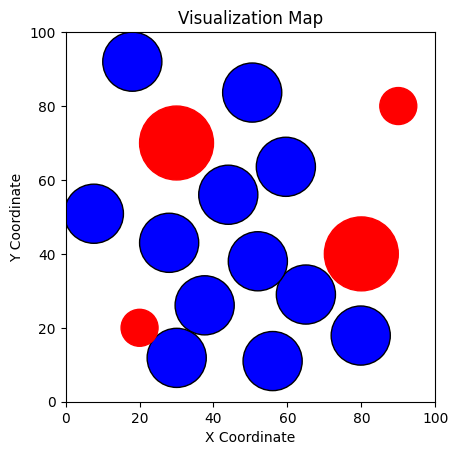

--------------------------------------------------------------------------------------------------------------------------------------
Generation  172 : [[84.70052621474525, 17.67390394826289], [47.9, 47.3], [8, 90], [75, 92], [39.30875072034293, 33.29463991093093], [26, 89], [89, 62], [22.599999999999998, 47.8], [68, 22], [54.234412808576295, 14.77380226826039], [59.5147004245792, 67.24760597965225], [8, 31], [79.83516447622172, 17.901695538145894], [65.0, 28.999999999999996], [30.046196576200124, 11.865978179305893], [7.635267641689823, 50.861880533385005], [37.61318015508, 26.08233759820198], [52.0, 38.0], [44.0, 56.0], [28.0, 43.0], [18.036048433846616, 91.99999999999999], [56.0, 11.0], [59.57963675983663, 63.56083628453723], [50.47201085804028, 83.64656172046385], [81.27652226695143, 9.643982232033174], [72, 22], [36.63837483500156, 18.171470649022258], [9, 9], [77, 60], [49.664907159475305, 57.05870408330555], [17.985324878122615, 54.61199282029498], [39.09381810077228, 40.169621

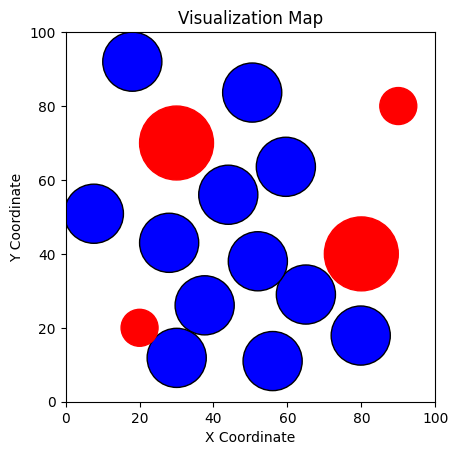

--------------------------------------------------------------------------------------------------------------------------------------
Generation  173 : [[83.6733250304071, 15.264927433393975], [92, 66], [10, 84], [54, 90], [50.616125504240046, 41.30624793765165], [30, 11], [67.69559746343678, 59.78359784608849], [33, 91], [67, 28], [55.00377107789575, 17.718281839555296], [57.208560287391954, 73.49249631294248], [23.78821176490203, 44.40574819323099], [79.83516447622172, 17.901695538145894], [65.0, 28.999999999999996], [30.046196576200124, 11.865978179305893], [7.635267641689823, 50.861880533385005], [37.61318015508, 26.08233759820198], [52.0, 38.0], [44.0, 56.0], [28.0, 43.0], [18.036048433846616, 91.99999999999999], [56.0, 11.0], [59.57963675983663, 63.56083628453723], [50.47201085804028, 83.64656172046385], [17, 90], [84.47962788163993, 20.067753148947872], [32.47141329945383, 12.004264739759346], [24, 41], [80, 60], [57.31927762053652, 57.77698672062198], [16, 59], [39, 47], [34, 

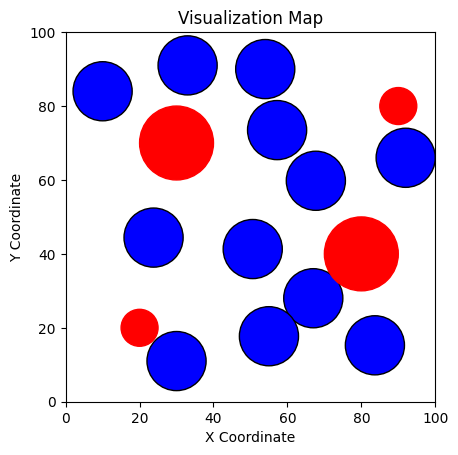

--------------------------------------------------------------------------------------------------------------------------------------
Generation  174 : [[82.52187686415148, 16.05595786481955], [13, 35], [61, 89], [8, 56], [36, 41], [36.6, 19.1], [76, 75], [92, 63], [52.31081453015398, 47.19999999999999], [55.30263975452702, 15.702797287688707], [57.919883229125354, 70.5129983044209], [69, 23], [83.6733250304071, 15.264927433393975], [92, 66], [10, 84], [54, 90], [50.616125504240046, 41.30624793765165], [30, 11], [67.69559746343678, 59.78359784608849], [33, 91], [67, 28], [55.00377107789575, 17.718281839555296], [57.208560287391954, 73.49249631294248], [23.78821176490203, 44.40574819323099], [7.510400674515591, 97.99691739266818], [95.7802503758133, 12.875512082815955], [37.77824152398121, 9.249318714273393], [69, 8], [92.62701007144122, 57.58812525882967], [55.26419662435638, 62.14863392940403], [39, 28], [42.3037102163291, 50.20743154790742], [26.741331808611257, 101.16270116856987],

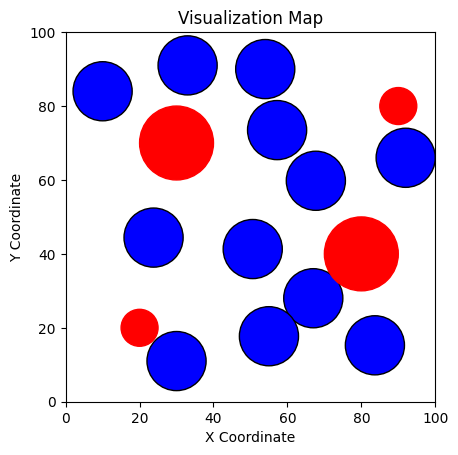

--------------------------------------------------------------------------------------------------------------------------------------
Generation  175 : [[36, 12], [94.6461752630693, 28.812858457971167], [53, 22], [83, 92], [8, 9], [63, 50], [47.608679239031034, 37.535079353826546], [74, 14], [29, 50], [29.801131323368722, 34.71548455186659], [47.30006966610234, 90.96536440615515], [62.86531225921881, 76.00538502885118], [83.6733250304071, 15.264927433393975], [92, 66], [10, 84], [54, 90], [50.616125504240046, 41.30624793765165], [30, 11], [67.69559746343678, 59.78359784608849], [33, 91], [67, 28], [55.00377107789575, 17.718281839555296], [57.208560287391954, 73.49249631294248], [23.78821176490203, 44.40574819323099], [90.14701237726203, 15.530486864443924], [11.914495998948984, 33.036355773907765], [53, 89], [13.096448712583166, 54.81542823901214], [27.901437620804867, 42.664800414529545], [35, 14], [72, 19], [24, 91], [59.62201322025685, 58.12544981525916], [51, 74], [71.245351764174

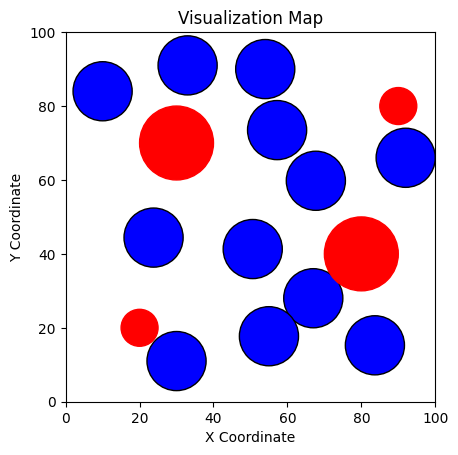

--------------------------------------------------------------------------------------------------------------------------------------
Generation  176 : [[50.30199750912213, 12.979478230018191], [66, 59], [11, 90], [74.3, 91.39999999999999], [70, 19], [8, 74], [19, 53], [61.699999999999996, 37.1], [89, 61], [37.36192324972683, 29.6163237381732], [50.27261685248922, 85.72350397819135], [51.14218211092378, 66.52549397816512], [83.6733250304071, 15.264927433393975], [92, 66], [10, 84], [54, 90], [50.616125504240046, 41.30624793765165], [30, 11], [67.69559746343678, 59.78359784608849], [33, 91], [67, 28], [55.00377107789575, 17.718281839555296], [57.208560287391954, 73.49249631294248], [23.78821176490203, 44.40574819323099], [94.63375180736729, 22.092352830570974], [7.303531457617302, 34.74758682457913], [67.28474632280212, 91.46018641528313], [10.017130364077499, 54.29254776804851], [36.66192251047005, 34.55250104317655], [48.299209665532786, 10.80052121902147], [82.09248977787149, 9.7071

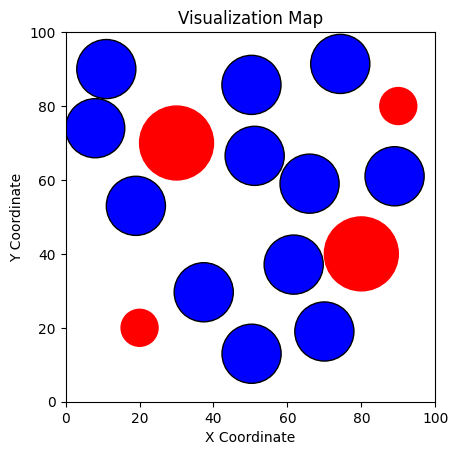

--------------------------------------------------------------------------------------------------------------------------------------
Generation  177 : [[42, 18], [58.39999999999999, 28.2], [27.5, 88.89999999999999], [76, 87], [16, 40], [10, 64], [37.808679239031036, 48.73507935382654], [57.49999999999999, 89.6], [49, 69], [65.50113132336872, 15.115484551866587], [53.56256808621758, 45.84774889388274], [66.6364635294706, 57.42172445796929], [38.69399881189946, 45.551656398512726], [35.47052850562288, 23.930911455755865], [41.96524137221829, 92.0], [43, 8], [13, 47], [20.35861938399763, 91.70857141131249], [89, 11], [60.406435349995334, 92.0], [59.398700454684594, 47.99074220971793], [10, 28], [58.440561828882615, 25.145520639402545], [88.90886587999724, 59.99001232816599], [38.69399881189946, 45.551656398512726], [35.47052850562288, 23.930911455755865], [41.96524137221829, 92.0], [43, 8], [13, 47], [20.35861938399763, 91.70857141131249], [89, 11], [60.406435349995334, 92.0], [59.39870

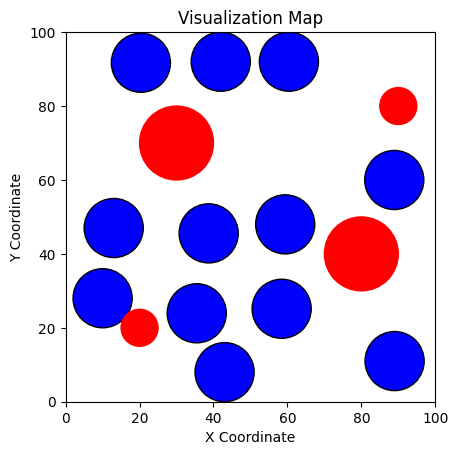

--------------------------------------------------------------------------------------------------------------------------------------
Generation  178 : [[38, 42], [81, 21], [31.839572411665486, 89.82999999999998], [77, 82], [15.1, 42.1], [63, 8], [63, 25], [58.371930604998596, 90.32], [52.11961013640537, 62.69722266291538], [48.850791926358106, 18.98083918630661], [55.02596620901709, 39.637080417538684], [73.31818423462859, 58.1922108190283], [38.69399881189946, 45.551656398512726], [35.47052850562288, 23.930911455755865], [41.96524137221829, 92.0], [43, 8], [13, 47], [20.35861938399763, 91.70857141131249], [89, 11], [60.406435349995334, 92.0], [59.398700454684594, 47.99074220971793], [10, 28], [58.440561828882615, 25.145520639402545], [88.90886587999724, 59.99001232816599], [40.1048327392475, 16.66805082154199], [92, 16], [36.0534312520956, 88.4078512497888], [54, 38], [19, 88], [12.600193572609497, 58.42312952661239], [31.633386051880464, 50.99079850912503], [69.9372840166598, 92.0]

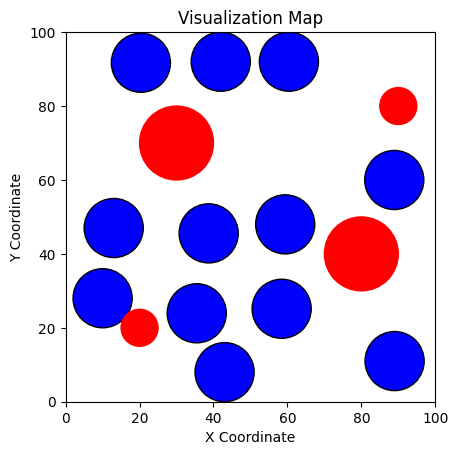

--------------------------------------------------------------------------------------------------------------------------------------
Generation  179 : [[57, 8], [75.04115855168686, 18.37927343672676], [37.826974288132405, 89.48549587485216], [26, 51], [91, 54], [76, 79], [14, 92], [67.07802941666046, 91.99999999999999], [56.969312124161206, 67.55239685033183], [42.88858537595755, 19.44763468626874], [50.182511437784186, 45.709496755587125], [55, 28], [38.69399881189946, 45.551656398512726], [35.47052850562288, 23.930911455755865], [41.96524137221829, 92.0], [43, 8], [13, 47], [20.35861938399763, 91.70857141131249], [89, 11], [60.406435349995334, 92.0], [59.398700454684594, 47.99074220971793], [10, 28], [58.440561828882615, 25.145520639402545], [88.90886587999724, 59.99001232816599], [36.105088158947396, 38.29256315081683], [14, 61], [44.81757240101295, 92.0], [13, 9], [9.493756055640796, 44.22493988853115], [62.75101932947889, 0.34992933323331954], [70, 59], [67.4020247757324, 83.592

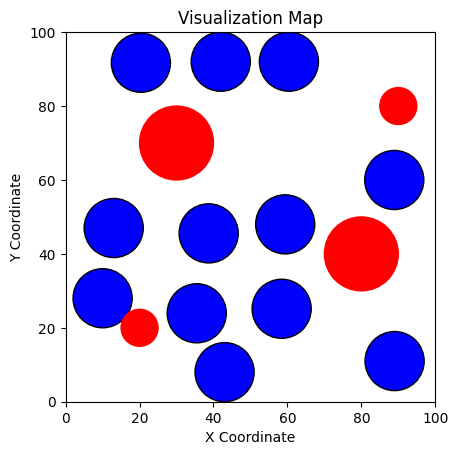

--------------------------------------------------------------------------------------------------------------------------------------
Generation  180 : [[9, 52], [42, 8], [88, 64], [22.099999999999998, 38.4], [92, 16], [46, 87], [35, 28], [67.17522802438204, 89.47765313432592], [54.64862439929682, 68.17325112188782], [17, 85], [51.05944902877533, 42.38400968070955], [53.2, 22.299999999999997], [38.69399881189946, 45.551656398512726], [35.47052850562288, 23.930911455755865], [41.96524137221829, 92.0], [43, 8], [13, 47], [20.35861938399763, 91.70857141131249], [89, 11], [60.406435349995334, 92.0], [59.398700454684594, 47.99074220971793], [10, 28], [58.440561828882615, 25.145520639402545], [88.90886587999724, 59.99001232816599], [63, 11], [77, 68], [9, 30], [18.549637033463316, 45.95057737180809], [92.0, 67.33386855498283], [8, 67], [13.183152700571348, 92.0], [78.41204070851819, 85.40139952516533], [63.73303314574389, 76.73275723921196], [31, 9], [61.90350680138518, 45.387760677908574],

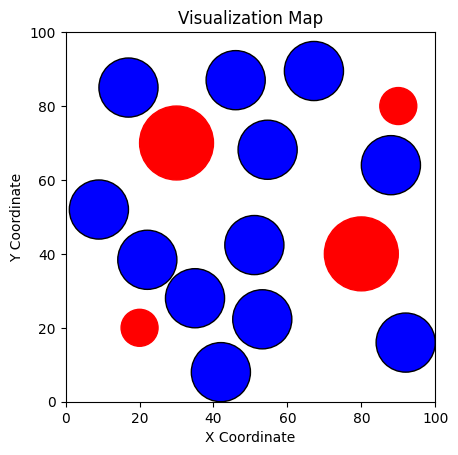

--------------------------------------------------------------------------------------------------------------------------------------
Generation  181 : [[39, 15], [47, 62], [23, 92], [42, 85], [88, 65], [9, 44], [9, 63], [75.04099690327735, 86.6242756079135], [61.00771052180976, 74.16490540401472], [26.799999999999997, 31.8], [58.650289469602214, 44.486635378748865], [52.62215249407263, 26.638530711835866], [9, 52], [42, 8], [88, 64], [22.099999999999998, 38.4], [92, 16], [46, 87], [35, 28], [67.17522802438204, 89.47765313432592], [54.64862439929682, 68.17325112188782], [17, 85], [51.05944902877533, 42.38400968070955], [53.2, 22.299999999999997], [71.90002981857288, 6.179163879681925], [64, 87], [4.588796852114319, 29.954532967086024], [11.34084402607689, 44.98121509802022], [103.70345283164704, 68.99587303524368], [51, 63], [23.120339384631343, 97.40112610948296], [8, 64], [78.23691251654765, 70.29043127851367], [44.13144246677803, 17.03031997920547], [43, 50], [59.406600933351996, 2

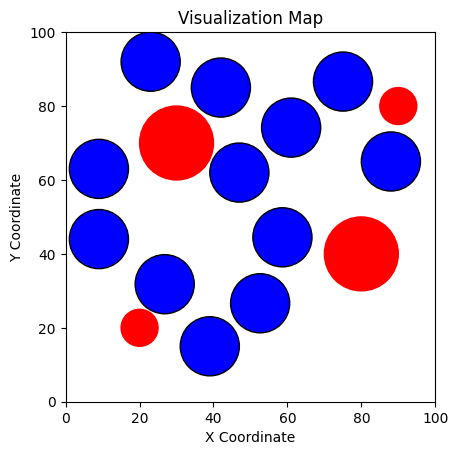

--------------------------------------------------------------------------------------------------------------------------------------
Generation  182 : [[90, 11], [42, 11], [11, 85], [14.56859081825382, 43.006850568614155], [100.19241698215292, 53.09711112467057], [49.49999999999999, 70.19999999999999], [45, 88], [85, 63], [71.1604260813724, 69.65527723152591], [38, 29], [45.4178347086326, 47.715202904212866], [57.54462065334639, 27.516565754990047], [39, 15], [47, 62], [23, 92], [42, 85], [88, 65], [9, 44], [9, 63], [75.04099690327735, 86.6242756079135], [61.00771052180976, 74.16490540401472], [26.799999999999997, 31.8], [58.650289469602214, 44.486635378748865], [52.62215249407263, 26.638530711835866], [62.78014750938269, 19.961928797775407], [61.63176462360384, 89.10553163898774], [39, 15], [19.056016372798947, 42.07702145402139], [104.40281698279449, 68.04124304708046], [48.911311474527416, 67.62912457395845], [28.48049806522017, 99.53377295029551], [87, 19], [10, 30], [56, 50], [3

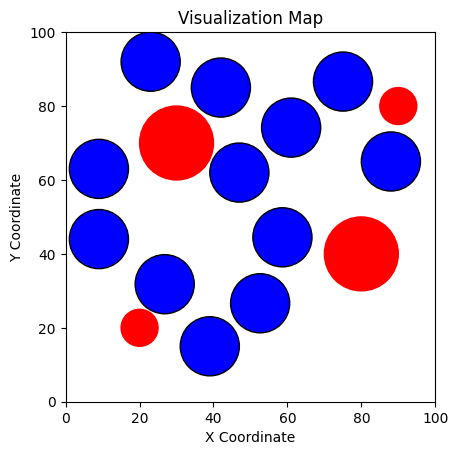

--------------------------------------------------------------------------------------------------------------------------------------
Generation  183 : [[74.69999999999999, 12.2], [14, 39], [14.599999999999998, 87.1], [78, 85], [96.53469188750705, 56.66797778726939], [44, 92], [57, 8], [89, 19], [68.11461141350361, 71.00816568327255], [34.64, 29.839999999999996], [49.38757113692348, 46.74663264657366], [56.06788020556426, 27.25315524204379], [39, 15], [47, 62], [23, 92], [42, 85], [88, 65], [9, 44], [9, 63], [75.04099690327735, 86.6242756079135], [61.00771052180976, 74.16490540401472], [26.799999999999997, 31.8], [58.650289469602214, 44.486635378748865], [52.62215249407263, 26.638530711835866], [47, 90], [67.23451479590857, 82.40174180729709], [49.09835724568683, 28.09134591891362], [11, 85], [104.26501991224995, 73.40816804633252], [33, 22], [22.62283141373935, 97.42869454615658], [33, 40], [7.77226243172264, 26.404054116672732], [49.40414762997728, 50.87657685188516], [71, 9], [69, 

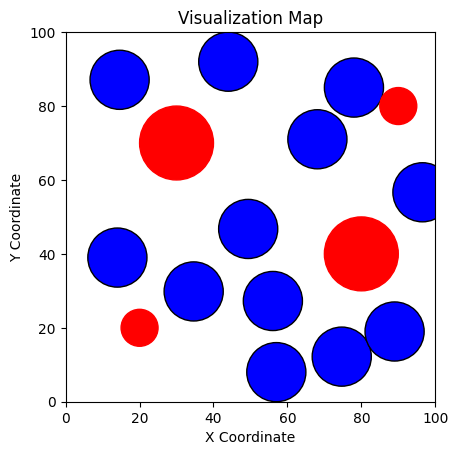

--------------------------------------------------------------------------------------------------------------------------------------
Generation  184 : [[41, 17], [61.164160357136, 76.28121926510795], [71, 56], [10, 55], [99.38551393857497, 70.88571763243276], [88, 9], [18.535981989617543, 87.10008618230961], [8, 33], [23.74289685874878, 40.732309502875324], [42.622903340984095, 45.15360379631961], [11, 70], [64.08664574822178, 26.19155921355076], [73.0063747771309, 70.21433515091253], [39, 15], [8, 16], [67, 8], [9.506517832550395, 52.752633071674154], [44.22288541348337, 92.0], [51.3988616101699, 53.17074226395199], [16, 90], [51.368443116997895, 6.274034196222555], [38.418352692815, 44.61175770124049], [11, 36], [59.3739636272438, 83.80893929448236], [73.0063747771309, 70.21433515091253], [39, 15], [8, 16], [67, 8], [9.506517832550395, 52.752633071674154], [44.22288541348337, 92.0], [51.3988616101699, 53.17074226395199], [16, 90], [51.368443116997895, 6.274034196222555], [38.418352

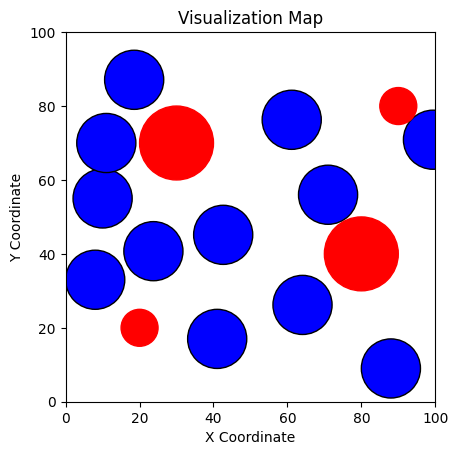

--------------------------------------------------------------------------------------------------------------------------------------
Generation  185 : [[73.0063747771309, 70.21433515091253], [39.0, 15.0], [8.0, 16.0], [67.0, 8.0], [9.506517832550394, 52.752633071674154], [44.22288541348337, 91.99999999999999], [51.3988616101699, 53.17074226395199], [16.0, 90.0], [51.368443116997895, 6.274034196222555], [38.418352692815, 44.61175770124049], [11.0, 36.0], [59.3739636272438, 83.80893929448236], [41, 17], [61.164160357136, 76.28121926510795], [71, 56], [10, 55], [86, 92], [88, 9], [18.535981989617543, 87.10008618230961], [8, 33], [23.74289685874878, 40.732309502875324], [42.622903340984095, 45.15360379631961], [11, 70], [64.08664574822178, 26.19155921355076], [9, 74], [48.999073563369876, 16.341724218433903], [14.057601029718438, 7.582678411426484], [38, 29], [59, 29], [50.419079725052086, 96.06911554102378], [65.59102672585006, 56.3375552244311], [10, 35], [63.06240164587962, 11.3763729

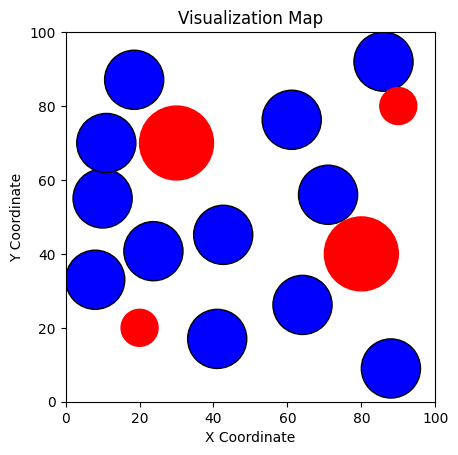

--------------------------------------------------------------------------------------------------------------------------------------
Generation  186 : [[87, 63], [56, 48], [52, 82], [77, 11], [56, 32], [57, 9], [91, 19], [67, 89], [43.08077923952316, 16.611516788218385], [39.679717887265724, 44.774311529764226], [11.0, 46.2], [60.787768263537195, 66.52372527020287], [41, 17], [61.164160357136, 76.28121926510795], [71, 56], [10, 55], [86, 92], [88, 9], [18.535981989617543, 87.10008618230961], [8, 33], [23.74289685874878, 40.732309502875324], [42.622903340984095, 45.15360379631961], [11, 70], [64.08664574822178, 26.19155921355076], [75.27255626128127, 76.97412944935448], [59, 16], [63, 35], [79.68774101343723, 7.610723631584705], [10, 74], [81, 63], [28, 8], [27.18602614629685, 92.0], [43.5199465407933, 14.20081029013243], [48.34926014664446, 56.87191688594365], [13.298629027171918, 46.95285667664648], [53.01386347034722, 92.0]]
Generation  186  Objective Function : [3983.5394847518573

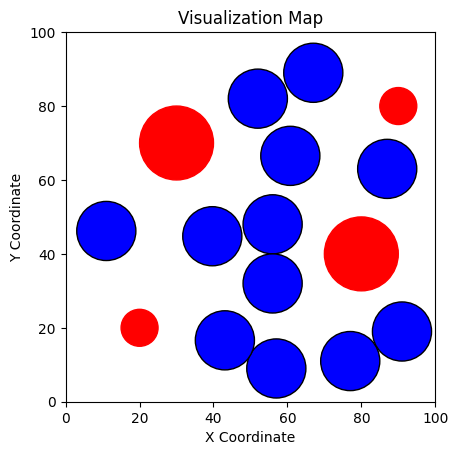

--------------------------------------------------------------------------------------------------------------------------------------
Generation  187 : [[56, 87], [32, 11], [65.3, 63.8], [85, 60], [77.0, 73.99999999999999], [78.69999999999999, 9.0], [37, 91], [25.699999999999996, 49.8], [29.544261572981092, 33.49607168847824], [41.739947704868584, 45.03981611635299], [11.0, 62.86], [59, 35], [87, 63], [56, 48], [52, 82], [77, 11], [56, 32], [57, 9], [91, 19], [67, 89], [43.08077923952316, 16.611516788218385], [39.679717887265724, 44.774311529764226], [11.0, 46.2], [60.787768263537195, 66.52372527020287], [68, 72], [65, 57], [58.582090544260225, 26.727115980688417], [82.61931891918597, 18.344373573451847], [53, 47], [85, 61], [36, 40], [19.912535856468978, 90.45327483502228], [46.81320800180863, 9.840490102699034], [50, 63], [6.669617645771711, 46.57482341244862], [44.82651758057617, 91.76604554158953]]
Generation  187  Objective Function : [3982.5394847518573, 3983.5394847518573, 3981

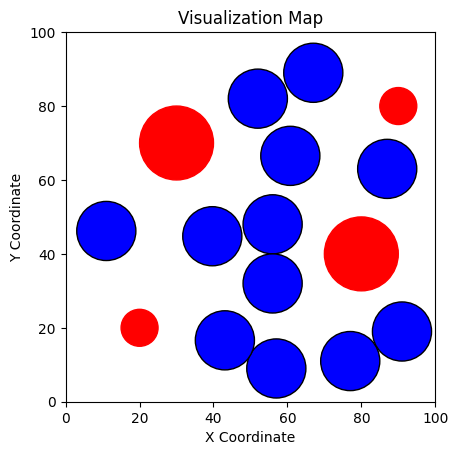

--------------------------------------------------------------------------------------------------------------------------------------
Generation  188 : [[18, 33], [56, 27], [90, 62], [16, 89], [70.7, 61.39999999999999], [72.18999999999998, 9.0], [53.2, 69.39999999999999], [44, 91], [33.605216872943714, 28.43070521840028], [41.12187875958772, 44.96016474037636], [11.0, 57.861999999999995], [59.53633047906116, 44.45711758106086], [87, 63], [56, 48], [52, 82], [77, 11], [56, 32], [57, 9], [91, 19], [67, 89], [43.08077923952316, 16.611516788218385], [39.679717887265724, 44.774311529764226], [11.0, 46.2], [60.787768263537195, 66.52372527020287], [57, 77], [72, 89], [56, 48], [36, 23], [70, 25], [11, 73], [25, 53], [28.28036673648352, 95.78973223332477], [52.68683709160065, 22.07266741296222], [75, 10], [8.174847465407794, 46.446970740397795], [46.28133551371732, 105.93851795270417]]
Generation  188  Objective Function : [3983.5394847518573, 3983.5394847518573, 3983.5394847518573]
---------

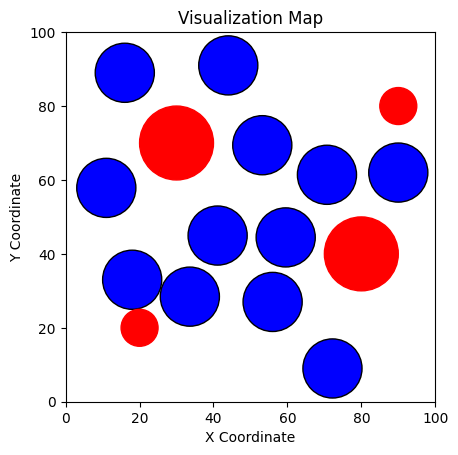

--------------------------------------------------------------------------------------------------------------------------------------
Generation  189 : [[87, 22], [67.2, 76.69999999999999], [54.8, 58.19999999999999], [10, 30], [8, 76], [27, 44], [44.8, 42.8], [35, 90], [43, 19], [64.40391536617972, 20.432293458929266], [9.022393225785455, 46.37287951827845], [50.633265338663286, 94.11408014795377], [48, 82], [87, 58], [51.682621624967176, 21.561320327498983], [15, 40], [56, 49], [34, 43], [89, 24], [60.611176226072075, 92.0], [75.75166922578796, 11.558673374033411], [59.07826106642149, 68.45496988469014], [60, 9], [9, 89], [48, 82], [87, 58], [51.682621624967176, 21.561320327498983], [15, 40], [56, 49], [34, 43], [89, 24], [60.611176226072075, 92.0], [75.75166922578796, 11.558673374033411], [59.07826106642149, 68.45496988469014], [60, 9], [9, 89]]
Generation  189  Objective Function : [3983.5394847518573, 3980.5394847518573, 3980.5394847518573]
----------------------------------------

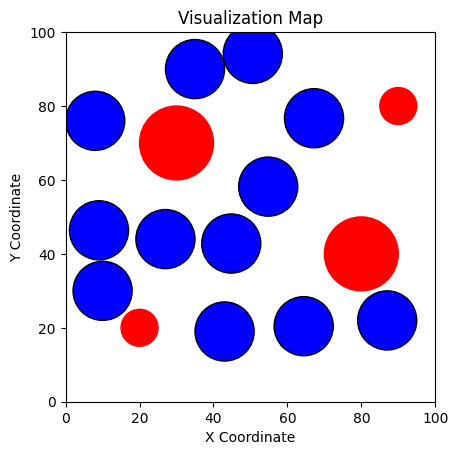

--------------------------------------------------------------------------------------------------------------------------------------
Generation  190 : [[12, 65], [81.06, 63.609999999999985], [74, 90], [13.5, 37.0], [57, 32], [31.9, 43.3], [90, 9], [52.92782335825045, 91.39999999999999], [65.92616845805158, 13.791071361823388], [60.67595735634896, 54.04816695696188], [44.706717967735635, 20.211863855483536], [21.489979601598986, 90.53422404438612], [87, 22], [67.2, 76.69999999999999], [54.8, 58.19999999999999], [10, 30], [8, 76], [27, 44], [44.8, 42.8], [35, 90], [43, 19], [64.40391536617972, 20.432293458929266], [9.022393225785455, 46.37287951827845], [50.633265338663286, 92.0], [32, 9], [79.13670169380799, 67.66185974077551], [45, 86], [12.993652615816485, 41.083941300200934], [50.9465788073845, 56.192117578717735], [39.17457709994656, 33.01860007757798], [88.8758369160093, 20.372361011778366], [67.92793072992815, 98.97162052104383], [49, 71], [64.28815608396425, 64.08692817138632],

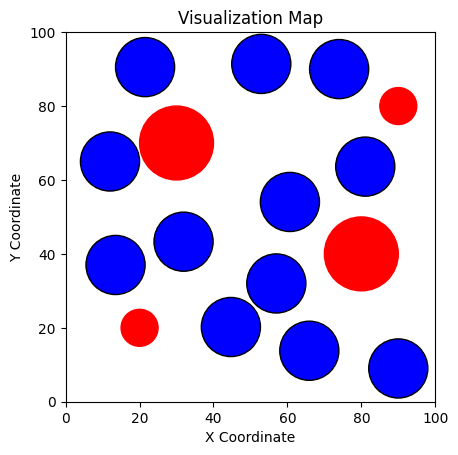

--------------------------------------------------------------------------------------------------------------------------------------
Generation  191 : [[69, 83], [79.7136911856656, 66.44630181854285], [46, 84], [13.145556831071538, 39.85875891014065], [27, 50], [36.99220396996259, 36.10302005430458], [89.2130858412065, 16.960652708244854], [63.42789851842484, 96.70013436473067], [91, 55], [63.20449646567966, 61.07529980705898], [57.08173927967958, 21.890339046425062], [7.343586768221378, 91.4581928182287], [12, 65], [81.06, 63.609999999999985], [74, 90], [13.5, 37.0], [57, 32], [31.9, 43.3], [90, 9], [52.92782335825045, 91.39999999999999], [65.92616845805158, 13.791071361823388], [60.67595735634896, 54.04816695696188], [44.706717967735635, 20.211863855483536], [21.489979601598986, 90.53422404438612], [9, 77], [33, 8], [23, 92], [9.277442853753346, 31.648944799782615], [59.211934825215394, 55.22262238263481], [32.165692355719806, 40.0082649087834], [90.39389790151945, 23.5328064930004

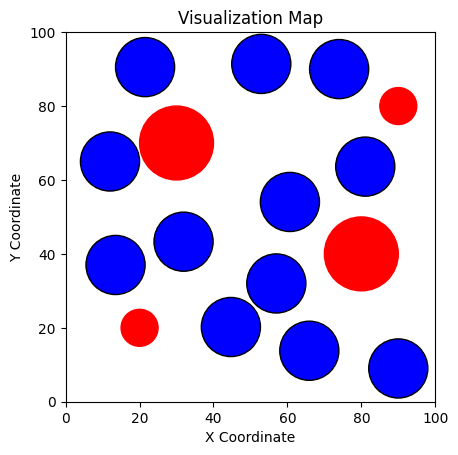

--------------------------------------------------------------------------------------------------------------------------------------
Generation  192 : [[11, 77], [80.65610735569967, 64.46089054556285], [50, 76], [13.393667049321461, 37.857627673042195], [48.0, 37.4], [33.42766119098877, 41.14090601629137], [89.76392575236194, 11.388195812473455], [56.07784590630277, 92.99004030941919], [28, 8], [61.43451908914817, 56.15630681199101], [48.41922436131881, 20.715406412765994], [17.246061751585703, 90.81141467653889], [12, 65], [81.06, 63.609999999999985], [74, 90], [13.5, 37.0], [57, 32], [31.9, 43.3], [90, 9], [52.92782335825045, 91.39999999999999], [65.92616845805158, 13.791071361823388], [60.67595735634896, 54.04816695696188], [44.706717967735635, 20.211863855483536], [21.489979601598986, 90.53422404438612], [57, 45], [30, 88], [72, 16], [57, 72], [17.365019164643115, 56.14647884632401], [28.79123985542762, 44.87317312775985], [44, 33], [78.21047584309036, 92.0], [92.0, 67.3941332000

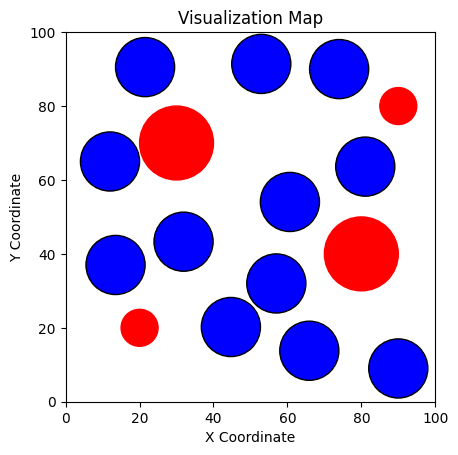

--------------------------------------------------------------------------------------------------------------------------------------
Generation  193 : [[43, 30], [45.1968322067099, 80.93826716366885], [13, 34], [92, 22], [72, 11], [30.182166256095964, 43.7534929943193], [84, 63], [71.57068686205409, 92.29701209282575], [65, 30], [65.29377021076806, 59.55216432754082], [49.64215717779857, 15.068756803771448], [14.001544515069284, 87.04728190387073], [12, 65], [81.06, 63.609999999999985], [74, 90], [13.5, 37.0], [57, 32], [31.9, 43.3], [90, 9], [52.92782335825045, 91.39999999999999], [65.92616845805158, 13.791071361823388], [60.67595735634896, 54.04816695696188], [44.706717967735635, 20.211863855483536], [21.489979601598986, 90.53422404438612], [58, 57], [33, 88], [50.351801932515954, 75.93581362595211], [16.391018115756054, 38.719487167622745], [63, 21], [37.52499947291138, 42.73355210831419], [92.0, 2.5028338523978846], [49.582010206837566, 92.0], [41.34549926052455, 6.98463909033734

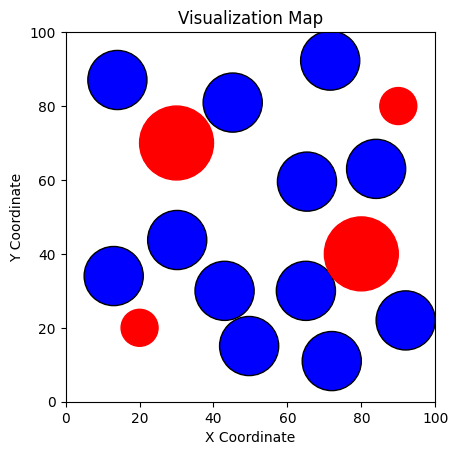

--------------------------------------------------------------------------------------------------------------------------------------
Generation  194 : [[91, 67], [42, 57], [64.39999999999999, 71.69999999999999], [23.549999999999997, 42.099999999999994], [40, 87], [92, 26], [12, 89], [57.149476350775316, 90.67999999999999], [13, 54], [61.97317014944427, 44.433716869873315], [48.09470257741494, 25.848304698838476], [68, 9], [36, 92], [19.54055705921828, 52.714582167330306], [64, 8], [56.98512207988643, 56.03421106121456], [3.1188736896974136, 43.00296120205876], [92.0, 8.807501722307126], [24.767244845678665, 32.298630573597045], [76.12610235466835, 92.0], [82.38438029912989, 58.111062999375584], [61, 84], [58.720853638780895, 36.19978607786655], [41, 44], [36, 92], [19.54055705921828, 52.714582167330306], [64, 8], [56.98512207988643, 56.03421106121456], [3.1188736896974136, 43.00296120205876], [92.0, 8.807501722307126], [24.767244845678665, 32.298630573597045], [76.12610235466835, 92.

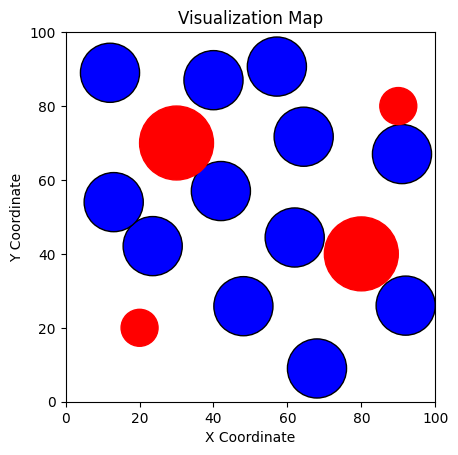

--------------------------------------------------------------------------------------------------------------------------------------
Generation  195 : [[10, 8], [64, 87], [52, 10], [15, 82], [32.43566210690922, 43.00088836061762], [88, 22], [62.7301734537036, 71.2895891720791], [8, 37], [44.31531408973896, 53.833318899812674], [32, 28], [61, 47], [58, 30], [8, 49], [70, 92], [63, 11], [22.81629618377164, 46.14226758774535], [43.965795385868866, 41.3171591694624], [60.36859499001673, 69.15925221462315], [47, 86], [16, 90], [77, 76], [11, 76], [49.512830645072256, 18.30440230157172], [49, 57], [8, 49], [70, 92], [63, 11], [22.81629618377164, 46.14226758774535], [43.965795385868866, 41.3171591694624], [60.36859499001673, 69.15925221462315], [47, 86], [16, 90], [77, 76], [11, 76], [49.512830645072256, 18.30440230157172], [49, 57]]
Generation  195  Objective Function : [3980.5394847518573, 3974.5394847518573, 3974.5394847518573]
------------------------------------------------------------

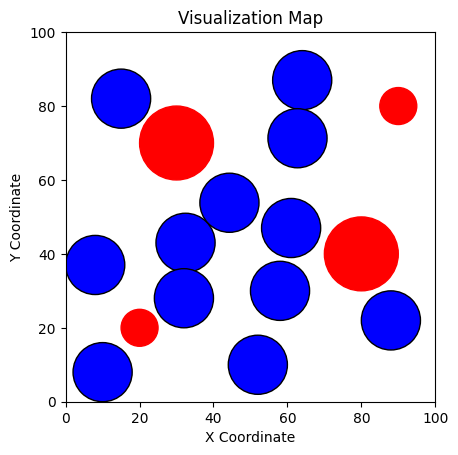

--------------------------------------------------------------------------------------------------------------------------------------
Generation  196 : [[9, 38], [65.8, 88.5], [55.3, 10.3], [27, 92], [11, 71], [75, 67], [58.01112141759252, 75.70271242045537], [10.399999999999999, 52.9], [54.12071986281727, 60.48332322986887], [25.7, 42.4], [83, 11], [55.3, 38.099999999999994], [10, 8], [64, 87], [52, 10], [15, 82], [32.43566210690922, 43.00088836061762], [88, 22], [62.7301734537036, 71.2895891720791], [8, 37], [44.31531408973896, 53.833318899812674], [32, 28], [61, 47], [58, 30], [5.465998017052594, 57.24738668448842], [77.55069300079555, 105.62521875149807], [71.69916751479909, 3.26885357804682], [91, 58], [52.88869358662623, 48.86396022014957], [87, 15], [50, 83], [21, 36], [78, 85], [61, 19], [42.50506024045511, 22.812975048349188], [60.24615082966024, 68.48480637379313]]
Generation  196  Objective Function : [3977.5394847518573, 3980.5394847518573, 3983.5394847518573]
------------

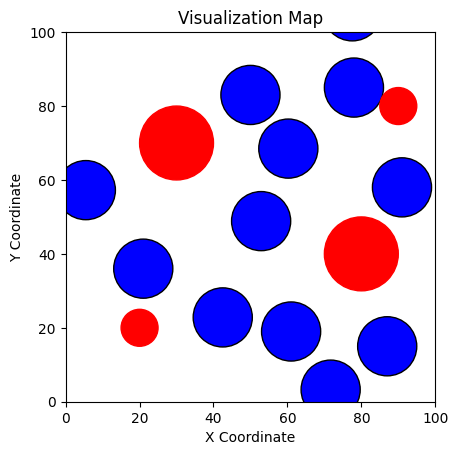

--------------------------------------------------------------------------------------------------------------------------------------
Generation  197 : [[10, 31], [69.32520790023867, 93.63756562544941], [11, 75], [27, 92], [54, 27], [88, 64], [45, 60], [13.579999999999998, 47.82999999999999], [61.28450390397208, 67.83832626090822], [36.29, 35.379999999999995], [70.85151807213653, 14.543892514504755], [56.78384524889806, 47.21544191213793], [5.465998017052594, 57.24738668448842], [77.55069300079555, 105.62521875149807], [71.69916751479909, 3.26885357804682], [91, 58], [52.88869358662623, 48.86396022014957], [87, 15], [50, 83], [21, 36], [78, 85], [61, 19], [42.50506024045511, 22.812975048349188], [60.24615082966024, 68.48480637379313], [27, 34], [68.97601737816565, 92.0], [43, 18], [41.27483410111523, 92.0], [55, 59], [12, 65], [62, 9], [23.03333099764604, 48.73560196509573], [67.54310689404721, 73.02286130161258], [40.41889444623024, 45.657880623391776], [92.0, 4.5434779794832005], [6

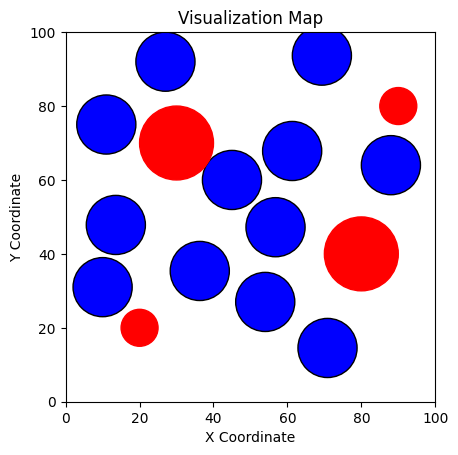

--------------------------------------------------------------------------------------------------------------------------------------
Generation  198 : [[9, 86], [71.79285343040573, 97.23386156326401], [81, 10], [46.2, 81.79999999999998], [29, 8], [88, 63], [40, 53], [15.805999999999997, 44.28099999999999], [66.29915273278044, 72.98682838263575], [43.703, 30.465999999999994], [62.3475807226321, 17.024617274658084], [57.822536923126705, 53.59625125063449], [10, 31], [69.32520790023867, 92.0], [11, 75], [27, 92], [54, 27], [88, 64], [45, 60], [13.579999999999998, 47.82999999999999], [61.28450390397208, 67.83832626090822], [36.29, 35.379999999999995], [70.85151807213653, 14.543892514504755], [56.78384524889806, 47.21544191213793], [83, 92], [76.47724256177902, 106.83637324450521], [42.0092415270507, 30.57448886315243], [35.82149155315107, 99.49084974305762], [55.66276173620946, 65.6819205865406], [71, 65], [76.71413832764516, 13.87348897782414], [20, 37], [59.1711870430457, 87.1453961423

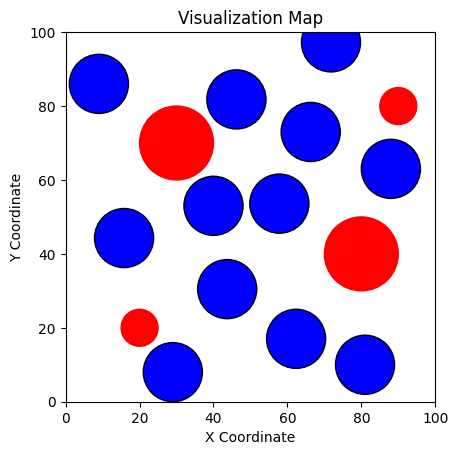

--------------------------------------------------------------------------------------------------------------------------------------
Generation  199 : [[91, 15], [71.47081829870078, 96.45091197335155], [12, 70], [29.64644746594532, 94.24725492291728], [48, 84], [82.89999999999999, 64.3], [67, 27], [15.505999999999998, 44.580999999999996], [60.65050884569416, 73.63044722534342], [35.5145201552771, 37.64476845197064], [77.08291580169346, 9.709191565307293], [56.7702175664912, 45.567720546319066], [9, 86], [71.79285343040573, 92.0], [81, 10], [46.2, 81.79999999999998], [29, 8], [88, 63], [40, 53], [15.805999999999997, 44.28099999999999], [66.29915273278044, 72.98682838263575], [43.703, 30.465999999999994], [62.3475807226321, 17.024617274658084], [57.822536923126705, 53.59625125063449], [35, 11], [85.9783802730982, 99.3281301844339], [16, 88], [48, 22], [66.90521789798144, 64.68037838611905], [76.73702376960735, 79.12341043946297], [67.42591229445173, 23.550213117611186], [15.35024067014

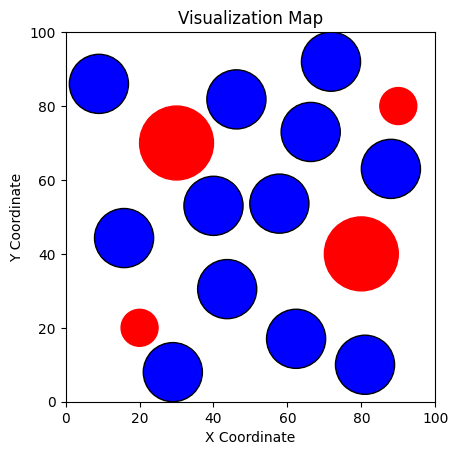

--------------------------------------------------------------------------------------------------------------------------------------
Generation  200 : [[11, 59], [71.69624289089424, 93.33527359200545], [9, 12], [41.2339342397836, 85.53417647687516], [44, 16], [86.47, 63.38999999999999], [9, 83], [15.715999999999998, 44.370999999999995], [64.60455956665456, 73.17991403544805], [41.24645604658313, 32.619630535591185], [66.76818124635051, 14.829989561852846], [57.506841116136044, 51.18769203933986], [9, 86], [71.79285343040573, 92.0], [81, 10], [46.2, 81.79999999999998], [29, 8], [88, 63], [40, 53], [15.805999999999997, 44.28099999999999], [66.29915273278044, 72.98682838263575], [43.703, 30.465999999999994], [62.3475807226321, 17.024617274658084], [57.822536923126705, 53.59625125063449], [31, 29], [70.31160022022645, 92.0], [57, 20], [34.89366091921893, 92.0], [89, 23], [87.18680303424063, 59.34772328773843], [49, 38], [9.247046120569928, 58.024013489434964], [75.55252280116447, 71.4856

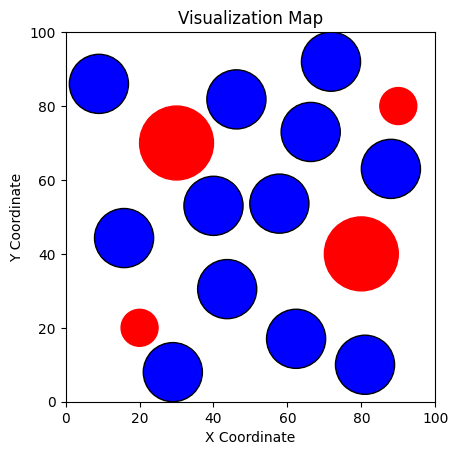

--------------------------------------------------------------------------------------------------------------------------------------
Generation  201 : [[89, 22], [71.34847746735194, 91.99999999999999], [31, 27], [42.80809827576568, 84.85999999999999], [47.0, 12.5], [87.75604091027218, 61.90431698632152], [53, 72], [13.838313836170975, 48.40390404683048], [69.07516375329566, 72.53646377252754], [10, 71], [66.97435201339131, 12.523672855213892], [54.57187376982487, 54.80056811813586], [9, 86], [71.79285343040573, 92.0], [81, 10], [46.2, 81.79999999999998], [29, 8], [88, 63], [40, 53], [15.805999999999997, 44.28099999999999], [66.29915273278044, 72.98682838263575], [43.703, 30.465999999999994], [62.3475807226321, 17.024617274658084], [57.822536923126705, 53.59625125063449], [1.1432557502395078, 68.38798028149029], [80.64123211969564, 92.0], [39, 50], [76, 76], [35, 13], [87.48381923666793, 61.56449665178397], [7.389974753779136, 88.99353179639166], [20.707271543094684, 43.42969200594767

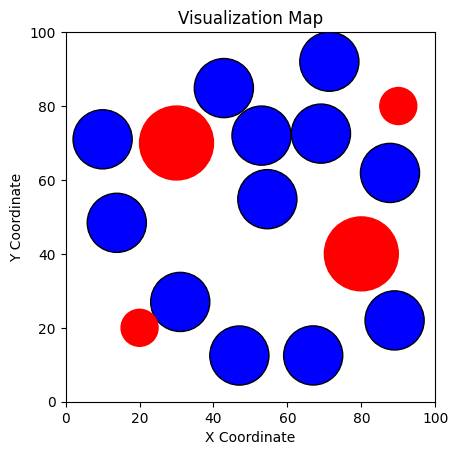

--------------------------------------------------------------------------------------------------------------------------------------
Generation  202 : [[25, 47], [29, 9], [9, 53], [61.599999999999994, 55.9], [35.3, 25.0], [77, 59], [19.272982327645394, 87.79547225747416], [51, 22], [49.11813822049514, 79.1385157558866], [84, 8], [67.56888993357043, 14.381056823556769], [47.434238931888835, 45.29841580143906], [77.51297800351091, 13.801134067767128], [9.889154831154547, 1.1995570132248865], [39, 31], [23.85862571112014, 7.924412915242341], [31.607708392515978, 44.93927659476846], [61.553252757332565, 20.731977999759845], [47.549698000181024, 90.03156408857832], [63, 56], [21.669306924089625, 92.0], [61, 72], [12, 67], [10.537216415604654, 45.59388425662742], [77.51297800351091, 13.801134067767128], [9.889154831154547, 1.1995570132248865], [39, 31], [23.85862571112014, 7.924412915242341], [31.607708392515978, 44.93927659476846], [61.553252757332565, 20.731977999759845], [47.54969800018

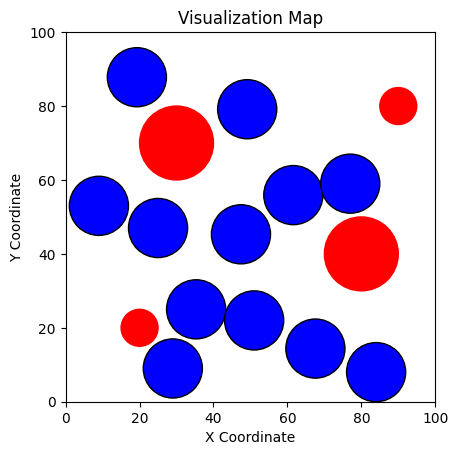

--------------------------------------------------------------------------------------------------------------------------------------
Generation  203 : [[77.51297800351091, 13.801134067767128], [9.889154831154547, 1.1995570132248865], [39.0, 31.0], [23.85862571112014, 7.924412915242341], [31.607708392515974, 44.93927659476846], [61.553252757332565, 20.73197799975984], [47.549698000181024, 90.03156408857832], [62.99999999999999, 56.0], [21.669306924089625, 91.99999999999999], [61.0, 72.0], [11.999999999999998, 67.0], [10.537216415604654, 45.59388425662742], [25, 47], [29, 9], [9, 53], [61.599999999999994, 55.9], [35.3, 25.0], [77, 59], [19.272982327645394, 87.79547225747416], [51, 22], [49.11813822049514, 79.1385157558866], [84, 8], [67.56888993357043, 14.381056823556769], [47.434238931888835, 45.29841580143906], [81.39047455681889, 4.052546194055456], [8.151432276486839, 8.073875883350173], [39, 9], [50, 22], [34.8036243620638, 35.1207037974128], [68.74791302925395, 13.718323006656039

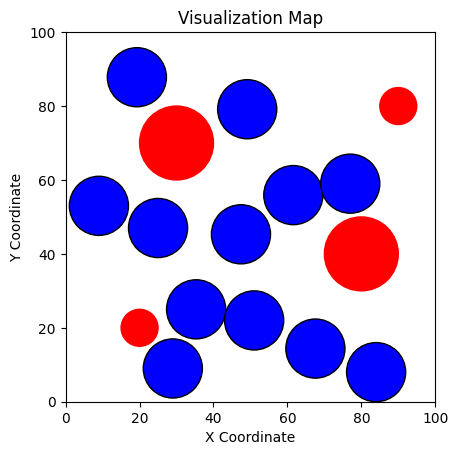

--------------------------------------------------------------------------------------------------------------------------------------
Generation  204 : [[78.6762269695033, 10.876557705653626], [9.367838064754235, 3.2618526742624723], [52, 29], [31.7010379977841, 12.147089040669638], [32.56648318338032, 41.99370475556176], [63.71165083890898, 18.6278815018287], [46.466336760286815, 87.78847462334105], [65.1, 56.0], [24.191271400824352, 90.71563912490953], [58.192093546697976, 71.12852658107538], [11, 79], [10.272452133117314, 43.98914794668113], [25, 47], [29, 9], [9, 53], [61.599999999999994, 55.9], [35.3, 25.0], [77, 59], [19.272982327645394, 87.79547225747416], [51, 22], [49.11813822049514, 79.1385157558866], [84, 8], [67.56888993357043, 14.381056823556769], [47.434238931888835, 45.29841580143906], [39, 54], [-1.4425113124413045, 18.80349373222618], [47, 89], [49.22060883325261, 13.049046607185852], [48.79836290764536, 39.11948314080369], [72.01806689244074, 16.5850120223525], [75, 

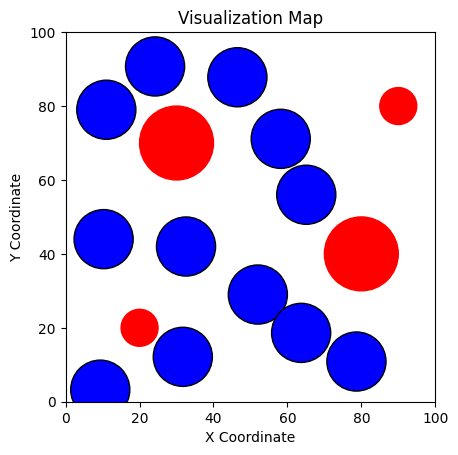

--------------------------------------------------------------------------------------------------------------------------------------
Generation  205 : [[24, 32], [46, 9], [8, 90], [81, 91], [13, 43], [10, 75], [71, 71], [43, 58], [60, 48], [76, 16], [44, 29], [38.890525271199735, 42.92966532951814], [28, 52], [9, 56], [58.75038399466073, 92.0], [58.574695481417464, 7.358870749922559], [42.73981812561148, 37.288088966595524], [73.66035477549758, 14.368952841535217], [62.75494190969006, 46.532087657856444], [26, 37], [50.47937741010873, 79.66197550560895], [92.0, 10.028032868941416], [75, 64], [39, 19], [28, 52], [9, 56], [58.75038399466073, 92.0], [58.574695481417464, 7.358870749922559], [42.73981812561148, 37.288088966595524], [73.66035477549758, 14.368952841535217], [62.75494190969006, 46.532087657856444], [26, 37], [50.47937741010873, 79.66197550560895], [92.0, 10.028032868941416], [75, 64], [39, 19]]
Generation  205  Objective Function : [3975.5394847518573, 3976.5394847518573, 39

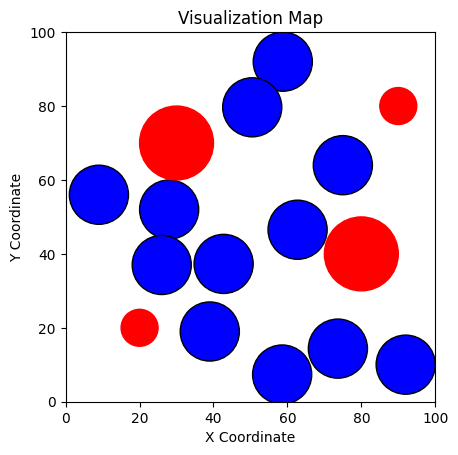

--------------------------------------------------------------------------------------------------------------------------------------
Generation  206 : [[66, 92], [38, 13], [23.22511519839822, 90.6], [13, 61], [21.92194543768344, 41.286426689978654], [59, 21], [46, 83], [37.9, 51.699999999999996], [57.14381322303262, 57.49859265168268], [80.8, 14.208409860682425], [53.3, 39.5], [38.92336768983981, 35.75076573066269], [28, 52], [9, 56], [58.75038399466073, 92.0], [58.574695481417464, 7.358870749922559], [42.73981812561148, 37.288088966595524], [73.66035477549758, 14.368952841535217], [62.75494190969006, 46.532087657856444], [26, 37], [50.47937741010873, 79.66197550560895], [92.0, 10.028032868941416], [75, 64], [39, 19], [55, 72], [37.85734699787091, 18.167687403756215], [71, 60], [9, 9], [11, 39], [12.24792797336236, 89.68861857197993], [76.97818053415232, 79.05025501200005], [56.05511399797642, 54.994205340733814], [71, 24], [83.05098791959031, 12.646375574105818], [49.94323362671172,

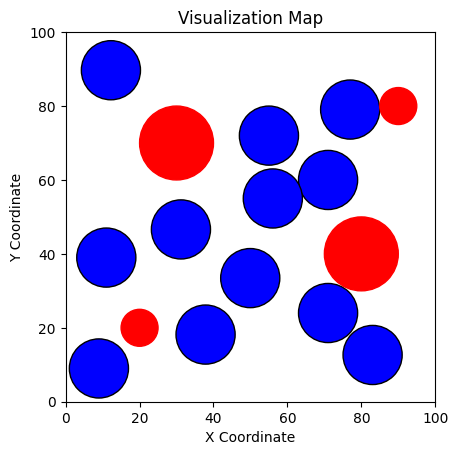

--------------------------------------------------------------------------------------------------------------------------------------
Generation  207 : [[86, 68], [37.95720409936127, 14.550306221126863], [9, 27], [76, 82], [18.645361806378407, 40.600498682985055], [15, 8], [55.29345416024569, 81.81507650360001], [43.34653419939292, 52.68826160222014], [70, 62], [81.4752963758771, 13.73979957470944], [52.29297008801351, 37.68382266146239], [36.60406594769317, 39.01060435492868], [55, 72], [37.85734699787091, 18.167687403756215], [71, 60], [9, 9], [11, 39], [12.24792797336236, 89.68861857197993], [76.97818053415232, 79.05025501200005], [56.05511399797642, 54.994205340733814], [71, 24], [83.05098791959031, 12.646375574105818], [49.94323362671172, 33.446075538207985], [31.19236188268435, 46.616894478216], [68, 82], [10.635440086930904, 55.412569693767864], [19, 92], [71.26645862235851, 0.6912570348624181], [38.58970343401487, 44.19217208613823], [74.80469350341887, 21.159135810486227], [4

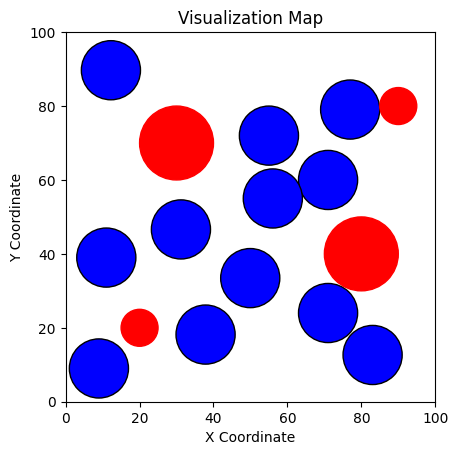

--------------------------------------------------------------------------------------------------------------------------------------
Generation  208 : [[85, 63], [37.88730412831802, 17.082473048967408], [55, 10], [17, 85], [13.293608541913521, 39.480149604895516], [65, 66], [70.47276262198032, 79.87970145948003], [52.24254005840137, 54.302422219179704], [53, 90], [82.57828045647634, 12.974402774286904], [50.64815456510225, 34.7173996751843], [32.81587310218699, 44.3350074412298], [55, 72], [37.85734699787091, 18.167687403756215], [71, 60], [9, 9], [11, 39], [12.24792797336236, 89.68861857197993], [76.97818053415232, 79.05025501200005], [56.05511399797642, 54.994205340733814], [71, 24], [83.05098791959031, 12.646375574105818], [49.94323362671172, 33.446075538207985], [31.19236188268435, 46.616894478216], [52, 32], [29.887445641382516, 7.11914798803855], [35, 27], [21, 88], [15.036021200239443, 36.30657242891612], [23, 51], [64.71788797436, 80.22904369672582], [50, 69], [78, 73], [75.5

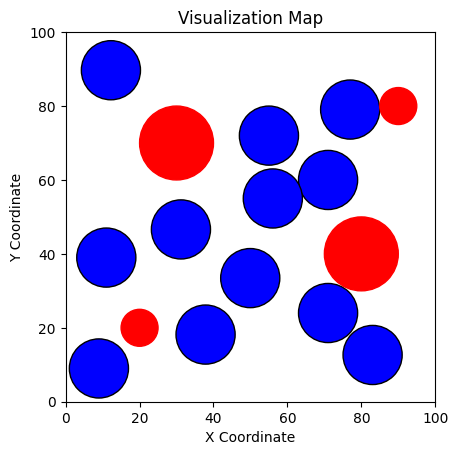

--------------------------------------------------------------------------------------------------------------------------------------
Generation  209 : [[10, 80], [37.87831698918389, 17.40803735540405], [42, 92], [82, 68], [12.605525979339465, 39.33610472342686], [67, 9], [72.42438799563192, 79.63086752523603], [53.38631224027388, 54.509957155645935], [58.39999999999999, 70.19999999999999], [82.72009269541053, 12.875994614232576], [50.43667828358509, 34.336002434091405], [32.3288197363362, 45.01957355232565], [55, 72], [37.85734699787091, 18.167687403756215], [71, 60], [9, 9], [11, 39], [12.24792797336236, 89.68861857197993], [76.97818053415232, 79.05025501200005], [56.05511399797642, 54.994205340733814], [71, 24], [83.05098791959031, 12.646375574105818], [49.94323362671172, 33.446075538207985], [31.19236188268435, 46.616894478216], [15, 51], [8, 16], [57.55095259473421, 4.569794141004016], [16.404537689720737, 83.70801384508312], [4.5136523676973646, 40.09148578412004], [77, 86], [65

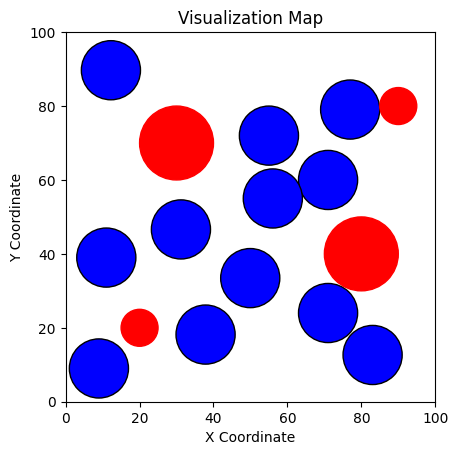

--------------------------------------------------------------------------------------------------------------------------------------
Generation  210 : [[28, 91], [37.87202599179, 17.6359323699097], [50.7, 82.39999999999999], [18, 54], [12.123868185537624, 39.235273306398796], [84, 67], [73.79052575718804, 79.45668377126523], [11, 92], [62.17999999999999, 56.33999999999999], [82.81936126266446, 12.807108902194548], [50.28864488652307, 34.06902436532638], [31.98788238024064, 45.498769830092755], [55, 72], [37.85734699787091, 18.167687403756215], [71, 60], [9, 9], [11, 39], [12.24792797336236, 89.68861857197993], [76.97818053415232, 79.05025501200005], [56.05511399797642, 54.994205340733814], [71, 24], [83.05098791959031, 12.646375574105818], [49.94323362671172, 33.446075538207985], [31.19236188268435, 46.616894478216], [64, 62], [58, 30], [33, 12], [7.906812263702017, 95.79028382293163], [8.886028492676756, 53.72069866924164], [29, 40], [78.09825172891307, 67.1091896249262], [57.233420

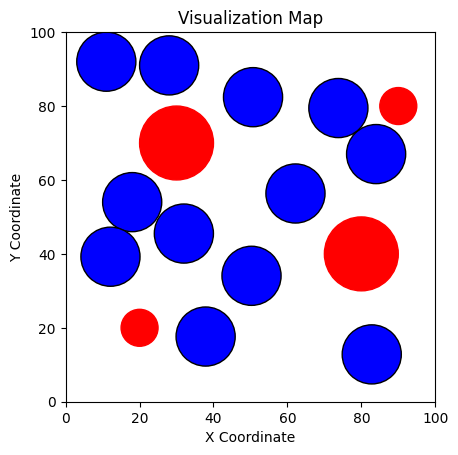

--------------------------------------------------------------------------------------------------------------------------------------
Generation  211 : [[63, 16], [37.86762229361427, 17.795458880063652], [15, 56], [48, 92], [11.786707729876337, 39.16469131447916], [48, 58], [74.74682219027731, 79.33475514348568], [85, 61], [62, 44], [82.88884925974222, 12.758888903767927], [50.185021508579666, 33.88213971719085], [31.74922623097375, 45.83420722452973], [28, 91], [37.87202599179, 17.6359323699097], [50.7, 82.39999999999999], [18, 54], [12.123868185537624, 39.235273306398796], [84, 67], [73.79052575718804, 79.45668377126523], [11, 92], [62.17999999999999, 56.33999999999999], [82.81936126266446, 12.807108902194548], [50.28864488652307, 34.06902436532638], [31.98788238024064, 45.498769830092755], [13, 91], [45, 34], [65, 51], [19.963042876155242, 108.02703667103711], [7.369307011976412, 58.64316051908309], [29.372071599555873, 36.291051279783005], [68.46075202611607, 68.6932298739545], [5

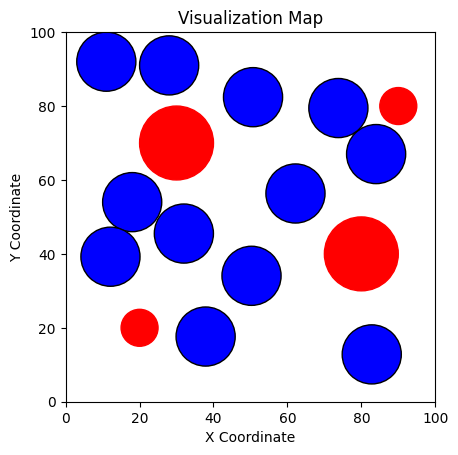

--------------------------------------------------------------------------------------------------------------------------------------
Generation  212 : [[11, 89], [37.868943403066986, 17.747600927017466], [51, 92], [62, 11], [11.887855866574721, 39.18586591205505], [11, 64], [8, 12], [62.79999999999999, 70.3], [62.053999999999995, 47.702], [82.86800286061889, 12.773354903295912], [50.21610852196269, 33.938205111631504], [31.820823075753815, 45.73357600619863], [28, 91], [37.87202599179, 17.6359323699097], [50.7, 82.39999999999999], [18, 54], [12.123868185537624, 39.235273306398796], [84, 67], [73.79052575718804, 79.45668377126523], [11, 92], [62.17999999999999, 56.33999999999999], [82.81936126266446, 12.807108902194548], [50.28864488652307, 34.06902436532638], [31.98788238024064, 45.498769830092755], [68.03768846741602, 10.333427724295133], [36.44756237264342, 15.085414659210036], [5.544588585942757, 54.764030976850655], [57, 92], [13.494104512363155, 34.55267702623724], [57, 34], [82

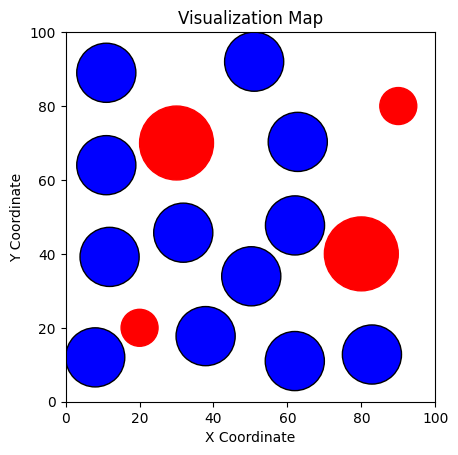

--------------------------------------------------------------------------------------------------------------------------------------
Generation  213 : [[31, 89], [8, 89], [71.21000000000001, 72.32], [50.199999999999996, 24.599999999999998], [79, 89], [50.4, 40.39999999999999], [59.937157727156404, 86.83700513137956], [70, 22], [31, 27], [82.24580837879934, 10.842132670658364], [47, 10], [17.29636471407219, 43.749630949027825], [68, 56], [51, 56], [73.55527181966644, 78.4597459205628], [28, 9], [14.72478764503512, 81.25293222535672], [89, 20], [35, 53], [41.32788602055334, 15.969544267208775], [36, 36], [81.32056570308653, 7.353955732640216], [42.145058464785215, 92.0], [5.147930404873584, 55.24045145915588], [68, 56], [51, 56], [73.55527181966644, 78.4597459205628], [28, 9], [14.72478764503512, 81.25293222535672], [89, 20], [35, 53], [41.32788602055334, 15.969544267208775], [36, 36], [81.32056570308653, 7.353955732640216], [42.145058464785215, 92.0], [5.147930404873584, 55.2404514591

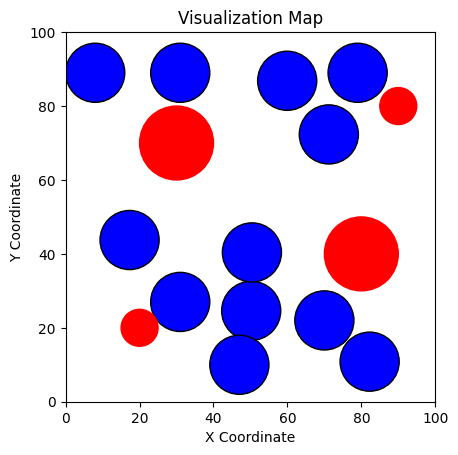

--------------------------------------------------------------------------------------------------------------------------------------
Generation  214 : [[57, 32], [54, 83], [72.85169027376651, 76.61782214439395], [34.66, 13.68], [65, 16], [22, 44], [28, 89], [49.92952021438734, 17.778680987046144], [34.5, 33.3], [81.59813850580036, 8.40040881404566], [10, 31], [8.792460697633166, 51.79320530611746], [31, 89], [8, 89], [71.21000000000001, 72.32], [50.199999999999996, 24.599999999999998], [79, 89], [50.4, 40.39999999999999], [59.937157727156404, 86.83700513137956], [70, 22], [31, 27], [82.24580837879934, 10.842132670658364], [47, 10], [17.29636471407219, 43.749630949027825], [56, 87], [62.03180917504196, 69.0855519653867], [8, 58], [50, 57], [16.362011809185137, 90.91185364365468], [84, 62], [48, 19], [33.54440323492862, 22.70706841235605], [48.17151465068895, 35.10835773426478], [89.25067402954676, 1.0776520370192006], [41.466195890356346, 102.16358169277459], [19.387879977564754, 46.4

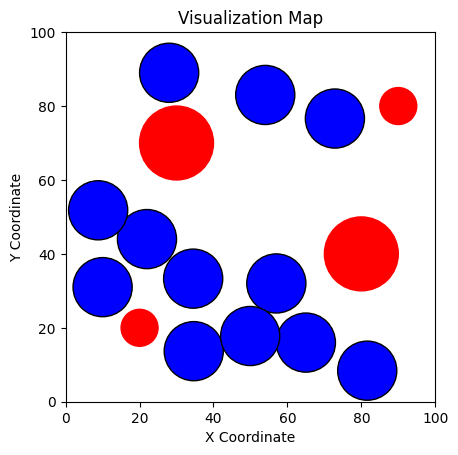

--------------------------------------------------------------------------------------------------------------------------------------
Generation  215 : [[38.5, 88.39999999999999], [36, 10], [9, 10], [16, 83], [60.20860354275554, 89.5735560930964], [60.47999999999999, 46.87999999999999], [56.35601040900948, 66.48590359196568], [59.063320970478586, 22.212120523706815], [76, 61], [84.34726807402356, 7.912788480566615], [45.339858767106904, 37.649074507832374], [17.92381929311996, 44.5624068947439], [83, 91], [10.018998466883852, 84.25539122692982], [84, 11], [60.64264199834278, 84.7333969010174], [64.56737791512171, 24.129848235512306], [50, 67], [34, 39], [40.09588146751914, 9.200559620829523], [48.53377214813129, 48.00949059977549], [24.474990915220367, 92.0], [74, 72], [17.269511508309215, 47.70947263567292], [83, 91], [10.018998466883852, 84.25539122692982], [84, 11], [60.64264199834278, 84.7333969010174], [64.56737791512171, 24.129848235512306], [50, 67], [34, 39], [40.0958814675191

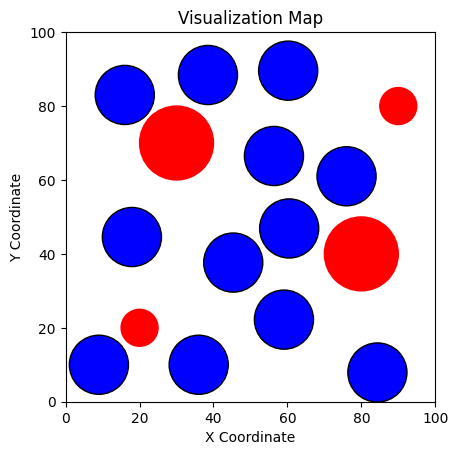

--------------------------------------------------------------------------------------------------------------------------------------
Generation  216 : [[83.0, 91.0], [10.018998466883852, 84.25539122692982], [84.0, 11.0], [60.64264199834278, 84.7333969010174], [64.56737791512171, 24.129848235512306], [50.0, 67.0], [34.0, 39.0], [40.095881467519135, 9.200559620829523], [48.53377214813129, 48.00949059977549], [24.474990915220367, 91.99999999999999], [74.0, 72.0], [17.269511508309215, 47.70947263567292], [34.419571162320835, 88.66302505950685], [70.03533937582905, 73.65759964557535], [3.675355796221904, 62.8524606806655], [16.605868505624393, 92.0], [40, 48], [57.4184486150468, 60.196707354117706], [34, 16], [65.93130551391735, 21.21533845716811], [79.79070354636028, 61.02151560764959], [59, 91], [13.47045359107948, 0.4197229046728381], [23.64377846233648, 38.774664076761724], [34.419571162320835, 88.66302505950685], [70.03533937582905, 73.65759964557535], [3.675355796221904, 62.85246068

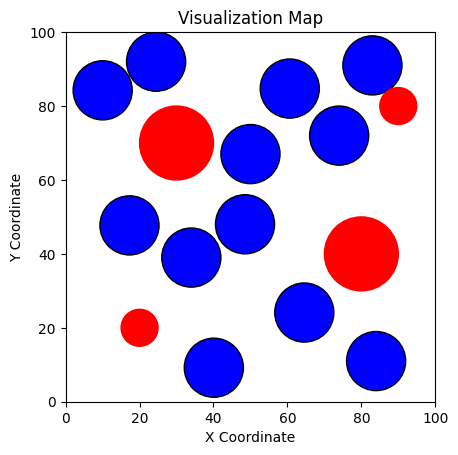

--------------------------------------------------------------------------------------------------------------------------------------
Generation  217 : [[34.419571162320835, 88.66302505950685], [70.03533937582905, 73.65759964557535], [3.675355796221904, 62.8524606806655], [16.605868505624393, 91.99999999999999], [40.0, 47.99999999999999], [57.4184486150468, 60.196707354117706], [34.0, 16.0], [65.93130551391735, 21.21533845716811], [79.79070354636028, 61.02151560764959], [59.0, 91.0], [13.47045359107948, 0.41972290467283807], [23.643778462336478, 38.774664076761724], [68.38672367692874, 57.846931992515415], [12, 44], [90.79073818149605, 19.565343466136767], [55.725605163242626, 90.8085032397751], [7.318449295196265, 72.65518164543222], [89.09646325133198, 65.65033037470147], [48.0310496210078, 64.68453198703718], [32, 12], [43.03870498798853, 50.04649163267517], [36, 34], [48.5208265434034, 9.86219119485315], [9, 12], [68.38672367692874, 57.846931992515415], [12, 44], [90.7907381814960

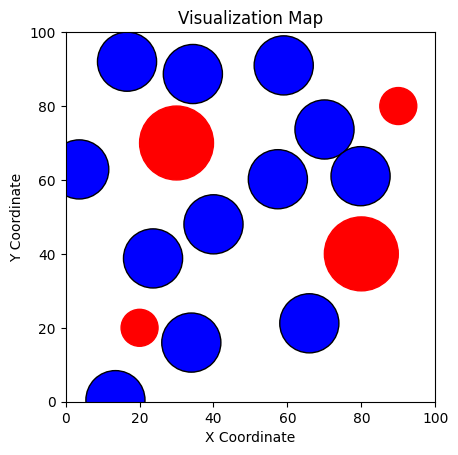

--------------------------------------------------------------------------------------------------------------------------------------
Generation  218 : [[92, 16], [59, 79], [62, 31], [43.98968416595715, 91.16595226784256], [77, 89], [79.59305886044642, 64.01424346852633], [74, 14], [50, 17], [15, 90], [42.9, 51.099999999999994], [38.00571465770622, 7.029450707799056], [59, 52], [34.419571162320835, 88.66302505950685], [70.03533937582905, 73.65759964557535], [3.675355796221904, 62.8524606806655], [16.605868505624393, 91.99999999999999], [40.0, 47.99999999999999], [57.4184486150468, 60.196707354117706], [34.0, 16.0], [65.93130551391735, 21.21533845716811], [79.79070354636028, 61.02151560764959], [59.0, 91.0], [13.47045359107948, 0.41972290467283807], [23.643778462336478, 38.774664076761724], [75, 15], [12.465166572670759, 54.468381156147245], [91.2863438847323, 18.780883564420858], [61.25736473072073, 102.4187094920546], [78, 85], [79, 69], [53.72224854927836, 67.272701077399], [13, 35]

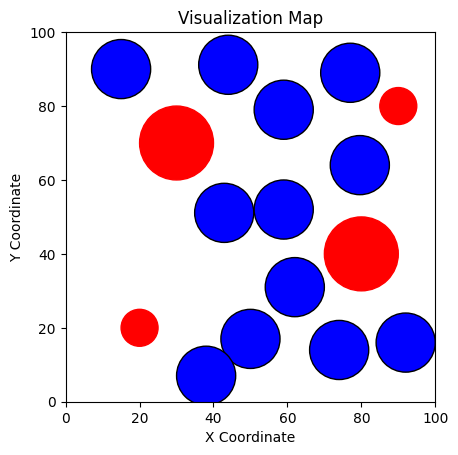

--------------------------------------------------------------------------------------------------------------------------------------
Generation  219 : [[27.125871348696247, 51.79890751785206], [85, 92], [9.50260673886657, 59.45573820419965], [89, 16], [10, 92], [60, 91], [72, 73], [55.4793916541752, 65.16460153715043], [39, 39], [53.39999999999999, 50.4], [50.94113607732384, 16.92591687140185], [25, 92], [18.8425368285648, 33.090894912789274], [63.96928951677476, 67.64526658344062], [29, 11], [45, 59], [0.004317283530136606, 3.510434826675553], [7.13816191899153, 70.97172881992365], [63, 45], [55.99196754632636, 89.95797791699312], [10.12365306279749, 92.0], [50.47627828605287, 25.97793792875867], [73.44553321285944, 23.609330606255625], [76, 92], [18.8425368285648, 33.090894912789274], [63.96928951677476, 67.64526658344062], [29, 11], [45, 59], [0.004317283530136606, 3.510434826675553], [7.13816191899153, 70.97172881992365], [63, 45], [55.99196754632636, 89.95797791699312], [10.1236

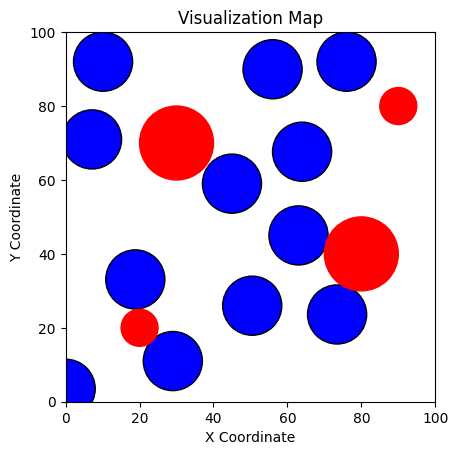

--------------------------------------------------------------------------------------------------------------------------------------
Generation  220 : [[18.8425368285648, 33.090894912789274], [63.96928951677476, 67.64526658344062], [28.999999999999996, 11.0], [45.0, 59.0], [0.004317283530136606, 3.510434826675553], [7.13816191899153, 70.97172881992365], [62.99999999999999, 45.0], [55.99196754632635, 89.95797791699312], [10.12365306279749, 91.99999999999999], [50.47627828605286, 25.977937928758667], [73.44553321285944, 23.609330606255625], [76.0, 91.99999999999999], [18.8425368285648, 33.090894912789274], [63.96928951677476, 67.64526658344062], [29, 11], [45, 59], [0.004317283530136606, 3.510434826675553], [7.13816191899153, 70.97172881992365], [63, 45], [55.99196754632636, 89.95797791699312], [10.12365306279749, 92.0], [50.47627828605287, 25.97793792875867], [73.44553321285944, 23.609330606255625], [76, 92], [8, 74], [12, 40], [82, 67], [92.0, 14.838087054815741], [11.030743480029864

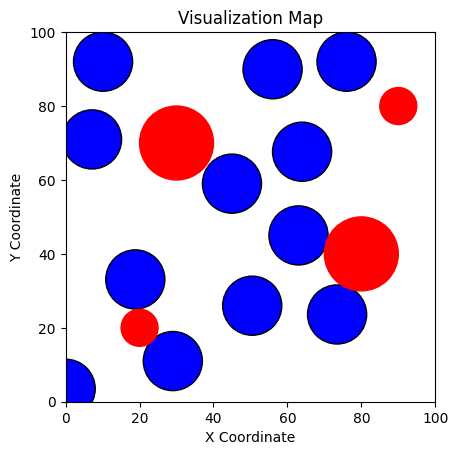

--------------------------------------------------------------------------------------------------------------------------------------
Generation  221 : [[87, 16], [39, 43], [72, 69], [24, 91], [7.7228156210799455, 64.43629659188477], [52, 65], [45, 11], [59.24417043209344, 79.6524525224989], [22, 36], [62.75088080891786, 50.969050617960114], [61.03647092552083, 23.109979984067024], [43.31442220287847, 91.99999999999999], [18.8425368285648, 33.090894912789274], [63.96928951677476, 67.64526658344062], [28.999999999999996, 11.0], [45.0, 59.0], [0.004317283530136606, 3.510434826675553], [7.13816191899153, 70.97172881992365], [62.99999999999999, 45.0], [55.99196754632635, 89.95797791699312], [10.12365306279749, 91.99999999999999], [50.47627828605286, 25.977937928758667], [73.44553321285944, 23.609330606255625], [76.0, 91.99999999999999], [59, 54], [19.74516495030837, 48.735030075936336], [11, 30], [84.5697977586487, 20.64442385845087], [6.769419990693588, 84.21352083086595], [54, 71], [42.

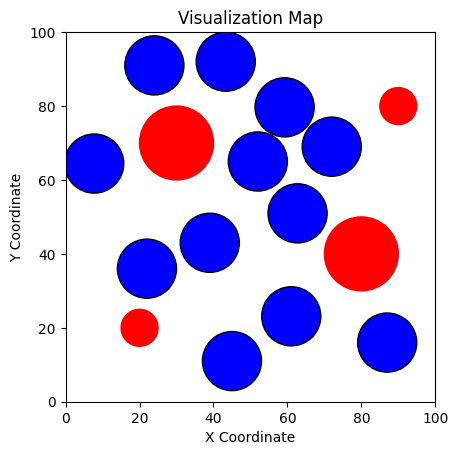

--------------------------------------------------------------------------------------------------------------------------------------
Generation  222 : [[32, 32], [12, 69], [88, 19], [91, 55], [82, 91], [26, 46], [50.099999999999994, 47.099999999999994], [15, 36], [9.786557143958243, 87.49999999999999], [47.633394800237, 21.784556550131065], [67, 67], [58.9, 91.99999999999999], [48, 38], [61, 77], [92.0, 55.295963597456335], [8, 85], [76, 72], [87.28937813246621, 16.776041966589066], [17.401337632336908, 53.43619435220086], [46.8807798864913, 64.59984364814729], [45, 84], [42.832820498819004, 18.289628597527837], [63.54930532806618, 56.39899871311287], [22, 90], [48, 38], [61, 77], [92.0, 55.295963597456335], [8, 85], [76, 72], [87.28937813246621, 16.776041966589066], [17.401337632336908, 53.43619435220086], [46.8807798864913, 64.59984364814729], [45, 84], [42.832820498819004, 18.289628597527837], [63.54930532806618, 56.39899871311287], [22, 90]]
Generation  222  Objective Function : 

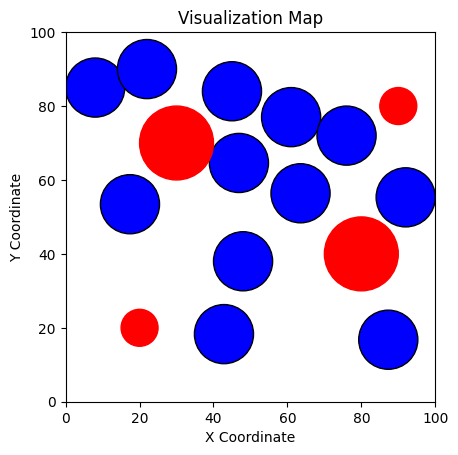

--------------------------------------------------------------------------------------------------------------------------------------
Generation  223 : [[47.99999999999999, 38.0], [61.0, 77.0], [91.99999999999999, 55.295963597456335], [8.0, 85.0], [76.0, 72.0], [87.28937813246621, 16.776041966589066], [17.401337632336908, 53.43619435220086], [46.8807798864913, 64.59984364814729], [45.0, 84.0], [42.832820498819004, 18.289628597527837], [63.54930532806618, 56.39899871311286], [22.0, 90.0], [48, 38], [61, 77], [92.0, 55.295963597456335], [8, 85], [76, 72], [87.28937813246621, 16.776041966589066], [17.401337632336908, 53.43619435220086], [46.8807798864913, 64.59984364814729], [45, 84], [42.832820498819004, 18.289628597527837], [63.54930532806618, 56.39899871311287], [22, 90], [38, 41], [50, 74], [91.01536634339985, 12.818115125304963], [30, 91], [75, 17], [33, 22], [55.506222569871746, 55.780266538395225], [10.62244369949444, 37.863875635669025], [5.192684262590199, 82.54877981532005], [5

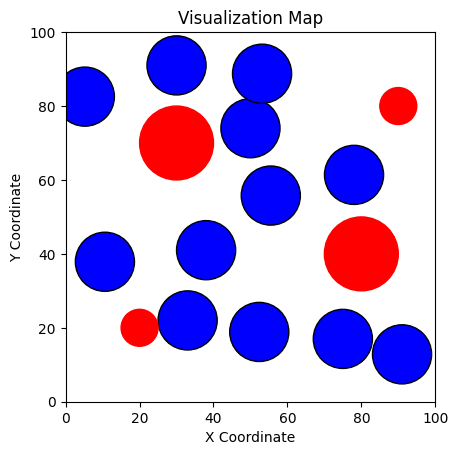

--------------------------------------------------------------------------------------------------------------------------------------
Generation  224 : [[47.99999999999999, 38.0], [61.0, 77.0], [91.99999999999999, 55.295963597456335], [8.0, 85.0], [76.0, 72.0], [87.28937813246621, 16.776041966589066], [17.401337632336908, 53.43619435220086], [46.8807798864913, 64.59984364814729], [45.0, 84.0], [42.832820498819004, 18.289628597527837], [63.54930532806618, 56.39899871311286], [22.0, 90.0], [38, 41], [50, 74], [91.01536634339985, 12.818115125304963], [30, 91], [75, 17], [33, 22], [55.506222569871746, 55.780266538395225], [10.62244369949444, 37.863875635669025], [5.192684262590199, 82.54877981532005], [52.38562909653918, 18.8773305302216], [78.02415789834845, 61.37650784351686], [53.14066439255471, 88.7450135911025], [55.9794458908608, 38.19603004336385], [68, 14], [89, 56], [19.503071367477304, 88.60080316824674], [41, 37], [92.0, 7.78777875200991], [19.897500050388103, 54.96933624675914

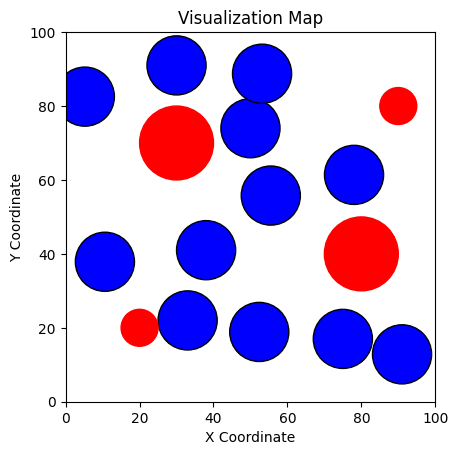

--------------------------------------------------------------------------------------------------------------------------------------
Generation  225 : [[50.39383376725823, 38.05880901300915], [74, 84], [91.1, 55.50717451821943], [11.45092141024319, 86.080240950474], [65, 28], [88.70256469272634, 14.07956300221532], [18.150186357752265, 53.89613692056834], [57.71654592054391, 72.81989055370309], [47.40533171338201, 86.38462668536566], [45.678347228893855, 17.112888243429474], [60.97277628361158, 58.34681926872371], [25.67444481734727, 90.6], [38, 41], [50, 74], [91.01536634339985, 12.818115125304963], [30, 91], [75, 17], [33, 22], [55.506222569871746, 55.780266538395225], [10.62244369949444, 37.863875635669025], [5.192684262590199, 82.54877981532005], [52.38562909653918, 18.8773305302216], [78.02415789834845, 61.37650784351686], [53.14066439255471, 88.7450135911025], [47.51534506348101, 28.561875847731056], [56, 82], [95.17223408551698, 63.112153572553396], [11.318213713538945, 96.527

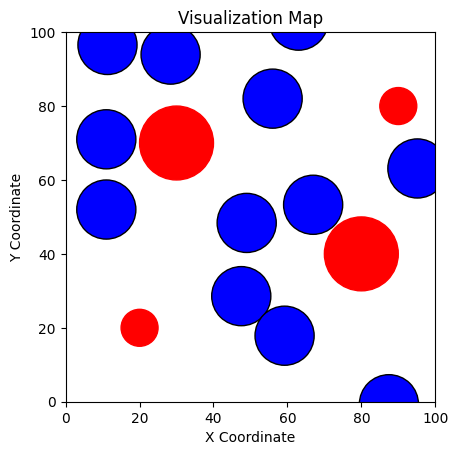

--------------------------------------------------------------------------------------------------------------------------------------
Generation  226 : [[29, 48], [68.6, 83.39999999999999], [92.32167022565508, 57.78866823451962], [11.411109101231915, 89.21440779001891], [60.19445499312828, 34.11308068561828], [88.33114989975412, 9.651521288572638], [16.005130450426584, 59.02729584439784], [10, 34], [52.0908196725368, 91.40065711093818], [49.74545970012612, 17.337029795612313], [62.76902249288642, 56.82914742228768], [26.490656105818992, 91.59501414886287], [47.51534506348101, 28.561875847731056], [56, 82], [95.17223408551698, 63.112153572553396], [11.318213713538945, 96.52746374895705], [48.98151664376094, 48.3769356187276], [87.46451538281897, -0.680576043260281], [11, 71], [11, 52], [63.02362491056466, 103.10472810394076], [59.23538879966809, 17.860026750705607], [66.96026364786105, 53.28791311393696], [28.395149112253023, 93.91671382954291], [49.22208736563413, 45.87497601413355], 

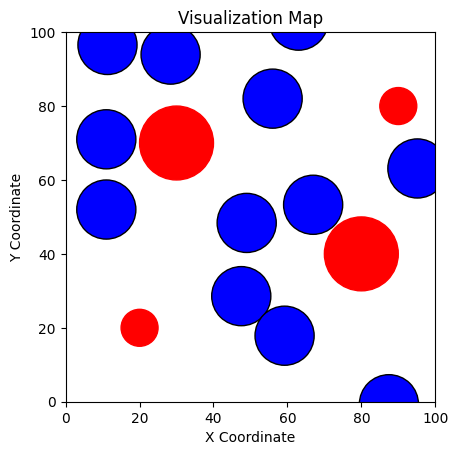

--------------------------------------------------------------------------------------------------------------------------------------
Generation  227 : [[64, 28], [69.0166279719078, 83.09039755584602], [92.22516915795855, 60.565744679637504], [8, 27], [44.8361184951898, 44.57915647993279], [89.43180492982788, 14.17518401438544], [18.28432412518726, 56.332058432852136], [70, 13], [50.898574543487925, 90.92215796466644], [52.88252256801269, 15.078075983791642], [62.84211434306065, 60.502302537699116], [27.753284481130613, 91.716509904204], [47.51534506348101, 28.561875847731056], [56, 82], [95.17223408551698, 63.112153572553396], [11.318213713538945, 96.52746374895705], [48.98151664376094, 48.3769356187276], [87.46451538281897, -0.680576043260281], [11, 71], [11, 52], [63.02362491056466, 103.10472810394076], [59.23538879966809, 17.860026750705607], [66.96026364786105, 53.28791311393696], [28.395149112253023, 93.91671382954291], [44, 35], [51, 71], [75, 71], [79, 88], [1.843143802786627,

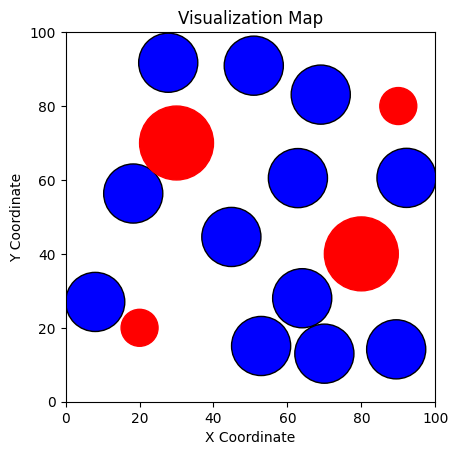

--------------------------------------------------------------------------------------------------------------------------------------
Generation  228 : [[76, 67], [13, 82], [92.25167022565509, 63.033646071766015], [60, 91], [23, 42], [85.73935461484568, 15.195827187021914], [8, 40], [31, 92], [52.50708747316939, 70.13141843118223], [64, 9], [51.588079094358314, 22.98637393418109], [49.81854473367591, 38.67501414886287], [57.30478769393052, 76.80660393105282], [14.494098966627453, 92.0], [19, 37], [35.746745148919324, 33.25967595840565], [37, 88], [92.0, 20.20610821421773], [52, 92], [81.72711428098692, 58.65269387833399], [42.03088755250348, 48.29047107624086], [57.52089506164024, 29.735280496113248], [35.585562011329074, 15.166620830820388], [58.2385981676588, 7.806766530950908], [57.30478769393052, 76.80660393105282], [14.494098966627453, 92.0], [19, 37], [35.746745148919324, 33.25967595840565], [37, 88], [92.0, 20.20610821421773], [52, 92], [81.72711428098692, 58.65269387833399], [

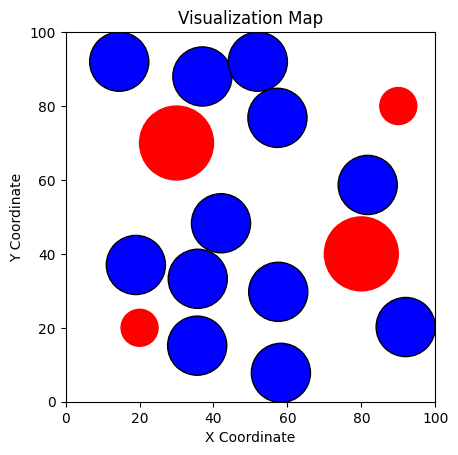

--------------------------------------------------------------------------------------------------------------------------------------
Generation  229 : [[57.30478769393052, 76.80660393105282], [14.494098966627451, 91.99999999999999], [19.0, 37.0], [35.746745148919324, 33.25967595840565], [37.0, 88.0], [91.99999999999999, 20.20610821421773], [52.0, 91.99999999999999], [81.72711428098692, 58.65269387833399], [42.03088755250348, 48.29047107624086], [57.52089506164024, 29.735280496113248], [35.585562011329074, 15.166620830820388], [58.2385981676588, 7.806766530950908], [57.30478769393052, 76.80660393105282], [14.494098966627453, 92.0], [19, 37], [35.746745148919324, 33.25967595840565], [37, 88], [92.0, 20.20610821421773], [52, 92], [81.72711428098692, 58.65269387833399], [42.03088755250348, 48.29047107624086], [57.52089506164024, 29.735280496113248], [35.585562011329074, 15.166620830820388], [58.2385981676588, 7.806766530950908], [84, 92], [12.27672041185473, 92.0], [92.0, 64.156351749958

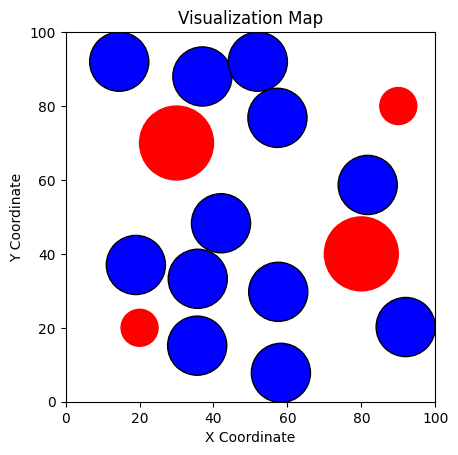

--------------------------------------------------------------------------------------------------------------------------------------
Generation  230 : [[57.30478769393052, 76.80660393105282], [14.494098966627451, 91.99999999999999], [19.0, 37.0], [35.746745148919324, 33.25967595840565], [37.0, 88.0], [91.99999999999999, 20.20610821421773], [52.0, 91.99999999999999], [81.72711428098692, 58.65269387833399], [42.03088755250348, 48.29047107624086], [57.52089506164024, 29.735280496113248], [35.585562011329074, 15.166620830820388], [58.2385981676588, 7.806766530950908], [57.30478769393052, 76.80660393105282], [14.494098966627451, 91.99999999999999], [19.0, 37.0], [35.746745148919324, 33.25967595840565], [37.0, 88.0], [91.99999999999999, 20.20610821421773], [52.0, 91.99999999999999], [81.72711428098692, 58.65269387833399], [42.03088755250348, 48.29047107624086], [57.52089506164024, 29.735280496113248], [35.585562011329074, 15.166620830820388], [58.2385981676588, 7.806766530950908], [96.3485

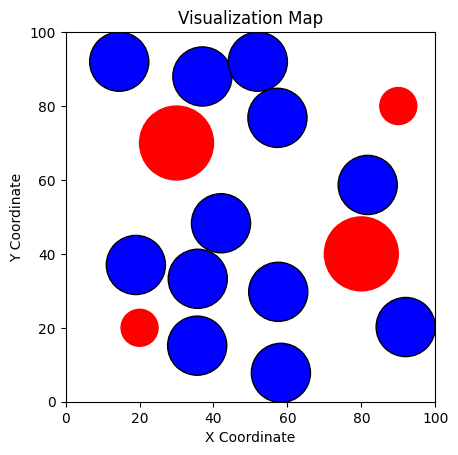

--------------------------------------------------------------------------------------------------------------------------------------
Generation  231 : [[21, 53], [10.90664045265892, 96.25917082292202], [27, 9], [41.44070883596956, 48.46890989275684], [8, 25], [32, 37], [54, 86], [67.90965520413053, 70.86264414561177], [52.521621286752435, 59.6033297533686], [8, 70], [48.60989340793035, 31.91663458157427], [53.67551949219262, 12.449084517651773], [57.30478769393052, 76.80660393105282], [14.494098966627451, 91.99999999999999], [19.0, 37.0], [35.746745148919324, 33.25967595840565], [37.0, 88.0], [91.99999999999999, 20.20610821421773], [52.0, 91.99999999999999], [81.72711428098692, 58.65269387833399], [42.03088755250348, 48.29047107624086], [57.52089506164024, 29.735280496113248], [35.585562011329074, 15.166620830820388], [58.2385981676588, 7.806766530950908], [106.00684138367129, 106.0296119942141], [-4.440775672647138, 101.55522210168927], [97.4556455397543, 52.53605407244183], [54.515

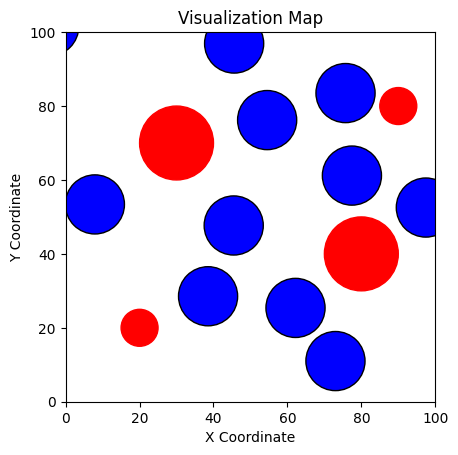

--------------------------------------------------------------------------------------------------------------------------------------
Generation  232 : [[80.5047889685699, 90.12072839594987], [0.1634491649446792, 99.96640671805908], [16, 87], [43, 8], [29, 32], [41.43027387574909, 44.47987749802751], [22, 50], [52.282325691071364, 89.09720551126031], [66.85648638602572, 25.58099892601058], [87, 15], [67.58910701026294, 68.02920926744875], [43.07626869322959, 23.708928108489868], [106.00684138367129, 106.0296119942141], [-4.440775672647138, 101.55522210168927], [97.4556455397543, 52.53605407244183], [54.51522801887984, 76.1994717018122], [62.19046656471351, 25.381721295089264], [45.471819822498695, 47.68553928289644], [7.910365437678094, 53.384905287311135], [45.58489875690316, 96.9120175251097], [73, 11], [77.45355104780197, 61.18376130916658], [75.72305569697691, 83.50602698996639], [38.53373263653115, 28.534575361706196], [67, 8], [54, 44], [35, 92], [8, 71], [0, 27.4696441381468], 

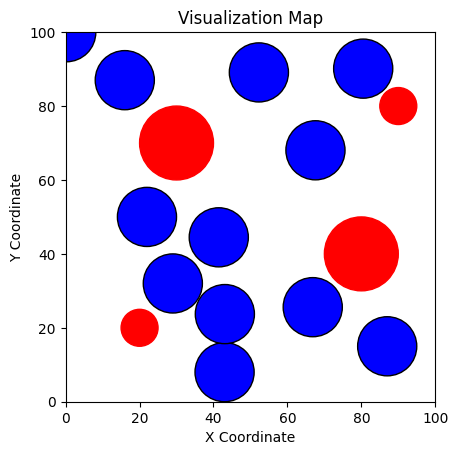

--------------------------------------------------------------------------------------------------------------------------------------
Generation  233 : [[84, 62], [38.56776729820586, 40.26656663050678], [67.03669366192628, 52.86081622173254], [11, 66], [42.45713996941405, 16.01451638852678], [78, 11], [24.773109631303427, 47.515471586193335], [30, 91], [61, 12], [44.93606531434059, 82.75512839274997], [70.31691670909306, 82.45180809698991], [46.56011979095935, 59.66037260851185], [85.02411456558043, 58.72964450489173], [45, 33], [60.51798105025483, 65.0278625816858], [12.438094165623793, 52.891276450436074], [42.59041847716582, 8.124550067009714], [12, 30], [26.796676309148253, 36.876618076893706], [62, 13], [1.3605686179349892, 14.912072156570504], [37.734713030053975, 92.0], [61, 47], [52.54965394131374, 84.32381302452286], [85.02411456558043, 58.72964450489173], [45, 33], [60.51798105025483, 65.0278625816858], [12.438094165623793, 52.891276450436074], [42.59041847716582, 8.12455006

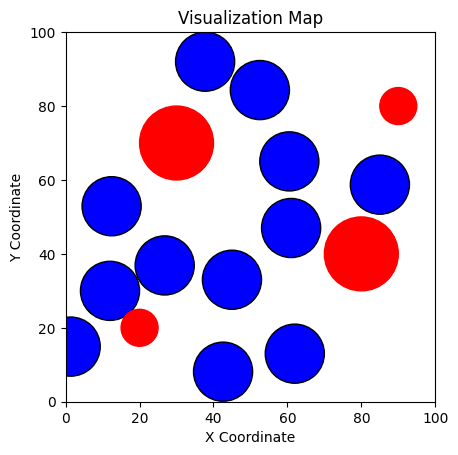

--------------------------------------------------------------------------------------------------------------------------------------
Generation  234 : [[85.02411456558042, 58.72964450489173], [45.0, 33.0], [60.51798105025483, 65.02786258168578], [12.438094165623793, 52.89127645043607], [42.59041847716582, 8.124550067009714], [11.999999999999998, 30.0], [26.796676309148253, 36.876618076893706], [62.0, 13.0], [1.3605686179349892, 14.912072156570503], [37.734713030053975, 91.99999999999999], [61.0, 47.0], [52.549653941313736, 84.32381302452286], [85.02411456558043, 58.72964450489173], [45, 33], [60.51798105025483, 65.0278625816858], [12.438094165623793, 52.891276450436074], [42.59041847716582, 8.124550067009714], [12, 30], [26.796676309148253, 36.876618076893706], [62, 13], [1.3605686179349892, 14.912072156570504], [37.734713030053975, 92.0], [61, 47], [52.54965394131374, 84.32381302452286], [92.0, 61.985076856167154], [47.926924001602615, 47.086824678696374], [8, 49], [3.79004801754669

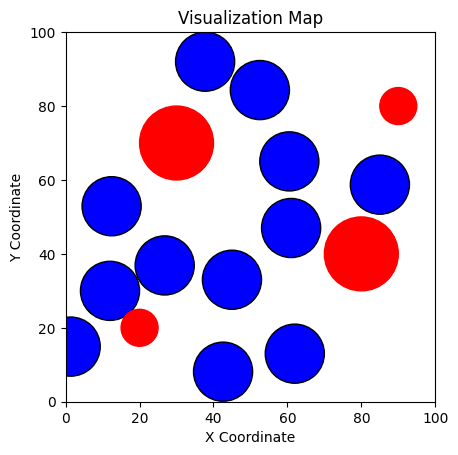

--------------------------------------------------------------------------------------------------------------------------------------
Generation  235 : [[85.00723436967412, 58.218893351467514], [43, 45], [55, 34], [52.03142824968714, 59.26738293513082], [11, 60], [40.0, 27.9], [86, 8], [62.69999999999999, 15.799999999999999], [6.708170585380497, 10.77362164697115], [26.72041390901619, 88.5], [23.9, 48.4], [54.964896182394114, 83.39714390735685], [82.16703780182443, 62.82434005243536], [55.266738697372986, 68.9797220065903], [84.49709885518456, 21.17985327833025], [69.97608251960803, 75.23265136465562], [50, 92], [57, 42], [38.562049594758705, 35.34763723579472], [61.632444803316446, 15.71607582172977], [35, 8], [22.450446087473495, 87.50028416936503], [13.166056315397231, 50.625892037237875], [70.86425078123763, 92.0], [82.16703780182443, 62.82434005243536], [55.266738697372986, 68.9797220065903], [84.49709885518456, 21.17985327833025], [69.97608251960803, 75.23265136465562], [50, 92]

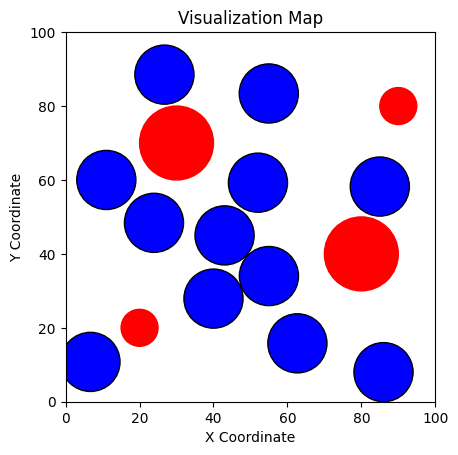

--------------------------------------------------------------------------------------------------------------------------------------
Generation  236 : [[69, 89], [9, 86], [23, 91], [22, 42], [60, 52], [85, 92], [47, 90], [58.38973344099493, 22.91482274651893], [39.2, 17.099999999999998], [69.73513382624205, 66.15008525080951], [13, 55], [84, 8], [68.42995590762209, 12.647910050259327], [64, 60], [71.86160988582029, 80.8040266184145], [53.49490132777963, 5.678466742338194], [42.83703852774461, 57.04083160928785], [14, 32], [22.20949623700117, 92.0], [49.850377692965466, 33.96311497267172], [39.19893539262455, 11.44172083000141], [81.52187305243692, 65.55547569820627], [55.064693957768014, 81.06509153696344], [5.2295940594940475, 77.53594449740704], [68.42995590762209, 12.647910050259327], [64, 60], [71.86160988582029, 80.8040266184145], [53.49490132777963, 5.678466742338194], [42.83703852774461, 57.04083160928785], [14, 32], [22.20949623700117, 92.0], [49.850377692965466, 33.963114972

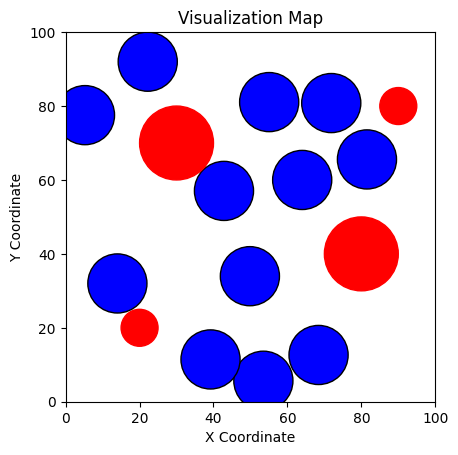

--------------------------------------------------------------------------------------------------------------------------------------
Generation  237 : [[68.42995590762209, 12.647910050259327], [64.0, 60.0], [71.86160988582029, 80.8040266184145], [53.49490132777963, 5.678466742338194], [42.83703852774461, 57.04083160928784], [14.0, 32.0], [22.20949623700117, 91.99999999999999], [49.850377692965466, 33.96311497267172], [39.19893539262455, 11.44172083000141], [81.52187305243692, 65.55547569820627], [55.064693957768014, 81.06509153696342], [5.2295940594940475, 77.53594449740704], [68.42995590762209, 12.647910050259327], [64, 60], [71.86160988582029, 80.8040266184145], [53.49490132777963, 5.678466742338194], [42.83703852774461, 57.04083160928785], [14, 32], [22.20949623700117, 92.0], [49.850377692965466, 33.96311497267172], [39.19893539262455, 11.44172083000141], [81.52187305243692, 65.55547569820627], [55.064693957768014, 81.06509153696344], [5.2295940594940475, 77.53594449740704], [11, 

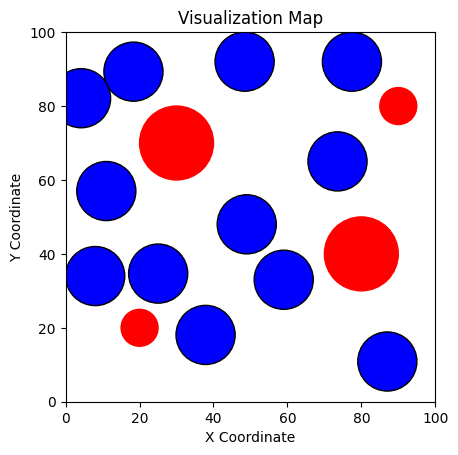

--------------------------------------------------------------------------------------------------------------------------------------
Generation  238 : [[62, 18], [15, 91], [68, 91], [11, 41], [86, 9], [10, 73], [30.0721658993844, 91.99999999999999], [37.295264385075825, 33.9741804808702], [38.79677906736529, 13.43145138981114], [79.13177618451994, 65.39549750296996], [53.245285770437604, 71.14556407587439], [57, 46], [11, 57], [4.171742636106455, 82.11817081508192], [18.34291146297459, 89.30717403897259], [25.0342776058827, 34.66727791605375], [59, 33], [77.45394045220202, 92.0], [48.41839511161195, 92.0], [8, 34], [37.85841430842704, 18.074156029367177], [73.55488349271369, 65.02221504741858], [49, 48], [87.03755720321892, 10.883536235841719], [73.45756213422035, 13.30086933404862], [61, 39], [51, 87], [68, 53], [34, 91], [22.76697753748099, 45.180138660612656], [76, 88], [48.55951780166738, 48.31343119000574], [42.97826720256353, 24.676020277939358], [29, 8], [65.39041166484436, 72

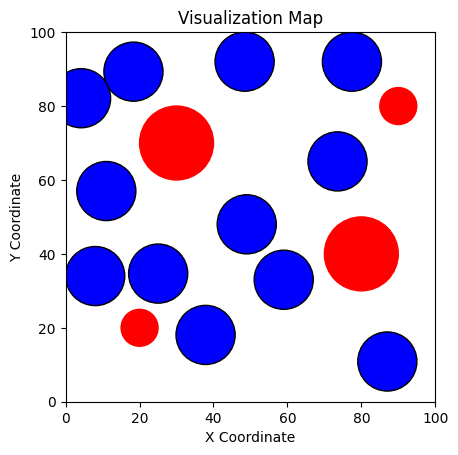

--------------------------------------------------------------------------------------------------------------------------------------
Generation  239 : [[11, 32], [10, 59], [86, 58], [55.11028328176481, 47.50018337481612], [51, 11], [81, 13], [67.72551853348358, 89.19999999999999], [36.391662461167165, 44.01940183300401], [19, 91], [42.3664650478141, 25.10666451422557], [60.473288165391054, 64.86632065641078], [61, 33], [11, 57], [4.171742636106455, 82.11817081508192], [18.34291146297459, 89.30717403897259], [25.0342776058827, 34.66727791605375], [59, 33], [77.45394045220202, 92.0], [48.41839511161195, 92.0], [8, 34], [37.85841430842704, 18.074156029367177], [73.55488349271369, 65.02221504741858], [49, 48], [87.03755720321892, 10.883536235841719], [72.15680302986344, 19.13934455366239], [53, 87], [80.4165268431966, 92.0], [18.822401793854365, 44.54374785102582], [79.88743081550082, 0.622819926820732], [11.369636625774007, 78.76072456807039], [30.53285702880048, 92.0], [30, 12], [50.06

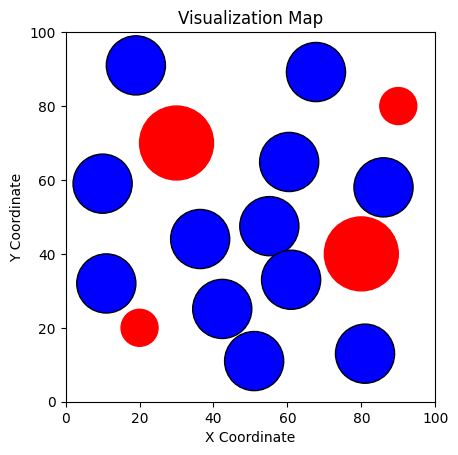

--------------------------------------------------------------------------------------------------------------------------------------
Generation  240 : [[29, 8], [10, 47], [84.32495805295898, 68.19999999999999], [41, 85], [59.66622924465024, 7.886845978046219], [9, 62], [56.56772008207865, 90.03999999999999], [34.47416372281701, 34.41358128310281], [62, 73], [81, 17], [60.93130171577373, 54.40642445948754], [57.80606429440706, 38.66191854255002], [11, 32], [10, 59], [86, 58], [55.11028328176481, 47.50018337481612], [51, 11], [81, 13], [67.72551853348358, 89.19999999999999], [36.391662461167165, 44.01940183300401], [19, 91], [42.3664650478141, 25.10666451422557], [60.473288165391054, 64.86632065641078], [61, 33], [71, 71], [53, 86], [84.18549997307203, 101.67531004214445], [10, 33], [74.47612077794635, -3.5932052761924416], [88, 23], [22.122754761432255, 95.2490666602271], [15, 58], [46.600371153172105, 19.438189356456142], [41, 44], [61.42363405792005, 28.485420997710392], [58.3444109

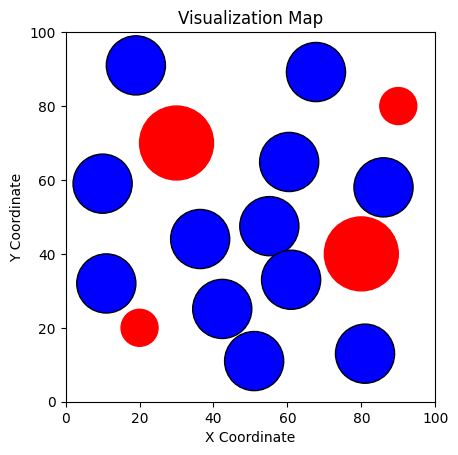

--------------------------------------------------------------------------------------------------------------------------------------
Generation  241 : [[8, 71], [10.0, 55.4], [85.49748741588769, 61.05999999999999], [92, 9], [33, 10], [10, 9], [64.3781789980621, 89.45199999999998], [35.81641283966212, 41.137655668033645], [73, 71], [11, 39], [60.61069223050585, 61.7283517973338], [60.04181928832212, 34.698575562765], [11, 32], [10, 59], [86, 58], [55.11028328176481, 47.50018337481612], [51, 11], [81, 13], [67.72551853348358, 89.19999999999999], [36.391662461167165, 44.01940183300401], [19, 91], [42.3664650478141, 25.10666451422557], [60.473288165391054, 64.86632065641078], [61, 33], [33.71764154254451, 15.11054140246069], [56, 68], [54, 27], [37.3241470833634, 91.85470243098361], [61.65727962894586, 12.88618347491882], [10.06253431578008, 63.49653562124349], [85, 57], [43.96494591355072, 39.60197466903252], [68.61433875594038, 86.61995585005673], [88, 9], [15, 86], [66, 53]]
Generatio

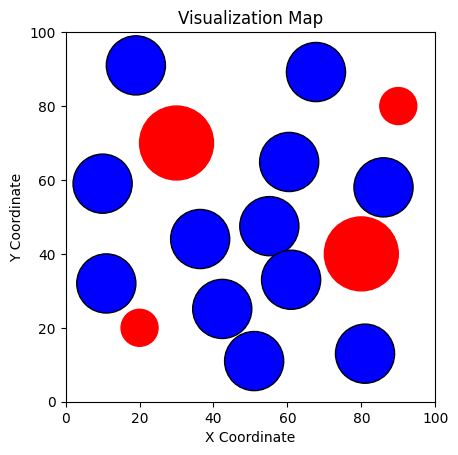

--------------------------------------------------------------------------------------------------------------------------------------
Generation  242 : [[65, 18], [10, 55], [53, 91], [33, 89], [41.59718388868376, 10.865855042475646], [64, 58], [80, 15], [17, 92], [71.68430162678212, 75.68598675501701], [34.099999999999994, 29.999999999999996], [32, 52], [61.82927350182548, 40.189002893935495], [11, 32], [10, 59], [86, 58], [55.11028328176481, 47.50018337481612], [51, 11], [81, 13], [67.72551853348358, 89.19999999999999], [36.391662461167165, 44.01940183300401], [19, 91], [42.3664650478141, 25.10666451422557], [60.473288165391054, 64.86632065641078], [61, 33], [19.598369700466264, 85.92061710053906], [14.009635260949974, 61.827756366649744], [52, 24], [82.5298909975754, 11.696822109920369], [30.147172785594265, 2.7059892608375824], [3.525718087467192, 4.7315590184111915], [58.95611778830634, 89.8376751504789], [41.117363108749515, 43.302265752126466], [48, 62], [23.159746921585036, 35.

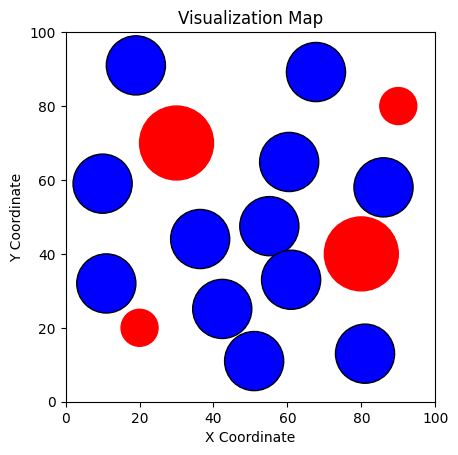

--------------------------------------------------------------------------------------------------------------------------------------
Generation  243 : [[90, 11], [12.80674468266498, 60.97942945665481], [62.2, 34.199999999999996], [74.30400868283222, 22.437830489389093], [53, 10], [26.768002661227037, 7.212091312887834], [61.5869380118595, 89.64637260533522], [39.69965291447481, 43.517406576389725], [42, 22], [28.92176235945375, 32.14641100057821], [65.2899870727593, 72.00801713441871], [63.099999999999994, 51.9], [11, 32], [10, 59], [86, 58], [55.11028328176481, 47.50018337481612], [51, 11], [81, 13], [67.72551853348358, 89.19999999999999], [36.391662461167165, 44.01940183300401], [19, 91], [42.3664650478141, 25.10666451422557], [60.473288165391054, 64.86632065641078], [61, 33], [24, 32], [7.408313427235294, 45.78843077331315], [52.46962686830694, 92.0], [36.55762241963194, 92.0], [38.48085694295601, 23.225727777024687], [73.27649457908575, 59.608568247031435], [78.70808773084606, 22

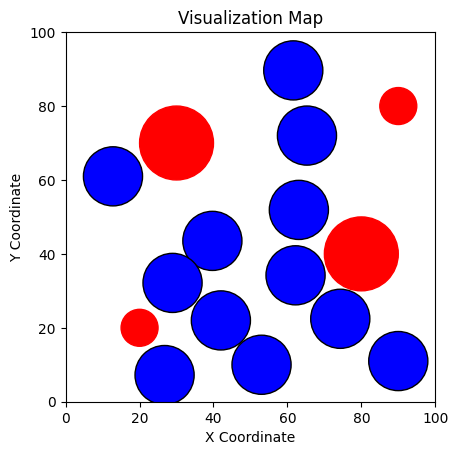

--------------------------------------------------------------------------------------------------------------------------------------
Generation  244 : [[8, 31], [8.185819399064705, 49.7519015413192], [62.52873880781486, 81.79999999999998], [82, 18], [42.236599860069205, 19.558009443917282], [90, 67], [60, 16], [18, 86], [80, 92], [41.42306874008883, 35.51716752367505], [37.741986449617315, 52.35989619692323], [72.2, 63.8], [90, 11], [12.80674468266498, 60.97942945665481], [62.2, 34.199999999999996], [74.30400868283222, 22.437830489389093], [53, 10], [26.768002661227037, 7.212091312887834], [61.5869380118595, 89.64637260533522], [39.69965291447481, 43.517406576389725], [42, 22], [28.92176235945375, 32.14641100057821], [65.2899870727593, 72.00801713441871], [63.099999999999994, 51.9], [28, 10], [68, 9], [61.2762654474615, 106.81299845216583], [45.749570139169336, 86.80533888676023], [46, 11], [92, 25], [54, 74], [16.769791533046373, 87.53176320150787], [51.56711658382905, 57.9233062710

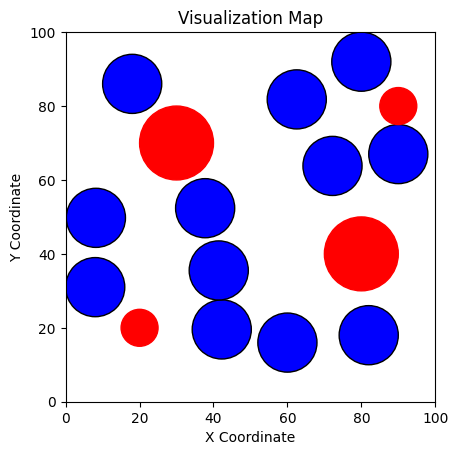

--------------------------------------------------------------------------------------------------------------------------------------
Generation  245 : [[71.39999999999999, 10.7], [14, 46], [42, 89], [62, 24], [81, 67], [46.33760186285892, 12.548463919021483], [59.31085660830165, 84.95246082373464], [9, 79], [9, 79], [36.18185080773464, 33.8240362089152], [52, 53], [66.31489021950668, 62.3699205941697], [8, 31], [8.185819399064705, 49.7519015413192], [62.52873880781486, 81.79999999999998], [82, 18], [42.236599860069205, 19.558009443917282], [90, 67], [60, 16], [18, 86], [80, 92], [41.42306874008883, 35.51716752367505], [37.741986449617315, 52.35989619692323], [72.2, 63.8], [70, 83], [67.13309257334927, 13.531896093736691], [55.500063389454255, 107.73756886957712], [40.33797520313296, 100.55302551846707], [37.58108077799722, 7.994015813376528], [104.21089106561884, 28.483400054673517], [44, 85], [8.723981369597036, 83.22612356506664], [52.65698717212615, 56.961951406640345], [15, 8], [

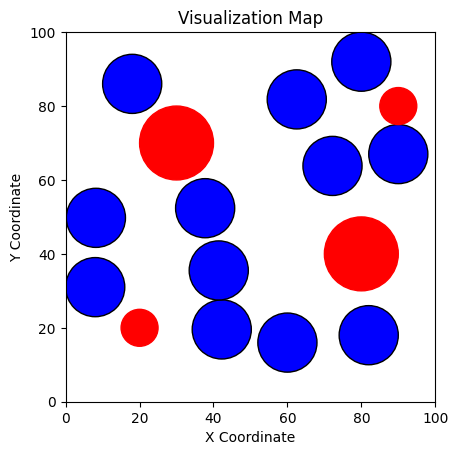

--------------------------------------------------------------------------------------------------------------------------------------
Generation  246 : [[70.42, 61.309999999999995], [59, 11], [51.450044372617974, 102.11629820870398], [27, 44], [50.606756544598056, 25.695811069363568], [86.84890430479086, 23.702919213977907], [48.59325698249049, 84.98573824712038], [8.806786958717925, 81.95828649554664], [22, 90], [66, 77], [43.698433038191624, 45.96670522366703], [78.00440367887106, 87.67441080755191], [8, 31], [8.185819399064705, 49.7519015413192], [62.52873880781486, 81.79999999999998], [82, 18], [42.236599860069205, 19.558009443917282], [90, 67], [60, 16], [18, 86], [80, 92], [41.42306874008883, 35.51716752367505], [37.741986449617315, 52.35989619692323], [72.2, 63.8], [84.57612506356107, 20.676637226842793], [37, 35], [79, 91], [54.5884189939615, 26.88694431273965], [38, 13], [60.43564981492831, 7.031925775598761], [55.670251791643864, 88.61653261681003], [8, 31], [9.4310837175814

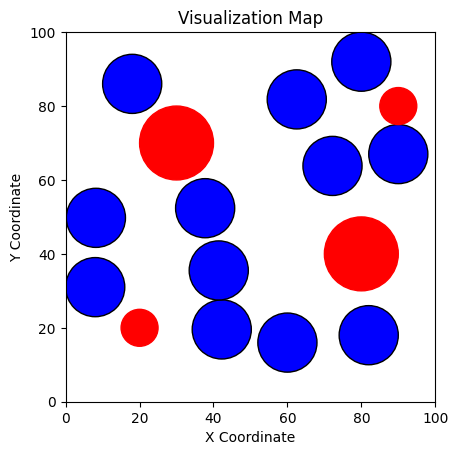

--------------------------------------------------------------------------------------------------------------------------------------
Generation  247 : [[76, 61], [25, 50], [59.71503106083257, 98.78140874609278], [35.27652569818845, 38.866083293821895], [46.824729581218634, 21.887067748554497], [78.9249279578321, 18.701621182464162], [50.7163554252365, 86.07497655802727], [8.564750871102547, 66.67080054688265], [18.229325115274428, 89.28568181005008], [54.09273221464521, 68.33268905204653], [45.30778864398084, 51.54499963817357], [75.0713809063176, 80.04063856750619], [8, 31], [8.185819399064705, 49.7519015413192], [62.52873880781486, 81.79999999999998], [82, 18], [42.236599860069205, 19.558009443917282], [90, 67], [60, 16], [18, 86], [80, 92], [41.42306874008883, 35.51716752367505], [37.741986449617315, 52.35989619692323], [72.2, 63.8], [28, 30], [59.02579695836955, 13.969034848010963], [40, 8], [18, 45], [51.69329667172396, 29.42174103958548], [92.0, 20.191668696160846], [48.3531135

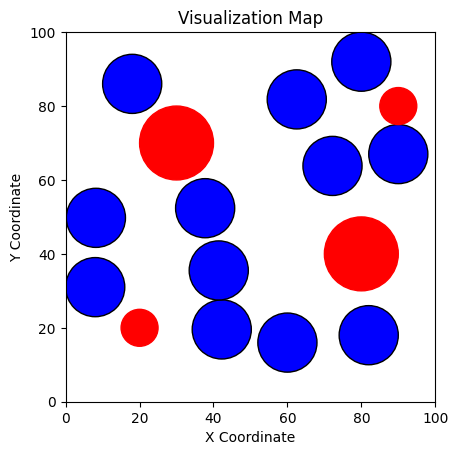

--------------------------------------------------------------------------------------------------------------------------------------
Generation  248 : [[61.599999999999994, 51.699999999999996], [13, 36], [65, 17], [30.093567988731913, 40.70625830567532], [48.28529970837023, 24.14746973586379], [82.84744957048247, 19.148635436573166], [50.00738284834374, 87.85248359061909], [77, 63], [18.755057520515575, 90.09997726703504], [56.66056699008189, 74.24244136942951], [45.67839020979616, 50.84723943181204], [76.41315715539828, 83.62844699725433], [8, 31], [8.185819399064705, 49.7519015413192], [62.52873880781486, 81.79999999999998], [82, 18], [42.236599860069205, 19.558009443917282], [90, 67], [60, 16], [18, 86], [80, 92], [41.42306874008883, 35.51716752367505], [37.741986449617315, 52.35989619692323], [72.2, 63.8], [17, 35], [8, 10], [49.52611280977092, -0.5718586009164568], [61, 68], [43.37942544119839, 26.955136898879843], [90.66146071835176, 20.30600192137338], [64, 30], [76.4012795588

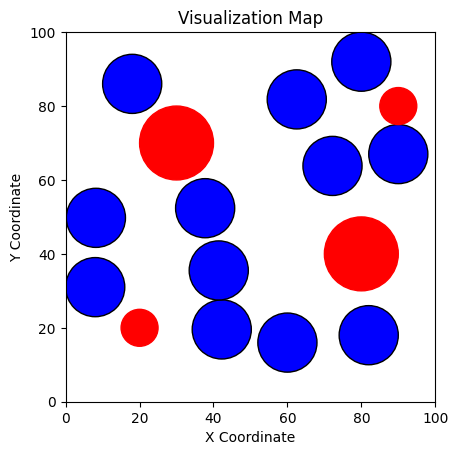

--------------------------------------------------------------------------------------------------------------------------------------
Generation  249 : [[87, 66], [11.55574581971941, 40.12557046239576], [60, 38], [12, 56], [46.47068975387992, 22.770631648279835], [14, 82], [42, 8], [15, 8], [37.1285402643609, 90.66998408692453], [28, 51], [43.297469081742506, 51.3010364613454], [75.1492100087788, 77.67991289807803], [8, 31], [8.185819399064705, 49.7519015413192], [62.52873880781486, 81.79999999999998], [82, 18], [42.236599860069205, 19.558009443917282], [90, 67], [60, 16], [18, 86], [80, 92], [41.42306874008883, 35.51716752367505], [37.741986449617315, 52.35989619692323], [72.2, 63.8], [40, 91], [92, 67], [33, 21], [22.045103970474194, 49.82085357690196], [10, 61], [74.67343903947527, 16.86326796094739], [90, 16], [73.21882315848539, 62.5594805372147], [15.62626264183131, 82.6397517593409], [55.80129024401472, 71.3554088088967], [47.60084345200663, 41.933741412217074], [77.39901511557

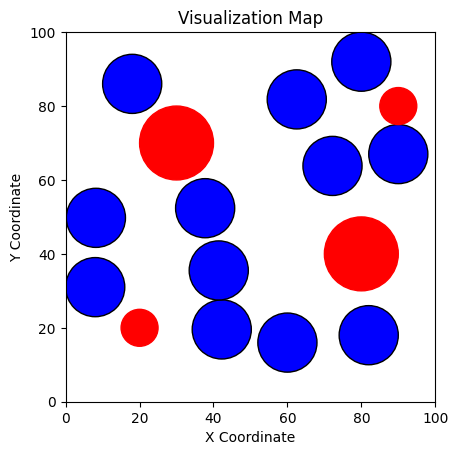

--------------------------------------------------------------------------------------------------------------------------------------
Generation  250 : [[85, 67], [86, 13], [51.9, 32.9], [15.013531191142256, 54.14625607307058], [15, 88], [16, 37], [56.4, 10.399999999999999], [32.46564694754562, 24.367844161164406], [30.67785697760202, 88.26091438864944], [55, 62], [44.58848139282174, 48.4908479466069], [75.82415154081816, 80.86249727380297], [8, 31], [8.185819399064705, 49.7519015413192], [62.52873880781486, 81.79999999999998], [82, 18], [42.236599860069205, 19.558009443917282], [90, 67], [60, 16], [18, 86], [80, 92], [41.42306874008883, 35.51716752367505], [37.741986449617315, 52.35989619692323], [72.2, 63.8], [62, 51], [7.676560204395545, 47.90691154805151], [59.19160131641108, 32.45995912772811], [70, 64], [48, 59], [8.085028346339485, 77.3687671261306], [56, 15], [25, 90], [84, 58], [53, 81], [33.31747384809984, 43.40670048209566], [81, 89]]
Generation  250  Objective Function : [

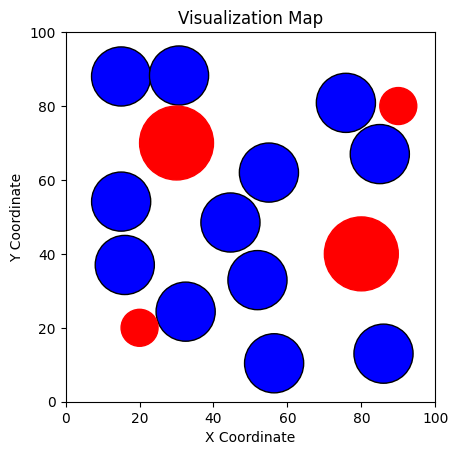

--------------------------------------------------------------------------------------------------------------------------------------
Generation  251 : [[24.199999999999996, 37.0], [8.033041640663956, 49.19840454333889], [52, 88], [87, 19], [43.965619902048445, 31.390606610742097], [42, 9], [58.8, 15.7], [20.1, 87.19999999999999], [88, 62], [48, 60], [36.41463266916207, 49.673937482474955], [74.84, 71.36], [85, 67], [86, 13], [51.9, 32.9], [15.013531191142256, 54.14625607307058], [15, 88], [16, 37], [56.4, 10.399999999999999], [32.46564694754562, 24.367844161164406], [30.67785697760202, 88.26091438864944], [55, 62], [44.58848139282174, 48.4908479466069], [75.82415154081816, 80.86249727380297], [61.12098672535324, 61.87017058008618], [7.318741686584494, 60.76970643003117], [54, 79], [77.8337648270638, 58.39160984342587], [10, 46], [62, 37], [52.13963705376602, 10.46976355141146], [23.09667977686152, 86.25616947829357], [12, 75], [67.76369222323967, 87.07946645269385], [44.1259526623544

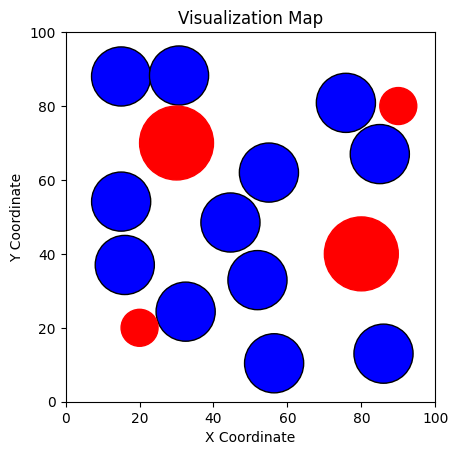

--------------------------------------------------------------------------------------------------------------------------------------
Generation  252 : [[78, 18], [63, 34], [10, 11], [39, 17], [89, 59], [23, 89], [57.11999999999999, 11.989999999999998], [25, 51], [47.87449988432141, 80.3826400720546], [52.9, 61.4], [42.13632677572384, 48.84577480736731], [75.52890607857272, 78.01174809166207], [85, 67], [86, 13], [51.9, 32.9], [15.013531191142256, 54.14625607307058], [15, 88], [16, 37], [56.4, 10.399999999999999], [32.46564694754562, 24.367844161164406], [30.67785697760202, 88.26091438864944], [55, 62], [44.58848139282174, 48.4908479466069], [75.82415154081816, 80.86249727380297], [61.9683006386762, 53.90816310729573], [74, 10], [51.70514394103264, 74.1403969199133], [50, 92], [12.951156292788763, 59.26667178544375], [89, 16], [86, 68], [42, 52], [2.191861990456202, 84.95297196371214], [70.7192111555384, 85.58829923493587], [12, 10], [49.29682985012704, 23.52538787831878]]
Generation 

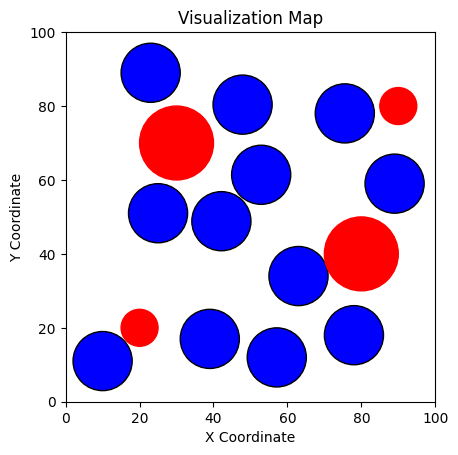

--------------------------------------------------------------------------------------------------------------------------------------
Generation  253 : [[91, 23], [15, 8], [34, 19], [70, 12], [18.58534688783663, 41.580001535633116], [8, 90], [51.0, 35.8], [74, 89], [53, 82], [41, 91], [51.199999999999996, 9.3], [56.78904895503811, 63.05761636349563], [46, 21], [64, 70], [90, 55], [4.876027744818922, 39.39336878238736], [33.39934085826487, 47.40261192107451], [18.619529226828327, 90.5411712007853], [61, 34], [80.98951782414704, 67.48239746182355], [41.708299494298984, 92.0], [64.30713404981378, 51.28139805594633], [78.95355207458739, 15.746948157291467], [60.10268018639955, 90.2411761190209], [46, 21], [64, 70], [90, 55], [4.876027744818922, 39.39336878238736], [33.39934085826487, 47.40261192107451], [18.619529226828327, 90.5411712007853], [61, 34], [80.98951782414704, 67.48239746182355], [41.708299494298984, 92.0], [64.30713404981378, 51.28139805594633], [78.95355207458739, 15.7469481

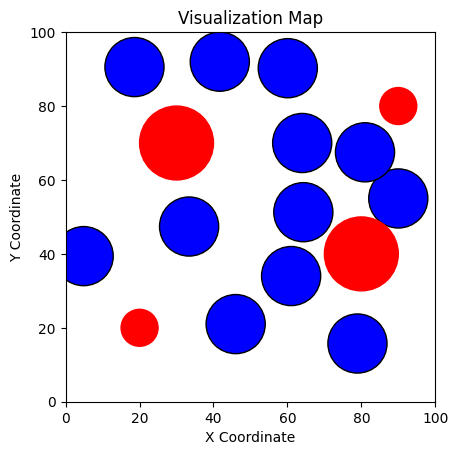

--------------------------------------------------------------------------------------------------------------------------------------
Generation  254 : [[77.5, 22.4], [9, 32], [8, 73], [81, 61], [23.0295450789651, 43.326784651265534], [11.185858768048497, 90.16235136023559], [54.0, 35.25999999999999], [76.09685534724412, 82.54471923854706], [37, 38], [15, 59], [59.52606562237621, 11.234084447187438], [57.78313832444654, 71.21268429015322], [46, 21], [64, 70], [90, 55], [4.876027744818922, 39.39336878238736], [33.39934085826487, 47.40261192107451], [18.619529226828327, 90.5411712007853], [61, 34], [80.98951782414704, 67.48239746182355], [41.708299494298984, 92.0], [64.30713404981378, 51.28139805594633], [78.95355207458739, 15.746948157291467], [60.10268018639955, 90.2411761190209], [82, 22], [61, 20], [9, 55], [32, 33], [19.025039236537374, 40.596327559658455], [11.38415002995244, 92.0], [41.256668121469325, 48.23462722990164], [71.29849232131983, 79.72860092815718], [63, 46], [47.1013

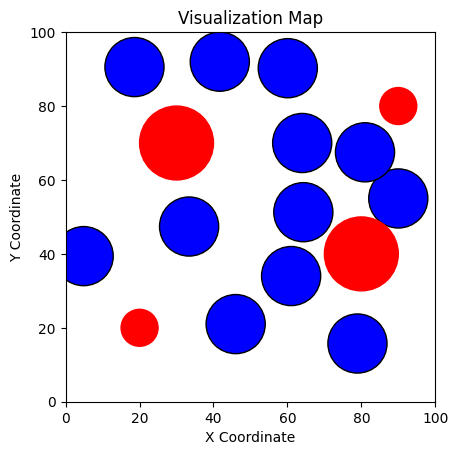

--------------------------------------------------------------------------------------------------------------------------------------
Generation  255 : [[78.85, 22.279999999999998], [36, 24], [8.299999999999999, 67.6], [66.3, 52.599999999999994], [21.828193326236782, 42.507647523783405], [11.24534614661968, 90.71364595216491], [76, 66], [74.65734643946682, 81.6998837454301], [44.8, 40.4], [61, 33], [61.03984529554181, 9.342724183456914], [56.09533211797749, 69.85491658532993], [46, 21], [64, 70], [90, 55], [4.876027744818922, 39.39336878238736], [33.39934085826487, 47.40261192107451], [18.619529226828327, 90.5411712007853], [61, 34], [80.98951782414704, 67.48239746182355], [41.708299494298984, 92.0], [64.30713404981378, 51.28139805594633], [78.95355207458739, 15.746948157291467], [60.10268018639955, 90.2411761190209], [82.1581609194176, 21.508881192869495], [2.641241817697977, 46.28401782838033], [65, 23], [91, 56], [68, 80], [37, 8], [55.4593490710649, 35.317388206712444], [49, 74], 

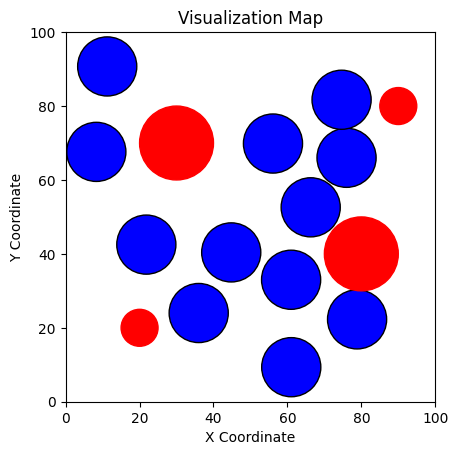

--------------------------------------------------------------------------------------------------------------------------------------
Generation  256 : [[90, 13], [9, 48], [48, 18], [65.16280832344567, 51.018010634716205], [84, 60], [71, 82], [57.121544349745434, 34.92217174469871], [29, 91], [49, 88], [40.99214021494413, 37.0844194167839], [65.48313590871324, 6.0338835660427295], [60.168606396461776, 71.39184279902068], [78.85, 22.279999999999998], [36, 24], [8.299999999999999, 67.6], [66.3, 52.599999999999994], [21.828193326236782, 42.507647523783405], [11.24534614661968, 90.71364595216491], [76, 66], [74.65734643946682, 81.6998837454301], [44.8, 40.4], [61, 33], [61.03984529554181, 9.342724183456914], [56.09533211797749, 69.85491658532993], [48, 16], [8.342302162682511, 57.662465404179116], [67.17034425127886, 19.109195151578387], [53, 66], [32, 16], [12, 41], [55, 32], [57.72627136157407, 81.60854047090211], [14, 90], [34.00276551492517, 41.54126991050832], [59.904974321812176, -0

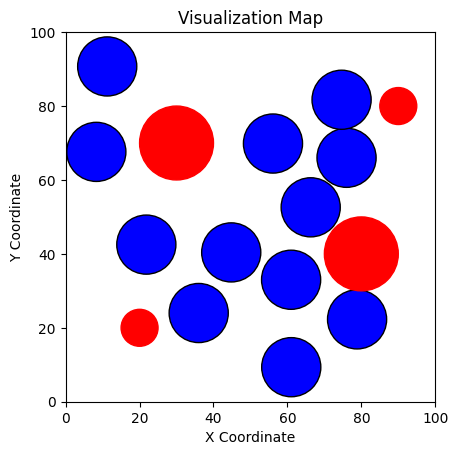

--------------------------------------------------------------------------------------------------------------------------------------
Generation  257 : [[82.195, 19.495999999999995], [27.9, 31.199999999999996], [20.209999999999997, 52.71999999999999], [9, 83], [82, 69], [29.171742302633774, 88.09955216651544], [70.33646330492363, 56.67665152340961], [72, 85], [46.059999999999995, 54.67999999999999], [54.99764206448323, 34.22532582503517], [62.37283247949323, 8.350071998232659], [57.31731440152277, 70.31599444943716], [78.85, 22.279999999999998], [36, 24], [8.299999999999999, 67.6], [66.3, 52.599999999999994], [21.828193326236782, 42.507647523783405], [11.24534614661968, 90.71364595216491], [76, 66], [74.65734643946682, 81.6998837454301], [44.8, 40.4], [61, 33], [61.03984529554181, 9.342724183456914], [56.09533211797749, 69.85491658532993], [92.0, 26.45118405538054], [58, 29], [35, 52], [55.37464554984854, 61.06853767982054], [8, 43], [33, 22], [71, 64], [21.107103682653513, 89.3989342

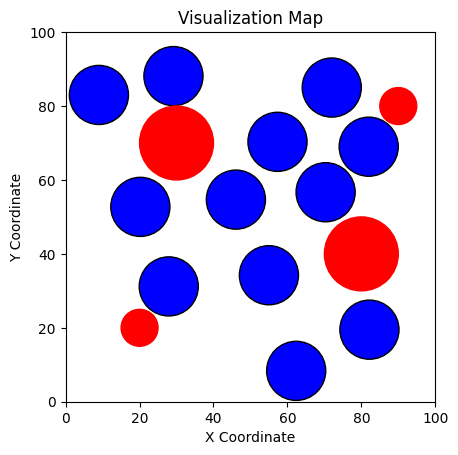

--------------------------------------------------------------------------------------------------------------------------------------
Generation  258 : [[36, 91], [42.599999999999994, 25.499999999999996], [38, 47], [13, 8], [17.679735328365744, 42.65535326664838], [84, 21], [74.5, 65.39999999999999], [69, 83], [42, 9], [54.979486903878666, 34.034390206359795], [66.50323083941137, 10.517737689435926], [56.898053843374456, 71.6379756764848], [82.195, 19.495999999999995], [27.9, 31.199999999999996], [20.209999999999997, 52.71999999999999], [9, 83], [82, 69], [29.171742302633774, 88.09955216651544], [70.33646330492363, 56.67665152340961], [72, 85], [46.059999999999995, 54.67999999999999], [54.99764206448323, 34.22532582503517], [62.37283247949323, 8.350071998232659], [57.31731440152277, 70.31599444943716], [68, 74], [58, 37], [57, 18], [57.00737970498639, 63.775463956277605], [15.609546349096288, 46.85192487241444], [23, 34], [89, 10], [13.810297160256143, 82.6172427399018], [102.39980915

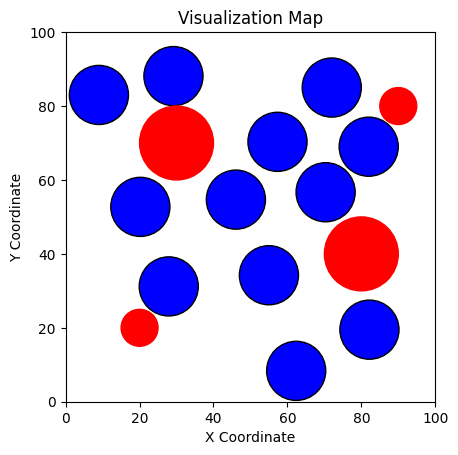

--------------------------------------------------------------------------------------------------------------------------------------
Generation  259 : [[91, 19], [74, 82], [79, 66], [10, 89], [17.058678634584908, 43.9143247483782], [16, 8], [38, 10], [54, 53], [60.11994274525442, 23.515894330906747], [49.40930099041515, 38.79642122543119], [68.09224965110724, 9.290692372896553], [55.78456781947272, 74.81606284565564], [82.195, 19.495999999999995], [27.9, 31.199999999999996], [20.209999999999997, 52.71999999999999], [9, 83], [82, 69], [29.171742302633774, 88.09955216651544], [70.33646330492363, 56.67665152340961], [72, 85], [46.059999999999995, 54.67999999999999], [54.99764206448323, 34.22532582503517], [62.37283247949323, 8.350071998232659], [57.31731440152277, 70.31599444943716], [66.3287379087487, 83.93569589046719], [49.46633773896451, 50.913774119888785], [53.18983958761921, 20.03320513858517], [67.0607548860472, 67.08460116721606], [5.929880682476309, 38.1837275506258], [20.7694

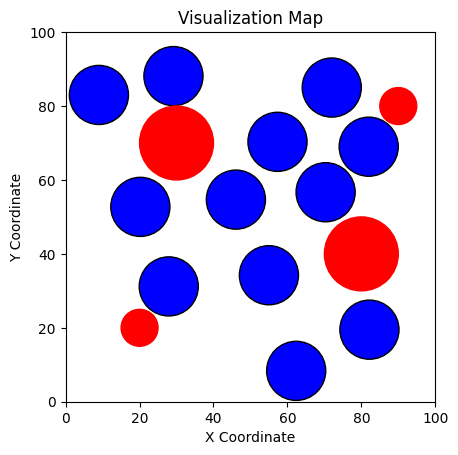

--------------------------------------------------------------------------------------------------------------------------------------
Generation  260 : [[73.73011653612409, 64.45498712332703], [56.82643641727516, 60.23964188392215], [60.93288771133345, 33.82324359700962], [9, 62], [9.268520068108888, 39.902906709951516], [32, 16], [83, 18], [22, 90], [71, 92], [37.92279029712454, 43.13892636762935], [64.90389355268924, 8.827260433321515], [51.19551684036898, 81.9549353197962], [82.195, 19.495999999999995], [27.9, 31.199999999999996], [20.209999999999997, 52.71999999999999], [9, 83], [82, 69], [29.171742302633774, 88.09955216651544], [70.33646330492363, 56.67665152340961], [72, 85], [46.059999999999995, 54.67999999999999], [54.99764206448323, 34.22532582503517], [62.37283247949323, 8.350071998232659], [57.31731440152277, 70.31599444943716], [61, 47], [9, 83], [73.82010728922491, 60.409913462504605], [76, 78], [20.252340008205394, 44.15847386205796], [7.163186673539904, 14.8271475513855

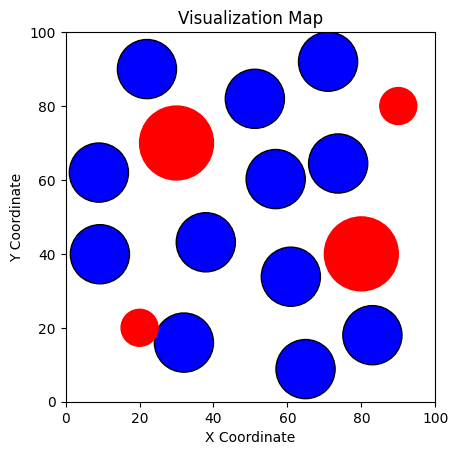

--------------------------------------------------------------------------------------------------------------------------------------
Generation  261 : [[16, 90], [22.229999999999997, 46.739999999999995], [81, 61], [49, 17], [83, 92], [9, 12], [66, 59], [32, 92], [61, 92], [51.46611383819884, 37.764439707952945], [66.8204825376698, 12.148727127627456], [57.22580725112037, 74.31271439368501], [73.73011653612409, 64.45498712332703], [56.82643641727516, 60.23964188392215], [60.93288771133345, 33.82324359700962], [9, 62], [9.268520068108888, 39.902906709951516], [32, 16], [83, 18], [22, 90], [71, 92], [37.92279029712454, 43.13892636762935], [64.90389355268924, 8.827260433321515], [51.19551684036898, 81.9549353197962], [29, 44], [18.25429283213228, 85.20956085270119], [68.91036887362355, 56.47703416075382], [66, 73], [13.173272362432904, 49.74239423514816], [1.854976146337929, 20.451506409622034], [92, 64], [34, 8], [57, 30], [51.405572842252454, 44.47270700972535], [77.11249153516725, 21.

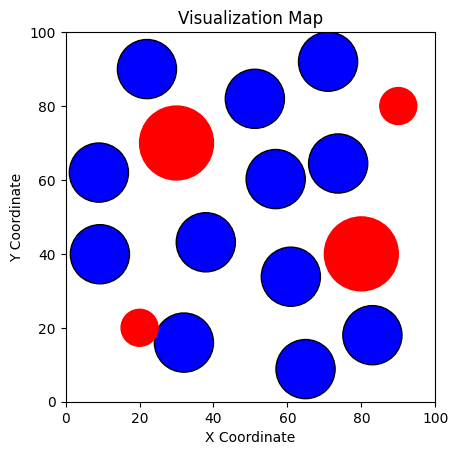

--------------------------------------------------------------------------------------------------------------------------------------
Generation  262 : [[20, 55], [91, 10], [61, 8], [37, 9], [60, 68], [3.99848330243655, 17.916054486735423], [84.19999999999999, 62.5], [33.4, 33.199999999999996], [56, 26], [51.42373514103637, 42.46022681919362], [74.02488883591802, 18.408497927173137], [58.258711294781946, 88.48410750819039], [73.73011653612409, 64.45498712332703], [56.82643641727516, 60.23964188392215], [60.93288771133345, 33.82324359700962], [9, 62], [9.268520068108888, 39.902906709951516], [32, 16], [83, 18], [22, 90], [71, 92], [37.92279029712454, 43.13892636762935], [64.90389355268924, 8.827260433321515], [51.19551684036898, 81.9549353197962], [14.994798277941912, 92.0], [15.840216758713066, 49.96058713526827], [65, 22], [46.137024769886004, 9.637102040073092], [33, 20], [1.5369699181386878, 23.04677365904355], [74.28886782792407, 72.66770982187121], [38.46909945681015, 92.0], [66.

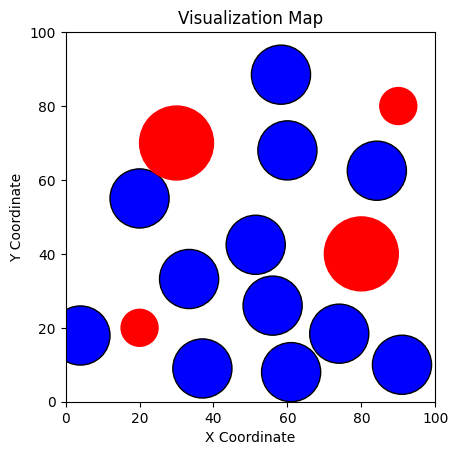

--------------------------------------------------------------------------------------------------------------------------------------
Generation  263 : [[57.69843948338257, 87.1], [18.052065027613917, 48.58817614058047], [62, 20], [34.8411074309658, 9.191130612021928], [10, 12], [79, 67], [63.586660348377215, 72.20031294656135], [38.14072983704304, 47.199999999999996], [9, 31], [29, 31], [11, 71], [61.97820882869352, 40.03024536177352], [32, 27], [25.83503279282542, 43.554098579011956], [26.047200969653787, 92.0], [47, 77], [9.668277429590908, 92.0], [60.567377011851065, 53.32787690669939], [65.93057872067364, 81.38508383840205], [12, 68], [59.08876974429414, 10.765209595107825], [89.49941331962496, 3.6863162604012336], [46, 50], [88, 62], [32, 27], [25.83503279282542, 43.554098579011956], [26.047200969653787, 92.0], [47, 77], [9.668277429590908, 92.0], [60.567377011851065, 53.32787690669939], [65.93057872067364, 81.38508383840205], [12, 68], [59.08876974429414, 10.765209595107825], [

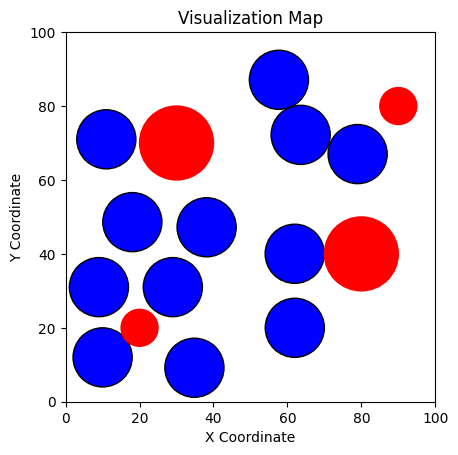

--------------------------------------------------------------------------------------------------------------------------------------
Generation  264 : [[49.9889076383678, 69.07], [44, 83], [51.21416029089613, 41.599999999999994], [91, 9], [9.900483228877272, 36.0], [73.47021310355532, 62.898363072009815], [64.28983586006613, 74.95574421411357], [31, 92], [88, 67], [47.14982399588749, 22.80589487812037], [53, 9], [90, 24], [57.69843948338257, 87.1], [18.052065027613917, 48.58817614058047], [62, 20], [34.8411074309658, 9.191130612021928], [10, 12], [79, 67], [63.586660348377215, 72.20031294656135], [38.14072983704304, 47.199999999999996], [9, 31], [29, 31], [11, 71], [61.97820882869352, 40.03024536177352], [16, 52], [34.04181520026762, 34.39002325518921], [40.68828187617663, 90.58874112387426], [38, 54], [2.0844077290548784, 95.20045396629773], [69, 68], [60.7126972295856, 90.74593988457354], [2.629351238362757, 61.0215149443908], [69.57251990933133, 2.8073583278629197], [103.617741516

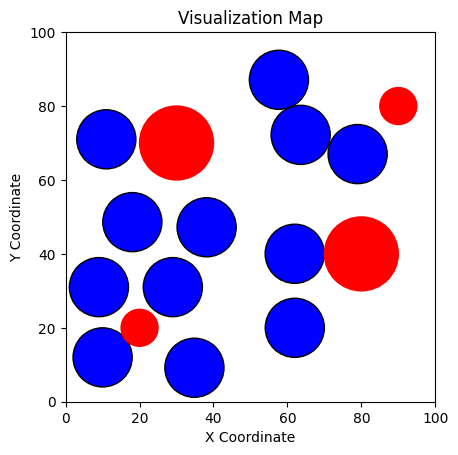

--------------------------------------------------------------------------------------------------------------------------------------
Generation  265 : [[36, 87], [48, 37], [13, 79], [51.68877520167606, 9.133791428415348], [10, 44], [77.3410639310666, 65.76950892160295], [63.79761300188389, 73.02694232682701], [79, 8], [77, 86], [34.44494719876624, 28.54176846343611], [23.599999999999998, 52.4], [28, 9], [57.69843948338257, 87.1], [18.052065027613917, 48.58817614058047], [62, 20], [34.8411074309658, 9.191130612021928], [10, 12], [79, 67], [63.586660348377215, 72.20031294656135], [38.14072983704304, 47.199999999999996], [9, 31], [29, 31], [11, 71], [61.97820882869352, 40.03024536177352], [58, 34], [21, 49], [49.686443040387005, 48.82509427398773], [92.0, 9.549337009972012], [76, 89], [63.69306644590182, 58.109665579655356], [54.38510324769894, 74.21400878804381], [39.469476934826325, 92.0], [92.0, 61.580298510658416], [43.36565411513019, 31.335542941737135], [47.240768487753215, 0.3448

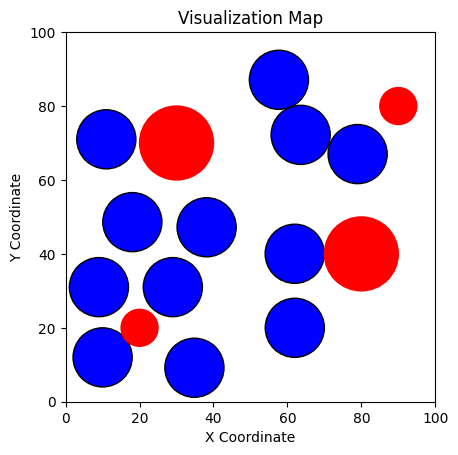

--------------------------------------------------------------------------------------------------------------------------------------
Generation  266 : [[11, 55], [52, 21], [24, 92], [63.78214264117324, 9.258455102882348], [46, 58], [73.24666468551716, 63.47155591901867], [60.9738600756284, 73.38306226519205], [73, 22], [90, 62], [48, 36], [33, 13], [24.4, 33.6], [57.69843948338257, 87.1], [18.052065027613917, 48.58817614058047], [62, 20], [34.8411074309658, 9.191130612021928], [10, 12], [79, 67], [63.586660348377215, 72.20031294656135], [38.14072983704304, 47.199999999999996], [9, 31], [29, 31], [11, 71], [61.97820882869352, 40.03024536177352], [36, 27], [12, 83], [88, 56], [91.76451468597308, 22.434286805342765], [71.1240499026859, 91.97810987987532], [58, 29], [64.55688692492768, 71.22709398176801], [52.4917378252342, 98.855443425633], [8, 32], [58.09928223765398, 43.831799553263494], [48.45480367163337, 12.106416841644474], [24.76400655842231, 102.91330401440906]]
Generation  266 

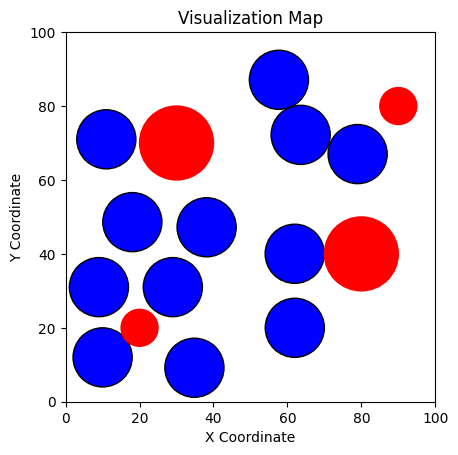

--------------------------------------------------------------------------------------------------------------------------------------
Generation  267 : [[30, 9], [53, 36], [63, 92], [51.91812960746798, 13.164077470018178], [82, 8], [30, 88], [63.877728321342346, 71.90834725712335], [80, 58], [8.7, 31.299999999999997], [37.72978467129619, 34.84953986597905], [22.23644110149001, 53.33192505249334], [50.81394814761215, 58.89516295756418], [57.69843948338257, 87.1], [18.052065027613917, 48.58817614058047], [62, 20], [34.8411074309658, 9.191130612021928], [10, 12], [79, 67], [63.586660348377215, 72.20031294656135], [38.14072983704304, 47.199999999999996], [9, 31], [29, 31], [11, 71], [61.97820882869352, 40.03024536177352], [30, 46], [6.372669087032696, 79.24619848922113], [9, 63], [106.04573398699628, 30.581258190757648], [50, 78], [56, 25], [62.816354426201485, 68.09970999211731], [57.6196370345467, 101.73209057496032], [6.477737868491969, 43.91599677820392], [57.536336910080735, 47.74145

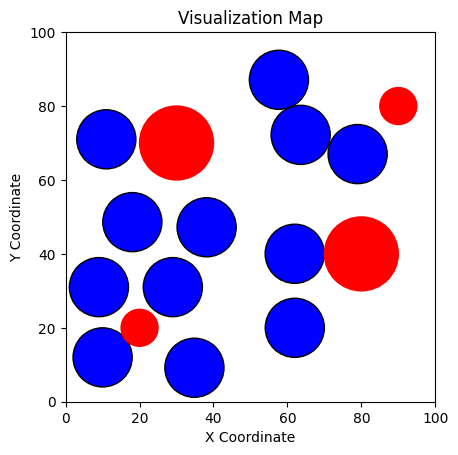

--------------------------------------------------------------------------------------------------------------------------------------
Generation  268 : [[92, 64], [9, 59], [70, 25], [89.80745267313779, 25.356103974535806], [10, 78], [34, 47], [63.13476659474374, 69.24230117161912], [64.3337459241827, 88.61246340247223], [7.144416507944378, 40.13119774474274], [51.59437123844537, 43.873881401081874], [36.05442795107426, 27.845343587764102], [29.823687932680425, 88.36038703104302], [57.69843948338257, 87.1], [18.052065027613917, 48.58817614058047], [62, 20], [34.8411074309658, 9.191130612021928], [10, 12], [79, 67], [63.586660348377215, 72.20031294656135], [38.14072983704304, 47.199999999999996], [9, 31], [29, 31], [11, 71], [61.97820882869352, 40.03024536177352], [71, 13], [58.095354972098136, 41.45980035017296], [62.43542851414153, 84.82380969744852], [43.50519214292692, 6.078453234384403], [92.0, 19.733137978647775], [49, 59], [43, 29], [89.1794945903817, 63.017627277276254], [23.567

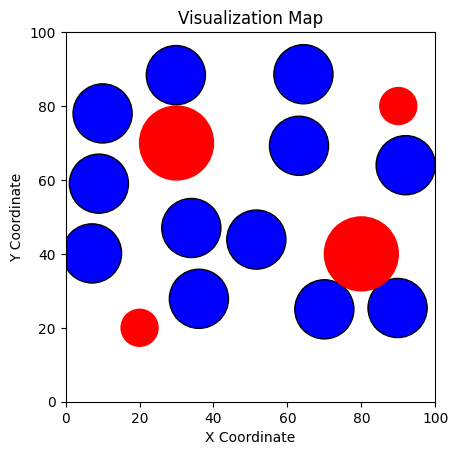

--------------------------------------------------------------------------------------------------------------------------------------
Generation  269 : [[85, 16], [75, 85], [91, 57], [57.39587030199018, 11.861748456429822], [65, 58], [34, 12], [9, 9], [15, 88], [18.640255453255445, 38.08937638921909], [41.45942731143707, 46.81169171774924], [74, 70], [52.92744603518171, 75.51858996086808], [92, 64], [9, 59], [70, 25], [89.80745267313779, 25.356103974535806], [10, 78], [34, 47], [63.13476659474374, 69.24230117161912], [64.3337459241827, 88.61246340247223], [7.144416507944378, 40.13119774474274], [51.59437123844537, 43.873881401081874], [36.05442795107426, 27.845343587764102], [29.823687932680425, 88.36038703104302], [74.76627328109886, 12.522655469788846], [30, 35], [63, 86], [55.561544761069314, 5.034991206085143], [98.5906804106776, 34.56433827851981], [49.404089157465734, 72.63530527938123], [44.66009019023932, 26.81590210721231], [34, 13], [15.465992496077343, 41.675534837308476], 

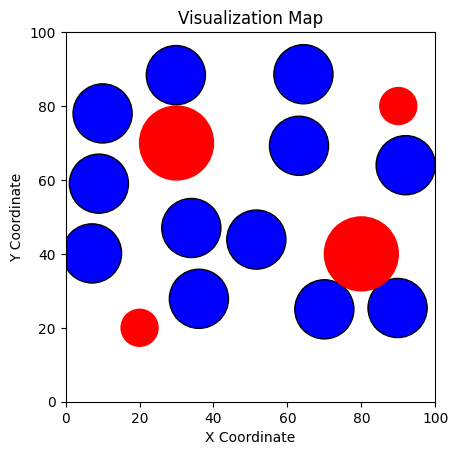

--------------------------------------------------------------------------------------------------------------------------------------
Generation  270 : [[34, 40], [11, 87], [75, 70], [79.53368029951724, 19.259770144000605], [64, 9], [89, 61], [16, 57], [55.233622146927885, 65.92872438173056], [9.640889304384267, 40.59449887251246], [50.90812614908532, 47.663736284840525], [52.23809956575198, 23.69174051143487], [66, 55], [92, 64], [9, 59], [70, 25], [89.80745267313779, 25.356103974535806], [10, 78], [34, 47], [63.13476659474374, 69.24230117161912], [64.3337459241827, 88.61246340247223], [7.144416507944378, 40.13119774474274], [51.59437123844537, 43.873881401081874], [36.05442795107426, 27.845343587764102], [29.823687932680425, 88.36038703104302], [92.0, 21.231514003542667], [44, 51], [11, 32], [55.303261937467084, 3.5948927855759933], [58.81719909502866, 58.96344653670826], [21, 53], [5.796496348115491, 16.121762470463906], [74, 8], [32.614892772493896, 41.534516982872745], [56.392956

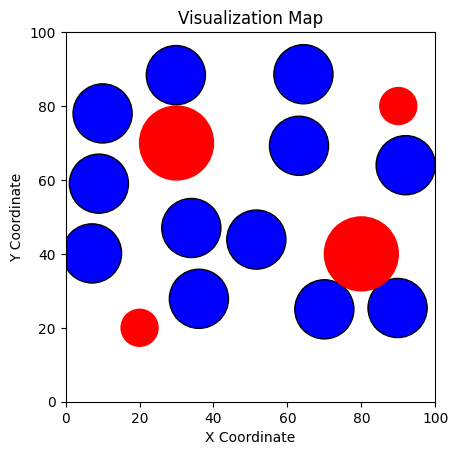

--------------------------------------------------------------------------------------------------------------------------------------
Generation  271 : [[77, 70], [92, 64], [50, 19], [65.65451915816828, 10.123256142263937], [15, 81], [67, 88], [10, 47], [30, 90], [24.97374989312904, 41.11352121143374], [54.95338110365819, 40.69095758644504], [33.21632838532228, 25.153603076329226], [45.682385442721746, 85.06370410289219], [92, 64], [9, 59], [70, 25], [89.80745267313779, 25.356103974535806], [10, 78], [34, 47], [63.13476659474374, 69.24230117161912], [64.3337459241827, 88.61246340247223], [7.144416507944378, 40.13119774474274], [51.59437123844537, 43.873881401081874], [36.05442795107426, 27.845343587764102], [29.823687932680425, 88.36038703104302], [31, 13], [47.19597691241875, 47.415600059204685], [73, 82], [56.54395699956223, 13.019009857781505], [67.11653734731757, 65.32309531429856], [12.833095420472707, 49.343902834649164], [9, 86], [76.55606314107175, 0.50372299439712], [92, 27],

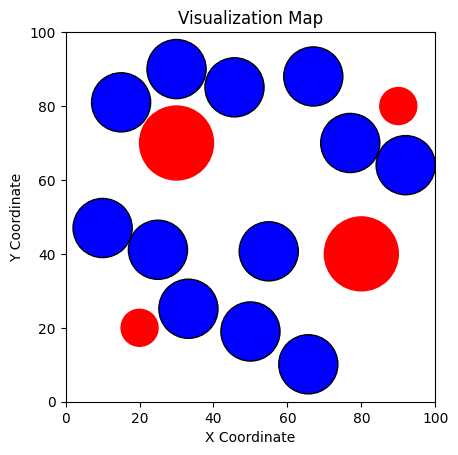

--------------------------------------------------------------------------------------------------------------------------------------
Generation  272 : [[22, 54], [75.75879307372561, 59.72468001776141], [10, 74], [44.96318709986867, 11.60570295733445], [8, 11], [69, 77], [64, 11], [28.566818942321525, 32.351116898319134], [55, 25], [30, 8], [55.9444692696443, 46.78788569436312], [51, 76], [69, 77], [91, 60], [83.74597885782758, 5.599167009874952], [48.3341728697677, 16.413466103754146], [35, 25], [59.51556859632011, 31.64647587042753], [49.55448525069281, 82.74262653181295], [5.028064179037472, 50.40807151723081], [24.87741667102101, 92.0], [15, 37], [76, 63], [47.14609354315108, 48.502190356060744], [69, 77], [91, 60], [83.74597885782758, 5.599167009874952], [48.3341728697677, 16.413466103754146], [35, 25], [59.51556859632011, 31.64647587042753], [49.55448525069281, 82.74262653181295], [5.028064179037472, 50.40807151723081], [24.87741667102101, 92.0], [15, 37], [76, 63], [47.14609354

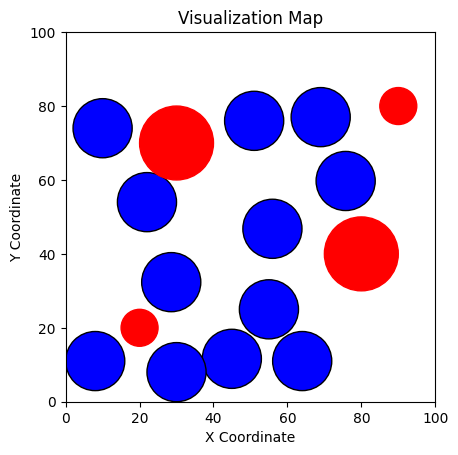

--------------------------------------------------------------------------------------------------------------------------------------
Generation  273 : [[84, 19], [86.42763792211768, 59.91740400532842], [61.6221852004793, 26.119416906912466], [47.322877138797985, 14.971137159828238], [70, 85], [62.36089801742408, 45.252533109299264], [30, 11], [12.089690608022687, 44.9909851315573], [31, 47], [9, 89], [69.98334078089329, 58.13636570830893], [48.302265480205754, 56.75153324924251], [22, 54], [75.75879307372561, 59.72468001776141], [10, 74], [44.96318709986867, 11.60570295733445], [8, 11], [69, 77], [64, 11], [28.566818942321525, 32.351116898319134], [55, 25], [30, 8], [55.9444692696443, 46.78788569436312], [51, 76], [64.06402244243701, 72.72348761021055], [105.32816747649179, 74.6687735072275], [82.07052169801473, -3.985461739085137], [52.00920964485888, 17.59607570462491], [8, 9], [82, 70], [46.58306377736514, 93.59325150997816], [17.968098562108164, 47.19383383073212], [21.5867505862

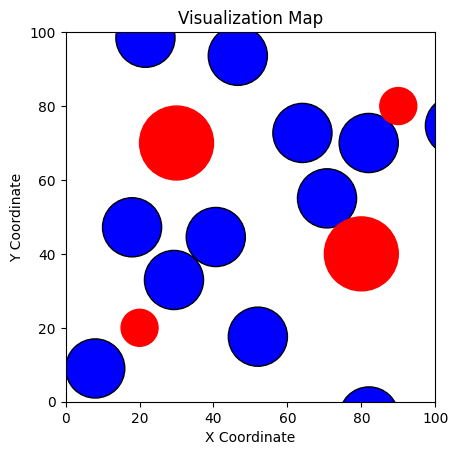

--------------------------------------------------------------------------------------------------------------------------------------
Generation  274 : [[44, 84], [99.65800861017955, 70.24336265665777], [75.93602074875409, 5.046001854714143], [50.60330989304061, 16.808594141185907], [26.6, 31.8], [65, 80], [55, 64], [14, 8], [89, 22], [23.218664153122834, 49.75731090502853], [70.49679439680045, 55.958009086232465], [42.92504152134883, 48.218585867765015], [64.06402244243701, 72.72348761021055], [105.32816747649179, 74.6687735072275], [82.07052169801473, -3.985461739085137], [52.00920964485888, 17.59607570462491], [8, 9], [82, 70], [46.58306377736514, 93.59325150997816], [17.968098562108164, 47.19383383073212], [21.586750586200704, 98.47382892129914], [29.312377361604053, 32.939015578612185], [70.71684594647495, 55.024427676771126], [40.620516967553016, 44.56160841856037], [88.32688036334427, 11.355365959885747], [89.2715404295041, 64.92780744670335], [36, 37], [46.79522692093146, 24.0

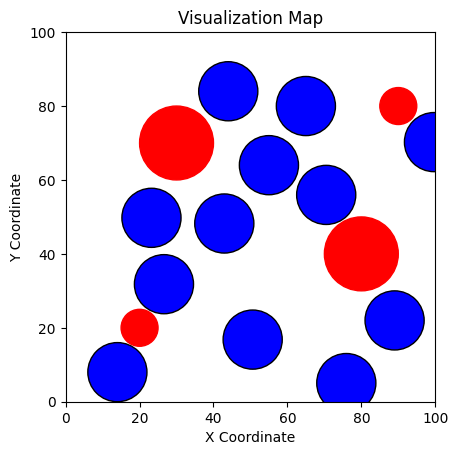

--------------------------------------------------------------------------------------------------------------------------------------
Generation  275 : [[79, 67], [76, 18], [9, 57], [43, 89], [70.90587176728738, 90.5964691037922], [44.4, 38.199999999999996], [16, 8], [19.537958278518364, 39.155449802295095], [44.8, 8.0], [9, 77], [46.3, 59.9], [64.93772989825796, 57.98452822954359], [21.72323951728358, 91.72317939786268], [12, 41], [64, 80], [65, 23], [48.076584670664154, 92.0], [1.845043436759843, 62.3829930248745], [8, 78], [57.05530001375662, 8.870944434261379], [5.665333883948767, 12.869560810348762], [79.84277950677433, 20.853763499074187], [44.821900602278305, 20.918729335585642], [92.0, 59.7799463875282], [21.72323951728358, 91.72317939786268], [12, 41], [64, 80], [65, 23], [48.076584670664154, 92.0], [1.845043436759843, 62.3829930248745], [8, 78], [57.05530001375662, 8.870944434261379], [5.665333883948767, 12.869560810348762], [79.84277950677433, 20.853763499074187], [44.82190

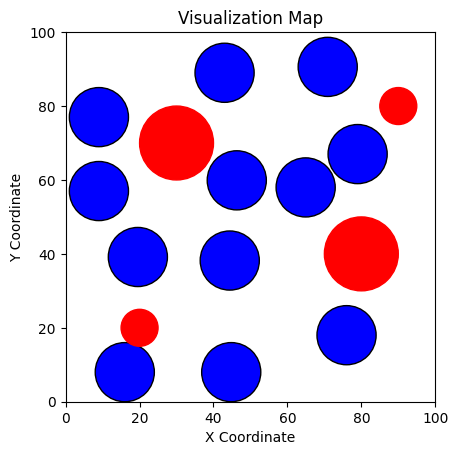

--------------------------------------------------------------------------------------------------------------------------------------
Generation  276 : [[11, 78], [56.8, 24.9], [73, 21], [49.599999999999994, 69.2], [64.0570856383004, 91.01752837265454], [47, 88], [12, 34], [30.79316079908984, 30.07009819188498], [33.05960016518463, 9.460868243104628], [91, 63], [45.85657018068349, 48.205618800675694], [73.05641092878056, 58.523153676938975], [79, 67], [76, 18], [9, 57], [43, 89], [70.90587176728738, 90.5964691037922], [44.4, 38.199999999999996], [16, 8], [19.537958278518364, 39.155449802295095], [44.8, 8.0], [9, 77], [46.3, 59.9], [64.93772989825796, 57.98452822954359], [23, 92], [19.736216035377495, 44.87662307953896], [63.61506165438381, 75.83606553542089], [9, 28], [39.27505382004743, 102.71138150912043], [7.971928736295295, 54.731470417376116], [34, 52], [64.23881836667583, 7.821611791962548], [5.362937705828891, 8.725058393421198], [94.26737837754982, 13.01285891431799], [53.4425

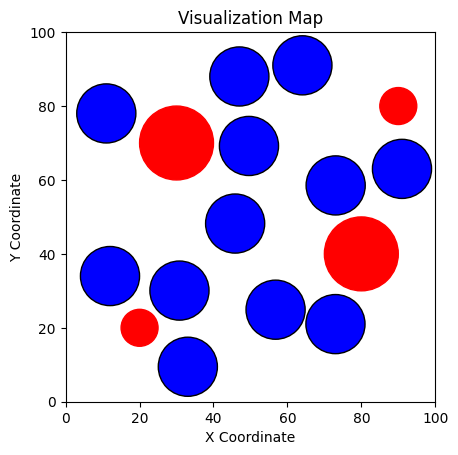

--------------------------------------------------------------------------------------------------------------------------------------
Generation  277 : [[77, 9], [63, 55], [60, 82], [9, 89], [48.76429920421941, 99.07690778752195], [37, 9], [28.599999999999998, 38.8], [50.82856034022859, 17.221763195062312], [50, 68], [10, 65], [51.29979532161727, 41.07141843338697], [93.14933382650077, 54.752893320425386], [11, 78], [56.8, 24.9], [73, 21], [49.599999999999994, 69.2], [64.0570856383004, 91.01752837265454], [47, 88], [12, 34], [30.79316079908984, 30.07009819188498], [33.05960016518463, 9.460868243104628], [91, 63], [45.85657018068349, 48.205618800675694], [73.05641092878056, 58.523153676938975], [14.976707088535939, 90.41281290282664], [44, 13], [68.59232700137447, 76.17351666219466], [20.240441251101565, 37.34573062349452], [45.20930773829136, 97.92509457447159], [2.251820362486524, 69.27490471237996], [30.933881933040766, 49.926633330577914], [58.21357880534234, 5.506069268697602], [8

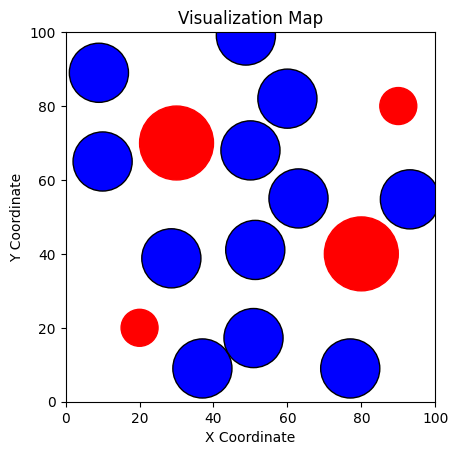

--------------------------------------------------------------------------------------------------------------------------------------
Generation  278 : [[46, 19], [10, 47], [73.77769810041234, 63.45205499865839], [14.472132375330467, 32.90371918704835], [35.962792321487406, 93.07752837234148], [53.87554610874595, 73.28247141371399], [92, 55], [63, 92], [29, 44], [39.93053517678743, 54.28654159336206], [61, 45], [62.4681114426827, 21.15053317629941], [88.6804236893941, 9.105550777307055], [72.40076606706619, 92.0], [72, 9], [21.18403986331924, 35.51475994907078], [22.453631027811586, 90.44775010050788], [69.32539456822433, 66.86300749261997], [43, 36], [68.09676187028553, 25.206290357687607], [53.88472824009625, 55.67426727569834], [9.12883775102955, 71.67852681997024], [58.12439033202304, 36.68162548552006], [52.201065034001715, 17.691911844539117], [88.6804236893941, 9.105550777307055], [72.40076606706619, 92.0], [72, 9], [21.18403986331924, 35.51475994907078], [22.453631027811586, 9

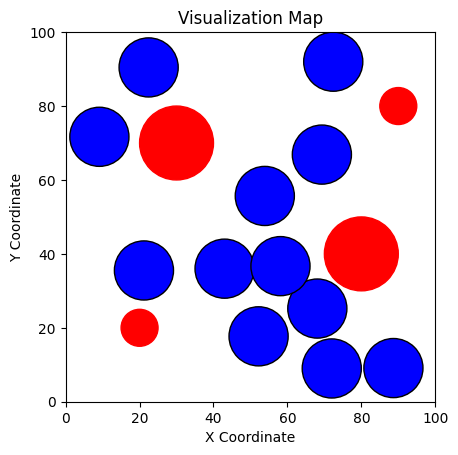

--------------------------------------------------------------------------------------------------------------------------------------
Generation  279 : [[71, 9], [12, 81], [39, 14], [19.170467616922608, 34.73144772046405], [26.50637941591433, 91.23668358205795], [64.69044003038081, 68.78884666894817], [78, 88], [89, 24], [46.41930976806738, 52.17198709298883], [45, 34], [58.98707323241612, 39.17713783986404], [55.28117895660601, 18.729498244067205], [88.6804236893941, 9.105550777307055], [72.40076606706619, 92.0], [72, 9], [21.18403986331924, 35.51475994907078], [22.453631027811586, 90.44775010050788], [69.32539456822433, 66.86300749261997], [43, 36], [68.09676187028553, 25.206290357687607], [53.88472824009625, 55.67426727569834], [9.12883775102955, 71.67852681997024], [58.12439033202304, 36.68162548552006], [52.201065034001715, 17.691911844539117], [46.923514982516636, 31.10359118890593], [52, 62], [68.47320081426432, 64.002265598876], [89, 16], [86, 92], [67.8121747953936, 81.981741

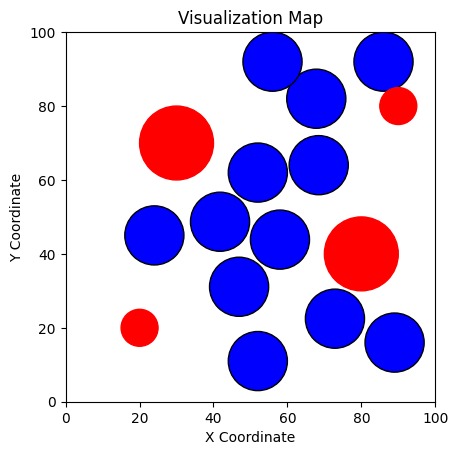

--------------------------------------------------------------------------------------------------------------------------------------
Generation  280 : [[89, 57], [9, 27], [79, 89], [34, 42], [41.51754171946811, 90.9134250703555], [68.8714286363751, 71.39862771158417], [45.699999999999996, 28.5], [60, 58], [44.91930976806738, 52.47198709298883], [8, 47], [58.08153911219041, 38.83518653925355], [58.399252029811066, 19.124998439738757], [46.923514982516636, 31.10359118890593], [52, 62], [68.47320081426432, 64.002265598876], [89, 16], [86, 92], [67.8121747953936, 81.98174155583398], [52, 11], [55.96658845136931, 92.0], [24, 45], [41.771295855044094, 48.69812327028871], [57.98155293258096, 43.86016233129837], [72.86168835336622, 22.46886716187126], [70, 14], [52, 75], [21, 40], [30.571970546174633, 27.885638417676567], [35.27550984553551, 92.0], [12, 55], [85.24272539689471, 92.0], [38, 47], [55.29185448192164, 56.86515047846902], [64, 90], [86, 66], [55.81405353471756, 23.68908440114128]

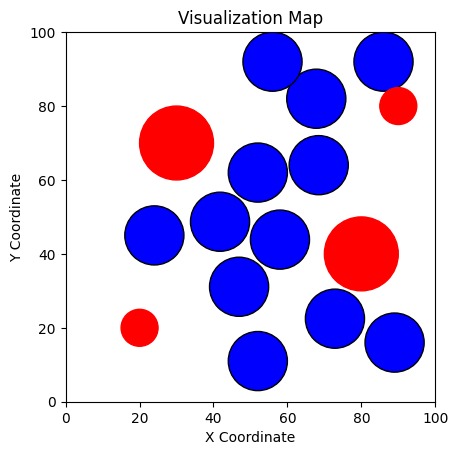

--------------------------------------------------------------------------------------------------------------------------------------
Generation  281 : [[86, 63], [35, 12], [14, 33], [89, 12], [54.86227920362768, 91.23939754924885], [29, 34], [47.589999999999996, 23.25], [58.789976535410794, 68.19999999999999], [38.64351683764716, 50.230390965092184], [18.13138875651323, 47.50943698108661], [58.051543258307575, 40.34267927686699], [62.737982926877606, 20.128159056378507], [46.923514982516636, 31.10359118890593], [52, 62], [68.47320081426432, 64.002265598876], [89, 16], [86, 92], [67.8121747953936, 81.98174155583398], [52, 11], [55.96658845136931, 92.0], [24, 45], [41.771295855044094, 48.69812327028871], [57.98155293258096, 43.86016233129837], [72.86168835336622, 22.46886716187126], [92.0, 57.30054802412946], [11, 85], [78.23681581755723, 92.0], [38, 23], [47.80216498703908, 88.69719473975094], [24, 52], [60, 26], [68, 69], [38, 46], [4.468320324104349, 47.488433923030875], [54.0748476

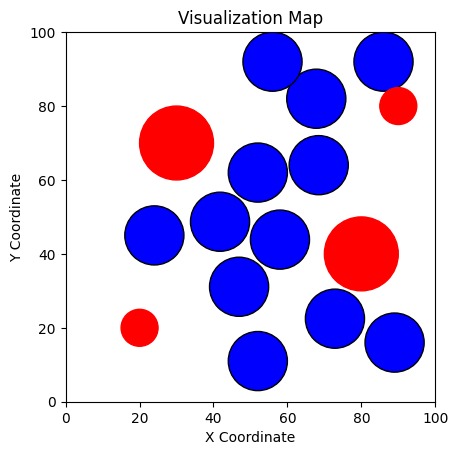

--------------------------------------------------------------------------------------------------------------------------------------
Generation  282 : [[90, 60], [8, 30], [8, 8], [89.0, 13.2], [64.20359544253937, 91.46757828447419], [12, 68], [48.913, 19.575], [57.94296011019835, 75.33999999999999], [41, 55], [25.223360886072488, 47.86604286784724], [58.03054616058959, 41.3979241931964], [65.77509455482418, 20.83037148802633], [46.923514982516636, 31.10359118890593], [52, 62], [68.47320081426432, 64.002265598876], [89, 16], [86, 92], [67.8121747953936, 81.98174155583398], [52, 11], [55.96658845136931, 92.0], [24, 45], [41.771295855044094, 48.69812327028871], [57.98155293258096, 43.86016233129837], [72.86168835336622, 22.46886716187126], [8, 40], [28.786927678540245, 4.066714378194426], [38, 41], [89.06061982192084, 17.94890064401878], [57.75998642875911, 84.84667045288039], [57, 67], [12, 91], [71.64100430109846, 71.40977845303759], [85, 62], [23.65935585311368, 46.063209086551666], 

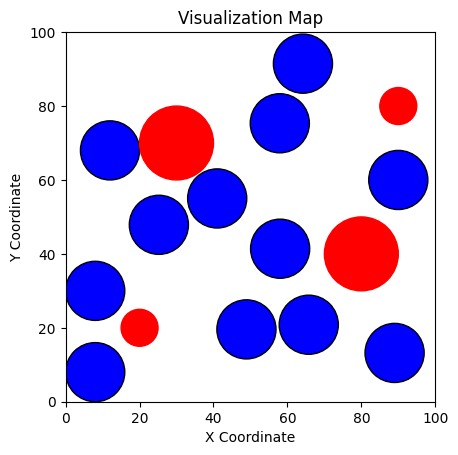

--------------------------------------------------------------------------------------------------------------------------------------
Generation  283 : [[59, 65], [75, 74], [33, 30], [89.0, 14.04], [70.74251680977756, 91.62730479913192], [23, 89], [49.839099999999995, 17.002499999999998], [57.350048612549635, 80.338], [11, 68], [30.187741376763967, 48.115666988579676], [58.01584819218699, 42.136595634626985], [67.90107269438678, 21.321920190179807], [90, 60], [8, 30], [8, 8], [89.0, 13.2], [64.20359544253937, 91.46757828447419], [12, 68], [48.913, 19.575], [57.94296011019835, 75.33999999999999], [41, 55], [25.223360886072488, 47.86604286784724], [58.03054616058959, 41.3979241931964], [65.77509455482418, 20.83037148802633], [7.340940945440801, 48.39608842117818], [25.278020564415193, 5.294805951347646], [42.926576210043905, 50.48506310651978], [91.44947319559967, 25.857080928065248], [56.56196084810472, 86.32582345689033], [40, 34], [70, 13], [73.69731679930285, 75.95126702767308], [89

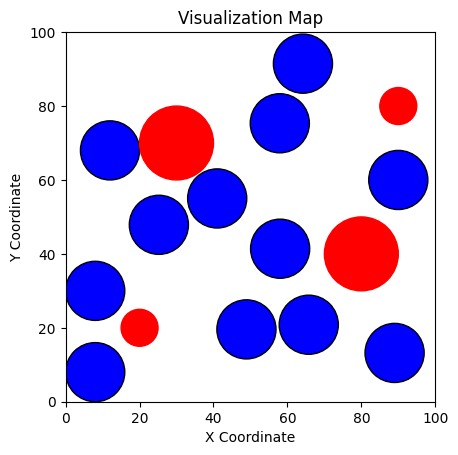

--------------------------------------------------------------------------------------------------------------------------------------
Generation  284 : [[80.69999999999999, 61.5], [38, 34], [64, 61], [89.0, 13.451999999999998], [66.16527185271082, 91.5154962388715], [9, 49], [49.19082999999999, 18.80325], [57.765086660903734, 76.83939999999998], [32, 11], [26.71267503327993, 47.940930104066965], [58.0261367700688, 41.61952562562557], [66.41288799669296, 20.97783609867237], [90, 60], [8, 30], [8, 8], [89.0, 13.2], [64.20359544253937, 91.46757828447419], [12, 68], [48.913, 19.575], [57.94296011019835, 75.33999999999999], [41, 55], [25.223360886072488, 47.86604286784724], [58.03054616058959, 41.3979241931964], [65.77509455482418, 20.83037148802633], [14, 80], [31, 10], [23, 44], [69, 10], [69.4971027389688, 92.0], [27.235791246024846, 87.39824606368704], [57, 60], [66.030880597889, 72.40432601611096], [12, 31], [86, 63], [52.64824921467679, 44.409728445665365], [60.702203162289905, 29.08

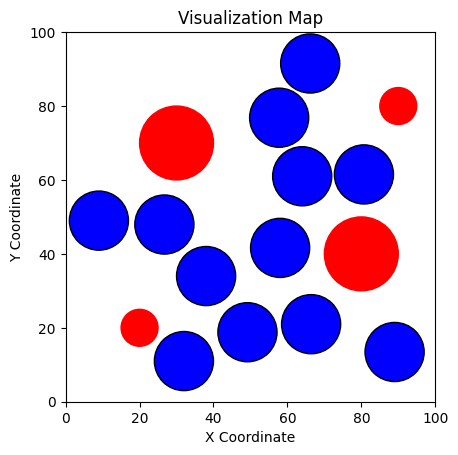

--------------------------------------------------------------------------------------------------------------------------------------
Generation  285 : [[11, 60], [44, 14], [90, 17], [75.0, 10.959999999999999], [67.90905055003998, 91.84027348534225], [41, 87], [8, 89], [63.6045044515818, 73.28502821127766], [20.699999999999996, 38.2], [67.76700826582174, 58.45981286035416], [54.26293829845062, 43.50618716992467], [62.22407058005018, 26.609444315035873], [80.69999999999999, 61.5], [38, 34], [64, 61], [89.0, 13.451999999999998], [66.16527185271082, 91.5154962388715], [9, 49], [49.19082999999999, 18.80325], [57.765086660903734, 76.83939999999998], [32, 11], [26.71267503327993, 47.940930104066965], [58.0261367700688, 41.61952562562557], [66.41288799669296, 20.97783609867237], [49, 19], [29, 10], [21.668318885704892, 52.69002182705431], [69.58695862687529, 6.186312233347854], [51, 59], [35.14376691502386, 100.00652093677292], [71.25598960212766, 63.45847942837363], [62.508419498915295, 86.

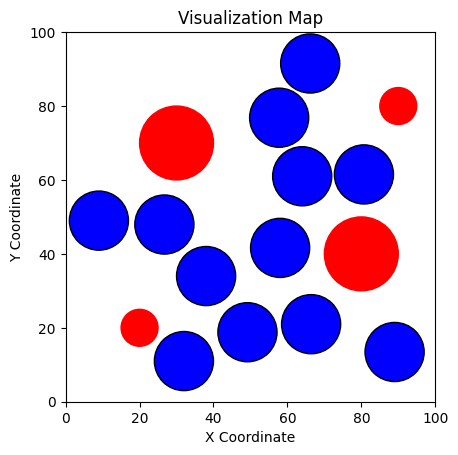

--------------------------------------------------------------------------------------------------------------------------------------
Generation  286 : [[12, 70], [28, 10], [77, 84], [75.4108710388127, 8.366018563343497], [37, 49], [48, 91], [64.63644172148935, 50.061910599861534], [61.08541964751183, 83.58648653724246], [65.6, 64.89999999999999], [17, 56], [40, 20], [60.909602572050844, 33.93314307408847], [80.69999999999999, 61.5], [38, 34], [64, 61], [89.0, 13.451999999999998], [66.16527185271082, 91.5154962388715], [9, 49], [49.19082999999999, 18.80325], [57.765086660903734, 76.83939999999998], [32, 11], [26.71267503327993, 47.940930104066965], [58.0261367700688, 41.61952562562557], [66.41288799669296, 20.97783609867237], [5.748384399203745, 60.16089293924315], [44.75752718760357, 18.86957144116754], [53, 63], [83.30280777744883, 9.001348058721849], [75.90633981629745, 92.0], [32, 92], [8.350999083325565, 92.0], [32, 11], [17.20606815214739, 35.5891196118299], [80.60311558576356, 

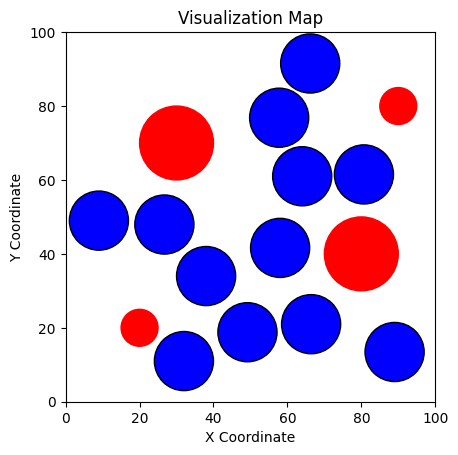

--------------------------------------------------------------------------------------------------------------------------------------
Generation  287 : [[84, 65], [61, 78], [48, 55], [85.01196544421418, 10.336543641105294], [72.98401942722145, 91.85464887166144], [29, 11], [8, 67], [39.729525998271114, 30.751819999999995], [16, 36], [64.43598342001847, 59.35005015350613], [61.50784103102063, 20.185857687687673], [59.785048520798696, 34.89298731521119], [80.69999999999999, 61.5], [38, 34], [64, 61], [89.0, 13.451999999999998], [66.16527185271082, 91.5154962388715], [9, 49], [49.19082999999999, 18.80325], [57.765086660903734, 76.83939999999998], [32, 11], [26.71267503327993, 47.940930104066965], [58.0261367700688, 41.61952562562557], [66.41288799669296, 20.97783609867237], [20, 88], [8, 53], [9, 27], [74.61622253001742, 20.63828467560341], [39.41795650169695, 43.300969293287935], [46.65153513528206, 92.0], [92, 66], [72.62514813701597, 88.48883219584208], [68.35448123615146, 68.61438087

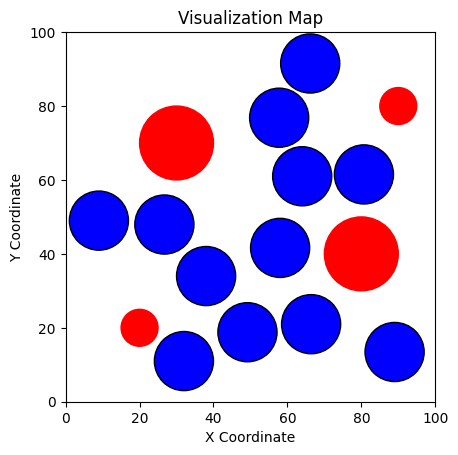

--------------------------------------------------------------------------------------------------------------------------------------
Generation  288 : [[13, 54], [8, 24], [11, 77], [81.89324256995515, 13.427065951454727], [62.9142005495641, 77.28854499814939], [33, 8], [78, 68], [23, 87], [31.706344370845436, 45.78431426392221], [62.80518839401293, 46.64503510745429], [56.152305229266005, 17.4332574459623], [48.44953396455909, 35.52509112064783], [80.69999999999999, 61.5], [38, 34], [64, 61], [89.0, 13.451999999999998], [66.16527185271082, 91.5154962388715], [9, 49], [49.19082999999999, 18.80325], [57.765086660903734, 76.83939999999998], [32, 11], [26.71267503327993, 47.940930104066965], [58.0261367700688, 41.61952562562557], [66.41288799669296, 20.97783609867237], [62, 68], [59, 86], [60, 47], [92.0, 11.788753630213034], [73, 79], [40.77971545002586, 5.8306918325177], [0, 69.25915151245411], [32, 89], [23.88459093326956, 38.95994529782601], [8, 87], [54.59401840975056, 20.6070002903

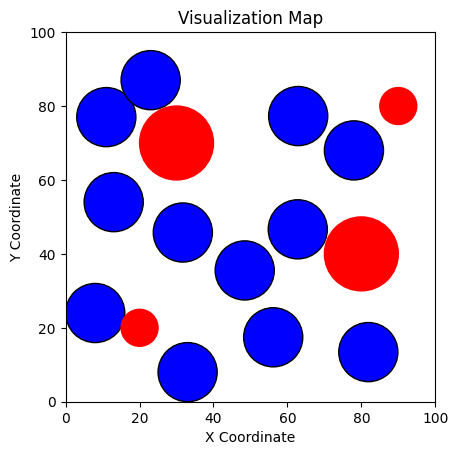

--------------------------------------------------------------------------------------------------------------------------------------
Generation  289 : [[10, 56], [55, 92], [45.3, 56.0], [88.96797277098653, 12.280247326585542], [69.97426016486922, 78.48656349944481], [38.4458008150181, 6.4814842827623895], [48, 75], [57, 35], [26.231116964542323, 41.00725598765487], [71, 22], [55.06150445560519, 19.654877437024194], [37.63486018936772, 28.857527336194348], [13, 54], [8, 24], [11, 77], [81.89324256995515, 13.427065951454727], [62.9142005495641, 77.28854499814939], [33, 8], [78, 68], [23, 87], [31.706344370845436, 45.78431426392221], [62.80518839401293, 46.64503510745429], [56.152305229266005, 17.4332574459623], [48.44953396455909, 35.52509112064783], [54, 43], [67.477729544656, 79.7850361232588], [61.91938270699612, 57.09605574726802], [95.58147943156192, 18.748966555891382], [74, 9], [55.141233514607066, 16.513311680939196], [1.8752897268008173, 59.42775011485104], [38.82774334859368,

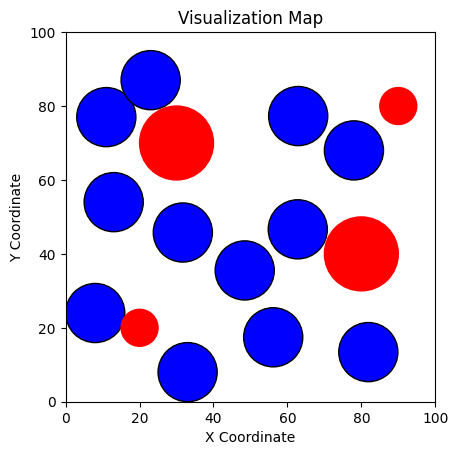

--------------------------------------------------------------------------------------------------------------------------------------
Generation  290 : [[64, 89], [92, 59], [48, 87], [85.99971362843718, 15.023636132785724], [81, 71], [39.64237005438211, 10.55399350428176], [55.16258691804024, 65.4283250344553], [27.7483230045781, 91.72185864583454], [27.562119593242798, 42.33853538149866], [62, 36], [59.04608748148852, 20.256886722233133], [47.10489946417521, 32.87720234391698], [13, 54], [8, 24], [11, 77], [81.89324256995515, 13.427065951454727], [62.9142005495641, 77.28854499814939], [33, 8], [78, 68], [23, 87], [31.706344370845436, 45.78431426392221], [62.80518839401293, 46.64503510745429], [56.152305229266005, 17.4332574459623], [48.44953396455909, 35.52509112064783], [60.34409491346619, 44.207068892109326], [65.62234983882644, 86.5348234302084], [74.04609943494442, 67.56018937174363], [92.58263981693236, 20.259637851034356], [69.3198610462365, 0.7124572165738279], [57, 10], [-5.2

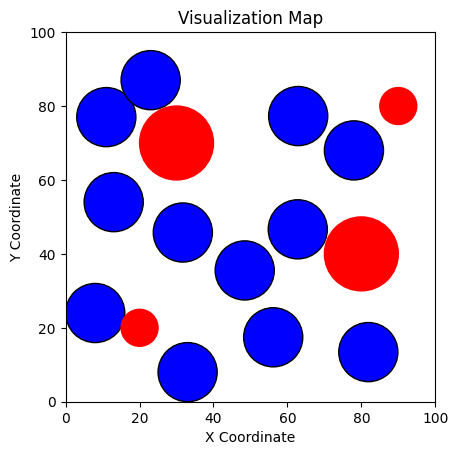

--------------------------------------------------------------------------------------------------------------------------------------
Generation  291 : [[75, 57], [58, 85], [55.132269604461094, 70.39213256022053], [89.37582064283919, 18.209866281160465], [67.39816289723477, 23.685283551046496], [49.8, 9.4], [18, 50], [42.58176136671547, 91.85475536845107], [77, 9], [8, 74], [35.0456915687798, 39.529977233788685], [48.21000394735238, 28.389548929017483], [13, 54], [8, 24], [11, 77], [81.89324256995515, 13.427065951454727], [62.9142005495641, 77.28854499814939], [33, 8], [78, 68], [23, 87], [31.706344370845436, 45.78431426392221], [62.80518839401293, 46.64503510745429], [56.152305229266005, 17.4332574459623], [48.44953396455909, 35.52509112064783], [13, 56], [47, 25], [51.45745096175029, 85.91425417388399], [61, 40], [85, 9], [52.45820787023188, 9.069065698280548], [63.03399884667691, 73.07218482631536], [20.72481964281829, 86.55804266997849], [24, 46], [16, 33], [72.12213363221171, 18.

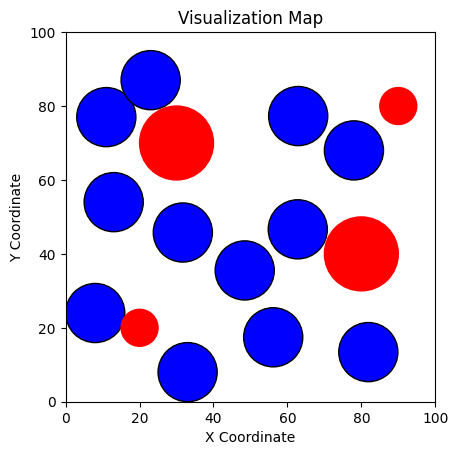

--------------------------------------------------------------------------------------------------------------------------------------
Generation  292 : [[13.0, 54.599999999999994], [61, 83], [47, 89], [75.6252697989686, 21.39894616601831], [92, 20], [38.83746236106956, 8.320719709484164], [73.51019965400306, 69.5216554478946], [22.317445892845484, 86.86741280099355], [29.394441059591802, 45.849019984745546], [50, 52], [60.94325375014971, 17.847224808103753], [46.93600483219296, 36.867662647441804], [13, 54], [8, 24], [11, 77], [81.89324256995515, 13.427065951454727], [62.9142005495641, 77.28854499814939], [33, 8], [78, 68], [23, 87], [31.706344370845436, 45.78431426392221], [62.80518839401293, 46.64503510745429], [56.152305229266005, 17.4332574459623], [48.44953396455909, 35.52509112064783], [5.035943348845329, 61.73059696624628], [30, 9], [67, 89], [57.319368280869426, 40.92755759506665], [99.03282660904725, 12.1435149105451], [59, 59], [54.406875757428196, 76.0484615541173], [20.114

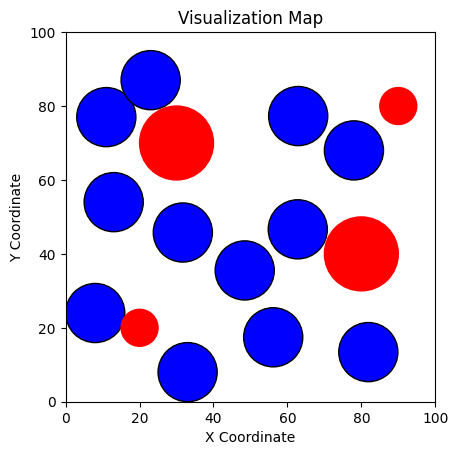

--------------------------------------------------------------------------------------------------------------------------------------
Generation  293 : [[13.0, 54.17999999999999], [61, 91], [90, 58], [80.01285073865918, 15.818630015823802], [44, 90], [34.75123870832087, 8.096215912845249], [76.65305989620092, 68.45649663436838], [22.79523376785364, 86.96022384029806], [31.012773377469344, 45.80372598016921], [58.96363187580905, 48.251524575218006], [57.58958978553111, 17.557447654604736], [47.995475224849244, 35.92786257868602], [13, 54], [8, 24], [11, 77], [81.89324256995515, 13.427065951454727], [62.9142005495641, 77.28854499814939], [33, 8], [78, 68], [23, 87], [31.706344370845436, 45.78431426392221], [62.80518839401293, 46.64503510745429], [56.152305229266005, 17.4332574459623], [48.44953396455909, 35.52509112064783], [49, 90], [9, 77], [60.17314492537086, 79.74367442185209], [49, 11], [86.6580363391737, 23.251724918975277], [18, 52], [69.58594613488111, 62.93600556571235], [20.93

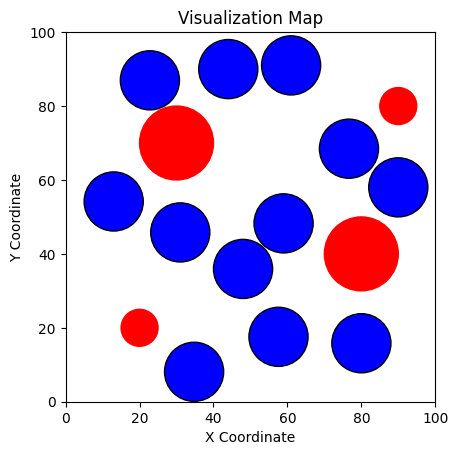

--------------------------------------------------------------------------------------------------------------------------------------
Generation  294 : [[13.0, 54.12599999999999], [44, 59], [65, 82], [80.57696828804796, 15.10116079651308], [49.674260164869224, 86.18656349944482], [34.225867095824604, 8.067351138991674], [77.05714192734064, 68.31954764405786], [22.856663637497547, 86.97215668820863], [31.22084467548217, 45.79790246529511], [60.11609883127021, 47.76957773488889], [57.15840441865157, 17.520190592012007], [48.1316928467622, 35.807031141274564], [13.0, 54.17999999999999], [61, 91], [90, 58], [80.01285073865918, 15.818630015823802], [44, 90], [34.75123870832087, 8.096215912845249], [76.65305989620092, 68.45649663436838], [22.79523376785364, 86.96022384029806], [31.012773377469344, 45.80372598016921], [58.96363187580905, 48.251524575218006], [57.58958978553111, 17.557447654604736], [47.995475224849244, 35.92786257868602], [67, 90], [10.660836882530019, 81.27175983269801], [5

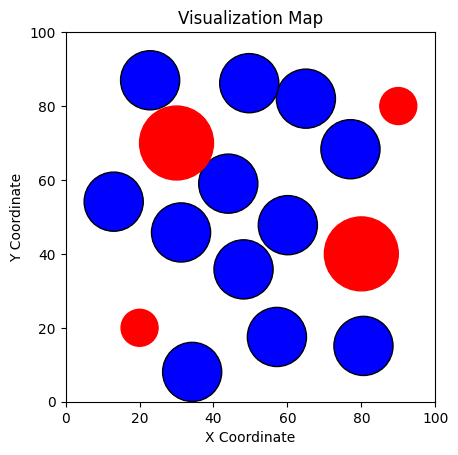

--------------------------------------------------------------------------------------------------------------------------------------
Generation  295 : [[13.0, 54.14219999999999], [49.099999999999994, 68.6], [13, 37], [80.40773302323132, 15.316401562306295], [47.97198211540845, 87.33059444961137], [34.38347857957348, 8.076010571147746], [76.93591731799872, 68.36063234115102], [22.838234676604372, 86.96857683383544], [31.158423286078317, 45.79964951975734], [59.77035874463186, 47.91416178698762], [57.287760028715425, 17.531367710789823], [48.09082756018831, 35.843280572497996], [13.0, 54.12599999999999], [44, 59], [65, 82], [80.57696828804796, 15.10116079651308], [49.674260164869224, 86.18656349944482], [34.225867095824604, 8.067351138991674], [77.05714192734064, 68.31954764405786], [22.856663637497547, 86.97215668820863], [31.22084467548217, 45.79790246529511], [60.11609883127021, 47.76957773488889], [57.15840441865157, 17.520190592012007], [48.1316928467622, 35.807031141274564], [62.

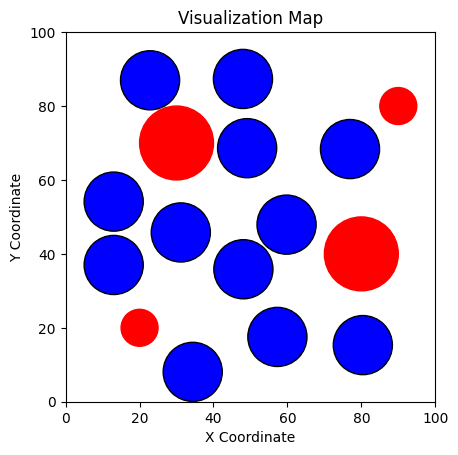

--------------------------------------------------------------------------------------------------------------------------------------
Generation  296 : [[11, 9], [11, 54], [47.66447250054367, 61.65904861293811], [52.72852187189936, 12.920285113919153], [13, 84], [34.11504357387204, 20.622803171344323], [58, 75], [23.673789772765183, 97.48885837913369], [23.347526985823492, 37.5398948559272], [66, 89], [71.41133289608227, 15.937142098430769], [51.50042475020062, 31.715128108308548], [13.0, 54.14219999999999], [49.099999999999994, 68.6], [13, 37], [80.40773302323132, 15.316401562306295], [47.97198211540845, 87.33059444961137], [34.38347857957348, 8.076010571147746], [76.93591731799872, 68.36063234115102], [22.838234676604372, 86.96857683383544], [31.158423286078317, 45.79964951975734], [59.77035874463186, 47.91416178698762], [57.287760028715425, 17.531367710789823], [48.09082756018831, 35.843280572497996], [55.831134280072675, 99.7659909652819], [25.345078181127587, 98.09089711045826], 

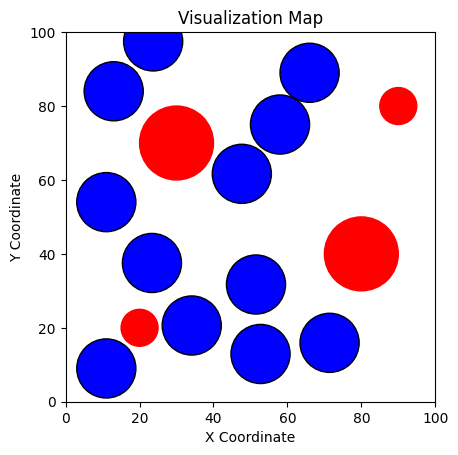

--------------------------------------------------------------------------------------------------------------------------------------
Generation  297 : [[38, 28], [92, 60], [65.21426785276786, 66.0270161741008], [48, 59], [23, 39], [52.93451307216161, 18.786840951403295], [75.51681976601782, 92.90831943667551], [20.969825697978408, 107.77924672733575], [14, 91], [92, 24], [75.63133100213386, 18.61202486290381], [46.250127425060185, 42.41453843249256], [11, 9], [11, 54], [47.66447250054367, 61.65904861293811], [52.72852187189936, 12.920285113919153], [9, 78], [34.11504357387204, 20.622803171344323], [58, 75], [23.673789772765183, 92.0], [23.347526985823492, 37.5398948559272], [66, 89], [71.41133289608227, 15.937142098430769], [51.50042475020062, 31.715128108308548], [68.13824566678034, 108.77317266488582], [23.171044641129907, 89.43266712346029], [70.26396587245048, 67.77644992125843], [55, 87], [111.45447117997634, 13.52665323391674], [51.21125615908268, 8.987478516369686], [93.252323

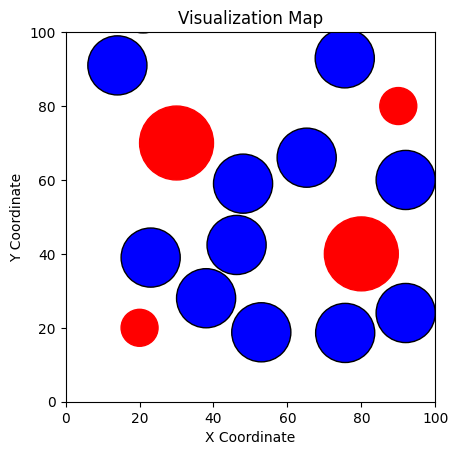

--------------------------------------------------------------------------------------------------------------------------------------
Generation  298 : [[61.796771966746235, 101.94122086542006], [66, 12], [57.58477611071533, 50.4435149448809], [87, 58], [41, 88], [43.34787931135787, 18.591234961458778], [74, 91], [30.717102832651765, 102.17982818461522], [11, 80], [14.436451609826758, 57.64518416872403], [73.0, 72.39999999999999], [37.985967985654376, 38.50398877056227], [56.72832221502399, 90.625069095897], [76, 76], [30.285331976982654, 6.703931123873627], [61, 17], [50.356687511489696, 71.13473573144778], [15.496630168306117, 54.73788351708698], [76.29451494180252, 18.280136749731273], [69.43761121084194, 60.915151667972026], [42.48308275281756, 20.173540349008896], [14.872598558800549, 92.0], [91, 26], [0.7839406155762383, 30.145388033212164], [56.72832221502399, 90.625069095897], [76, 76], [30.285331976982654, 6.703931123873627], [61, 17], [50.356687511489696, 71.13473573144778],

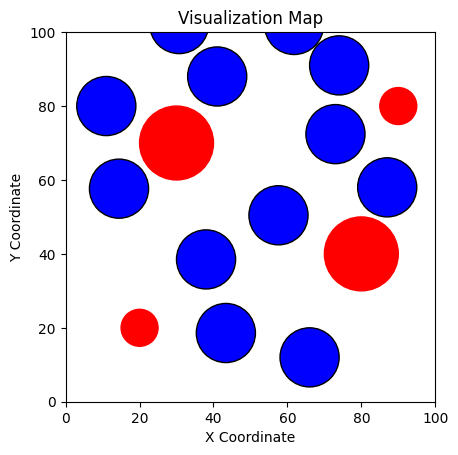

--------------------------------------------------------------------------------------------------------------------------------------
Generation  299 : [[60.27623704122956, 98.54637533456314], [10, 33], [49.39494287059553, 37.32163979857872], [67, 14], [8, 49], [9, 91], [57, 63], [42.333255346108814, 89.80042522962226], [71, 88], [51, 22], [78.39999999999999, 58.47999999999999], [26.825359774630936, 35.99640854935724], [51, 74], [66, 12], [57.58477611071533, 50.4435149448809], [87, 58], [8, 9], [43.34787931135787, 18.591234961458778], [74, 91], [30.717102832651765, 92.0], [11, 80], [14.436451609826758, 57.64518416872403], [73.0, 72.39999999999999], [37.985967985654376, 38.50398877056227], [71.10146215158973, 97.83278578891358], [45, 47], [92, 64], [60, 83], [11, 70], [22.601206663079047, 48.736049189224296], [78.2909278545937, 10.267922245633892], [71.04911147542573, 67.32657797121873], [49.89944755430487, 17.876181926994686], [14.243242006458589, 98.93415665214692], [40, 31], [-3.649

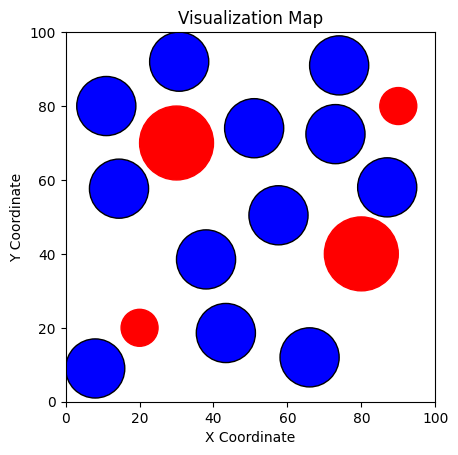

--------------------------------------------------------------------------------------------------------------------------------------
Generation  300 : [[67.85389461848168, 98.04686265260844], [34.5, 42.8], [51, 24], [12, 86], [38, 92], [80, 72], [42, 9], [62.43435463663066, 74.06873214873978], [56, 89], [59, 11], [51.519999999999996, 39.244], [5.4926602878043544, 30.020135623576095], [51, 74], [66, 12], [57.58477611071533, 50.4435149448809], [87, 58], [8, 9], [43.34787931135787, 18.591234961458778], [74, 91], [30.717102832651765, 92.0], [11, 80], [14.436451609826758, 57.64518416872403], [73.0, 72.39999999999999], [37.985967985654376, 38.50398877056227], [20, 88], [8, 25], [40, 8], [15, 45], [2.1500017092163084, 53.15867365239352], [0.4775653006742271, 92.0], [57.92380675496304, 65.00150491563822], [44.626920327503996, 92.0], [70.34157099825973, 78.47336231824038], [64.95204400468292, 24.20223539918532], [54, 50], [36.06053880144617, 44.01885799258177]]
Generation  300  Objective Func

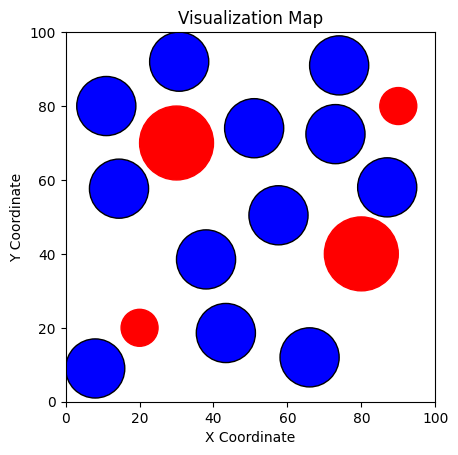

--------------------------------------------------------------------------------------------------------------------------------------


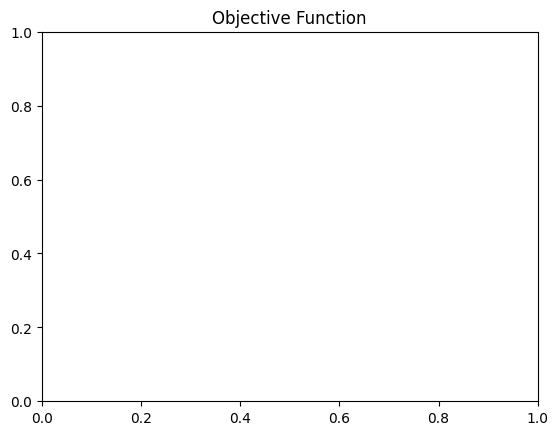

In [7]:
#Step(1): Generate First Generation :
Members_List = Generate_First_Gen()
values = []
#fig , axes = plt.subplots()
while (Generation_Counter < No_of_Generations):
  print("Generation ",Generation_Counter+1 ,":",Members_List)
#Step(2): Calculate Fitness Function of All Members Of the Generation:
  Objective_Function_Values = Calculate_Generation_Fitness()
  print('Generation ',Generation_Counter+1,' Objective Function :' ,Objective_Function_Values)  
  print("--------------------------------------------------------------------------------------------------------------------------------------")
  Elite = Get_Elite_member()  
  #print("Spacing_Flag :" , Spacing_flag)
  #print("Elite :" , Elite)
  values.append(max(Objective_Function_Values))
  Visualize_Solution(Elite)
  visualize_objFunc(values)
  print("--------------------------------------------------------------------------------------------------------------------------------------")
#Step(3): Get the Best Memeber and The Worst Member:
  Elite_Member  = Get_Elite_member()
  Mutant_Member = Get_Mutant_member()
  if (Elite_Member == Mutant_Member ):
    #print("Final Result had been reached ")
    #break
    for member in Mutant_Member:
      member_order = get_order(member[0] ,member[1] )  
      member[0] = random.randint(T_radius[0],X_max - T_radius[0])
      member[1] = random.randint(T_radius[0],Y_max - T_radius[0]) 
      Mutant_Member[member_order][0] =  member[0]
      Mutant_Member[member_order][1] =  member[1]
      while (feasibility_check(member[0],member[1],T_radius[0]) == False):
          member_order = get_order(member[0],member[1])         
          member[0] = random.randint(T_radius[0],X_max- T_radius[0])
          member[1] = random.randint(T_radius[0],Y_max- T_radius[0]) 
          Members_List[member_order][0] =  member[0]
          Members_List[member_order][1] =  member[1]

#Step(4): CrossOver:
  Crossover_Offsprings_List = Automatic_Cross_Over()

#Step(5): Mutation
  Mutant_Member = Mutation(Mutant_Member)
  
#Step(6): Create Next Generation :
  Members_List =  Generate_Next_Gen(Crossover_Offsprings_List,Elite_Member,Mutant_Member)
 #Update Counter :
  Generation_Counter += 1